Final CNN2 model for Amgen Inc.

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.layers import Flatten, Input, BatchNormalization, Conv2D, MaxPooling2D
from keras.layers.core import Activation, Dropout, Dense

Importing the dataset

In [2]:
df = pd.read_csv("AMGN_NN_60sec_ret.csv", low_memory=False, delimiter=",")

In [3]:
df["datetime"] = df["TDay"] + " " + df["IntraT"]
df.set_index(pd.DatetimeIndex(df['datetime']), inplace=True)

df = df.drop(columns = {'Spread_Q', 'ret.Spread_Q', 'lag.Spread_Q'})

df["MidQsq"] = df.apply(lambda row: row.MidQ ** 2, axis=1)
df.rename(columns={"ret.MidQ": "retMidQ"}, inplace=True)
df["retMidQsq"] = df.apply(lambda row: row.retMidQ ** 2, axis=1)
df["Spread_Q"] = df.apply(lambda row: row.MidQ ** 3, axis=1)
df['ret.Spread_Q'] = df.apply(lambda row: row.retMidQ ** 3, axis=1)
df['lag.Spread_Q'] = df.apply(lambda row: row.MidQ ** 4, axis=1)
df['retmsqqqq'] = df.apply(lambda row: row.retMidQ ** 4, axis=1)

df = df.drop(columns = {'TDay', 'IntraT', 'datetime'})

df.head()

,MidQ,lag.MidQ,retMidQ,MidQsq,retMidQsq,Spread_Q,ret.Spread_Q,lag.Spread_Q,retmsqqqq
datetime,,,,,,,,,
2017-01-03 09:33:00,147.250,147.25,0.000000,21682.562500,0.000000e+00,3.192757e+06,0.000000e+00,4.701335e+08,0.000000e+00
2017-01-03 09:34:00,147.450,147.25,0.001357,21741.502500,1.842298e-06,3.205785e+06,2.500574e-09,4.726929e+08,3.394061e-12
2017-01-03 09:35:00,147.320,147.45,-0.000882,21703.182400,7.780011e-07,3.197313e+06,-6.862309e-10,4.710281e+08,6.052857e-13
2017-01-03 09:36:00,147.760,147.32,0.002982,21833.017600,8.893781e-06,3.226047e+06,2.652343e-08,4.766807e+08,7.909934e-11
2017-01-03 09:37:00,147.805,147.76,0.000305,21846.318025,9.272119e-08,3.228995e+06,2.823375e-11,4.772616e+08,8.597220e-15


Creating the input X

In [4]:
sc = MinMaxScaler(feature_range=(0,255))
df['MidQsc'] = sc.fit_transform(df['MidQ'].values.reshape(-1,1))
df['lag.MidQsc'] = sc.fit_transform(df['lag.MidQ'].values.reshape(-1,1))
df['lag.Spread_Qsc'] = sc.fit_transform(df['lag.Spread_Q'].values.reshape(-1,1))
df['ret.Spread_Qsc'] = sc.fit_transform(df['ret.Spread_Q'].values.reshape(-1,1))
df['ret.MidQsc'] = sc.fit_transform(df['retMidQ'].values.reshape(-1,1))
df['Spread_Qsc'] = sc.fit_transform(df['Spread_Q'].values.reshape(-1,1))
df['MidQsqsc'] = sc.fit_transform(df['MidQsq'].values.reshape(-1,1))
df['ret.MidQsqsc'] = sc.fit_transform(df['retMidQsq'].values.reshape(-1,1))
df['retmsqqqqsc'] = sc.fit_transform(df['retmsqqqq'].values.reshape(-1,1))

Xrm = df.groupby(df.index.date)['ret.MidQsc'].apply(np.array).reset_index()
Xrm = Xrm.rename(columns={"index": "datetime"})

Xs = df.groupby(df.index.date)['Spread_Qsc'].apply(np.array).reset_index()
Xs = Xs.rename(columns={"index": "datetime"})

Xlm = df.groupby(df.index.date)['lag.MidQsc'].apply(np.array).reset_index()
Xlm = Xlm.rename(columns={"index": "datetime"})

Xrs = df.groupby(df.index.date)['ret.Spread_Qsc'].apply(np.array).reset_index()
Xrs = Xrs.rename(columns={"index": "datetime"})

Xls = df.groupby(df.index.date)['lag.Spread_Qsc'].apply(np.array).reset_index()
Xls = Xls.rename(columns={"index": "datetime"})

Xm = df.groupby(df.index.date)['MidQsc'].apply(np.array).reset_index()
Xm = Xm.rename(columns={"index": "datetime"})

Xmsq = df.groupby(df.index.date)['MidQsqsc'].apply(np.array).reset_index()
Xmsq = Xmsq.rename(columns={"index": "datetime"})

Xrmsq = df.groupby(df.index.date)['ret.MidQsqsc'].apply(np.array).reset_index()
Xrmsq = Xrmsq.rename(columns={"index": "datetime"})

Xrmsqqq = df.groupby(df.index.date)['retmsqqqqsc'].apply(np.array).reset_index()
Xrmsqqq = Xrmsqqq.rename(columns={"index": "datetime"})

df.head()

,MidQ,lag.MidQ,retMidQ,MidQsq,retMidQsq,Spread_Q,ret.Spread_Q,lag.Spread_Q,retmsqqqq,MidQsc,lag.MidQsc,lag.Spread_Qsc,ret.Spread_Qsc,ret.MidQsc,Spread_Qsc,MidQsqsc,ret.MidQsqsc,retmsqqqqsc
datetime,,,,,,,,,,,,,,,,,,
2017-01-03 09:33:00,147.250,147.25,0.000000,21682.562500,0.000000e+00,3.192757e+06,0.000000e+00,4.701335e+08,0.000000e+00,14.153168,14.153168,9.510082,133.884854,129.629868,10.914857,12.461971,0.000000,0.000000e+00
2017-01-03 09:34:00,147.450,147.25,0.001357,21741.502500,1.842298e-06,3.205785e+06,2.500574e-09,4.726929e+08,3.394061e-12,15.368032,14.153168,10.347735,133.885630,131.958264,11.868031,13.540931,0.082270,2.654280e-05
2017-01-03 09:35:00,147.320,147.45,-0.000882,21703.182400,7.780011e-07,3.197313e+06,-6.862309e-10,4.710281e+08,6.052857e-13,14.578371,15.368032,9.802872,133.884641,128.116771,11.248174,12.839440,0.034743,4.733555e-06
2017-01-03 09:36:00,147.760,147.32,0.002982,21833.017600,8.893781e-06,3.226047e+06,2.652343e-08,4.766807e+08,7.909934e-11,17.251072,14.578371,11.652852,133.893084,134.745744,13.350569,15.216213,0.397164,6.185857e-04
2017-01-03 09:37:00,147.805,147.76,0.000305,21846.318025,9.272119e-08,3.228995e+06,2.823375e-11,4.772616e+08,8.597220e-15,17.524416,17.251072,11.842988,133.884863,130.152224,13.566293,15.459691,0.004141,6.723339e-08


Creating the labels y

In [5]:
df_avgm = df.groupby(df.index.date)['retMidQ'].mean().reset_index()
df_avgm.columns = ['datetime', 'retMidQm']
df_avgm['retMidQmsc'] = MinMaxScaler(feature_range=(0,1)).fit_transform(df_avgm['retMidQm'].values.reshape(-1,1))

df_avgc = pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(Xm, Xs, on="datetime"),
                                                                                  Xrs, on="datetime"),
                                                                        Xls, on="datetime"),
                                                               Xlm, on="datetime"),
                                                      Xrm, on="datetime"),
                                             Xmsq, on="datetime"),
                                    Xrmsq, on="datetime"),
                            Xrmsqqq, on="datetime"),
                   df_avgm, on="datetime")

df_avgc = df_avgc.drop(columns = {'datetime', 'retMidQm'})

df_avgc.head()

,MidQsc,Spread_Qsc,ret.Spread_Qsc,lag.Spread_Qsc,lag.MidQsc,ret.MidQsc,MidQsqsc,ret.MidQsqsc,retmsqqqqsc,retMidQmsc
0,"[14.153168175321412, 15.368032396378908, 14.57...","[10.914857415173714, 11.868031074068256, 11.24...","[133.88485417399997, 133.88563003931648, 133.8...","[9.510081672674886, 10.347735250919811, 9.8028...","[14.153168175321412, 14.153168175321412, 15.36...","[129.62986831631196, 131.95826359098706, 128.1...","[12.461970784713515, 13.540930720659674, 12.83...","[0.0, 0.08227036786198944, 0.0347427174418756,...","[0.0, 2.6542797757439465e-05, 4.73355456959218...",0.699704
1,"[42.79359218675529, 42.64173415912319, 42.8847...","[34.08165815192544, 33.95495208844804, 34.1577...","[133.88486223420927, 133.88485279220677, 133.8...","[30.184507306467793, 30.06967941437199, 30.253...","[42.52024773701771, 42.79359218675529, 42.6417...","[130.13792250490764, 129.3476345657781, 130.08...","[38.28815507312646, 38.14907239611023, 38.3716...","[0.003916968627549311, 0.001208781806540488, 0...","[6.016722834982563e-08, 5.730013552248179e-09,...",0.577794
2,"[44.585516912815365, 43.18842305859914, 43.947...","[35.57994045418306, 34.411289071765026, 35.045...","[133.88271649095532, 133.88378226658756, 133.8...","[31.543762397954623, 30.48332516078139, 31.059...","[46.347070033349155, 44.585516912815365, 43.18...","[126.36567628109518, 127.036602583972, 131.039...","[39.931058755199956, 38.64987712389552, 39.345...","[0.16168935263196194, 0.10205259753925099, 0.0...","[0.00010252332060605073, 4.084208888042486e-05...",0.543952
3,"[94.75940924249596, 95.67055740828982, 92.0867...","[79.9347422863352, 80.78391693344949, 77.45297...","[133.88485095870203, 133.88510700154302, 133.8...","[72.93358734312898, 73.74692568265456, 70.5609...","[94.97201048118143, 94.75940924249596, 95.6705...","[129.25587112766834, 131.23213963232587, 123.3...","[87.22594767954905, 88.1079068121249, 84.64361...","[0.0021225928448854207, 0.03895849188979431, 0...","[1.766823680454425e-08, 5.952016040498704e-06,...",0.369091
4,"[81.12255836112422, 80.90995712243921, 86.7109...","[67.41405338162988, 67.22163864209526, 72.5023...","[133.8479912657416, 133.88485081772288, 133.95...","[61.0303188198759, 60.84870671827127, 65.84750...","[85.86052882324907, 81.12255836112422, 80.9099...","[121.1966930108035, 129.25048298747458, 139.95...","[74.12438696371845, 73.921591830627, 79.471085...","[1.0792256966348721, 0.002184193374467674, 1.6...","[0.004567561193243236, 1.8708630184582293e-08,...",0.496850


Connecting the right X and y

In [6]:
df_avgc.retMidQmsc = df_avgc.retMidQmsc.shift(-1)
df_avgc = df_avgc.dropna(axis='rows', how='any')

df_avgc.head()

,MidQsc,Spread_Qsc,ret.Spread_Qsc,lag.Spread_Qsc,lag.MidQsc,ret.MidQsc,MidQsqsc,ret.MidQsqsc,retmsqqqqsc,retMidQmsc
0,"[14.153168175321412, 15.368032396378908, 14.57...","[10.914857415173714, 11.868031074068256, 11.24...","[133.88485417399997, 133.88563003931648, 133.8...","[9.510081672674886, 10.347735250919811, 9.8028...","[14.153168175321412, 14.153168175321412, 15.36...","[129.62986831631196, 131.95826359098706, 128.1...","[12.461970784713515, 13.540930720659674, 12.83...","[0.0, 0.08227036786198944, 0.0347427174418756,...","[0.0, 2.6542797757439465e-05, 4.73355456959218...",0.577794
1,"[42.79359218675529, 42.64173415912319, 42.8847...","[34.08165815192544, 33.95495208844804, 34.1577...","[133.88486223420927, 133.88485279220677, 133.8...","[30.184507306467793, 30.06967941437199, 30.253...","[42.52024773701771, 42.79359218675529, 42.6417...","[130.13792250490764, 129.3476345657781, 130.08...","[38.28815507312646, 38.14907239611023, 38.3716...","[0.003916968627549311, 0.001208781806540488, 0...","[6.016722834982563e-08, 5.730013552248179e-09,...",0.543952
2,"[44.585516912815365, 43.18842305859914, 43.947...","[35.57994045418306, 34.411289071765026, 35.045...","[133.88271649095532, 133.88378226658756, 133.8...","[31.543762397954623, 30.48332516078139, 31.059...","[46.347070033349155, 44.585516912815365, 43.18...","[126.36567628109518, 127.036602583972, 131.039...","[39.931058755199956, 38.64987712389552, 39.345...","[0.16168935263196194, 0.10205259753925099, 0.0...","[0.00010252332060605073, 4.084208888042486e-05...",0.369091
3,"[94.75940924249596, 95.67055740828982, 92.0867...","[79.9347422863352, 80.78391693344949, 77.45297...","[133.88485095870203, 133.88510700154302, 133.8...","[72.93358734312898, 73.74692568265456, 70.5609...","[94.97201048118143, 94.75940924249596, 95.6705...","[129.25587112766834, 131.23213963232587, 123.3...","[87.22594767954905, 88.1079068121249, 84.64361...","[0.0021225928448854207, 0.03895849188979431, 0...","[1.766823680454425e-08, 5.952016040498704e-06,...",0.496850
4,"[81.12255836112422, 80.90995712243921, 86.7109...","[67.41405338162988, 67.22163864209526, 72.5023...","[133.8479912657416, 133.88485081772288, 133.95...","[61.0303188198759, 60.84870671827127, 65.84750...","[85.86052882324907, 81.12255836112422, 80.9099...","[121.1966930108035, 129.25048298747458, 139.95...","[74.12438696371845, 73.921591830627, 79.471085...","[1.0792256966348721, 0.002184193374467674, 1.6...","[0.004567561193243236, 1.8708630184582293e-08,...",0.565857


Shaping the input X and split between taining and testing

Training

Day 1

In [7]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[100:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(100, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[100:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(100, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[100:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(100, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[100:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(100, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[100:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(100, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[100:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(100, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[100:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(100, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[100:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(100, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[100:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(100, 393, 1)

In [8]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train0 = X_train.astype('float32')

X_train0.shape

(100, 393, 9, 1)

Day 2

In [9]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[101:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(101, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[101:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(101, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[101:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(101, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[101:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(101, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[101:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(101, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[101:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(101, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[101:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(101, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[101:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(101, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[101:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(101, 393, 1)

In [10]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train1 = X_train.astype('float32')

X_train1.shape

(101, 393, 9, 1)

Day 3 etc.

In [11]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[102:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(102, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[102:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(102, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[102:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(102, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[102:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(102, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[102:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(102, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[102:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(102, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[102:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(102, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[102:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(102, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[102:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(102, 393, 1)

In [12]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train2 = X_train.astype('float32')

X_train2.shape

(102, 393, 9, 1)

In [13]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[103:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(103, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[103:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(103, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[103:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(103, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[103:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(103, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[103:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(103, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[103:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(103, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[103:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(103, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[103:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(103, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[103:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(103, 393, 1)

In [14]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train3 = X_train.astype('float32')

X_train3.shape

(103, 393, 9, 1)

In [15]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[104:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(104, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[104:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(104, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[104:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(104, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[104:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(104, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[104:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(104, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[104:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(104, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[104:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(104, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[104:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(104, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[104:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(104, 393, 1)

In [16]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train4 = X_train.astype('float32')

X_train4.shape

(104, 393, 9, 1)

In [17]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[105:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(105, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[105:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(105, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[105:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(105, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[105:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(105, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[105:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(105, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[105:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(105, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[105:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(105, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[105:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(105, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[105:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(105, 393, 1)

In [18]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train5 = X_train.astype('float32')

X_train5.shape

(105, 393, 9, 1)

In [19]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[106:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(106, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[106:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(106, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[106:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(106, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[106:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(106, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[106:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(106, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[106:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(106, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[106:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(106, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[106:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(106, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[106:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(106, 393, 1)

In [20]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train6 = X_train.astype('float32')

X_train6.shape

(106, 393, 9, 1)

In [21]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[107:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(107, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[107:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(107, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[107:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(107, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[107:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(107, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[107:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(107, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[107:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(107, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[107:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(107, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[107:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(107, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[107:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(107, 393, 1)

In [22]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train7 = X_train.astype('float32')

X_train7.shape

(107, 393, 9, 1)

In [23]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[108:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(108, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[108:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(108, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[108:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(108, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[108:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(108, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[108:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(108, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[108:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(108, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[108:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(108, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[108:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(108, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[108:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(108, 393, 1)

In [24]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train8 = X_train.astype('float32')

X_train8.shape

(108, 393, 9, 1)

In [25]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[109:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(109, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[109:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(109, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[109:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(109, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[109:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(109, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[109:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(109, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[109:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(109, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[109:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(109, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[109:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(109, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[109:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(109, 393, 1)

In [26]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train9 = X_train.astype('float32')

X_train9.shape

(109, 393, 9, 1)

In [27]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[110:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(110, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[110:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(110, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[110:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(110, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[110:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(110, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[110:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(110, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[110:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(110, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[110:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(110, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[110:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(110, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[110:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(110, 393, 1)

In [28]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train10 = X_train.astype('float32')

X_train10.shape

(110, 393, 9, 1)

In [29]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[111:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(111, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[111:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(111, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[111:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(111, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[111:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(111, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[111:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(111, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[111:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(111, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[111:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(111, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[111:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(111, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[111:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(111, 393, 1)

In [30]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train11 = X_train.astype('float32')

X_train11.shape

(111, 393, 9, 1)

In [31]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[112:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(112, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[112:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(112, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[112:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(112, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[112:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(112, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[112:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(112, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[112:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(112, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[112:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(112, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[112:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(112, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[112:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(112, 393, 1)

In [32]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train12 = X_train.astype('float32')

X_train12.shape

(112, 393, 9, 1)

In [33]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[113:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(113, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[113:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(113, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[113:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(113, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[113:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(113, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[113:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(113, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[113:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(113, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[113:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(113, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[113:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(113, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[113:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(113, 393, 1)

In [34]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train13 = X_train.astype('float32')

X_train13.shape

(113, 393, 9, 1)

In [35]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[114:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(114, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[114:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(114, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[114:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(114, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[114:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(114, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[114:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(114, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[114:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(114, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[114:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(114, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[114:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(114, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[114:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(114, 393, 1)

In [36]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train14 = X_train.astype('float32')

X_train14.shape

(114, 393, 9, 1)

In [37]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[115:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(115, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[115:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(115, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[115:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(115, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[115:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(115, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[115:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(115, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[115:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(115, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[115:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(115, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[115:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(115, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[115:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(115, 393, 1)

In [38]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train15 = X_train.astype('float32')

X_train15.shape

(115, 393, 9, 1)

In [39]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[116:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(116, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[116:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(116, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[116:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(116, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[116:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(116, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[116:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(116, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[116:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(116, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[116:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(116, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[116:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(116, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[116:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(116, 393, 1)

In [40]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train16 = X_train.astype('float32')

X_train16.shape

(116, 393, 9, 1)

In [41]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[117:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(117, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[117:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(117, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[117:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(117, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[117:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(117, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[117:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(117, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[117:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(117, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[117:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(117, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[117:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(117, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[117:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(117, 393, 1)

In [42]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train17 = X_train.astype('float32')

X_train17.shape

(117, 393, 9, 1)

In [43]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[118:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(118, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[118:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(118, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[118:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(118, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[118:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(118, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[118:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(118, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[118:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(118, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[118:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(118, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[118:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(118, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[118:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(118, 393, 1)

In [44]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train18 = X_train.astype('float32')

X_train18.shape

(118, 393, 9, 1)

In [45]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[119:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(119, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[119:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(119, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[119:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(119, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[119:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(119, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[119:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(119, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[119:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(119, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[119:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(119, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[119:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(119, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[119:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(119, 393, 1)

In [46]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train19 = X_train.astype('float32')

X_train19.shape

(119, 393, 9, 1)

In [47]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[120:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(120, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[120:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(120, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[120:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(120, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[120:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(120, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[120:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(120, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[120:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(120, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[120:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(120, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[120:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(120, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[120:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(120, 393, 1)

In [48]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train20 = X_train.astype('float32')

X_train20.shape

(120, 393, 9, 1)

In [49]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[121:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(121, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[121:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(121, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[121:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(121, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[121:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(121, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[121:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(121, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[121:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(121, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[121:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(121, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[121:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(121, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[121:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(121, 393, 1)

In [50]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train21 = X_train.astype('float32')

X_train21.shape

(121, 393, 9, 1)

In [51]:
Xmt = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[122:123])
Xmt = np.asarray(Xmt).flatten().tolist()
Xmt = np.array(Xmt).reshape(122, 393, 1)

Xlmt = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[122:123])
Xlmt = np.asarray(Xlmt).flatten().tolist()
Xlmt = np.array(Xlmt).reshape(122, 393, 1)

Xrmt = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[122:123])
Xrmt = np.asarray(Xrmt).flatten().tolist()
Xrmt = np.array(Xrmt).reshape(122, 393, 1)

Xst = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[122:123])
Xst = np.asarray(Xst).flatten().tolist()
Xst = np.array(Xst).reshape(122, 393, 1)

Xrst = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[122:123])
Xrst = np.asarray(Xrst).flatten().tolist()
Xrst = np.array(Xrst).reshape(122, 393, 1)

Xlst = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[122:123])
Xlst = np.asarray(Xlst).flatten().tolist()
Xlst = np.array(Xlst).reshape(122, 393, 1)

Xmtsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[122:123])
Xmtsq = np.asarray(Xmtsq).flatten().tolist()
Xmtsq = np.array(Xmtsq).reshape(122, 393, 1)

Xrmtsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[122:123])
Xrmtsq = np.asarray(Xrmtsq).flatten().tolist()
Xrmtsq = np.array(Xrmtsq).reshape(122, 393, 1)

Xrmtsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[122:123])
Xrmtsqq = np.asarray(Xrmtsqq).flatten().tolist()
Xrmtsqq = np.array(Xrmtsqq).reshape(122, 393, 1)

In [52]:
X_train = np.concatenate((Xmt, Xlmt, Xrmt, Xst, Xlst, Xrst, Xmtsq, Xrmtsq, Xrmtsqq), axis=2)
X_train = X_train.reshape(X_train.shape[0], 393, 9, 1)
X_train22 = X_train.astype('float32')

X_train22.shape

(122, 393, 9, 1)

Testing

Day 1 etc.

In [53]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:100]).drop(df_avgc['MidQsc'].index[101:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:100]).drop(df_avgc['lag.MidQsc'].index[101:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:100]).drop(df_avgc['ret.MidQsc'].index[101:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:100]).drop(df_avgc['Spread_Qsc'].index[101:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:100]).drop(df_avgc['ret.Spread_Qsc'].index[101:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:100]).drop(df_avgc['lag.Spread_Qsc'].index[101:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:100]).drop(df_avgc['MidQsqsc'].index[101:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:100]).drop(df_avgc['ret.MidQsqsc'].index[101:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:100]).drop(df_avgc['retmsqqqqsc'].index[101:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [54]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test0 = X_test.astype('float32')

X_test0.shape

(1, 393, 9, 1)

In [55]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:101]).drop(df_avgc['MidQsc'].index[102:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:101]).drop(df_avgc['lag.MidQsc'].index[102:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:101]).drop(df_avgc['ret.MidQsc'].index[102:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:101]).drop(df_avgc['Spread_Qsc'].index[102:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:101]).drop(df_avgc['ret.Spread_Qsc'].index[102:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:101]).drop(df_avgc['lag.Spread_Qsc'].index[102:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:101]).drop(df_avgc['MidQsqsc'].index[102:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:101]).drop(df_avgc['ret.MidQsqsc'].index[102:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:101]).drop(df_avgc['retmsqqqqsc'].index[102:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [56]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test1 = X_test.astype('float32')

X_test1.shape

(1, 393, 9, 1)

In [57]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:102]).drop(df_avgc['MidQsc'].index[103:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:102]).drop(df_avgc['lag.MidQsc'].index[103:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:102]).drop(df_avgc['ret.MidQsc'].index[103:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:102]).drop(df_avgc['Spread_Qsc'].index[103:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:102]).drop(df_avgc['ret.Spread_Qsc'].index[103:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:102]).drop(df_avgc['lag.Spread_Qsc'].index[103:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:102]).drop(df_avgc['MidQsqsc'].index[103:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:102]).drop(df_avgc['ret.MidQsqsc'].index[103:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:102]).drop(df_avgc['retmsqqqqsc'].index[103:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [58]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test2 = X_test.astype('float32')

X_test2.shape

(1, 393, 9, 1)

In [59]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:103]).drop(df_avgc['MidQsc'].index[104:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:103]).drop(df_avgc['lag.MidQsc'].index[104:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:103]).drop(df_avgc['ret.MidQsc'].index[104:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:103]).drop(df_avgc['Spread_Qsc'].index[104:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:103]).drop(df_avgc['ret.Spread_Qsc'].index[104:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:103]).drop(df_avgc['lag.Spread_Qsc'].index[104:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:103]).drop(df_avgc['MidQsqsc'].index[104:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:103]).drop(df_avgc['ret.MidQsqsc'].index[104:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:103]).drop(df_avgc['retmsqqqqsc'].index[104:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [60]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test3 = X_test.astype('float32')

X_test3.shape

(1, 393, 9, 1)

In [61]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:104]).drop(df_avgc['MidQsc'].index[105:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:104]).drop(df_avgc['lag.MidQsc'].index[105:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:104]).drop(df_avgc['ret.MidQsc'].index[105:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:104]).drop(df_avgc['Spread_Qsc'].index[105:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:104]).drop(df_avgc['ret.Spread_Qsc'].index[105:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:104]).drop(df_avgc['lag.Spread_Qsc'].index[105:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:104]).drop(df_avgc['MidQsqsc'].index[105:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:104]).drop(df_avgc['ret.MidQsqsc'].index[105:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:104]).drop(df_avgc['retmsqqqqsc'].index[105:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [62]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test4 = X_test.astype('float32')

X_test4.shape

(1, 393, 9, 1)

In [63]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:105]).drop(df_avgc['MidQsc'].index[106:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:105]).drop(df_avgc['lag.MidQsc'].index[106:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:105]).drop(df_avgc['ret.MidQsc'].index[106:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:105]).drop(df_avgc['Spread_Qsc'].index[106:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:105]).drop(df_avgc['ret.Spread_Qsc'].index[106:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:105]).drop(df_avgc['lag.Spread_Qsc'].index[106:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:105]).drop(df_avgc['MidQsqsc'].index[106:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:105]).drop(df_avgc['ret.MidQsqsc'].index[106:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:105]).drop(df_avgc['retmsqqqqsc'].index[106:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [64]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test5 = X_test.astype('float32')

X_test5.shape

(1, 393, 9, 1)

In [65]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:106]).drop(df_avgc['MidQsc'].index[107:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:106]).drop(df_avgc['lag.MidQsc'].index[107:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:106]).drop(df_avgc['ret.MidQsc'].index[107:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:106]).drop(df_avgc['Spread_Qsc'].index[107:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:106]).drop(df_avgc['ret.Spread_Qsc'].index[107:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:106]).drop(df_avgc['lag.Spread_Qsc'].index[107:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:106]).drop(df_avgc['MidQsqsc'].index[107:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:106]).drop(df_avgc['ret.MidQsqsc'].index[107:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:106]).drop(df_avgc['retmsqqqqsc'].index[107:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [66]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test6 = X_test.astype('float32')

X_test6.shape

(1, 393, 9, 1)

In [67]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:107]).drop(df_avgc['MidQsc'].index[108:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:107]).drop(df_avgc['lag.MidQsc'].index[108:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:107]).drop(df_avgc['ret.MidQsc'].index[108:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:107]).drop(df_avgc['Spread_Qsc'].index[108:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:107]).drop(df_avgc['ret.Spread_Qsc'].index[108:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:107]).drop(df_avgc['lag.Spread_Qsc'].index[108:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:107]).drop(df_avgc['MidQsqsc'].index[108:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:107]).drop(df_avgc['ret.MidQsqsc'].index[108:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:107]).drop(df_avgc['retmsqqqqsc'].index[108:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [68]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test7 = X_test.astype('float32')

X_test7.shape

(1, 393, 9, 1)

In [69]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:108]).drop(df_avgc['MidQsc'].index[109:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:108]).drop(df_avgc['lag.MidQsc'].index[109:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:108]).drop(df_avgc['ret.MidQsc'].index[109:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:108]).drop(df_avgc['Spread_Qsc'].index[109:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:108]).drop(df_avgc['ret.Spread_Qsc'].index[109:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:108]).drop(df_avgc['lag.Spread_Qsc'].index[109:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:108]).drop(df_avgc['MidQsqsc'].index[109:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:108]).drop(df_avgc['ret.MidQsqsc'].index[109:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:108]).drop(df_avgc['retmsqqqqsc'].index[109:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [70]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test8 = X_test.astype('float32')

X_test8.shape

(1, 393, 9, 1)

In [71]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:109]).drop(df_avgc['MidQsc'].index[110:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:109]).drop(df_avgc['lag.MidQsc'].index[110:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:109]).drop(df_avgc['ret.MidQsc'].index[110:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:109]).drop(df_avgc['Spread_Qsc'].index[110:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:109]).drop(df_avgc['ret.Spread_Qsc'].index[110:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:109]).drop(df_avgc['lag.Spread_Qsc'].index[110:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:109]).drop(df_avgc['MidQsqsc'].index[110:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:109]).drop(df_avgc['ret.MidQsqsc'].index[110:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:109]).drop(df_avgc['retmsqqqqsc'].index[110:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [72]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test9 = X_test.astype('float32')

X_test9.shape

(1, 393, 9, 1)

In [73]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:110]).drop(df_avgc['MidQsc'].index[111:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:110]).drop(df_avgc['lag.MidQsc'].index[111:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:110]).drop(df_avgc['ret.MidQsc'].index[111:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:110]).drop(df_avgc['Spread_Qsc'].index[111:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:110]).drop(df_avgc['ret.Spread_Qsc'].index[111:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:110]).drop(df_avgc['lag.Spread_Qsc'].index[111:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:110]).drop(df_avgc['MidQsqsc'].index[111:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:110]).drop(df_avgc['ret.MidQsqsc'].index[111:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:110]).drop(df_avgc['retmsqqqqsc'].index[111:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [74]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test10 = X_test.astype('float32')

X_test10.shape

(1, 393, 9, 1)

In [75]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:111]).drop(df_avgc['MidQsc'].index[112:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:111]).drop(df_avgc['lag.MidQsc'].index[112:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:111]).drop(df_avgc['ret.MidQsc'].index[112:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:111]).drop(df_avgc['Spread_Qsc'].index[112:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:111]).drop(df_avgc['ret.Spread_Qsc'].index[112:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:111]).drop(df_avgc['lag.Spread_Qsc'].index[112:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:111]).drop(df_avgc['MidQsqsc'].index[112:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:111]).drop(df_avgc['ret.MidQsqsc'].index[112:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:111]).drop(df_avgc['retmsqqqqsc'].index[112:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [76]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test11 = X_test.astype('float32')

X_test11.shape

(1, 393, 9, 1)

In [77]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:112]).drop(df_avgc['MidQsc'].index[113:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:112]).drop(df_avgc['lag.MidQsc'].index[113:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:112]).drop(df_avgc['ret.MidQsc'].index[113:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:112]).drop(df_avgc['Spread_Qsc'].index[113:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:112]).drop(df_avgc['ret.Spread_Qsc'].index[113:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:112]).drop(df_avgc['lag.Spread_Qsc'].index[113:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:112]).drop(df_avgc['MidQsqsc'].index[113:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:112]).drop(df_avgc['ret.MidQsqsc'].index[113:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:112]).drop(df_avgc['retmsqqqqsc'].index[113:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [78]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test12 = X_test.astype('float32')

X_test12.shape

(1, 393, 9, 1)

In [79]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:113]).drop(df_avgc['MidQsc'].index[114:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:113]).drop(df_avgc['lag.MidQsc'].index[114:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:113]).drop(df_avgc['ret.MidQsc'].index[114:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:113]).drop(df_avgc['Spread_Qsc'].index[114:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:113]).drop(df_avgc['ret.Spread_Qsc'].index[114:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:113]).drop(df_avgc['lag.Spread_Qsc'].index[114:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:113]).drop(df_avgc['MidQsqsc'].index[114:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:113]).drop(df_avgc['ret.MidQsqsc'].index[114:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:113]).drop(df_avgc['retmsqqqqsc'].index[114:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [80]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test13 = X_test.astype('float32')

X_test13.shape

(1, 393, 9, 1)

In [81]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:114]).drop(df_avgc['MidQsc'].index[115:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:114]).drop(df_avgc['lag.MidQsc'].index[115:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:114]).drop(df_avgc['ret.MidQsc'].index[115:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:114]).drop(df_avgc['Spread_Qsc'].index[115:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:114]).drop(df_avgc['ret.Spread_Qsc'].index[115:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:114]).drop(df_avgc['lag.Spread_Qsc'].index[115:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:114]).drop(df_avgc['MidQsqsc'].index[115:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:114]).drop(df_avgc['ret.MidQsqsc'].index[115:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:114]).drop(df_avgc['retmsqqqqsc'].index[115:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [82]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test14 = X_test.astype('float32')

X_test14.shape

(1, 393, 9, 1)

In [83]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:115]).drop(df_avgc['MidQsc'].index[116:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:115]).drop(df_avgc['lag.MidQsc'].index[116:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:115]).drop(df_avgc['ret.MidQsc'].index[116:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:115]).drop(df_avgc['Spread_Qsc'].index[116:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:115]).drop(df_avgc['ret.Spread_Qsc'].index[116:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:115]).drop(df_avgc['lag.Spread_Qsc'].index[116:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:115]).drop(df_avgc['MidQsqsc'].index[116:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:115]).drop(df_avgc['ret.MidQsqsc'].index[116:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:115]).drop(df_avgc['retmsqqqqsc'].index[116:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [84]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test15 = X_test.astype('float32')

X_test15.shape

(1, 393, 9, 1)

In [85]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:116]).drop(df_avgc['MidQsc'].index[117:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:116]).drop(df_avgc['lag.MidQsc'].index[117:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:116]).drop(df_avgc['ret.MidQsc'].index[117:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:116]).drop(df_avgc['Spread_Qsc'].index[117:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:116]).drop(df_avgc['ret.Spread_Qsc'].index[117:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:116]).drop(df_avgc['lag.Spread_Qsc'].index[117:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:116]).drop(df_avgc['MidQsqsc'].index[117:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:116]).drop(df_avgc['ret.MidQsqsc'].index[117:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:116]).drop(df_avgc['retmsqqqqsc'].index[117:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [86]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test16 = X_test.astype('float32')

X_test16.shape

(1, 393, 9, 1)

In [87]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:117]).drop(df_avgc['MidQsc'].index[118:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:117]).drop(df_avgc['lag.MidQsc'].index[118:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:117]).drop(df_avgc['ret.MidQsc'].index[118:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:117]).drop(df_avgc['Spread_Qsc'].index[118:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:117]).drop(df_avgc['ret.Spread_Qsc'].index[118:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:117]).drop(df_avgc['lag.Spread_Qsc'].index[118:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:117]).drop(df_avgc['MidQsqsc'].index[118:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:117]).drop(df_avgc['ret.MidQsqsc'].index[118:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:117]).drop(df_avgc['retmsqqqqsc'].index[118:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [88]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test17 = X_test.astype('float32')

X_test17.shape

(1, 393, 9, 1)

In [89]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:118]).drop(df_avgc['MidQsc'].index[119:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:118]).drop(df_avgc['lag.MidQsc'].index[119:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:118]).drop(df_avgc['ret.MidQsc'].index[119:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:118]).drop(df_avgc['Spread_Qsc'].index[119:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:118]).drop(df_avgc['ret.Spread_Qsc'].index[119:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:118]).drop(df_avgc['lag.Spread_Qsc'].index[119:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:118]).drop(df_avgc['MidQsqsc'].index[119:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:118]).drop(df_avgc['ret.MidQsqsc'].index[119:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:118]).drop(df_avgc['retmsqqqqsc'].index[119:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [90]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test18 = X_test.astype('float32')

X_test18.shape

(1, 393, 9, 1)

In [91]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:119]).drop(df_avgc['MidQsc'].index[120:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:119]).drop(df_avgc['lag.MidQsc'].index[120:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:119]).drop(df_avgc['ret.MidQsc'].index[120:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:119]).drop(df_avgc['Spread_Qsc'].index[120:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:119]).drop(df_avgc['ret.Spread_Qsc'].index[120:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:119]).drop(df_avgc['lag.Spread_Qsc'].index[120:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:119]).drop(df_avgc['MidQsqsc'].index[120:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:119]).drop(df_avgc['ret.MidQsqsc'].index[120:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:119]).drop(df_avgc['retmsqqqqsc'].index[120:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [92]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test19 = X_test.astype('float32')

X_test19.shape

(1, 393, 9, 1)

In [93]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:120]).drop(df_avgc['MidQsc'].index[121:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:120]).drop(df_avgc['lag.MidQsc'].index[121:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:120]).drop(df_avgc['ret.MidQsc'].index[121:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:120]).drop(df_avgc['Spread_Qsc'].index[121:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:120]).drop(df_avgc['ret.Spread_Qsc'].index[121:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:120]).drop(df_avgc['lag.Spread_Qsc'].index[121:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:120]).drop(df_avgc['MidQsqsc'].index[121:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:120]).drop(df_avgc['ret.MidQsqsc'].index[121:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:120]).drop(df_avgc['retmsqqqqsc'].index[121:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [94]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test20 = X_test.astype('float32')

X_test20.shape

(1, 393, 9, 1)

In [95]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:121]).drop(df_avgc['MidQsc'].index[122:123])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:121]).drop(df_avgc['lag.MidQsc'].index[122:123])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:121]).drop(df_avgc['ret.MidQsc'].index[122:123])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:121]).drop(df_avgc['Spread_Qsc'].index[122:123])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:121]).drop(df_avgc['ret.Spread_Qsc'].index[122:123])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:121]).drop(df_avgc['lag.Spread_Qsc'].index[122:123])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:121]).drop(df_avgc['MidQsqsc'].index[122:123])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:121]).drop(df_avgc['ret.MidQsqsc'].index[122:123])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:121]).drop(df_avgc['retmsqqqqsc'].index[122:123])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [96]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test21 = X_test.astype('float32')

X_test21.shape

(1, 393, 9, 1)

In [97]:
Xmp = df_avgc['MidQsc'].drop(df_avgc['MidQsc'].index[0:122])
Xmp = np.asarray(Xmp).flatten().tolist()
Xmp = np.array(Xmp).reshape(1, 393, 1)

Xlmp = df_avgc['lag.MidQsc'].drop(df_avgc['lag.MidQsc'].index[0:122])
Xlmp = np.asarray(Xlmp).flatten().tolist()
Xlmp = np.array(Xlmp).reshape(1, 393, 1)

Xrmp = df_avgc['ret.MidQsc'].drop(df_avgc['ret.MidQsc'].index[0:122])
Xrmp = np.asarray(Xrmp).flatten().tolist()
Xrmp = np.array(Xrmp).reshape(1, 393, 1)

Xsp = df_avgc['Spread_Qsc'].drop(df_avgc['Spread_Qsc'].index[0:122])
Xsp = np.asarray(Xsp).flatten().tolist()
Xsp = np.array(Xsp).reshape(1, 393, 1)

Xrsp = df_avgc['ret.Spread_Qsc'].drop(df_avgc['ret.Spread_Qsc'].index[0:122])
Xrsp = np.asarray(Xrsp).flatten().tolist()
Xrsp = np.array(Xrsp).reshape(1, 393, 1)

Xlsp = df_avgc['lag.Spread_Qsc'].drop(df_avgc['lag.Spread_Qsc'].index[0:122])
Xlsp = np.asarray(Xlsp).flatten().tolist()
Xlsp = np.array(Xlsp).reshape(1, 393, 1)

Xmpsq = df_avgc['MidQsqsc'].drop(df_avgc['MidQsqsc'].index[0:122])
Xmpsq = np.asarray(Xmpsq).flatten().tolist()
Xmpsq = np.array(Xmpsq).reshape(1, 393, 1)

Xrmpsq = df_avgc['ret.MidQsqsc'].drop(df_avgc['ret.MidQsqsc'].index[0:122])
Xrmpsq = np.asarray(Xrmpsq).flatten().tolist()
Xrmpsq = np.array(Xrmpsq).reshape(1, 393, 1)

Xrmpsqq = df_avgc['retmsqqqqsc'].drop(df_avgc['retmsqqqqsc'].index[0:122])
Xrmpsqq = np.asarray(Xrmpsqq).flatten().tolist()
Xrmpsqq = np.array(Xrmpsqq).reshape(1, 393, 1)

In [98]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test22 = X_test.astype('float32')

X_test22.shape

(1, 393, 9, 1)

In [99]:
X_test = np.concatenate((Xmp, Xlmp, Xrmp, Xsp, Xlsp, Xrsp, Xmpsq, Xrmpsq, Xrmpsqq), axis=2)
X_test = X_test.reshape(X_test.shape[0], 393, 9, 1)
X_test23 = X_test.astype('float32')

X_test23.shape

(1, 393, 9, 1)

Shaping the labels y and split between training and testing

In [100]:
df_avgc = df_avgc[['MidQsc', 'Spread_Qsc', 'ret.Spread_Qsc', 'lag.Spread_Qsc', 'lag.MidQsc', 'ret.MidQsc', 'MidQsqsc', 'ret.MidQsqsc', 'retmsqqqqsc', 'retMidQmsc']]
ym = df_avgc.iloc[:, 9:10].values

Training

Day 1 etc.

In [101]:
ymt = []
for i in range(0, 100):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train0 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train0.shape

(100, 1)

In [102]:
ymt = []
for i in range(0, 101):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train1 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train1.shape

(101, 1)

In [103]:
ymt = []
for i in range(0, 102):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train2 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train2.shape

(102, 1)

In [104]:
ymt = []
for i in range(0, 103):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train3 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train3.shape

(103, 1)

In [105]:
ymt = []
for i in range(0, 104):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train4 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train4.shape

(104, 1)

In [106]:
ymt = []
for i in range(0, 105):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train5 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train5.shape

(105, 1)

In [107]:
ymt = []
for i in range(0, 106):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train6 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train6.shape

(106, 1)

In [108]:
ymt = []
for i in range(0, 107):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train7 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train7.shape

(107, 1)

In [109]:
ymt = []
for i in range(0, 108):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train8 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train8.shape

(108, 1)

In [110]:
ymt = []
for i in range(0, 109):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train9 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train9.shape

(109, 1)

In [111]:
ymt = []
for i in range(0, 110):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train10 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train10.shape

(110, 1)

In [112]:
ymt = []
for i in range(0, 111):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train11 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train11.shape

(111, 1)

In [113]:
ymt = []
for i in range(0, 112):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train12 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train12.shape

(112, 1)

In [114]:
ymt = []
for i in range(0, 113):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train13 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train13.shape

(113, 1)

In [115]:
ymt = []
for i in range(0, 114):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train14 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train14.shape

(114, 1)

In [116]:
ymt = []
for i in range(0, 115):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train15 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train15.shape

(115, 1)

In [117]:
ymt = []
for i in range(0, 116):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train16 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train16.shape

(116, 1)

In [118]:
ymt = []
for i in range(0, 117):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train17 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train17.shape

(117, 1)

In [119]:
ymt = []
for i in range(0, 118):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train18 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train18.shape

(118, 1)

In [120]:
ymt = []
for i in range(0, 119):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train19 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train19.shape

(119, 1)

In [121]:
ymt = []
for i in range(0, 120):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train20 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train20.shape

(120, 1)

In [122]:
ymt = []
for i in range(0, 121):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train21 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train21.shape

(121, 1)

In [123]:
ymt = []
for i in range(0, 122):
    ymt.append(ym[i, 0])
    
ymt = np.array(ymt)
ym_train22 = np.reshape(ymt, (ymt.shape[0], 1))

ym_train22.shape

(122, 1)

Testing

Day 1 etc.

In [124]:
ymp = []
for i in range(100, 101):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test0 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test0.shape

(1, 1)

In [125]:
ymp = []
for i in range(101, 102):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test1 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test1.shape

(1, 1)

In [126]:
ymp = []
for i in range(102, 103):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test2 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test2.shape

(1, 1)

In [127]:
ymp = []
for i in range(103, 104):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test3 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test3.shape

(1, 1)

In [128]:
ymp = []
for i in range(104, 105):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test4 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test4.shape

(1, 1)

In [129]:
ymp = []
for i in range(105, 106):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test5 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test5.shape

(1, 1)

In [130]:
ymp = []
for i in range(106, 107):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test6 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test6.shape

(1, 1)

In [131]:
ymp = []
for i in range(107, 108):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test7 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test7.shape

(1, 1)

In [132]:
ymp = []
for i in range(108, 109):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test8 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test8.shape

(1, 1)

In [133]:
ymp = []
for i in range(109, 110):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test9 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test9.shape

(1, 1)

In [134]:
ymp = []
for i in range(110, 111):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test10 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test10.shape

(1, 1)

In [135]:
ymp = []
for i in range(111, 112):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test11 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test11.shape

(1, 1)

In [136]:
ymp = []
for i in range(112, 113):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test12 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test12.shape

(1, 1)

In [137]:
ymp = []
for i in range(113, 114):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test13 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test13.shape

(1, 1)

In [138]:
ymp = []
for i in range(114, 115):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test14 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test14.shape

(1, 1)

In [139]:
ymp = []
for i in range(115, 116):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test15 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test15.shape

(1, 1)

In [140]:
ymp = []
for i in range(116, 117):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test16 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test16.shape

(1, 1)

In [141]:
ymp = []
for i in range(117, 118):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test17 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test17.shape

(1, 1)

In [142]:
ymp = []
for i in range(118, 119):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test18 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test18.shape

(1, 1)

In [143]:
ymp = []
for i in range(119, 120):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test19 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test19.shape

(1, 1)

In [144]:
ymp = []
for i in range(120, 121):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test20 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test20.shape

(1, 1)

In [145]:
ymp = []
for i in range(121, 122):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test21 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test21.shape

(1, 1)

In [146]:
ymp = []
for i in range(122, 123):
    ymp.append(ym[i, 0])
    
ymp = np.array(ymp)
ym_test22 = np.reshape(ymp, (ymp.shape[0], 1))

ym_test22.shape

(1, 1)

Actual Model

In [147]:
IM_HEIGHT = 393
IM_WIDTH = 9

In [148]:
class MultiOutputModel():
    
    def make_default_hidden_layers(self, inputs):
    
        x = Conv2D(16, (3, 3), padding="same")(inputs)
        x = Activation("elu")(x)
        x = BatchNormalization(axis=-1)(x)
        x = MaxPooling2D(pool_size=(2, 2))(x)
        x = Dropout(0, seed=123)(x)        
        
        x = Conv2D(32, (3, 3), padding="same")(x)
        x = Activation("elu")(x)
        x = BatchNormalization(axis=-1)(x)
        x = MaxPooling2D(pool_size=(2, 2))(x)
        x = Dropout(0, seed=123)(x)
                
        x = Conv2D(64, (3, 3), padding="same")(x)
        x = Activation("elu")(x)
        x = BatchNormalization(axis=-1)(x)
        x = MaxPooling2D(pool_size=(2, 2))(x)
        x = Dropout(0, seed=123)(x)
        
        x = Conv2D(128, (3, 3), padding="same")(x)
        x = Activation("elu")(x)
        x = BatchNormalization(axis=-1)(x)
        x = MaxPooling2D(pool_size=(1, 1))(x)
        x = Dropout(0, seed=123)(x)
        
        x = Conv2D(256, (3, 3), padding="same")(x)
        x = Activation("elu")(x)
        x = BatchNormalization(axis=-1)(x)
        x = MaxPooling2D(pool_size=(1, 1))(x)
        x = Dropout(0, seed=123)(x)
        
        return x    
    
    def build_retmean_branch(self, inputs):

        x = self.make_default_hidden_layers(inputs)        
        x = Flatten()(x)
        x = Dense(64)(x)
        x = Activation("elu")(x)
        x = Dropout(0.3, seed=123)(x)
        x = Dense(1)(x)
        x = Activation("sigmoid", name="retmean_output")(x)        
        
        return x
    
    def assemble_full_model(self, width, height):

        input_shape = (height, width, 1)        
        inputs = Input(shape=input_shape)
        
        retmean_branch = self.build_retmean_branch(inputs)       
        
        model = Model(inputs=inputs,
                     outputs = [retmean_branch],
                     name="CNN_Model_4")        
        
        return model
    
model = MultiOutputModel().assemble_full_model(IM_WIDTH, IM_HEIGHT)

Training parameters

In [149]:
init_lr = 0.0001
epochs = 750
batch_size = 10

opt = RMSprop(learning_rate=init_lr, decay=init_lr / epochs)

model.compile(optimizer=opt, 
            loss={'retmean_output': 'mse'},
            loss_weights={'retmean_output': 0.1},
            metrics={'retmean_output': 'mae'})

Restarting the random weight initialization after each run

In [150]:
def reset_weights(model):
    for layer in model.layers:
        if isinstance(layer, tf.keras.Model): #if you're using a model as a layer
            reset_weights(layer) #apply function recursively
            continue

        #where are the initializers?
        if hasattr(layer, 'cell'):
            init_container = layer.cell
        else:
            init_container = layer

        for key, initializer in init_container.__dict__.items():
            if "initializer" not in key: #is this item an initializer?
                  continue #if no, skip it

            # find the corresponding variable, like the kernel or the bias
            if key == 'recurrent_initializer': #special case check
                var = getattr(init_container, 'recurrent_kernel')
            else:
                var = getattr(init_container, key.replace("_initializer", ""))

            var.assign(initializer(var.shape, var.dtype))
            #use the initializer

Training process

Day 1

In [151]:
res0=[]

for i in range(10):

    history = model.fit(x=X_train0, y={"retmean_output": ym_train0},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test0)
    res0.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
10/10 [==============================] - 17s 38ms/step - loss: 0.0191 - mae: 0.4055
Epoch 2/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0198 - mae: 0.4114
Epoch 3/750
10/10 [==============================] - 0s 40ms/step - loss: 0.0189 - mae: 0.3985
Epoch 4/750
10/10 [==============================] - 0s 39ms/step - loss: 0.0143 - mae: 0.3304
Epoch 5/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0110 - mae: 0.2791
Epoch 6/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0104 - mae: 0.2748
Epoch 7/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0126 - mae: 0.3005
Epoch 8/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0090 - mae: 0.2448
Epoch 9/750
10/10 [==============================] - 0s 39ms/step - loss: 0.0118 - mae: 0.2879
Epoch 10/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0097 - mae: 0.2643
Epoch 11/750
10/10 [============================

10/10 [==============================] - 0s 35ms/step - loss: 0.0026 - mae: 0.1294
Epoch 171/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1152
Epoch 172/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1208
Epoch 173/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1251
Epoch 174/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1254
Epoch 175/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1190
Epoch 176/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1160
Epoch 177/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1200
Epoch 178/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1292
Epoch 179/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1140
Epoch 180/750
10/10 [=======================

10/10 [==============================] - 0s 37ms/step - loss: 7.9285e-04 - mae: 0.0707
Epoch 339/750
10/10 [==============================] - 0s 36ms/step - loss: 9.3345e-04 - mae: 0.0762
Epoch 340/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0840
Epoch 341/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0724
Epoch 342/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0822
Epoch 343/750
10/10 [==============================] - 0s 37ms/step - loss: 9.5962e-04 - mae: 0.0738
Epoch 344/750
10/10 [==============================] - 0s 39ms/step - loss: 9.2371e-04 - mae: 0.0741
Epoch 345/750
10/10 [==============================] - 0s 38ms/step - loss: 9.2741e-04 - mae: 0.0732
Epoch 346/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0814
Epoch 347/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0760
Epoch 348/750
10/10 [===

10/10 [==============================] - 0s 38ms/step - loss: 4.8804e-04 - mae: 0.0485
Epoch 501/750
10/10 [==============================] - 0s 38ms/step - loss: 5.2366e-04 - mae: 0.0494
Epoch 502/750
10/10 [==============================] - 0s 38ms/step - loss: 3.4852e-04 - mae: 0.0439
Epoch 503/750
10/10 [==============================] - 0s 38ms/step - loss: 5.6339e-04 - mae: 0.0562
Epoch 504/750
10/10 [==============================] - 0s 38ms/step - loss: 3.3177e-04 - mae: 0.0398
Epoch 505/750
10/10 [==============================] - 0s 38ms/step - loss: 5.0780e-04 - mae: 0.0485
Epoch 506/750
10/10 [==============================] - 0s 38ms/step - loss: 7.5143e-04 - mae: 0.0587
Epoch 507/750
10/10 [==============================] - 0s 39ms/step - loss: 5.5997e-04 - mae: 0.0473
Epoch 508/750
10/10 [==============================] - 0s 36ms/step - loss: 4.8825e-04 - mae: 0.0530
Epoch 509/750
10/10 [==============================] - 0s 36ms/step - loss: 5.5025e-04 - mae: 0.0504
Epoc

10/10 [==============================] - ETA: 0s - loss: 3.4206e-04 - mae: 0.040 - 0s 37ms/step - loss: 3.1396e-04 - mae: 0.0380
Epoch 661/750
10/10 [==============================] - 0s 38ms/step - loss: 4.3888e-04 - mae: 0.0442
Epoch 662/750
10/10 [==============================] - 0s 37ms/step - loss: 3.8802e-04 - mae: 0.0407
Epoch 663/750
10/10 [==============================] - 0s 37ms/step - loss: 3.6849e-04 - mae: 0.0423
Epoch 664/750
10/10 [==============================] - 0s 37ms/step - loss: 3.4726e-04 - mae: 0.0380
Epoch 665/750
10/10 [==============================] - 0s 36ms/step - loss: 3.6428e-04 - mae: 0.0396
Epoch 666/750
10/10 [==============================] - 0s 37ms/step - loss: 4.1172e-04 - mae: 0.0454
Epoch 667/750
10/10 [==============================] - 0s 36ms/step - loss: 1.8953e-04 - mae: 0.0308
Epoch 668/750
10/10 [==============================] - 0s 38ms/step - loss: 2.5671e-04 - mae: 0.0365
Epoch 669/750
10/10 [==============================] - 0s 37ms/

10/10 [==============================] - 0s 35ms/step - loss: 0.0041 - mae: 0.1632
Epoch 76/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0033 - mae: 0.1450
Epoch 77/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1366
Epoch 78/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0044 - mae: 0.1726
Epoch 79/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0037 - mae: 0.1602
Epoch 80/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0037 - mae: 0.1664
Epoch 81/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0031 - mae: 0.1464
Epoch 82/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0033 - mae: 0.1508
Epoch 83/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1420
Epoch 84/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1311
Epoch 85/750
10/10 [==============================] -

10/10 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1024
Epoch 243/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1263
Epoch 244/750
10/10 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1144
Epoch 245/750
10/10 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1102
Epoch 246/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1164
Epoch 247/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1162
Epoch 248/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1241
Epoch 249/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1203
Epoch 250/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1178
Epoch 251/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1279
Epoch 252/750
10/10 [=======================

Epoch 410/750
10/10 [==============================] - 0s 39ms/step - loss: 8.9942e-04 - mae: 0.0738
Epoch 411/750
10/10 [==============================] - 0s 36ms/step - loss: 8.6874e-04 - mae: 0.0683
Epoch 412/750
10/10 [==============================] - 0s 35ms/step - loss: 8.3680e-04 - mae: 0.0692
Epoch 413/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0841
Epoch 414/750
10/10 [==============================] - 0s 38ms/step - loss: 8.7580e-04 - mae: 0.0718
Epoch 415/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0809
Epoch 416/750
10/10 [==============================] - 0s 38ms/step - loss: 8.5947e-04 - mae: 0.0678
Epoch 417/750
10/10 [==============================] - 0s 38ms/step - loss: 7.5218e-04 - mae: 0.0641
Epoch 418/750
10/10 [==============================] - 0s 39ms/step - loss: 7.8521e-04 - mae: 0.0670
Epoch 419/750
10/10 [==============================] - 0s 38ms/step - loss: 9.6451e-04 - mae: 0.071

10/10 [==============================] - 0s 35ms/step - loss: 3.4551e-04 - mae: 0.0452
Epoch 573/750
10/10 [==============================] - 0s 37ms/step - loss: 4.6478e-04 - mae: 0.0467
Epoch 574/750
10/10 [==============================] - 0s 37ms/step - loss: 3.1598e-04 - mae: 0.0406
Epoch 575/750
10/10 [==============================] - 0s 38ms/step - loss: 4.4837e-04 - mae: 0.0458
Epoch 576/750
10/10 [==============================] - 0s 38ms/step - loss: 7.0647e-04 - mae: 0.0600
Epoch 577/750
10/10 [==============================] - 0s 38ms/step - loss: 3.3887e-04 - mae: 0.0427
Epoch 578/750
10/10 [==============================] - 0s 38ms/step - loss: 4.7216e-04 - mae: 0.0494
Epoch 579/750
10/10 [==============================] - 0s 38ms/step - loss: 3.4273e-04 - mae: 0.0442
Epoch 580/750
10/10 [==============================] - 0s 38ms/step - loss: 3.9572e-04 - mae: 0.0435
Epoch 581/750
10/10 [==============================] - 0s 38ms/step - loss: 4.2315e-04 - mae: 0.0428
Epoc

10/10 [==============================] - 0s 38ms/step - loss: 1.9766e-04 - mae: 0.0304
Epoch 735/750
10/10 [==============================] - 0s 38ms/step - loss: 4.0609e-04 - mae: 0.0427
Epoch 736/750
10/10 [==============================] - 0s 39ms/step - loss: 2.7038e-04 - mae: 0.0379
Epoch 737/750
10/10 [==============================] - 0s 37ms/step - loss: 2.9788e-04 - mae: 0.0380
Epoch 738/750
10/10 [==============================] - 0s 36ms/step - loss: 2.6196e-04 - mae: 0.0344
Epoch 739/750
10/10 [==============================] - 0s 36ms/step - loss: 3.2757e-04 - mae: 0.0378
Epoch 740/750
10/10 [==============================] - 0s 36ms/step - loss: 3.4131e-04 - mae: 0.0378
Epoch 741/750
10/10 [==============================] - 0s 37ms/step - loss: 1.3938e-04 - mae: 0.0264
Epoch 742/750
10/10 [==============================] - 0s 37ms/step - loss: 2.1895e-04 - mae: 0.0310
Epoch 743/750
10/10 [==============================] - 0s 39ms/step - loss: 2.2977e-04 - mae: 0.0320
Epoc

10/10 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1101
Epoch 153/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1286
Epoch 154/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1261
Epoch 155/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1158
Epoch 156/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1147
Epoch 157/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1179
Epoch 158/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1470
Epoch 159/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1178
Epoch 160/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1073
Epoch 161/750
10/10 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1276
Epoch 162/750
10/10 [=======================

10/10 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1164
Epoch 321/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1021
Epoch 322/750
10/10 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0981
Epoch 323/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0981
Epoch 324/750
10/10 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1040
Epoch 325/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0858
Epoch 326/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1035
Epoch 327/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1071
Epoch 328/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0918
Epoch 329/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0952
Epoch 330/750
10/10 [=======================

10/10 [==============================] - 0s 37ms/step - loss: 9.0932e-04 - mae: 0.0789
Epoch 486/750
10/10 [==============================] - 0s 38ms/step - loss: 8.1587e-04 - mae: 0.0683
Epoch 487/750
10/10 [==============================] - 0s 38ms/step - loss: 9.6230e-04 - mae: 0.0801
Epoch 488/750
10/10 [==============================] - 0s 38ms/step - loss: 7.5761e-04 - mae: 0.0710
Epoch 489/750
10/10 [==============================] - 0s 38ms/step - loss: 9.3657e-04 - mae: 0.0770
Epoch 490/750
10/10 [==============================] - 0s 38ms/step - loss: 6.9603e-04 - mae: 0.0678
Epoch 491/750
10/10 [==============================] - 0s 38ms/step - loss: 9.7431e-04 - mae: 0.0798
Epoch 492/750
10/10 [==============================] - 0s 39ms/step - loss: 6.9458e-04 - mae: 0.0681
Epoch 493/750
10/10 [==============================] - 0s 38ms/step - loss: 6.0083e-04 - mae: 0.0596
Epoch 494/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0769
Epoch 49

10/10 [==============================] - 0s 38ms/step - loss: 3.0825e-04 - mae: 0.0411
Epoch 648/750
10/10 [==============================] - 0s 38ms/step - loss: 3.6932e-04 - mae: 0.0431
Epoch 649/750
10/10 [==============================] - 0s 37ms/step - loss: 2.2473e-04 - mae: 0.0371
Epoch 650/750
10/10 [==============================] - 0s 39ms/step - loss: 2.7660e-04 - mae: 0.0390
Epoch 651/750
10/10 [==============================] - 0s 38ms/step - loss: 1.9768e-04 - mae: 0.0304
Epoch 652/750
10/10 [==============================] - 0s 38ms/step - loss: 2.5880e-04 - mae: 0.0353
Epoch 653/750
10/10 [==============================] - 0s 38ms/step - loss: 2.1173e-04 - mae: 0.0333
Epoch 654/750
10/10 [==============================] - 0s 38ms/step - loss: 3.1216e-04 - mae: 0.0423
Epoch 655/750
10/10 [==============================] - 0s 38ms/step - loss: 2.3472e-04 - mae: 0.0364
Epoch 656/750
10/10 [==============================] - 0s 38ms/step - loss: 1.9945e-04 - mae: 0.0328
Epoc

10/10 [==============================] - 0s 38ms/step - loss: 0.0048 - mae: 0.1860
Epoch 62/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1604
Epoch 63/750
10/10 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1464
Epoch 64/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1616
Epoch 65/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0040 - mae: 0.1580
Epoch 66/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1589
Epoch 67/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0043 - mae: 0.1741
Epoch 68/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1512
Epoch 69/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0047 - mae: 0.1786
Epoch 70/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1544
Epoch 71/750
10/10 [==============================] -

Epoch 146/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0034 - mae: 0.1501
Epoch 147/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1397
Epoch 148/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1542
Epoch 149/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1393
Epoch 150/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1489
Epoch 151/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1195
Epoch 152/750
10/10 [==============================] - 0s 34ms/step - loss: 0.0029 - mae: 0.1346
Epoch 153/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1517
Epoch 154/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1511
Epoch 155/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1506
Epoch 156/750
10/10 [=========

Epoch 314/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0987
Epoch 315/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1163
Epoch 316/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1212
Epoch 317/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0016 - mae: 0.1002
Epoch 318/750
10/10 [==============================] - ETA: 0s - loss: 0.0016 - mae: 0.098 - 0s 36ms/step - loss: 0.0016 - mae: 0.0993
Epoch 319/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1172
Epoch 320/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0019 - mae: 0.1099
Epoch 321/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1054
Epoch 322/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1005
Epoch 323/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0020 - mae:

10/10 [==============================] - 0s 36ms/step - loss: 8.3818e-04 - mae: 0.0677
Epoch 480/750
10/10 [==============================] - 0s 37ms/step - loss: 6.3170e-04 - mae: 0.0606
Epoch 481/750
10/10 [==============================] - 0s 36ms/step - loss: 6.1905e-04 - mae: 0.0585
Epoch 482/750
10/10 [==============================] - 0s 36ms/step - loss: 7.9269e-04 - mae: 0.0668
Epoch 483/750
10/10 [==============================] - 0s 36ms/step - loss: 8.4868e-04 - mae: 0.0660
Epoch 484/750
10/10 [==============================] - 0s 35ms/step - loss: 6.9171e-04 - mae: 0.0612
Epoch 485/750
10/10 [==============================] - 0s 36ms/step - loss: 6.7835e-04 - mae: 0.0583
Epoch 486/750
10/10 [==============================] - 0s 36ms/step - loss: 8.8219e-04 - mae: 0.0695
Epoch 487/750
10/10 [==============================] - 0s 35ms/step - loss: 9.6589e-04 - mae: 0.0701
Epoch 488/750
10/10 [==============================] - 0s 35ms/step - loss: 6.9608e-04 - mae: 0.0633
Epoc

10/10 [==============================] - 0s 39ms/step - loss: 5.6905e-04 - mae: 0.0578
Epoch 641/750
10/10 [==============================] - 0s 38ms/step - loss: 4.7365e-04 - mae: 0.0481
Epoch 642/750
10/10 [==============================] - 0s 38ms/step - loss: 5.1732e-04 - mae: 0.0488
Epoch 643/750
10/10 [==============================] - 0s 35ms/step - loss: 4.2402e-04 - mae: 0.0456
Epoch 644/750
10/10 [==============================] - 0s 36ms/step - loss: 3.9385e-04 - mae: 0.0457
Epoch 645/750
10/10 [==============================] - 0s 37ms/step - loss: 3.0760e-04 - mae: 0.0426
Epoch 646/750
10/10 [==============================] - 0s 35ms/step - loss: 3.7500e-04 - mae: 0.0435
Epoch 647/750
10/10 [==============================] - 0s 37ms/step - loss: 5.3866e-04 - mae: 0.0479
Epoch 648/750
10/10 [==============================] - 0s 35ms/step - loss: 5.0691e-04 - mae: 0.0529
Epoch 649/750
10/10 [==============================] - 0s 35ms/step - loss: 3.3195e-04 - mae: 0.0430
Epoc

10/10 [==============================] - 0s 34ms/step - loss: 0.0030 - mae: 0.1385
Epoch 56/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1524
Epoch 57/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1384
Epoch 58/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0035 - mae: 0.1551
Epoch 59/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1376
Epoch 60/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1329
Epoch 61/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1407
Epoch 62/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0033 - mae: 0.1501
Epoch 63/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1353
Epoch 64/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1450
Epoch 65/750
10/10 [==============================] -

10/10 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1376
Epoch 141/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1142
Epoch 142/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1019
Epoch 143/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1311
Epoch 144/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0022 - mae: 0.1212
Epoch 145/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1106
Epoch 146/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1234
Epoch 147/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0023 - mae: 0.1235
Epoch 148/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1250
Epoch 149/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1148
Epoch 150/750
10/10 [=======================

10/10 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0918
Epoch 309/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0873
Epoch 310/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0989
Epoch 311/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0816
Epoch 312/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0956
Epoch 313/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1039
Epoch 314/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0917
Epoch 315/750
10/10 [==============================] - 0s 35ms/step - loss: 9.8906e-04 - mae: 0.0790
Epoch 316/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0858
Epoch 317/750
10/10 [==============================] - 0s 35ms/step - loss: 9.8633e-04 - mae: 0.0799
Epoch 318/750
10/10 [===============

10/10 [==============================] - 0s 36ms/step - loss: 7.2981e-04 - mae: 0.0687
Epoch 473/750
10/10 [==============================] - 0s 35ms/step - loss: 6.5952e-04 - mae: 0.0632
Epoch 474/750
10/10 [==============================] - 0s 35ms/step - loss: 7.7513e-04 - mae: 0.0728
Epoch 475/750
10/10 [==============================] - 0s 36ms/step - loss: 6.9731e-04 - mae: 0.0597
Epoch 476/750
10/10 [==============================] - 0s 35ms/step - loss: 5.0479e-04 - mae: 0.0570
Epoch 477/750
10/10 [==============================] - 0s 36ms/step - loss: 7.7516e-04 - mae: 0.0688
Epoch 478/750
10/10 [==============================] - 0s 35ms/step - loss: 7.5492e-04 - mae: 0.0705
Epoch 479/750
10/10 [==============================] - 0s 35ms/step - loss: 6.6337e-04 - mae: 0.0674
Epoch 480/750
10/10 [==============================] - 0s 36ms/step - loss: 5.6970e-04 - mae: 0.0623
Epoch 481/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0792
Epoch 48

10/10 [==============================] - 0s 35ms/step - loss: 2.2152e-04 - mae: 0.0368
Epoch 635/750
10/10 [==============================] - 0s 35ms/step - loss: 1.9350e-04 - mae: 0.0336
Epoch 636/750
10/10 [==============================] - 0s 36ms/step - loss: 2.1593e-04 - mae: 0.0359
Epoch 637/750
10/10 [==============================] - 0s 35ms/step - loss: 2.5330e-04 - mae: 0.0380
Epoch 638/750
10/10 [==============================] - 0s 36ms/step - loss: 2.6115e-04 - mae: 0.0378
Epoch 639/750
10/10 [==============================] - 0s 39ms/step - loss: 2.1902e-04 - mae: 0.0362
Epoch 640/750
10/10 [==============================] - 0s 37ms/step - loss: 3.8995e-04 - mae: 0.0472
Epoch 641/750
10/10 [==============================] - 0s 35ms/step - loss: 2.3725e-04 - mae: 0.0357
Epoch 642/750
10/10 [==============================] - 0s 34ms/step - loss: 2.6700e-04 - mae: 0.0385
Epoch 643/750
10/10 [==============================] - 0s 35ms/step - loss: 1.6148e-04 - mae: 0.0316
Epoc

10/10 [==============================] - 0s 35ms/step - loss: 0.0043 - mae: 0.1728
Epoch 48/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1538
Epoch 49/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1592
Epoch 50/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0035 - mae: 0.1537
Epoch 51/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0040 - mae: 0.1614
Epoch 52/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0045 - mae: 0.1822
Epoch 53/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1639
Epoch 54/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1544
Epoch 55/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0041 - mae: 0.1744
Epoch 56/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1638
Epoch 57/750
10/10 [==============================] -

10/10 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1392
Epoch 216/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1422
Epoch 217/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1174
Epoch 218/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1392
Epoch 219/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1169
Epoch 220/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0022 - mae: 0.1245
Epoch 221/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1295
Epoch 222/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1149
Epoch 223/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0024 - mae: 0.1275
Epoch 224/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1256
Epoch 225/750
10/10 [=======================

10/10 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0929
Epoch 384/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0934
Epoch 385/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0930
Epoch 386/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1012
Epoch 387/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0970
Epoch 388/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0015 - mae: 0.0970
Epoch 389/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1008
Epoch 390/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0996
Epoch 391/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0977
Epoch 392/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0856
Epoch 393/750
10/10 [=======================

10/10 [==============================] - 0s 35ms/step - loss: 8.7044e-04 - mae: 0.0741
Epoch 550/750
10/10 [==============================] - 0s 37ms/step - loss: 6.7802e-04 - mae: 0.0643
Epoch 551/750
10/10 [==============================] - 0s 37ms/step - loss: 8.1471e-04 - mae: 0.0716
Epoch 552/750
10/10 [==============================] - 0s 36ms/step - loss: 5.3277e-04 - mae: 0.0567
Epoch 553/750
10/10 [==============================] - 0s 35ms/step - loss: 6.6150e-04 - mae: 0.0625
Epoch 554/750
10/10 [==============================] - 0s 37ms/step - loss: 9.2579e-04 - mae: 0.0779
Epoch 555/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0821
Epoch 556/750
10/10 [==============================] - 0s 35ms/step - loss: 8.6781e-04 - mae: 0.0741
Epoch 557/750
10/10 [==============================] - 0s 35ms/step - loss: 8.8284e-04 - mae: 0.0752
Epoch 558/750
10/10 [==============================] - 0s 35ms/step - loss: 7.6575e-04 - mae: 0.0714
Epoch 55

10/10 [==============================] - 0s 35ms/step - loss: 3.0829e-04 - mae: 0.0442
Epoch 712/750
10/10 [==============================] - 0s 37ms/step - loss: 5.0715e-04 - mae: 0.0568
Epoch 713/750
10/10 [==============================] - 0s 38ms/step - loss: 3.6219e-04 - mae: 0.0479
Epoch 714/750
10/10 [==============================] - 0s 35ms/step - loss: 3.5014e-04 - mae: 0.0474
Epoch 715/750
10/10 [==============================] - 0s 36ms/step - loss: 4.7637e-04 - mae: 0.0563
Epoch 716/750
10/10 [==============================] - 0s 37ms/step - loss: 4.4636e-04 - mae: 0.0537
Epoch 717/750
10/10 [==============================] - 0s 35ms/step - loss: 3.0757e-04 - mae: 0.0434
Epoch 718/750
10/10 [==============================] - 0s 36ms/step - loss: 3.9826e-04 - mae: 0.0518
Epoch 719/750
10/10 [==============================] - 0s 36ms/step - loss: 2.8235e-04 - mae: 0.0420
Epoch 720/750
10/10 [==============================] - 0s 35ms/step - loss: 2.5480e-04 - mae: 0.0386
Epoc

10/10 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1398
Epoch 129/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1335
Epoch 130/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1549
Epoch 131/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1616
Epoch 132/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0030 - mae: 0.1471
Epoch 133/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1348
Epoch 134/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0036 - mae: 0.1588
Epoch 135/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0035 - mae: 0.1585
Epoch 136/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1539
Epoch 137/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0036 - mae: 0.1515
Epoch 138/750
10/10 [=======================

10/10 [==============================] - 0s 35ms/step - loss: 0.0019 - mae: 0.1113
Epoch 297/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1012
Epoch 298/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1253
Epoch 299/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0022 - mae: 0.1202
Epoch 300/750
10/10 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1206
Epoch 301/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1162
Epoch 302/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1262
Epoch 303/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1092
Epoch 304/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1025
Epoch 305/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0937
Epoch 306/750
10/10 [=======================

10/10 [==============================] - 0s 35ms/step - loss: 9.6671e-04 - mae: 0.0788
Epoch 465/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0944
Epoch 466/750
10/10 [==============================] - 0s 37ms/step - loss: 9.5311e-04 - mae: 0.0763
Epoch 467/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0803
Epoch 468/750
10/10 [==============================] - 0s 36ms/step - loss: 9.2731e-04 - mae: 0.0759
Epoch 469/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0884
Epoch 470/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0847
Epoch 471/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0951
Epoch 472/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0825
Epoch 473/750
10/10 [==============================] - 0s 35ms/step - loss: 8.9723e-04 - mae: 0.0753
Epoch 474/750
10/10 [=======

10/10 [==============================] - 0s 35ms/step - loss: 8.0495e-04 - mae: 0.0715
Epoch 547/750
10/10 [==============================] - 0s 36ms/step - loss: 7.2994e-04 - mae: 0.0677
Epoch 548/750
10/10 [==============================] - 0s 37ms/step - loss: 8.0525e-04 - mae: 0.0718
Epoch 549/750
10/10 [==============================] - 0s 35ms/step - loss: 7.9448e-04 - mae: 0.0739
Epoch 550/750
10/10 [==============================] - 0s 36ms/step - loss: 8.4793e-04 - mae: 0.0761
Epoch 551/750
10/10 [==============================] - 0s 38ms/step - loss: 6.6529e-04 - mae: 0.0652
Epoch 552/750
10/10 [==============================] - 0s 37ms/step - loss: 6.8857e-04 - mae: 0.0666
Epoch 553/750
10/10 [==============================] - 0s 37ms/step - loss: 7.2508e-04 - mae: 0.0682
Epoch 554/750
10/10 [==============================] - 0s 36ms/step - loss: 4.2302e-04 - mae: 0.0508
Epoch 555/750
10/10 [==============================] - 0s 35ms/step - loss: 8.1697e-04 - mae: 0.0679
Epoc

10/10 [==============================] - 0s 36ms/step - loss: 4.5174e-04 - mae: 0.0466
Epoch 708/750
10/10 [==============================] - 0s 37ms/step - loss: 1.9875e-04 - mae: 0.0330
Epoch 709/750
10/10 [==============================] - 0s 35ms/step - loss: 2.2014e-04 - mae: 0.0344
Epoch 710/750
10/10 [==============================] - 0s 36ms/step - loss: 1.7881e-04 - mae: 0.0322
Epoch 711/750
10/10 [==============================] - 0s 38ms/step - loss: 2.2481e-04 - mae: 0.0307
Epoch 712/750
10/10 [==============================] - 0s 37ms/step - loss: 3.1358e-04 - mae: 0.0386
Epoch 713/750
10/10 [==============================] - 0s 37ms/step - loss: 2.7439e-04 - mae: 0.0344
Epoch 714/750
10/10 [==============================] - 0s 35ms/step - loss: 1.7852e-04 - mae: 0.0313
Epoch 715/750
10/10 [==============================] - 0s 36ms/step - loss: 2.3264e-04 - mae: 0.0353
Epoch 716/750
10/10 [==============================] - 0s 37ms/step - loss: 1.7857e-04 - mae: 0.0309
Epoc

10/10 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1363
Epoch 126/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1373
Epoch 127/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1324
Epoch 128/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1483
Epoch 129/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1178
Epoch 130/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1477
Epoch 131/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0027 - mae: 0.1285
Epoch 132/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1434
Epoch 133/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0034 - mae: 0.1506
Epoch 134/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0026 - mae: 0.1319
Epoch 135/750
10/10 [=======================

10/10 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0952
Epoch 294/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0942
Epoch 295/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0945
Epoch 296/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0015 - mae: 0.0959
Epoch 297/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1114
Epoch 298/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0812
Epoch 299/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1098
Epoch 300/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0935
Epoch 301/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0956
Epoch 302/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0959
Epoch 303/750
10/10 [=======================

10/10 [==============================] - 0s 35ms/step - loss: 5.7154e-04 - mae: 0.0594
Epoch 460/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0845
Epoch 461/750
10/10 [==============================] - 0s 36ms/step - loss: 7.2911e-04 - mae: 0.0678
Epoch 462/750
10/10 [==============================] - 0s 38ms/step - loss: 9.0887e-04 - mae: 0.0786
Epoch 463/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0828
Epoch 464/750
10/10 [==============================] - 0s 35ms/step - loss: 6.2246e-04 - mae: 0.0627
Epoch 465/750
10/10 [==============================] - 0s 35ms/step - loss: 7.1003e-04 - mae: 0.0677
Epoch 466/750
10/10 [==============================] - 0s 35ms/step - loss: 8.6229e-04 - mae: 0.0753
Epoch 467/750
10/10 [==============================] - 0s 36ms/step - loss: 7.5647e-04 - mae: 0.0699
Epoch 468/750
10/10 [==============================] - 0s 35ms/step - loss: 7.5899e-04 - mae: 0.0685
Epoch 469/75

10/10 [==============================] - 0s 37ms/step - loss: 3.8084e-04 - mae: 0.0485
Epoch 622/750
10/10 [==============================] - 0s 35ms/step - loss: 3.5570e-04 - mae: 0.0470
Epoch 623/750
10/10 [==============================] - 0s 36ms/step - loss: 3.6967e-04 - mae: 0.0469
Epoch 624/750
10/10 [==============================] - 0s 36ms/step - loss: 3.6359e-04 - mae: 0.0489
Epoch 625/750
10/10 [==============================] - 0s 35ms/step - loss: 3.3687e-04 - mae: 0.0467
Epoch 626/750
10/10 [==============================] - 0s 36ms/step - loss: 3.7852e-04 - mae: 0.0487
Epoch 627/750
10/10 [==============================] - 0s 36ms/step - loss: 3.1052e-04 - mae: 0.0436
Epoch 628/750
10/10 [==============================] - 0s 35ms/step - loss: 3.1897e-04 - mae: 0.0439
Epoch 629/750
10/10 [==============================] - 0s 37ms/step - loss: 3.3774e-04 - mae: 0.0479
Epoch 630/750
10/10 [==============================] - 0s 37ms/step - loss: 4.5248e-04 - mae: 0.0544
Epoc

10/10 [==============================] - 0s 36ms/step - loss: 0.0055 - mae: 0.1937
Epoch 34/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0051 - mae: 0.1849
Epoch 35/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0051 - mae: 0.1871
Epoch 36/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0063 - mae: 0.2145
Epoch 37/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0043 - mae: 0.1718
Epoch 38/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0051 - mae: 0.1825
Epoch 39/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1689
Epoch 40/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0051 - mae: 0.1923
Epoch 41/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0050 - mae: 0.1882
Epoch 42/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0047 - mae: 0.1857
Epoch 43/750
10/10 [==============================] -

10/10 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1460
Epoch 203/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1356
Epoch 204/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1401
Epoch 205/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1195
Epoch 206/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0025 - mae: 0.1298
Epoch 207/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0025 - mae: 0.1332
Epoch 208/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1264
Epoch 209/750
10/10 [==============================] - 0s 34ms/step - loss: 0.0022 - mae: 0.1197
Epoch 210/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1497
Epoch 211/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1214
Epoch 212/750
10/10 [=======================

10/10 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1048
Epoch 371/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0900
Epoch 372/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0019 - mae: 0.1124
Epoch 373/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0942
Epoch 374/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0950
Epoch 375/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0882
Epoch 376/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1005
Epoch 377/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0935
Epoch 378/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0926
Epoch 379/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.0993
Epoch 380/750
10/10 [=======================

10/10 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0850
Epoch 537/750
10/10 [==============================] - 0s 37ms/step - loss: 6.9070e-04 - mae: 0.0656
Epoch 538/750
10/10 [==============================] - 0s 35ms/step - loss: 7.9546e-04 - mae: 0.0718
Epoch 539/750
10/10 [==============================] - 0s 35ms/step - loss: 5.5679e-04 - mae: 0.0613
Epoch 540/750
10/10 [==============================] - 0s 36ms/step - loss: 9.3832e-04 - mae: 0.0750
Epoch 541/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0847
Epoch 542/750
10/10 [==============================] - 0s 35ms/step - loss: 9.7241e-04 - mae: 0.0787
Epoch 543/750
10/10 [==============================] - 0s 36ms/step - loss: 9.3092e-04 - mae: 0.0782
Epoch 544/750
10/10 [==============================] - 0s 36ms/step - loss: 8.0256e-04 - mae: 0.0698
Epoch 545/750
10/10 [==============================] - 0s 35ms/step - loss: 7.3973e-04 - mae: 0.0688
Epoch 546/75

10/10 [==============================] - 0s 35ms/step - loss: 4.3207e-04 - mae: 0.0526
Epoch 699/750
10/10 [==============================] - 0s 36ms/step - loss: 3.6443e-04 - mae: 0.0453
Epoch 700/750
10/10 [==============================] - 0s 37ms/step - loss: 3.4931e-04 - mae: 0.0467
Epoch 701/750
10/10 [==============================] - 0s 35ms/step - loss: 3.7007e-04 - mae: 0.0480
Epoch 702/750
10/10 [==============================] - 0s 36ms/step - loss: 4.7783e-04 - mae: 0.0544
Epoch 703/750
10/10 [==============================] - 0s 37ms/step - loss: 4.7340e-04 - mae: 0.0552
Epoch 704/750
10/10 [==============================] - 0s 35ms/step - loss: 3.4154e-04 - mae: 0.0488
Epoch 705/750
10/10 [==============================] - 0s 38ms/step - loss: 5.5146e-04 - mae: 0.0605
Epoch 706/750
10/10 [==============================] - 0s 39ms/step - loss: 3.8147e-04 - mae: 0.0493
Epoch 707/750
10/10 [==============================] - 0s 37ms/step - loss: 3.3892e-04 - mae: 0.0467
Epoc

10/10 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1410
Epoch 116/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0024 - mae: 0.1310
Epoch 117/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1350
Epoch 118/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1254
Epoch 119/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0034 - mae: 0.1596
Epoch 120/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1182
Epoch 121/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0025 - mae: 0.1296
Epoch 122/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0022 - mae: 0.1234
Epoch 123/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0020 - mae: 0.1141
Epoch 124/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1269
Epoch 125/750
10/10 [=======================

10/10 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0946
Epoch 284/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0967
Epoch 285/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0986
Epoch 286/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0954
Epoch 287/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0983
Epoch 288/750
10/10 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0908
Epoch 289/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0796
Epoch 290/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0988
Epoch 291/750
10/10 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0821
Epoch 292/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0914
Epoch 293/750
10/10 [=======================

Epoch 367/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0819
Epoch 368/750
10/10 [==============================] - 0s 35ms/step - loss: 9.8278e-04 - mae: 0.0820
Epoch 369/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0880
Epoch 370/750
10/10 [==============================] - 0s 38ms/step - loss: 9.8986e-04 - mae: 0.0781
Epoch 371/750
10/10 [==============================] - 0s 37ms/step - loss: 8.0831e-04 - mae: 0.0699
Epoch 372/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0794
Epoch 373/750
10/10 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0883
Epoch 374/750
10/10 [==============================] - 0s 35ms/step - loss: 9.8168e-04 - mae: 0.0796
Epoch 375/750
10/10 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0859
Epoch 376/750
10/10 [==============================] - 0s 37ms/step - loss: 8.4633e-04 - mae: 0.0741
Epoch 377/

10/10 [==============================] - 0s 35ms/step - loss: 6.2476e-04 - mae: 0.0628
Epoch 529/750
10/10 [==============================] - 0s 36ms/step - loss: 4.9805e-04 - mae: 0.0561
Epoch 530/750
10/10 [==============================] - 0s 36ms/step - loss: 2.9922e-04 - mae: 0.0432
Epoch 531/750
10/10 [==============================] - 0s 35ms/step - loss: 3.0462e-04 - mae: 0.0446
Epoch 532/750
10/10 [==============================] - 0s 37ms/step - loss: 4.7089e-04 - mae: 0.0543
Epoch 533/750
10/10 [==============================] - 0s 37ms/step - loss: 5.1159e-04 - mae: 0.0570
Epoch 534/750
10/10 [==============================] - 0s 37ms/step - loss: 3.6092e-04 - mae: 0.0467
Epoch 535/750
10/10 [==============================] - 0s 35ms/step - loss: 3.2554e-04 - mae: 0.0449
Epoch 536/750
10/10 [==============================] - 0s 36ms/step - loss: 4.1629e-04 - mae: 0.0527
Epoch 537/750
10/10 [==============================] - 0s 36ms/step - loss: 4.9359e-04 - mae: 0.0545
Epoc

10/10 [==============================] - 0s 37ms/step - loss: 2.0993e-04 - mae: 0.0351
Epoch 690/750
10/10 [==============================] - 0s 38ms/step - loss: 1.7308e-04 - mae: 0.0314
Epoch 691/750
10/10 [==============================] - 0s 37ms/step - loss: 1.9732e-04 - mae: 0.0341
Epoch 692/750
10/10 [==============================] - 0s 35ms/step - loss: 1.3401e-04 - mae: 0.0268
Epoch 693/750
10/10 [==============================] - 0s 35ms/step - loss: 1.6530e-04 - mae: 0.0306
Epoch 694/750
10/10 [==============================] - 0s 36ms/step - loss: 1.4165e-04 - mae: 0.0294
Epoch 695/750
10/10 [==============================] - 0s 35ms/step - loss: 1.3638e-04 - mae: 0.0283
Epoch 696/750
10/10 [==============================] - 0s 38ms/step - loss: 1.4997e-04 - mae: 0.0301
Epoch 697/750
10/10 [==============================] - 0s 38ms/step - loss: 1.4824e-04 - mae: 0.0297
Epoch 698/750
10/10 [==============================] - 0s 38ms/step - loss: 1.8048e-04 - mae: 0.0302
Epoc

Day 2 etc.

In [152]:
res1=[]

for i in range(10):

    history = model.fit(x=X_train1, y={"retmean_output": ym_train1},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test1)
    res1.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 2s 134ms/step - loss: 0.0209 - mae: 0.4292
Epoch 2/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0163 - mae: 0.3558
Epoch 3/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0159 - mae: 0.3650
Epoch 4/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0119 - mae: 0.2996
Epoch 5/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0087 - mae: 0.2583
Epoch 6/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0102 - mae: 0.2677
Epoch 7/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0095 - mae: 0.2735
Epoch 8/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0092 - mae: 0.2655
Epoch 9/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0078 - mae: 0.2356
Epoch 10/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0089 - mae: 0.2498
Epoch 11/750
11/11 [============================

11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1505
Epoch 87/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1511
Epoch 88/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1498
Epoch 89/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1460
Epoch 90/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1649
Epoch 91/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1488
Epoch 92/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1540
Epoch 93/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0031 - mae: 0.1450
Epoch 94/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1689
Epoch 95/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1628
Epoch 96/750
11/11 [==============================] -

11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1150
Epoch 255/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1162
Epoch 256/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1039
Epoch 257/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1328
Epoch 258/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1042
Epoch 259/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1253
Epoch 260/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0024 - mae: 0.1288
Epoch 261/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1144
Epoch 262/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0023 - mae: 0.1293
Epoch 263/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1233
Epoch 264/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1157
Epoch 423/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0924
Epoch 424/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0932
Epoch 425/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0891
Epoch 426/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1028
Epoch 427/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0935
Epoch 428/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0890
Epoch 429/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1151
Epoch 430/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0910
Epoch 431/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0943
Epoch 432/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 8.6790e-04 - mae: 0.0739
Epoch 589/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0735
Epoch 590/750
11/11 [==============================] - 0s 37ms/step - loss: 7.7949e-04 - mae: 0.0708
Epoch 591/750
11/11 [==============================] - 0s 38ms/step - loss: 9.6409e-04 - mae: 0.0740
Epoch 592/750
11/11 [==============================] - 0s 37ms/step - loss: 7.5934e-04 - mae: 0.0700
Epoch 593/750
11/11 [==============================] - 0s 36ms/step - loss: 8.4723e-04 - mae: 0.0721
Epoch 594/750
11/11 [==============================] - 0s 36ms/step - loss: 9.1264e-04 - mae: 0.0767
Epoch 595/750
11/11 [==============================] - 0s 36ms/step - loss: 7.2411e-04 - mae: 0.0690
Epoch 596/750
11/11 [==============================] - 0s 36ms/step - loss: 9.6159e-04 - mae: 0.0770
Epoch 597/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3502e-04 - mae: 0.0675
Epoch 59

11/11 [==============================] - 0s 37ms/step - loss: 3.4818e-04 - mae: 0.0452
Epoch 1/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0161 - mae: 0.3505
Epoch 2/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0149 - mae: 0.3403
Epoch 3/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0119 - mae: 0.2975
Epoch 4/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0100 - mae: 0.2719
Epoch 5/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0111 - mae: 0.2768
Epoch 6/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0092 - mae: 0.2639
Epoch 7/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0118 - mae: 0.2906
Epoch 8/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0104 - mae: 0.2678
Epoch 9/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0111 - mae: 0.2797
Epoch 10/750
11/11 [==============================] - 0s 3

11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1335
Epoch 170/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1206
Epoch 171/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1232
Epoch 172/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1289
Epoch 173/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1250
Epoch 174/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1364
Epoch 175/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1149
Epoch 176/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1279
Epoch 177/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1177
Epoch 178/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0020 - mae: 0.1100
Epoch 179/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0981
Epoch 338/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0904
Epoch 339/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0969
Epoch 340/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0861
Epoch 341/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.0993
Epoch 342/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0943
Epoch 343/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0858
Epoch 344/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0876
Epoch 345/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0015 - mae: 0.1002
Epoch 346/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0912
Epoch 347/750
11/11 [=======================

11/11 [==============================] - 0s 35ms/step - loss: 5.7157e-04 - mae: 0.0619
Epoch 502/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9361e-04 - mae: 0.0581
Epoch 503/750
11/11 [==============================] - 0s 36ms/step - loss: 5.3647e-04 - mae: 0.0593
Epoch 504/750
11/11 [==============================] - 0s 35ms/step - loss: 8.0002e-04 - mae: 0.0732
Epoch 505/750
11/11 [==============================] - 0s 36ms/step - loss: 6.1019e-04 - mae: 0.0655
Epoch 506/750
11/11 [==============================] - 0s 35ms/step - loss: 7.3670e-04 - mae: 0.0709
Epoch 507/750
11/11 [==============================] - 0s 36ms/step - loss: 8.0071e-04 - mae: 0.0669
Epoch 508/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5178e-04 - mae: 0.0625
Epoch 509/750
11/11 [==============================] - 0s 36ms/step - loss: 7.0810e-04 - mae: 0.0673
Epoch 510/750
11/11 [==============================] - 0s 37ms/step - loss: 6.9458e-04 - mae: 0.0641
Epoc

11/11 [==============================] - 0s 35ms/step - loss: 3.4917e-04 - mae: 0.0443
Epoch 662/750
11/11 [==============================] - 0s 35ms/step - loss: 2.7865e-04 - mae: 0.0431
Epoch 663/750
11/11 [==============================] - 0s 36ms/step - loss: 2.4983e-04 - mae: 0.0356
Epoch 664/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9670e-04 - mae: 0.0421
Epoch 665/750
11/11 [==============================] - 0s 38ms/step - loss: 2.1887e-04 - mae: 0.0346
Epoch 666/750
11/11 [==============================] - 0s 37ms/step - loss: 3.5858e-04 - mae: 0.0448
Epoch 667/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5239e-04 - mae: 0.0369
Epoch 668/750
11/11 [==============================] - 0s 36ms/step - loss: 3.5720e-04 - mae: 0.0478
Epoch 669/750
11/11 [==============================] - 0s 36ms/step - loss: 2.9571e-04 - mae: 0.0396
Epoch 670/750
11/11 [==============================] - 0s 36ms/step - loss: 2.7926e-04 - mae: 0.0398
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1286
Epoch 77/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1605
Epoch 78/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1510
Epoch 79/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0043 - mae: 0.1777
Epoch 80/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1666
Epoch 81/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1730
Epoch 82/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1347
Epoch 83/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0034 - mae: 0.1449
Epoch 84/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1517
Epoch 85/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1644
Epoch 86/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1159
Epoch 245/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1513
Epoch 246/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0022 - mae: 0.1209
Epoch 247/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1257
Epoch 248/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1308
Epoch 249/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1285
Epoch 250/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1216
Epoch 251/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1329
Epoch 252/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1196
Epoch 253/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1211
Epoch 254/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1015
Epoch 413/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0856
Epoch 414/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0999
Epoch 415/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0862
Epoch 416/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0994
Epoch 417/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0936
Epoch 418/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1033
Epoch 419/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0926
Epoch 420/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0944
Epoch 421/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0893
Epoch 422/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0835
Epoch 497/750
11/11 [==============================] - 0s 35ms/step - loss: 8.5449e-04 - mae: 0.0764
Epoch 498/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0825
Epoch 499/750
11/11 [==============================] - 0s 35ms/step - loss: 8.0786e-04 - mae: 0.0734
Epoch 500/750
11/11 [==============================] - 0s 36ms/step - loss: 9.6026e-04 - mae: 0.0747
Epoch 501/750
11/11 [==============================] - 0s 36ms/step - loss: 9.5505e-04 - mae: 0.0789
Epoch 502/750
11/11 [==============================] - 0s 37ms/step - loss: 9.6977e-04 - mae: 0.0804
Epoch 503/750
11/11 [==============================] - 0s 36ms/step - loss: 9.7054e-04 - mae: 0.0778
Epoch 504/750
11/11 [==============================] - 0s 37ms/step - loss: 9.4840e-04 - mae: 0.0789
Epoch 505/750
11/11 [==============================] - 0s 37ms/step - loss: 7.7322e-04 - mae: 0.0700
Epoch 506/75

11/11 [==============================] - 0s 36ms/step - loss: 5.8527e-04 - mae: 0.0522
Epoch 659/750
11/11 [==============================] - 0s 35ms/step - loss: 6.3484e-04 - mae: 0.0583
Epoch 660/750
11/11 [==============================] - 0s 35ms/step - loss: 6.7045e-04 - mae: 0.0524
Epoch 661/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8146e-04 - mae: 0.0468
Epoch 662/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3278e-04 - mae: 0.0495
Epoch 663/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2133e-04 - mae: 0.0468
Epoch 664/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6061e-04 - mae: 0.0450
Epoch 665/750
11/11 [==============================] - 0s 35ms/step - loss: 3.4233e-04 - mae: 0.0443
Epoch 666/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9234e-04 - mae: 0.0512
Epoch 667/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0944e-04 - mae: 0.0479
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0054 - mae: 0.1952
Epoch 74/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1597
Epoch 75/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1630
Epoch 76/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1589
Epoch 77/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0045 - mae: 0.1714
Epoch 78/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0045 - mae: 0.1775
Epoch 79/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1694
Epoch 80/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1626
Epoch 81/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1685
Epoch 82/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1583
Epoch 83/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1267
Epoch 242/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1144
Epoch 243/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1356
Epoch 244/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1440
Epoch 245/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0019 - mae: 0.1150
Epoch 246/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1313
Epoch 247/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1362
Epoch 248/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1223
Epoch 249/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1271
Epoch 250/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1248
Epoch 251/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0891
Epoch 410/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0858
Epoch 411/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0921
Epoch 412/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0867
Epoch 413/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0834
Epoch 414/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0786
Epoch 415/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0854
Epoch 416/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0819
Epoch 417/750
11/11 [==============================] - 0s 35ms/step - loss: 8.9974e-04 - mae: 0.0763
Epoch 418/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0899
Epoch 419/750
11/11 [===================

11/11 [==============================] - 0s 36ms/step - loss: 5.1572e-04 - mae: 0.0542
Epoch 573/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0724
Epoch 574/750
11/11 [==============================] - 0s 38ms/step - loss: 6.1506e-04 - mae: 0.0574
Epoch 575/750
11/11 [==============================] - 0s 36ms/step - loss: 6.5472e-04 - mae: 0.0591
Epoch 576/750
11/11 [==============================] - 0s 36ms/step - loss: 9.6082e-04 - mae: 0.0697
Epoch 577/750
11/11 [==============================] - 0s 36ms/step - loss: 5.8316e-04 - mae: 0.0515
Epoch 578/750
11/11 [==============================] - 0s 37ms/step - loss: 6.0333e-04 - mae: 0.0557
Epoch 579/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5310e-04 - mae: 0.0515
Epoch 580/750
11/11 [==============================] - 0s 36ms/step - loss: 8.2751e-04 - mae: 0.0608
Epoch 581/750
11/11 [==============================] - 0s 36ms/step - loss: 5.5513e-04 - mae: 0.0515
Epoch 58

11/11 [==============================] - 0s 39ms/step - loss: 5.6054e-04 - mae: 0.0485
Epoch 654/750
11/11 [==============================] - 0s 38ms/step - loss: 4.4136e-04 - mae: 0.0490
Epoch 655/750
11/11 [==============================] - 0s 35ms/step - loss: 5.6767e-04 - mae: 0.0549
Epoch 656/750
11/11 [==============================] - 0s 37ms/step - loss: 6.6791e-04 - mae: 0.0560
Epoch 657/750
11/11 [==============================] - 0s 36ms/step - loss: 5.8725e-04 - mae: 0.0549
Epoch 658/750
11/11 [==============================] - 0s 37ms/step - loss: 4.4484e-04 - mae: 0.0455
Epoch 659/750
11/11 [==============================] - 0s 38ms/step - loss: 6.0801e-04 - mae: 0.0557
Epoch 660/750
11/11 [==============================] - 0s 36ms/step - loss: 7.8928e-04 - mae: 0.0616
Epoch 661/750
11/11 [==============================] - 0s 36ms/step - loss: 4.3198e-04 - mae: 0.0468
Epoch 662/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9212e-04 - mae: 0.0501
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1539
Epoch 69/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1521
Epoch 70/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1496
Epoch 71/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1459
Epoch 72/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1579
Epoch 73/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0040 - mae: 0.1669
Epoch 74/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1420
Epoch 75/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0043 - mae: 0.1668
Epoch 76/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1613
Epoch 77/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1539
Epoch 78/750
11/11 [==============================] -

11/11 [==============================] - 0s 35ms/step - loss: 0.0015 - mae: 0.0931
Epoch 237/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0018 - mae: 0.1102
Epoch 238/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0901
Epoch 239/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0923
Epoch 240/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0975
Epoch 241/750
11/11 [==============================] - 0s 36ms/step - loss: 9.2019e-04 - mae: 0.0743
Epoch 242/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0730
Epoch 243/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0016 - mae: 0.0984
Epoch 244/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0799
Epoch 245/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0832
Epoch 246/750
11/11 [===================

11/11 [==============================] - 0s 39ms/step - loss: 7.1677e-04 - mae: 0.0624
Epoch 403/750
11/11 [==============================] - 0s 38ms/step - loss: 7.5055e-04 - mae: 0.0638
Epoch 404/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0739
Epoch 405/750
11/11 [==============================] - 0s 37ms/step - loss: 8.1000e-04 - mae: 0.0664
Epoch 406/750
11/11 [==============================] - 0s 39ms/step - loss: 9.4224e-04 - mae: 0.0692
Epoch 407/750
11/11 [==============================] - 0s 39ms/step - loss: 8.6281e-04 - mae: 0.0615
Epoch 408/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0714
Epoch 409/750
11/11 [==============================] - 0s 36ms/step - loss: 6.2504e-04 - mae: 0.0576
Epoch 410/750
11/11 [==============================] - 0s 38ms/step - loss: 7.6760e-04 - mae: 0.0632
Epoch 411/750
11/11 [==============================] - 0s 39ms/step - loss: 6.2239e-04 - mae: 0.0547
Epoch 412/75

11/11 [==============================] - 0s 38ms/step - loss: 7.1074e-04 - mae: 0.0587
Epoch 565/750
11/11 [==============================] - 0s 38ms/step - loss: 7.5044e-04 - mae: 0.0628
Epoch 566/750
11/11 [==============================] - 0s 36ms/step - loss: 5.8851e-04 - mae: 0.0500
Epoch 567/750
11/11 [==============================] - 0s 36ms/step - loss: 8.4945e-04 - mae: 0.0615
Epoch 568/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8059e-04 - mae: 0.0446
Epoch 569/750
11/11 [==============================] - 0s 36ms/step - loss: 5.2742e-04 - mae: 0.0484
Epoch 570/750
11/11 [==============================] - 0s 38ms/step - loss: 5.7670e-04 - mae: 0.0576
Epoch 571/750
11/11 [==============================] - 0s 36ms/step - loss: 8.6952e-04 - mae: 0.0594
Epoch 572/750
11/11 [==============================] - 0s 36ms/step - loss: 4.6302e-04 - mae: 0.0432
Epoch 573/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7654e-04 - mae: 0.0481
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 3.9898e-04 - mae: 0.0428
Epoch 726/750
11/11 [==============================] - 0s 36ms/step - loss: 3.1402e-04 - mae: 0.0394
Epoch 727/750
11/11 [==============================] - 0s 36ms/step - loss: 3.8215e-04 - mae: 0.0409
Epoch 728/750
11/11 [==============================] - 0s 36ms/step - loss: 3.1025e-04 - mae: 0.0407
Epoch 729/750
11/11 [==============================] - 0s 36ms/step - loss: 4.8779e-04 - mae: 0.0458
Epoch 730/750
11/11 [==============================] - 0s 38ms/step - loss: 3.9398e-04 - mae: 0.0431
Epoch 731/750
11/11 [==============================] - 0s 36ms/step - loss: 3.7161e-04 - mae: 0.0402
Epoch 732/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5546e-04 - mae: 0.0454
Epoch 733/750
11/11 [==============================] - 0s 36ms/step - loss: 3.3544e-04 - mae: 0.0374
Epoch 734/750
11/11 [==============================] - 0s 35ms/step - loss: 3.5760e-04 - mae: 0.0404
Epoc

11/11 [==============================] - 0s 35ms/step - loss: 0.0038 - mae: 0.1661
Epoch 145/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1341
Epoch 146/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1354
Epoch 147/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1440
Epoch 148/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1358
Epoch 149/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1356
Epoch 150/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1277
Epoch 151/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1451
Epoch 152/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1331
Epoch 153/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1342
Epoch 154/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1163
Epoch 313/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1064
Epoch 314/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0018 - mae: 0.1103
Epoch 315/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0914
Epoch 316/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1014
Epoch 317/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1016
Epoch 318/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0906
Epoch 319/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1286
Epoch 320/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0836
Epoch 321/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1056
Epoch 322/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 6.3075e-04 - mae: 0.0604
Epoch 479/750
11/11 [==============================] - 0s 38ms/step - loss: 9.7970e-04 - mae: 0.0721
Epoch 480/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0874
Epoch 481/750
11/11 [==============================] - 0s 35ms/step - loss: 8.7222e-04 - mae: 0.0656
Epoch 482/750
11/11 [==============================] - 0s 36ms/step - loss: 7.5734e-04 - mae: 0.0637
Epoch 483/750
11/11 [==============================] - 0s 35ms/step - loss: 7.6445e-04 - mae: 0.0645
Epoch 484/750
11/11 [==============================] - 0s 35ms/step - loss: 8.3736e-04 - mae: 0.0639
Epoch 485/750
11/11 [==============================] - 0s 37ms/step - loss: 9.3957e-04 - mae: 0.0677
Epoch 486/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0749
Epoch 487/750
11/11 [==============================] - 0s 36ms/step - loss: 7.9590e-04 - mae: 0.0598
Epoch 488/75

11/11 [==============================] - 0s 36ms/step - loss: 8.0361e-04 - mae: 0.0628
Epoch 641/750
11/11 [==============================] - 0s 36ms/step - loss: 4.2298e-04 - mae: 0.0434
Epoch 642/750
11/11 [==============================] - 0s 35ms/step - loss: 5.8654e-04 - mae: 0.0536
Epoch 643/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5737e-04 - mae: 0.0553
Epoch 644/750
11/11 [==============================] - 0s 36ms/step - loss: 5.6105e-04 - mae: 0.0502
Epoch 645/750
11/11 [==============================] - 0s 35ms/step - loss: 5.2943e-04 - mae: 0.0545
Epoch 646/750
11/11 [==============================] - 0s 37ms/step - loss: 7.1696e-04 - mae: 0.0563
Epoch 647/750
11/11 [==============================] - 0s 38ms/step - loss: 4.3962e-04 - mae: 0.0459
Epoch 648/750
11/11 [==============================] - 0s 38ms/step - loss: 9.1640e-04 - mae: 0.0647
Epoch 649/750
11/11 [==============================] - 0s 37ms/step - loss: 6.7345e-04 - mae: 0.0514
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0050 - mae: 0.1788
Epoch 55/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1617
Epoch 56/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1721
Epoch 57/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0049 - mae: 0.1988
Epoch 58/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1675
Epoch 59/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1589
Epoch 60/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0051 - mae: 0.1907
Epoch 61/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1573
Epoch 62/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1700
Epoch 63/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1591: 0s - loss: 0.0040 - mae: 0.
Epoch 64/750
11/11 [====

11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1540
Epoch 223/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1337
Epoch 224/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1302
Epoch 225/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1491
Epoch 226/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1203
Epoch 227/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1278
Epoch 228/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1294
Epoch 229/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1418
Epoch 230/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1302
Epoch 231/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1445
Epoch 232/750
11/11 [=======================

11/11 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1025
Epoch 391/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0993
Epoch 392/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1034
Epoch 393/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1160
Epoch 394/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0998
Epoch 395/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1139
Epoch 396/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0955 ETA: 0s - loss: 0.0012 - mae: 0.0933
Epoch 397/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1067
Epoch 398/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1207
Epoch 399/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0955
Epoch 4

11/11 [==============================] - 0s 36ms/step - loss: 9.5487e-04 - mae: 0.0795
Epoch 558/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0895
Epoch 559/750
11/11 [==============================] - 0s 35ms/step - loss: 8.4204e-04 - mae: 0.0709
Epoch 560/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0820
Epoch 561/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0844
Epoch 562/750
11/11 [==============================] - 0s 36ms/step - loss: 8.9167e-04 - mae: 0.0773
Epoch 563/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0871
Epoch 564/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0902
Epoch 565/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0906
Epoch 566/750
11/11 [==============================] - 0s 36ms/step - loss: 9.3915e-04 - mae: 0.0747
Epoch 567/750
11/11 [=======

11/11 [==============================] - 0s 39ms/step - loss: 4.1360e-04 - mae: 0.0466
Epoch 720/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9815e-04 - mae: 0.0551
Epoch 721/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0180e-04 - mae: 0.0489
Epoch 722/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8736e-04 - mae: 0.0518
Epoch 723/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9521e-04 - mae: 0.0528
Epoch 724/750
11/11 [==============================] - 0s 37ms/step - loss: 3.2600e-04 - mae: 0.0439
Epoch 725/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2754e-04 - mae: 0.0530
Epoch 726/750
11/11 [==============================] - 0s 37ms/step - loss: 6.7476e-04 - mae: 0.0661
Epoch 727/750
11/11 [==============================] - 0s 37ms/step - loss: 4.0049e-04 - mae: 0.0503
Epoch 728/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4744e-04 - mae: 0.0452
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1463
Epoch 138/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1543
Epoch 139/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0027 - mae: 0.1361
Epoch 140/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1273
Epoch 141/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1186
Epoch 142/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1457
Epoch 143/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1488
Epoch 144/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1329
Epoch 145/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1228
Epoch 146/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0026 - mae: 0.1342
Epoch 147/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1145
Epoch 306/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1052
Epoch 307/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0020 - mae: 0.1102
Epoch 308/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1018
Epoch 309/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1111
Epoch 310/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0018 - mae: 0.1059
Epoch 311/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1126
Epoch 312/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1040
Epoch 313/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1008
Epoch 314/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1136
Epoch 315/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0840
Epoch 474/750
11/11 [==============================] - 0s 36ms/step - loss: 8.9043e-04 - mae: 0.0756
Epoch 475/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0917
Epoch 476/750
11/11 [==============================] - 0s 37ms/step - loss: 9.8756e-04 - mae: 0.0805
Epoch 477/750
11/11 [==============================] - 0s 37ms/step - loss: 9.1143e-04 - mae: 0.0760
Epoch 478/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0879
Epoch 479/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0884
Epoch 480/750
11/11 [==============================] - 0s 36ms/step - loss: 9.8175e-04 - mae: 0.0818
Epoch 481/750
11/11 [==============================] - 0s 37ms/step - loss: 9.3136e-04 - mae: 0.0788
Epoch 482/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0840
Epoch 483/750
11/11 [===

Epoch 556/750
11/11 [==============================] - 0s 35ms/step - loss: 8.1219e-04 - mae: 0.0705
Epoch 557/750
11/11 [==============================] - 0s 38ms/step - loss: 8.0409e-04 - mae: 0.0721
Epoch 558/750
11/11 [==============================] - 0s 38ms/step - loss: 8.9573e-04 - mae: 0.0769
Epoch 559/750
11/11 [==============================] - 0s 36ms/step - loss: 8.7474e-04 - mae: 0.0740
Epoch 560/750
11/11 [==============================] - 0s 37ms/step - loss: 8.6233e-04 - mae: 0.0737
Epoch 561/750
11/11 [==============================] - 0s 37ms/step - loss: 9.6795e-04 - mae: 0.0825
Epoch 562/750
11/11 [==============================] - 0s 37ms/step - loss: 7.0518e-04 - mae: 0.0671
Epoch 563/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0839
Epoch 564/750
11/11 [==============================] - 0s 35ms/step - loss: 5.1540e-04 - mae: 0.0564
Epoch 565/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.084

11/11 [==============================] - 0s 38ms/step - loss: 5.4078e-04 - mae: 0.0569
Epoch 719/750
11/11 [==============================] - 0s 37ms/step - loss: 3.4656e-04 - mae: 0.0474
Epoch 720/750
11/11 [==============================] - 0s 36ms/step - loss: 4.5532e-04 - mae: 0.0532
Epoch 721/750
11/11 [==============================] - 0s 37ms/step - loss: 4.4353e-04 - mae: 0.0544
Epoch 722/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6889e-04 - mae: 0.0497
Epoch 723/750
11/11 [==============================] - 0s 36ms/step - loss: 4.2846e-04 - mae: 0.0545
Epoch 724/750
11/11 [==============================] - 0s 38ms/step - loss: 5.3386e-04 - mae: 0.0598
Epoch 725/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7023e-04 - mae: 0.0604
Epoch 726/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1813e-04 - mae: 0.0464
Epoch 727/750
11/11 [==============================] - 0s 36ms/step - loss: 3.9525e-04 - mae: 0.0489
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1646
Epoch 136/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1375
Epoch 137/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1310
Epoch 138/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1529
Epoch 139/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1522
Epoch 140/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1403
Epoch 141/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1447
Epoch 142/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1292
Epoch 143/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1432
Epoch 144/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0041 - mae: 0.1653
Epoch 145/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1168
Epoch 304/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1147
Epoch 305/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1286
Epoch 306/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1298
Epoch 307/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1092
Epoch 308/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1256
Epoch 309/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1177
Epoch 310/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1189
Epoch 311/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1111
Epoch 312/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1177
Epoch 313/750
11/11 [=======================

11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0967
Epoch 471/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0866
Epoch 472/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0964
Epoch 473/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0835
Epoch 474/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0965
Epoch 475/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0945
Epoch 476/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1059
Epoch 477/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0936
Epoch 478/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0825
Epoch 479/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1043
Epoch 480/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 7.4512e-04 - mae: 0.0679
Epoch 635/750
11/11 [==============================] - 0s 36ms/step - loss: 6.1476e-04 - mae: 0.0605
Epoch 636/750
11/11 [==============================] - 0s 37ms/step - loss: 7.8253e-04 - mae: 0.0733
Epoch 637/750
11/11 [==============================] - 0s 37ms/step - loss: 8.5670e-04 - mae: 0.0746
Epoch 638/750
11/11 [==============================] - 0s 37ms/step - loss: 7.9334e-04 - mae: 0.0695
Epoch 639/750
11/11 [==============================] - 0s 36ms/step - loss: 5.0273e-04 - mae: 0.0586
Epoch 640/750
11/11 [==============================] - 0s 35ms/step - loss: 5.2417e-04 - mae: 0.0599
Epoch 641/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0854
Epoch 642/750
11/11 [==============================] - 0s 37ms/step - loss: 7.5765e-04 - mae: 0.0680
Epoch 643/750
11/11 [==============================] - 0s 36ms/step - loss: 5.0618e-04 - mae: 0.0586
Epoch 64

11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1620
Epoch 49/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1738
Epoch 50/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1527
Epoch 51/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0044 - mae: 0.1717
Epoch 52/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0051 - mae: 0.1857
Epoch 53/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0043 - mae: 0.1736
Epoch 54/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0048 - mae: 0.1785
Epoch 55/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1558
Epoch 56/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1593
Epoch 57/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1671
Epoch 58/750
11/11 [==============================] -

11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1287
Epoch 217/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1145
Epoch 218/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1395
Epoch 219/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1378
Epoch 220/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1186
Epoch 221/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1383
Epoch 222/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0035 - mae: 0.1572
Epoch 223/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0022 - mae: 0.1230
Epoch 224/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1080
Epoch 225/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1442
Epoch 226/750
11/11 [=======================

11/11 [==============================] - 0s 35ms/step - loss: 0.0016 - mae: 0.1022
Epoch 385/750
11/11 [==============================] - 0s 36ms/step - loss: 8.1488e-04 - mae: 0.0712
Epoch 386/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0836
Epoch 387/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0914
Epoch 388/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1142
Epoch 389/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0885
Epoch 390/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0955
Epoch 391/750
11/11 [==============================] - 0s 36ms/step - loss: 9.8452e-04 - mae: 0.0777
Epoch 392/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0946
Epoch 393/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0864
Epoch 394/750
11/11 [===============

11/11 [==============================] - 0s 36ms/step - loss: 5.5024e-04 - mae: 0.0539
Epoch 549/750
11/11 [==============================] - 0s 37ms/step - loss: 5.4244e-04 - mae: 0.0520
Epoch 550/750
11/11 [==============================] - 0s 38ms/step - loss: 8.5308e-04 - mae: 0.0658
Epoch 551/750
11/11 [==============================] - 0s 36ms/step - loss: 8.5971e-04 - mae: 0.0612
Epoch 552/750
11/11 [==============================] - 0s 37ms/step - loss: 8.0841e-04 - mae: 0.0633
Epoch 553/750
11/11 [==============================] - 0s 36ms/step - loss: 6.2231e-04 - mae: 0.0544
Epoch 554/750
11/11 [==============================] - 0s 36ms/step - loss: 7.3185e-04 - mae: 0.0642
Epoch 555/750
11/11 [==============================] - 0s 37ms/step - loss: 8.3976e-04 - mae: 0.0642
Epoch 556/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0718
Epoch 557/750
11/11 [==============================] - 0s 36ms/step - loss: 8.2484e-04 - mae: 0.0608
Epoch 55

11/11 [==============================] - 0s 36ms/step - loss: 5.1854e-04 - mae: 0.0470
Epoch 710/750
11/11 [==============================] - 0s 36ms/step - loss: 5.4465e-04 - mae: 0.0483
Epoch 711/750
11/11 [==============================] - 0s 36ms/step - loss: 3.3903e-04 - mae: 0.0423
Epoch 712/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7209e-04 - mae: 0.0580
Epoch 713/750
11/11 [==============================] - 0s 38ms/step - loss: 3.5476e-04 - mae: 0.0409
Epoch 714/750
11/11 [==============================] - 0s 39ms/step - loss: 4.6956e-04 - mae: 0.0472
Epoch 715/750
11/11 [==============================] - 0s 39ms/step - loss: 4.5700e-04 - mae: 0.0444
Epoch 716/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8551e-04 - mae: 0.0452
Epoch 717/750
11/11 [==============================] - 0s 35ms/step - loss: 4.7051e-04 - mae: 0.0488
Epoch 718/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6207e-04 - mae: 0.0441
Epoc

In [153]:
res2=[]

for i in range(10):

    history = model.fit(x=X_train2, y={"retmean_output": ym_train2},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test2)
    res2.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 2s 176ms/step - loss: 0.0196 - mae: 0.4029
Epoch 2/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0194 - mae: 0.4001
Epoch 3/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0161 - mae: 0.3518
Epoch 4/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0143 - mae: 0.3388
Epoch 5/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0097 - mae: 0.2625
Epoch 6/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0090 - mae: 0.2515
Epoch 7/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0065 - mae: 0.2131
Epoch 8/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0061 - mae: 0.2056
Epoch 9/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0059 - mae: 0.1955
Epoch 10/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0069 - mae: 0.2225
Epoch 11/750
11/11 [============================

11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1360
Epoch 171/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1102
Epoch 172/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1374
Epoch 173/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1104
Epoch 174/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1201
Epoch 175/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0025 - mae: 0.1311
Epoch 176/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1208
Epoch 177/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1175
Epoch 178/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0019 - mae: 0.1114
Epoch 179/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1290
Epoch 180/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0899
Epoch 339/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0017 - mae: 0.1036
Epoch 340/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1071
Epoch 341/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1094
Epoch 342/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1025
Epoch 343/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0993
Epoch 344/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1043
Epoch 345/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0924
Epoch 346/750
11/11 [==============================] - 0s 37ms/step - loss: 8.6824e-04 - mae: 0.0753
Epoch 347/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0851
Epoch 348/750
11/11 [===================

11/11 [==============================] - 0s 37ms/step - loss: 8.0499e-04 - mae: 0.0728
Epoch 504/750
11/11 [==============================] - 0s 35ms/step - loss: 7.8909e-04 - mae: 0.0681
Epoch 505/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3793e-04 - mae: 0.0658
Epoch 506/750
11/11 [==============================] - 0s 36ms/step - loss: 9.1594e-04 - mae: 0.0764
Epoch 507/750
11/11 [==============================] - 0s 36ms/step - loss: 7.1401e-04 - mae: 0.0664
Epoch 508/750
11/11 [==============================] - 0s 38ms/step - loss: 9.3508e-04 - mae: 0.0759
Epoch 509/750
11/11 [==============================] - 0s 37ms/step - loss: 9.2510e-04 - mae: 0.0733
Epoch 510/750
11/11 [==============================] - 0s 36ms/step - loss: 7.4943e-04 - mae: 0.0711
Epoch 511/750
11/11 [==============================] - 0s 36ms/step - loss: 8.1343e-04 - mae: 0.0740
Epoch 512/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2390e-04 - mae: 0.0578
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 3.5826e-04 - mae: 0.0441
Epoch 666/750
11/11 [==============================] - 0s 36ms/step - loss: 2.7285e-04 - mae: 0.0400
Epoch 667/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6616e-04 - mae: 0.0402
Epoch 668/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8060e-04 - mae: 0.0388
Epoch 669/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7227e-04 - mae: 0.0436
Epoch 670/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0369e-04 - mae: 0.0473
Epoch 671/750
11/11 [==============================] - 0s 38ms/step - loss: 2.3251e-04 - mae: 0.0350
Epoch 672/750
11/11 [==============================] - 0s 39ms/step - loss: 2.5248e-04 - mae: 0.0378
Epoch 673/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8877e-04 - mae: 0.0403
Epoch 674/750
11/11 [==============================] - 0s 36ms/step - loss: 3.0532e-04 - mae: 0.0407
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1440
Epoch 82/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1406
Epoch 83/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1371
Epoch 84/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0036 - mae: 0.1575
Epoch 85/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1480
Epoch 86/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0025 - mae: 0.1250
Epoch 87/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1511
Epoch 88/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1341
Epoch 89/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0035 - mae: 0.1558
Epoch 90/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1437
Epoch 91/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0910
Epoch 250/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1412
Epoch 251/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1415
Epoch 252/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1165
Epoch 253/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1067
Epoch 254/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0998
Epoch 255/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1231
Epoch 256/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1040
Epoch 257/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0989
Epoch 258/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1316
Epoch 259/750
11/11 [=======================

11/11 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0816
Epoch 418/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0837
Epoch 419/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0010 - mae: 0.0770
Epoch 420/750
11/11 [==============================] - 0s 39ms/step - loss: 9.3441e-04 - mae: 0.0804
Epoch 421/750
11/11 [==============================] - 0s 39ms/step - loss: 8.9117e-04 - mae: 0.0741
Epoch 422/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0853
Epoch 423/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0844
Epoch 424/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0932
Epoch 425/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0830
Epoch 426/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0837
Epoch 427/750
11/11 [===============

Epoch 580/750
11/11 [==============================] - 0s 37ms/step - loss: 6.7286e-04 - mae: 0.0657
Epoch 581/750
11/11 [==============================] - 0s 39ms/step - loss: 5.2496e-04 - mae: 0.0567
Epoch 582/750
11/11 [==============================] - 0s 40ms/step - loss: 4.0230e-04 - mae: 0.0506
Epoch 583/750
11/11 [==============================] - 0s 39ms/step - loss: 4.8513e-04 - mae: 0.0528
Epoch 584/750
11/11 [==============================] - 0s 39ms/step - loss: 4.2246e-04 - mae: 0.0523
Epoch 585/750
11/11 [==============================] - 0s 38ms/step - loss: 4.5357e-04 - mae: 0.0543
Epoch 586/750
11/11 [==============================] - 0s 37ms/step - loss: 5.0454e-04 - mae: 0.0543
Epoch 587/750
11/11 [==============================] - 0s 38ms/step - loss: 3.4488e-04 - mae: 0.0472
Epoch 588/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7343e-04 - mae: 0.0567
Epoch 589/750
11/11 [==============================] - 0s 36ms/step - loss: 5.6288e-04 - ma

11/11 [==============================] - 0s 36ms/step - loss: 3.3341e-04 - mae: 0.0461
Epoch 662/750
11/11 [==============================] - 0s 36ms/step - loss: 4.3454e-04 - mae: 0.0512
Epoch 663/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1624e-04 - mae: 0.0451
Epoch 664/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6062e-04 - mae: 0.0404
Epoch 665/750
11/11 [==============================] - 0s 35ms/step - loss: 3.1892e-04 - mae: 0.0430
Epoch 666/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0795e-04 - mae: 0.0510
Epoch 667/750
11/11 [==============================] - 0s 36ms/step - loss: 3.1308e-04 - mae: 0.0437
Epoch 668/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0544e-04 - mae: 0.0413
Epoch 669/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6989e-04 - mae: 0.0398
Epoch 670/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0256e-04 - mae: 0.0441
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1568
Epoch 77/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0038 - mae: 0.1645
Epoch 78/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1516
Epoch 79/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1673
Epoch 80/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1512
Epoch 81/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1676
Epoch 82/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1489
Epoch 83/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1530
Epoch 84/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1592
Epoch 85/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1566
Epoch 86/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1417
Epoch 244/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1276
Epoch 245/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1244
Epoch 246/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1275
Epoch 247/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1104
Epoch 248/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1174
Epoch 249/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1171
Epoch 250/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1191
Epoch 251/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1209
Epoch 252/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1226
Epoch 253/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0880
Epoch 412/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0980
Epoch 413/750
11/11 [==============================] - 0s 37ms/step - loss: 9.6083e-04 - mae: 0.0806
Epoch 414/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0877
Epoch 415/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1052
Epoch 416/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0858
Epoch 417/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0955
Epoch 418/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1086
Epoch 419/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0862
Epoch 420/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0939
Epoch 421/750
11/11 [===================

11/11 [==============================] - 0s 37ms/step - loss: 6.8344e-04 - mae: 0.0647
Epoch 576/750
11/11 [==============================] - 0s 35ms/step - loss: 7.3312e-04 - mae: 0.0702
Epoch 577/750
11/11 [==============================] - 0s 36ms/step - loss: 5.6224e-04 - mae: 0.0608
Epoch 578/750
11/11 [==============================] - 0s 36ms/step - loss: 7.4866e-04 - mae: 0.0687
Epoch 579/750
11/11 [==============================] - 0s 37ms/step - loss: 9.0609e-04 - mae: 0.0758
Epoch 580/750
11/11 [==============================] - 0s 37ms/step - loss: 8.6880e-04 - mae: 0.0711
Epoch 581/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9088e-04 - mae: 0.0545
Epoch 582/750
11/11 [==============================] - 0s 37ms/step - loss: 7.0900e-04 - mae: 0.0634
Epoch 583/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9507e-04 - mae: 0.0543
Epoch 584/750
11/11 [==============================] - 0s 37ms/step - loss: 7.2468e-04 - mae: 0.0672
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 2.4216e-04 - mae: 0.0381
Epoch 737/750
11/11 [==============================] - 0s 39ms/step - loss: 3.5133e-04 - mae: 0.0433
Epoch 738/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4528e-04 - mae: 0.0369
Epoch 739/750
11/11 [==============================] - 0s 36ms/step - loss: 2.4520e-04 - mae: 0.0373
Epoch 740/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4170e-04 - mae: 0.0369
Epoch 741/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6971e-04 - mae: 0.0414
Epoch 742/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0049e-04 - mae: 0.0392
Epoch 743/750
11/11 [==============================] - 0s 36ms/step - loss: 2.8396e-04 - mae: 0.0394
Epoch 744/750
11/11 [==============================] - 0s 36ms/step - loss: 2.0133e-04 - mae: 0.0330
Epoch 745/750
11/11 [==============================] - 0s 38ms/step - loss: 3.7780e-04 - mae: 0.0484
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1649
Epoch 155/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1463
Epoch 156/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1660
Epoch 157/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1520
Epoch 158/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1617
Epoch 159/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1251
Epoch 160/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0030 - mae: 0.1419
Epoch 161/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0034 - mae: 0.1522
Epoch 162/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0043 - mae: 0.1699
Epoch 163/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0032 - mae: 0.1463
Epoch 164/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1232
Epoch 238/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0026 - mae: 0.1306
Epoch 239/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1245
Epoch 240/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0023 - mae: 0.1241
Epoch 241/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1364
Epoch 242/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1338
Epoch 243/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1259
Epoch 244/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1414
Epoch 245/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1399
Epoch 246/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1228
Epoch 247/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0879
Epoch 404/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0020 - mae: 0.1103
Epoch 405/750
11/11 [==============================] - 1s 48ms/step - loss: 0.0014 - mae: 0.0954
Epoch 406/750
11/11 [==============================] - 1s 47ms/step - loss: 0.0017 - mae: 0.1053
Epoch 407/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0019 - mae: 0.1105: 0s - loss: 0.0025 - mae: 0
Epoch 408/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0017 - mae: 0.1085
Epoch 409/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1114
Epoch 410/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0016 - mae: 0.1001
Epoch 411/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0929
Epoch 412/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1144
Epoch 413/750
11

11/11 [==============================] - 0s 36ms/step - loss: 6.5671e-04 - mae: 0.0567
Epoch 569/750
11/11 [==============================] - 0s 36ms/step - loss: 6.3658e-04 - mae: 0.0570
Epoch 570/750
11/11 [==============================] - 0s 36ms/step - loss: 7.3920e-04 - mae: 0.0651
Epoch 571/750
11/11 [==============================] - 0s 38ms/step - loss: 5.6071e-04 - mae: 0.0554
Epoch 572/750
11/11 [==============================] - 0s 39ms/step - loss: 7.2572e-04 - mae: 0.0647
Epoch 573/750
11/11 [==============================] - 0s 39ms/step - loss: 5.3527e-04 - mae: 0.0550
Epoch 574/750
11/11 [==============================] - 0s 38ms/step - loss: 8.4854e-04 - mae: 0.0674
Epoch 575/750
11/11 [==============================] - 0s 39ms/step - loss: 6.2904e-04 - mae: 0.0563
Epoch 576/750
11/11 [==============================] - 0s 39ms/step - loss: 6.4217e-04 - mae: 0.0626
Epoch 577/750
11/11 [==============================] - 0s 38ms/step - loss: 8.1397e-04 - mae: 0.0672
Epoc

11/11 [==============================] - 1s 53ms/step - loss: 3.8904e-04 - mae: 0.0455: 0s - loss: 4.2174e-04 - mae: 0
Epoch 731/750
11/11 [==============================] - 0s 42ms/step - loss: 3.4058e-04 - mae: 0.0416
Epoch 732/750
11/11 [==============================] - 0s 36ms/step - loss: 5.5157e-04 - mae: 0.0524
Epoch 733/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6619e-04 - mae: 0.0420
Epoch 734/750
11/11 [==============================] - 0s 39ms/step - loss: 1.8784e-04 - mae: 0.0309
Epoch 735/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3508e-04 - mae: 0.0362
Epoch 736/750
11/11 [==============================] - 0s 38ms/step - loss: 4.3607e-04 - mae: 0.0483
Epoch 737/750
11/11 [==============================] - 0s 38ms/step - loss: 4.4337e-04 - mae: 0.0492
Epoch 738/750
11/11 [==============================] - 0s 39ms/step - loss: 3.8357e-04 - mae: 0.0423
Epoch 739/750
11/11 [==============================] - 0s 39ms/step - los

11/11 [==============================] - 0s 45ms/step - loss: 0.0041 - mae: 0.1662
Epoch 149/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0032 - mae: 0.1462
Epoch 150/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0029 - mae: 0.1457
Epoch 151/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0034 - mae: 0.1508
Epoch 152/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1499
Epoch 153/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1466
Epoch 154/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1394
Epoch 155/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0033 - mae: 0.1524
Epoch 156/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0040 - mae: 0.1721
Epoch 157/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1364
Epoch 158/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1250
Epoch 316/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1154
Epoch 317/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1220
Epoch 318/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1222
Epoch 319/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1025
Epoch 320/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1141
Epoch 321/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0023 - mae: 0.1253
Epoch 322/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1151
Epoch 323/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1245
Epoch 324/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1036
Epoch 325/750
11/11 [=======================

Epoch 482/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0986: 0s - loss: 0.0019 - mae: 0
Epoch 483/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0017 - mae: 0.1032
Epoch 484/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0962
Epoch 485/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0964
Epoch 486/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0946
Epoch 487/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0980
Epoch 488/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0843
Epoch 489/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0988
Epoch 490/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0015 - mae: 0.0973
Epoch 491/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0795
Ep

11/11 [==============================] - 0s 39ms/step - loss: 6.9088e-04 - mae: 0.0667
Epoch 647/750
11/11 [==============================] - 0s 38ms/step - loss: 6.1863e-04 - mae: 0.0626
Epoch 648/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9034e-04 - mae: 0.0589
Epoch 649/750
11/11 [==============================] - 0s 39ms/step - loss: 6.5212e-04 - mae: 0.0646
Epoch 650/750
11/11 [==============================] - 0s 38ms/step - loss: 7.6680e-04 - mae: 0.0702
Epoch 651/750
11/11 [==============================] - 0s 37ms/step - loss: 6.0857e-04 - mae: 0.0569
Epoch 652/750
11/11 [==============================] - 0s 36ms/step - loss: 6.8961e-04 - mae: 0.0637
Epoch 653/750
11/11 [==============================] - 0s 39ms/step - loss: 5.1632e-04 - mae: 0.0563
Epoch 654/750
11/11 [==============================] - 0s 37ms/step - loss: 7.6425e-04 - mae: 0.0646
Epoch 655/750
11/11 [==============================] - 0s 37ms/step - loss: 7.1068e-04 - mae: 0.0675
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1551
Epoch 60/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1517
Epoch 61/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1282
Epoch 62/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1635
Epoch 63/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1595
Epoch 64/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1439
Epoch 65/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0022 - mae: 0.1199
Epoch 66/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1478
Epoch 67/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0033 - mae: 0.1514
Epoch 68/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0021 - mae: 0.1187
Epoch 69/750
11/11 [==============================] -

11/11 [==============================] - 0s 43ms/step - loss: 0.0014 - mae: 0.0968
Epoch 228/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0016 - mae: 0.1004
Epoch 229/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0018 - mae: 0.1076
Epoch 230/750
11/11 [==============================] - 1s 49ms/step - loss: 0.0018 - mae: 0.1092
Epoch 231/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0011 - mae: 0.0878
Epoch 232/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1001
Epoch 233/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.0970
Epoch 234/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0902
Epoch 235/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0012 - mae: 0.0885
Epoch 236/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0946
Epoch 237/750
11/11 [=======================

11/11 [==============================] - 0s 41ms/step - loss: 7.8602e-04 - mae: 0.0716
Epoch 391/750
11/11 [==============================] - 0s 39ms/step - loss: 4.6757e-04 - mae: 0.0537
Epoch 392/750
11/11 [==============================] - 0s 39ms/step - loss: 5.7245e-04 - mae: 0.0597
Epoch 393/750
11/11 [==============================] - 0s 38ms/step - loss: 9.9044e-04 - mae: 0.0774
Epoch 394/750
11/11 [==============================] - 0s 38ms/step - loss: 4.5308e-04 - mae: 0.0542
Epoch 395/750
11/11 [==============================] - 0s 40ms/step - loss: 6.5142e-04 - mae: 0.0596
Epoch 396/750
11/11 [==============================] - 0s 40ms/step - loss: 8.8959e-04 - mae: 0.0705
Epoch 397/750
11/11 [==============================] - 0s 42ms/step - loss: 6.9043e-04 - mae: 0.0618: 0s - loss: 7.9488e-04 - mae: 0.0
Epoch 398/750
11/11 [==============================] - 0s 39ms/step - loss: 4.4346e-04 - mae: 0.0490
Epoch 399/750
11/11 [==============================] - 0s 40ms/step - l

11/11 [==============================] - 0s 37ms/step - loss: 3.2908e-04 - mae: 0.0430
Epoch 552/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1842e-04 - mae: 0.0414
Epoch 553/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6506e-04 - mae: 0.0441
Epoch 554/750
11/11 [==============================] - 0s 39ms/step - loss: 3.3707e-04 - mae: 0.0421
Epoch 555/750
11/11 [==============================] - 0s 38ms/step - loss: 3.3820e-04 - mae: 0.0430
Epoch 556/750
11/11 [==============================] - 0s 41ms/step - loss: 4.1096e-04 - mae: 0.0468
Epoch 557/750
11/11 [==============================] - 0s 40ms/step - loss: 3.9490e-04 - mae: 0.0473
Epoch 558/750
11/11 [==============================] - 0s 39ms/step - loss: 3.1036e-04 - mae: 0.0419
Epoch 559/750
11/11 [==============================] - 0s 38ms/step - loss: 3.0943e-04 - mae: 0.0392
Epoch 560/750
11/11 [==============================] - 0s 38ms/step - loss: 2.8011e-04 - mae: 0.0394
Epoc

11/11 [==============================] - 0s 39ms/step - loss: 1.1535e-04 - mae: 0.0236
Epoch 712/750
11/11 [==============================] - 0s 43ms/step - loss: 1.8262e-04 - mae: 0.0314: 0s - loss: 1.6066e-04 - mae: 0.0
Epoch 713/750
11/11 [==============================] - 0s 39ms/step - loss: 1.5284e-04 - mae: 0.0284
Epoch 714/750
11/11 [==============================] - 0s 39ms/step - loss: 1.3908e-04 - mae: 0.0280
Epoch 715/750
11/11 [==============================] - 0s 39ms/step - loss: 1.5369e-04 - mae: 0.0276
Epoch 716/750
11/11 [==============================] - 0s 39ms/step - loss: 1.8225e-04 - mae: 0.0295
Epoch 717/750
11/11 [==============================] - 0s 38ms/step - loss: 1.7025e-04 - mae: 0.0268
Epoch 718/750
11/11 [==============================] - 0s 37ms/step - loss: 1.4631e-04 - mae: 0.0269
Epoch 719/750
11/11 [==============================] - 0s 38ms/step - loss: 2.1272e-04 - mae: 0.0335
Epoch 720/750
11/11 [==============================] - 0s 39ms/step - l

11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1350
Epoch 128/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1327
Epoch 129/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1539: 0s - loss: 0.0026 - mae: 0
Epoch 130/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1460
Epoch 131/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1276
Epoch 132/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0027 - mae: 0.1329
Epoch 133/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1374
Epoch 134/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1454
Epoch 135/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1299
Epoch 136/750
11/11 [==============================] - 1s 67ms/step - loss: 0.0032 - mae: 0.1525
Epoch 137/750
11

Epoch 295/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0019 - mae: 0.1120
Epoch 296/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.0999
Epoch 297/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1086
Epoch 298/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0957
Epoch 299/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1013
Epoch 300/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1035
Epoch 301/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1009
Epoch 302/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0998
Epoch 303/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1093
Epoch 304/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1015
Epoch 305/750
11/11 [=========

11/11 [==============================] - 0s 41ms/step - loss: 8.8738e-04 - mae: 0.0625
Epoch 460/750
11/11 [==============================] - 0s 40ms/step - loss: 6.4536e-04 - mae: 0.0614
Epoch 461/750
11/11 [==============================] - 0s 40ms/step - loss: 9.6968e-04 - mae: 0.0702
Epoch 462/750
11/11 [==============================] - 0s 40ms/step - loss: 7.0356e-04 - mae: 0.0656
Epoch 463/750
11/11 [==============================] - 1s 46ms/step - loss: 5.1159e-04 - mae: 0.0564
Epoch 464/750
11/11 [==============================] - 1s 75ms/step - loss: 7.2103e-04 - mae: 0.0663
Epoch 465/750
11/11 [==============================] - 1s 51ms/step - loss: 4.7077e-04 - mae: 0.0505
Epoch 466/750
11/11 [==============================] - 1s 47ms/step - loss: 0.0010 - mae: 0.0710
Epoch 467/750
11/11 [==============================] - 1s 46ms/step - loss: 4.9231e-04 - mae: 0.0527
Epoch 468/750
11/11 [==============================] - 0s 44ms/step - loss: 4.8273e-04 - mae: 0.0492
Epoch 46

11/11 [==============================] - 0s 37ms/step - loss: 5.1072e-04 - mae: 0.0480
Epoch 619/750
11/11 [==============================] - 0s 36ms/step - loss: 5.0009e-04 - mae: 0.0503
Epoch 620/750
11/11 [==============================] - 0s 37ms/step - loss: 4.4346e-04 - mae: 0.0442
Epoch 621/750
11/11 [==============================] - 0s 38ms/step - loss: 3.1316e-04 - mae: 0.0393
Epoch 622/750
11/11 [==============================] - 0s 44ms/step - loss: 3.7768e-04 - mae: 0.0457
Epoch 623/750
11/11 [==============================] - 0s 44ms/step - loss: 2.9819e-04 - mae: 0.0393
Epoch 624/750
11/11 [==============================] - 0s 40ms/step - loss: 5.0141e-04 - mae: 0.0490
Epoch 625/750
11/11 [==============================] - 0s 45ms/step - loss: 4.2600e-04 - mae: 0.0468
Epoch 626/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8105e-04 - mae: 0.0455
Epoch 627/750
11/11 [==============================] - 0s 37ms/step - loss: 4.0802e-04 - mae: 0.0450
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1780
Epoch 31/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1611
Epoch 32/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0051 - mae: 0.1925
Epoch 33/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0048 - mae: 0.1793
Epoch 34/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0055 - mae: 0.1943
Epoch 35/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0048 - mae: 0.1767
Epoch 36/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0049 - mae: 0.1859
Epoch 37/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0056 - mae: 0.1930
Epoch 38/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0053 - mae: 0.1886
Epoch 39/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0053 - mae: 0.1890
Epoch 40/750
11/11 [==============================] -

11/11 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1431
Epoch 200/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1264
Epoch 201/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1318
Epoch 202/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1275
Epoch 203/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0032 - mae: 0.1493
Epoch 204/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1358
Epoch 205/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1362
Epoch 206/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1186
Epoch 207/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1292
Epoch 208/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1078
Epoch 209/750
11/11 [=======================

11/11 [==============================] - 0s 45ms/step - loss: 0.0019 - mae: 0.1038
Epoch 284/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0024 - mae: 0.1201
Epoch 285/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0027 - mae: 0.1358
Epoch 286/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1320
Epoch 287/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0017 - mae: 0.1049: 0s - loss: 0.0017 - mae: 0.10
Epoch 288/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1031
Epoch 289/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0020 - mae: 0.1195
Epoch 290/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0020 - mae: 0.1126
Epoch 291/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0016 - mae: 0.1023
Epoch 292/750
11/11 [==============================] - 1s 65ms/step - loss: 0.0022 - mae: 0.1198: 0s - loss: 0

11/11 [==============================] - 0s 39ms/step - loss: 7.4124e-04 - mae: 0.0624
Epoch 449/750
11/11 [==============================] - 0s 40ms/step - loss: 7.8908e-04 - mae: 0.0640
Epoch 450/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0011 - mae: 0.0750
Epoch 451/750
11/11 [==============================] - 1s 47ms/step - loss: 9.3972e-04 - mae: 0.0717
Epoch 452/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0755
Epoch 453/750
11/11 [==============================] - 1s 92ms/step - loss: 8.1134e-04 - mae: 0.0667: 0s - loss: 7.8816e-04 - mae: 0.06
Epoch 454/750
11/11 [==============================] - 0s 40ms/step - loss: 7.5099e-04 - mae: 0.0658
Epoch 455/750
11/11 [==============================] - 0s 36ms/step - loss: 5.4507e-04 - mae: 0.0569
Epoch 456/750
11/11 [==============================] - 0s 36ms/step - loss: 7.6155e-04 - mae: 0.0612
Epoch 457/750
11/11 [==============================] - 0s 36ms/step - loss: 7.

11/11 [==============================] - 0s 38ms/step - loss: 6.3261e-04 - mae: 0.0577
Epoch 610/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8156e-04 - mae: 0.0506
Epoch 611/750
11/11 [==============================] - 0s 36ms/step - loss: 5.3959e-04 - mae: 0.0543
Epoch 612/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7701e-04 - mae: 0.0536
Epoch 613/750
11/11 [==============================] - 0s 38ms/step - loss: 6.9559e-04 - mae: 0.0606
Epoch 614/750
11/11 [==============================] - 0s 38ms/step - loss: 5.9865e-04 - mae: 0.0548
Epoch 615/750
11/11 [==============================] - 0s 38ms/step - loss: 4.2968e-04 - mae: 0.0463
Epoch 616/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6831e-04 - mae: 0.0459
Epoch 617/750
11/11 [==============================] - 1s 61ms/step - loss: 5.4047e-04 - mae: 0.0451
Epoch 618/750
11/11 [==============================] - 1s 57ms/step - loss: 6.3720e-04 - mae: 0.0552
Epoc

11/11 [==============================] - 0s 44ms/step - loss: 4.4049e-04 - mae: 0.0455
Epoch 690/750
11/11 [==============================] - 0s 40ms/step - loss: 4.3729e-04 - mae: 0.0483
Epoch 691/750
11/11 [==============================] - 0s 38ms/step - loss: 3.4100e-04 - mae: 0.0423
Epoch 692/750
11/11 [==============================] - 0s 36ms/step - loss: 3.3047e-04 - mae: 0.0421
Epoch 693/750
11/11 [==============================] - 0s 36ms/step - loss: 4.2686e-04 - mae: 0.0462
Epoch 694/750
11/11 [==============================] - 0s 38ms/step - loss: 3.9889e-04 - mae: 0.0465
Epoch 695/750
11/11 [==============================] - 0s 38ms/step - loss: 3.3100e-04 - mae: 0.0423
Epoch 696/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0420e-04 - mae: 0.0399
Epoch 697/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5563e-04 - mae: 0.0446
Epoch 698/750
11/11 [==============================] - 0s 38ms/step - loss: 4.6129e-04 - mae: 0.0454: 0s 

11/11 [==============================] - 0s 38ms/step - loss: 0.0056 - mae: 0.1979
Epoch 105/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1591
Epoch 106/750
11/11 [==============================] - 1s 46ms/step - loss: 0.0041 - mae: 0.1667
Epoch 107/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0044 - mae: 0.1762
Epoch 108/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0047 - mae: 0.1843
Epoch 109/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0055 - mae: 0.2000
Epoch 110/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1476
Epoch 111/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0052 - mae: 0.1903
Epoch 112/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1653
Epoch 113/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1595
Epoch 114/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1249
Epoch 272/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1481
Epoch 273/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0024 - mae: 0.1285
Epoch 274/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0030 - mae: 0.1408
Epoch 275/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1466
Epoch 276/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1334
Epoch 277/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1421
Epoch 278/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0025 - mae: 0.1299
Epoch 279/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0033 - mae: 0.1492
Epoch 280/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0028 - mae: 0.1437
Epoch 281/750
11/11 [=======================

11/11 [==============================] - 1s 58ms/step - loss: 0.0024 - mae: 0.1238
Epoch 356/750
11/11 [==============================] - 1s 46ms/step - loss: 0.0024 - mae: 0.1264
Epoch 357/750
11/11 [==============================] - 1s 49ms/step - loss: 0.0021 - mae: 0.1189
Epoch 358/750
11/11 [==============================] - 1s 55ms/step - loss: 0.0020 - mae: 0.1150
Epoch 359/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1138
Epoch 360/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1272
Epoch 361/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0023 - mae: 0.1229
Epoch 362/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0028 - mae: 0.1388
Epoch 363/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1157
Epoch 364/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1147
Epoch 365/750
11/11 [=======================

11/11 [==============================] - 1s 52ms/step - loss: 0.0011 - mae: 0.0855
Epoch 522/750
11/11 [==============================] - 0s 44ms/step - loss: 0.0014 - mae: 0.0932
Epoch 523/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.1027
Epoch 524/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0012 - mae: 0.0912
Epoch 525/750
11/11 [==============================] - 1s 56ms/step - loss: 0.0013 - mae: 0.0923
Epoch 526/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0014 - mae: 0.0971
Epoch 527/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1056
Epoch 528/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0907
Epoch 529/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.0993
Epoch 530/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0987
Epoch 531/750
11/11 [=======================

Epoch 684/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8820e-04 - mae: 0.0502
Epoch 685/750
11/11 [==============================] - 0s 37ms/step - loss: 7.9953e-04 - mae: 0.0695
Epoch 686/750
11/11 [==============================] - 0s 39ms/step - loss: 4.4990e-04 - mae: 0.0548: 0s - loss: 4.6889e-04 - mae: 0
Epoch 687/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7515e-04 - mae: 0.0577
Epoch 688/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7997e-04 - mae: 0.0456
Epoch 689/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0579e-04 - mae: 0.0504
Epoch 690/750
11/11 [==============================] - 0s 37ms/step - loss: 5.2723e-04 - mae: 0.0556
Epoch 691/750
11/11 [==============================] - 0s 36ms/step - loss: 7.9818e-04 - mae: 0.0695
Epoch 692/750
11/11 [==============================] - 0s 39ms/step - loss: 4.7682e-04 - mae: 0.0554
Epoch 693/750
11/11 [==============================] - 0s 4

11/11 [==============================] - 0s 43ms/step - loss: 0.0049 - mae: 0.1861
Epoch 98/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0034 - mae: 0.1475
Epoch 99/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0038 - mae: 0.1623
Epoch 100/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1542
Epoch 101/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1533
Epoch 102/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0035 - mae: 0.1514
Epoch 103/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0035 - mae: 0.1546
Epoch 104/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0041 - mae: 0.1698
Epoch 105/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0031 - mae: 0.1398
Epoch 106/750
11/11 [==============================] - 1s 51ms/step - loss: 0.0041 - mae: 0.1649
Epoch 107/750
11/11 [=========================

11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1122
Epoch 265/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1114
Epoch 266/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0019 - mae: 0.1135
Epoch 267/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1178
Epoch 268/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1337
Epoch 269/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0026 - mae: 0.1254
Epoch 270/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1252
Epoch 271/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1270
Epoch 272/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1130
Epoch 273/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1299
Epoch 274/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0970
Epoch 433/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0954
Epoch 434/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0949
Epoch 435/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0951
Epoch 436/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0944
Epoch 437/750
11/11 [==============================] - 0s 38ms/step - loss: 9.1483e-04 - mae: 0.0788
Epoch 438/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0874
Epoch 439/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0839
Epoch 440/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0906
Epoch 441/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0984
Epoch 442/750
11/11 [===================

11/11 [==============================] - 0s 38ms/step - loss: 6.5477e-04 - mae: 0.0637
Epoch 597/750
11/11 [==============================] - 0s 36ms/step - loss: 6.6240e-04 - mae: 0.0602
Epoch 598/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6038e-04 - mae: 0.0634: 0s - loss: 5.2187e-04 - mae: 0
Epoch 599/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6014e-04 - mae: 0.0523
Epoch 600/750
11/11 [==============================] - 0s 37ms/step - loss: 6.0689e-04 - mae: 0.0614
Epoch 601/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7744e-04 - mae: 0.0531
Epoch 602/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9615e-04 - mae: 0.0590
Epoch 603/750
11/11 [==============================] - 0s 36ms/step - loss: 7.7205e-04 - mae: 0.0627
Epoch 604/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2303e-04 - mae: 0.0534
Epoch 605/750
11/11 [==============================] - 0s 37ms/step - los

In [154]:
res3=[]

for i in range(10):

    history = model.fit(x=X_train3, y={"retmean_output": ym_train3},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test3)
    res3.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 2s 190ms/step - loss: 0.0147 - mae: 0.3359
Epoch 2/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0139 - mae: 0.3303
Epoch 3/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0124 - mae: 0.2996
Epoch 4/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0109 - mae: 0.2782
Epoch 5/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0101 - mae: 0.2645
Epoch 6/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0100 - mae: 0.2625
Epoch 7/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0071 - mae: 0.2186
Epoch 8/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0084 - mae: 0.2482
Epoch 9/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0071 - mae: 0.2274: 0s - loss: 0.0074 - mae: 0.
Epoch 10/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0064 - mae: 0.2075
Epoch 11/750
11/11 

11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1266
Epoch 169/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1180
Epoch 170/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1154
Epoch 171/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1135
Epoch 172/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1228
Epoch 173/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1189
Epoch 174/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0026 - mae: 0.1314
Epoch 175/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1252
Epoch 176/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1322
Epoch 177/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1243
Epoch 178/750
11/11 [=======================

11/11 [==============================] - 1s 47ms/step - loss: 0.0023 - mae: 0.1214
Epoch 253/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1054
Epoch 254/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1072
Epoch 255/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1097
Epoch 256/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1200
Epoch 257/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0955
Epoch 258/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1028
Epoch 259/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1104
Epoch 260/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0922
Epoch 261/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1017
Epoch 262/750
11/11 [=======================

11/11 [==============================] - 0s 42ms/step - loss: 0.0013 - mae: 0.0952
Epoch 419/750
11/11 [==============================] - 0s 46ms/step - loss: 8.3674e-04 - mae: 0.0699
Epoch 420/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0010 - mae: 0.0769
Epoch 421/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0011 - mae: 0.0825
Epoch 422/750
11/11 [==============================] - 0s 43ms/step - loss: 9.6282e-04 - mae: 0.0771
Epoch 423/750
11/11 [==============================] - 0s 39ms/step - loss: 8.7034e-04 - mae: 0.0750
Epoch 424/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0903
Epoch 425/750
11/11 [==============================] - 0s 39ms/step - loss: 9.6467e-04 - mae: 0.0772
Epoch 426/750
11/11 [==============================] - 0s 36ms/step - loss: 6.3046e-04 - mae: 0.0635
Epoch 427/750
11/11 [==============================] - 0s 36ms/step - loss: 9.4941e-04 - mae: 0.0768
Epoch 428/750
11/11 

11/11 [==============================] - 0s 40ms/step - loss: 5.9116e-04 - mae: 0.0606
Epoch 579/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0627e-04 - mae: 0.0515
Epoch 580/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7006e-04 - mae: 0.0606
Epoch 581/750
11/11 [==============================] - 0s 39ms/step - loss: 4.4292e-04 - mae: 0.0525
Epoch 582/750
11/11 [==============================] - 0s 38ms/step - loss: 4.4588e-04 - mae: 0.0558
Epoch 583/750
11/11 [==============================] - 0s 36ms/step - loss: 4.5305e-04 - mae: 0.0555
Epoch 584/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9362e-04 - mae: 0.0560
Epoch 585/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7608e-04 - mae: 0.0607
Epoch 586/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7205e-04 - mae: 0.0593
Epoch 587/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8407e-04 - mae: 0.0480
Epoc

11/11 [==============================] - 1s 47ms/step - loss: 2.0401e-04 - mae: 0.0337
Epoch 739/750
11/11 [==============================] - 1s 46ms/step - loss: 1.3407e-04 - mae: 0.0277
Epoch 740/750
11/11 [==============================] - 0s 41ms/step - loss: 1.5866e-04 - mae: 0.0314
Epoch 741/750
11/11 [==============================] - 0s 40ms/step - loss: 2.0837e-04 - mae: 0.0340
Epoch 742/750
11/11 [==============================] - 0s 40ms/step - loss: 1.9779e-04 - mae: 0.0340
Epoch 743/750
11/11 [==============================] - 0s 41ms/step - loss: 1.3037e-04 - mae: 0.0273
Epoch 744/750
11/11 [==============================] - 0s 40ms/step - loss: 1.8882e-04 - mae: 0.0332
Epoch 745/750
11/11 [==============================] - 0s 40ms/step - loss: 1.5277e-04 - mae: 0.0303
Epoch 746/750
11/11 [==============================] - 1s 47ms/step - loss: 1.3542e-04 - mae: 0.0285: 0s - loss: 1.5868e-04 - mae: 
Epoch 747/750
11/11 [==============================] - 1s 48ms/step - loss

11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1334
Epoch 157/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1250
Epoch 158/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1146
Epoch 159/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1171
Epoch 160/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1244
Epoch 161/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1189
Epoch 162/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1292
Epoch 163/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1377
Epoch 164/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1255
Epoch 165/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1260
Epoch 166/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0990
Epoch 323/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0972
Epoch 324/750
11/11 [==============================] - 1s 60ms/step - loss: 0.0014 - mae: 0.0918
Epoch 325/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0016 - mae: 0.1019
Epoch 326/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0903
Epoch 327/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0941
Epoch 328/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.1030
Epoch 329/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0014 - mae: 0.0972
Epoch 330/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.1047
Epoch 331/750
11/11 [==============================] - 1s 59ms/step - loss: 0.0013 - mae: 0.0932
Epoch 332/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 9.2280e-04 - mae: 0.0793
Epoch 486/750
11/11 [==============================] - 0s 43ms/step - loss: 8.2290e-04 - mae: 0.0722
Epoch 487/750
11/11 [==============================] - 1s 67ms/step - loss: 7.6175e-04 - mae: 0.0711: 0s - loss: 8.5705e-04 - mae: 0
Epoch 488/750
11/11 [==============================] - 0s 42ms/step - loss: 7.0381e-04 - mae: 0.0654
Epoch 489/750
11/11 [==============================] - 1s 49ms/step - loss: 0.0011 - mae: 0.0864
Epoch 490/750
11/11 [==============================] - 1s 57ms/step - loss: 5.4560e-04 - mae: 0.0583
Epoch 491/750
11/11 [==============================] - 0s 43ms/step - loss: 7.9828e-04 - mae: 0.0713
Epoch 492/750
11/11 [==============================] - 0s 45ms/step - loss: 7.3128e-04 - mae: 0.0691
Epoch 493/750
11/11 [==============================] - 1s 54ms/step - loss: 8.1010e-04 - mae: 0.0743
Epoch 494/750
11/11 [==============================] - 0s 40ms/step - loss: 6

11/11 [==============================] - 0s 37ms/step - loss: 2.7573e-04 - mae: 0.0408
Epoch 647/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1793e-04 - mae: 0.0439
Epoch 648/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1403e-04 - mae: 0.0411
Epoch 649/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1698e-04 - mae: 0.0449
Epoch 650/750
11/11 [==============================] - 0s 36ms/step - loss: 2.9819e-04 - mae: 0.0434
Epoch 651/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6551e-04 - mae: 0.0512
Epoch 652/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0551e-04 - mae: 0.0429
Epoch 653/750
11/11 [==============================] - 0s 37ms/step - loss: 3.2653e-04 - mae: 0.0430
Epoch 654/750
11/11 [==============================] - 0s 38ms/step - loss: 2.5676e-04 - mae: 0.0402
Epoch 655/750
11/11 [==============================] - 0s 36ms/step - loss: 2.3160e-04 - mae: 0.0380
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1548
Epoch 61/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0027 - mae: 0.1296
Epoch 62/750
11/11 [==============================] - 1s 54ms/step - loss: 0.0034 - mae: 0.1489
Epoch 63/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0035 - mae: 0.1553
Epoch 64/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1533
Epoch 65/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0037 - mae: 0.1618
Epoch 66/750
11/11 [==============================] - 1s 67ms/step - loss: 0.0034 - mae: 0.1532
Epoch 67/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0040 - mae: 0.1607
Epoch 68/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1541
Epoch 69/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0038 - mae: 0.1545
Epoch 70/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1095
Epoch 229/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1027
Epoch 230/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0970: 0s - loss: 0.0018 - mae: 0.
Epoch 231/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1123
Epoch 232/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1026
Epoch 233/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1097
Epoch 234/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0022 - mae: 0.1232
Epoch 235/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0017 - mae: 0.1113
Epoch 236/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1191
Epoch 237/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1122
Epoch 238/750
1

11/11 [==============================] - 0s 44ms/step - loss: 0.0014 - mae: 0.0900
Epoch 313/750
11/11 [==============================] - 1s 49ms/step - loss: 9.9010e-04 - mae: 0.0807
Epoch 314/750
11/11 [==============================] - 1s 58ms/step - loss: 0.0016 - mae: 0.1007
Epoch 315/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0011 - mae: 0.0858
Epoch 316/750
11/11 [==============================] - 1s 53ms/step - loss: 0.0011 - mae: 0.0818
Epoch 317/750
11/11 [==============================] - 1s 51ms/step - loss: 0.0018 - mae: 0.1064: 0s - loss: 0.0018 - mae: 0.1
Epoch 318/750
11/11 [==============================] - 1s 52ms/step - loss: 0.0014 - mae: 0.0952TA: 0s - loss: 9.8068e-04 - mae: 0.
Epoch 319/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0012 - mae: 0.0897
Epoch 320/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0804
Epoch 321/750
11/11 [==============================] - 0s 38ms/step - lo

11/11 [==============================] - 0s 46ms/step - loss: 4.3886e-04 - mae: 0.0481
Epoch 472/750
11/11 [==============================] - 0s 41ms/step - loss: 6.6171e-04 - mae: 0.0566
Epoch 473/750
11/11 [==============================] - 1s 67ms/step - loss: 4.7381e-04 - mae: 0.0503
Epoch 474/750
11/11 [==============================] - 1s 55ms/step - loss: 7.8851e-04 - mae: 0.0604
Epoch 475/750
11/11 [==============================] - 0s 40ms/step - loss: 4.1289e-04 - mae: 0.0497
Epoch 476/750
11/11 [==============================] - 0s 40ms/step - loss: 4.8469e-04 - mae: 0.0517
Epoch 477/750
11/11 [==============================] - 0s 41ms/step - loss: 7.0663e-04 - mae: 0.0627
Epoch 478/750
11/11 [==============================] - 0s 39ms/step - loss: 5.6181e-04 - mae: 0.0554
Epoch 479/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6931e-04 - mae: 0.0597
Epoch 480/750
11/11 [==============================] - 0s 40ms/step - loss: 3.7845e-04 - mae: 0.0462
Epoc

11/11 [==============================] - 0s 43ms/step - loss: 2.2726e-04 - mae: 0.0348
Epoch 630/750
11/11 [==============================] - 0s 45ms/step - loss: 2.7797e-04 - mae: 0.0372
Epoch 631/750
11/11 [==============================] - 0s 44ms/step - loss: 3.4883e-04 - mae: 0.0421: 0s - loss: 4.0651e-04 - mae: 0
Epoch 632/750
11/11 [==============================] - 1s 49ms/step - loss: 2.4382e-04 - mae: 0.0351
Epoch 633/750
11/11 [==============================] - 0s 43ms/step - loss: 2.6729e-04 - mae: 0.0387
Epoch 634/750
11/11 [==============================] - 1s 49ms/step - loss: 3.4245e-04 - mae: 0.0409
Epoch 635/750
11/11 [==============================] - 1s 61ms/step - loss: 3.0424e-04 - mae: 0.0382: 0s - loss: 3.0424e-04 - mae: 0.038
Epoch 636/750
11/11 [==============================] - 1s 57ms/step - loss: 2.8208e-04 - mae: 0.0377
Epoch 637/750
11/11 [==============================] - 1s 54ms/step - loss: 2.3002e-04 - mae: 0.0349
Epoch 638/750
11/11 [================

Epoch 708/750
11/11 [==============================] - 0s 39ms/step - loss: 1.8788e-04 - mae: 0.0311
Epoch 709/750
11/11 [==============================] - 0s 43ms/step - loss: 3.3933e-04 - mae: 0.0428
Epoch 710/750
11/11 [==============================] - 0s 41ms/step - loss: 2.8345e-04 - mae: 0.0372
Epoch 711/750
11/11 [==============================] - 0s 44ms/step - loss: 1.7826e-04 - mae: 0.0304
Epoch 712/750
11/11 [==============================] - 1s 49ms/step - loss: 2.8574e-04 - mae: 0.0380
Epoch 713/750
11/11 [==============================] - 0s 41ms/step - loss: 1.5818e-04 - mae: 0.0280
Epoch 714/750
11/11 [==============================] - 0s 36ms/step - loss: 3.1106e-04 - mae: 0.0381
Epoch 715/750
11/11 [==============================] - 0s 36ms/step - loss: 2.7159e-04 - mae: 0.0374
Epoch 716/750
11/11 [==============================] - 0s 36ms/step - loss: 2.0076e-04 - mae: 0.0314
Epoch 717/750
11/11 [==============================] - 0s 37ms/step - loss: 1.9408e-04 - ma

11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1421
Epoch 125/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1508
Epoch 126/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1395
Epoch 127/750
11/11 [==============================] - 1s 73ms/step - loss: 0.0033 - mae: 0.1511
Epoch 128/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0027 - mae: 0.1312
Epoch 129/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0038 - mae: 0.1622
Epoch 130/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1476
Epoch 131/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1575
Epoch 132/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1234
Epoch 133/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1337
Epoch 134/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1258
Epoch 209/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1029
Epoch 210/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1242
Epoch 211/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1164
Epoch 212/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1215
Epoch 213/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1183
Epoch 214/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1117
Epoch 215/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1301
Epoch 216/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1215
Epoch 217/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1143
Epoch 218/750
11/11 [=======================

11/11 [==============================] - 1s 58ms/step - loss: 0.0012 - mae: 0.0795
Epoch 374/750
11/11 [==============================] - 0s 44ms/step - loss: 8.1071e-04 - mae: 0.0654
Epoch 375/750
11/11 [==============================] - 1s 50ms/step - loss: 0.0010 - mae: 0.0755
Epoch 376/750
11/11 [==============================] - 0s 41ms/step - loss: 8.2774e-04 - mae: 0.0647
Epoch 377/750
11/11 [==============================] - 1s 57ms/step - loss: 9.6732e-04 - mae: 0.0696 0s - loss: 9.8392e-04 - mae: 0.06
Epoch 378/750
11/11 [==============================] - 0s 39ms/step - loss: 7.4436e-04 - mae: 0.0644
Epoch 379/750
11/11 [==============================] - 1s 48ms/step - loss: 6.7682e-04 - mae: 0.0608
Epoch 380/750
11/11 [==============================] - 1s 51ms/step - loss: 0.0011 - mae: 0.0802
Epoch 381/750
11/11 [==============================] - ETA: 0s - loss: 9.6754e-04 - mae: 0.073 - 0s 44ms/step - loss: 9.5374e-04 - mae: 0.0728
Epoch 382/750
11/11 [====================

11/11 [==============================] - 0s 38ms/step - loss: 7.2591e-04 - mae: 0.0588
Epoch 534/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6343e-04 - mae: 0.0536
Epoch 535/750
11/11 [==============================] - 0s 43ms/step - loss: 5.2520e-04 - mae: 0.0544
Epoch 536/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2342e-04 - mae: 0.0537
Epoch 537/750
11/11 [==============================] - 0s 36ms/step - loss: 8.0777e-04 - mae: 0.0631
Epoch 538/750
11/11 [==============================] - 0s 36ms/step - loss: 7.5423e-04 - mae: 0.0584
Epoch 539/750
11/11 [==============================] - 0s 36ms/step - loss: 5.3077e-04 - mae: 0.0523
Epoch 540/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0790
Epoch 541/750
11/11 [==============================] - 0s 38ms/step - loss: 6.0755e-04 - mae: 0.0558
Epoch 542/750
11/11 [==============================] - 0s 39ms/step - loss: 5.9909e-04 - mae: 0.0556
Epoch 54

11/11 [==============================] - 0s 39ms/step - loss: 2.8511e-04 - mae: 0.0393
Epoch 694/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0209e-04 - mae: 0.0445
Epoch 695/750
11/11 [==============================] - 0s 36ms/step - loss: 4.7807e-04 - mae: 0.0494
Epoch 696/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6266e-04 - mae: 0.0379
Epoch 697/750
11/11 [==============================] - 0s 36ms/step - loss: 3.3802e-04 - mae: 0.0416
Epoch 698/750
11/11 [==============================] - 0s 37ms/step - loss: 3.5865e-04 - mae: 0.0430
Epoch 699/750
11/11 [==============================] - 0s 36ms/step - loss: 4.8723e-04 - mae: 0.0476
Epoch 700/750
11/11 [==============================] - 0s 36ms/step - loss: 2.7736e-04 - mae: 0.0394
Epoch 701/750
11/11 [==============================] - 0s 37ms/step - loss: 4.0584e-04 - mae: 0.0475
Epoch 702/750
11/11 [==============================] - 0s 37ms/step - loss: 5.2106e-04 - mae: 0.0498
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1344
Epoch 110/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1569
Epoch 111/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1476
Epoch 112/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1630
Epoch 113/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1631
Epoch 114/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1500
Epoch 115/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1732
Epoch 116/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1519
Epoch 117/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1565
Epoch 118/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1448
Epoch 119/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1188
Epoch 277/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1101
Epoch 278/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.1025
Epoch 279/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0018 - mae: 0.1128
Epoch 280/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.1016
Epoch 281/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0993
Epoch 282/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0023 - mae: 0.1184
Epoch 283/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1096
Epoch 284/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1025
Epoch 285/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1203
Epoch 286/750
11/11 [=======================

Epoch 359/750
11/11 [==============================] - 1s 50ms/step - loss: 0.0014 - mae: 0.0928
Epoch 360/750
11/11 [==============================] - 1s 46ms/step - loss: 0.0014 - mae: 0.0933
Epoch 361/750
11/11 [==============================] - 1s 50ms/step - loss: 0.0016 - mae: 0.1056
Epoch 362/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0012 - mae: 0.0880
Epoch 363/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0016 - mae: 0.1004
Epoch 364/750
11/11 [==============================] - 0s 43ms/step - loss: 0.0018 - mae: 0.1097
Epoch 365/750
11/11 [==============================] - 1s 47ms/step - loss: 0.0017 - mae: 0.1033
Epoch 366/750
11/11 [==============================] - 1s 58ms/step - loss: 0.0013 - mae: 0.0958
Epoch 367/750
11/11 [==============================] - 1s 50ms/step - loss: 0.0018 - mae: 0.1041
Epoch 368/750
11/11 [==============================] - 1s 60ms/step - loss: 0.0017 - mae: 0.1051
Epoch 369/750
11/11 [=========

11/11 [==============================] - 0s 44ms/step - loss: 8.3597e-04 - mae: 0.0711
Epoch 524/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0881
Epoch 525/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0818
Epoch 526/750
11/11 [==============================] - 0s 36ms/step - loss: 8.2950e-04 - mae: 0.0736
Epoch 527/750
11/11 [==============================] - 0s 36ms/step - loss: 9.4369e-04 - mae: 0.0797
Epoch 528/750
11/11 [==============================] - 0s 36ms/step - loss: 9.1903e-04 - mae: 0.0779
Epoch 529/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0866
Epoch 530/750
11/11 [==============================] - 0s 38ms/step - loss: 7.0113e-04 - mae: 0.0656
Epoch 531/750
11/11 [==============================] - 0s 37ms/step - loss: 8.7155e-04 - mae: 0.0716
Epoch 532/750
11/11 [==============================] - 0s 38ms/step - loss: 5.9017e-04 - mae: 0.0612
Epoch 533/750
11

11/11 [==============================] - 0s 36ms/step - loss: 4.1907e-04 - mae: 0.0518
Epoch 684/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8926e-04 - mae: 0.0484
Epoch 685/750
11/11 [==============================] - 0s 37ms/step - loss: 3.3533e-04 - mae: 0.0429
Epoch 686/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7692e-04 - mae: 0.0617
Epoch 687/750
11/11 [==============================] - 0s 36ms/step - loss: 3.0874e-04 - mae: 0.0445
Epoch 688/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0162e-04 - mae: 0.0444
Epoch 689/750
11/11 [==============================] - 0s 39ms/step - loss: 4.3174e-04 - mae: 0.0521
Epoch 690/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9242e-04 - mae: 0.0539
Epoch 691/750
11/11 [==============================] - 0s 36ms/step - loss: 4.5893e-04 - mae: 0.0529
Epoch 692/750
11/11 [==============================] - 0s 36ms/step - loss: 4.2984e-04 - mae: 0.0520
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0103 - mae: 0.2723
Epoch 16/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0107 - mae: 0.2831
Epoch 17/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0100 - mae: 0.2692
Epoch 18/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0111 - mae: 0.2893
Epoch 19/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0108 - mae: 0.2833
Epoch 20/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0107 - mae: 0.2778
Epoch 21/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0098 - mae: 0.2700
Epoch 22/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0100 - mae: 0.2683: 0s - loss: 0.0103 - mae: 0
Epoch 23/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0090 - mae: 0.2512
Epoch 24/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0098 - mae: 0.2574
Epoch 25/750
11/11 [=====

11/11 [==============================] - 0s 39ms/step - loss: 0.0038 - mae: 0.1595
Epoch 183/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1463
Epoch 184/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1439
Epoch 185/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1484
Epoch 186/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1401
Epoch 187/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1409
Epoch 188/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1404
Epoch 189/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1369
Epoch 190/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1341
Epoch 191/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1304
Epoch 192/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1090
Epoch 266/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1093
Epoch 267/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0919
Epoch 268/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1025
Epoch 269/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1257
Epoch 270/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0943
Epoch 271/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0917
Epoch 272/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1069
Epoch 273/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0968
Epoch 274/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1110
Epoch 275/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 8.8215e-04 - mae: 0.0699
Epoch 431/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0717
Epoch 432/750
11/11 [==============================] - 0s 37ms/step - loss: 8.4750e-04 - mae: 0.0661
Epoch 433/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0829
Epoch 434/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0726
Epoch 435/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0831
Epoch 436/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0770
Epoch 437/750
11/11 [==============================] - 0s 36ms/step - loss: 6.2650e-04 - mae: 0.0552
Epoch 438/750
11/11 [==============================] - 0s 37ms/step - loss: 7.1363e-04 - mae: 0.0567
Epoch 439/750
11/11 [==============================] - 0s 36ms/step - loss: 7.1846e-04 - mae: 0.0615
Epoch 440/750
11/11 [===

11/11 [==============================] - 0s 40ms/step - loss: 6.8472e-04 - mae: 0.0561
Epoch 594/750
11/11 [==============================] - 0s 37ms/step - loss: 8.1734e-04 - mae: 0.0570
Epoch 595/750
11/11 [==============================] - 0s 39ms/step - loss: 7.5147e-04 - mae: 0.0599
Epoch 596/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5777e-04 - mae: 0.0527
Epoch 597/750
11/11 [==============================] - 1s 53ms/step - loss: 8.1129e-04 - mae: 0.0624
Epoch 598/750
11/11 [==============================] - 1s 50ms/step - loss: 5.7293e-04 - mae: 0.0480 - loss: 6.9866e-04 - mae:
Epoch 599/750
11/11 [==============================] - 0s 45ms/step - loss: 5.5607e-04 - mae: 0.0532
Epoch 600/750
11/11 [==============================] - 0s 40ms/step - loss: 8.3592e-04 - mae: 0.0640
Epoch 601/750
11/11 [==============================] - 0s 40ms/step - loss: 8.1370e-04 - mae: 0.0637
Epoch 602/750
11/11 [==============================] - 1s 48ms/step - loss: 9.1

Epoch 674/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7342e-04 - mae: 0.0474
Epoch 675/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7226e-04 - mae: 0.0483
Epoch 676/750
11/11 [==============================] - 0s 37ms/step - loss: 6.0437e-04 - mae: 0.0565
Epoch 677/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4677e-04 - mae: 0.0568
Epoch 678/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5893e-04 - mae: 0.0557
Epoch 679/750
11/11 [==============================] - 0s 37ms/step - loss: 3.4696e-04 - mae: 0.0411: 0s - loss: 3.0081e-04 - mae: 0.
Epoch 680/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6418e-04 - mae: 0.0538
Epoch 681/750
11/11 [==============================] - 0s 37ms/step - loss: 3.3320e-04 - mae: 0.0418
Epoch 682/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7853e-04 - mae: 0.0476
Epoch 683/750
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1427
Epoch 90/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1571
Epoch 91/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1521
Epoch 92/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1325
Epoch 93/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1410
Epoch 94/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1602
Epoch 95/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1471
Epoch 96/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1412
Epoch 97/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1498
Epoch 98/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1431
Epoch 99/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1324
Epoch 174/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1294
Epoch 175/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1150
Epoch 176/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1406
Epoch 177/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1294
Epoch 178/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1293
Epoch 179/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1323
Epoch 180/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1401
Epoch 181/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1227
Epoch 182/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1270
Epoch 183/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0899
Epoch 342/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1113
Epoch 343/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0971
Epoch 344/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0907
Epoch 345/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1085
Epoch 346/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1021
Epoch 347/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0939
Epoch 348/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1000
Epoch 349/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0858
Epoch 350/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0873
Epoch 351/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 6.1566e-04 - mae: 0.0613
Epoch 506/750
11/11 [==============================] - 0s 39ms/step - loss: 7.6828e-04 - mae: 0.0726
Epoch 507/750
11/11 [==============================] - 0s 38ms/step - loss: 7.3874e-04 - mae: 0.0686
Epoch 508/750
11/11 [==============================] - 0s 39ms/step - loss: 7.3331e-04 - mae: 0.0679
Epoch 509/750
11/11 [==============================] - 0s 37ms/step - loss: 7.7901e-04 - mae: 0.0685
Epoch 510/750
11/11 [==============================] - 0s 36ms/step - loss: 8.0083e-04 - mae: 0.0685
Epoch 511/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6698e-04 - mae: 0.0641
Epoch 512/750
11/11 [==============================] - 0s 39ms/step - loss: 7.5619e-04 - mae: 0.0702
Epoch 513/750
11/11 [==============================] - 0s 40ms/step - loss: 5.5269e-04 - mae: 0.0599
Epoch 514/750
11/11 [==============================] - 0s 38ms/step - loss: 9.4643e-04 - mae: 0.0806
Epoc

11/11 [==============================] - 0s 39ms/step - loss: 2.4899e-04 - mae: 0.0359
Epoch 668/750
11/11 [==============================] - 0s 38ms/step - loss: 2.7216e-04 - mae: 0.0402
Epoch 669/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3270e-04 - mae: 0.0360
Epoch 670/750
11/11 [==============================] - 0s 38ms/step - loss: 2.8250e-04 - mae: 0.0410
Epoch 671/750
11/11 [==============================] - 0s 39ms/step - loss: 1.8382e-04 - mae: 0.0351
Epoch 672/750
11/11 [==============================] - 0s 38ms/step - loss: 2.8049e-04 - mae: 0.0390
Epoch 673/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8740e-04 - mae: 0.0402
Epoch 674/750
11/11 [==============================] - 0s 38ms/step - loss: 2.2781e-04 - mae: 0.0370
Epoch 675/750
11/11 [==============================] - 0s 39ms/step - loss: 2.7734e-04 - mae: 0.0383
Epoch 676/750
11/11 [==============================] - 0s 38ms/step - loss: 2.3628e-04 - mae: 0.0351
Epoc

11/11 [==============================] - 0s 41ms/step - loss: 0.0046 - mae: 0.1788
Epoch 84/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0047 - mae: 0.1841
Epoch 85/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0047 - mae: 0.1798
Epoch 86/750
11/11 [==============================] - 0s 44ms/step - loss: 0.0051 - mae: 0.1788
Epoch 87/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0043 - mae: 0.1721
Epoch 88/750
11/11 [==============================] - 0s 42ms/step - loss: 0.0045 - mae: 0.1780
Epoch 89/750
11/11 [==============================] - 0s 44ms/step - loss: 0.0039 - mae: 0.1641
Epoch 90/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1662
Epoch 91/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0043 - mae: 0.1709
Epoch 92/750
11/11 [==============================] - 0s 45ms/step - loss: 0.0046 - mae: 0.1811
Epoch 93/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1120
Epoch 252/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1265
Epoch 253/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1284
Epoch 254/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1280
Epoch 255/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1298
Epoch 256/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1257
Epoch 257/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1266
Epoch 258/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1296
Epoch 259/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1311
Epoch 260/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1182
Epoch 261/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0865
Epoch 420/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1000
Epoch 421/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0892
Epoch 422/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0897
Epoch 423/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0814
Epoch 424/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0955
Epoch 425/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1072
Epoch 426/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1082
Epoch 427/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0903
Epoch 428/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0960
Epoch 429/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 6.4128e-04 - mae: 0.0605
Epoch 584/750
11/11 [==============================] - 0s 39ms/step - loss: 6.3217e-04 - mae: 0.0588
Epoch 585/750
11/11 [==============================] - 0s 39ms/step - loss: 4.8947e-04 - mae: 0.0564
Epoch 586/750
11/11 [==============================] - 0s 38ms/step - loss: 7.6853e-04 - mae: 0.0580
Epoch 587/750
11/11 [==============================] - 0s 39ms/step - loss: 6.0239e-04 - mae: 0.0597
Epoch 588/750
11/11 [==============================] - 0s 39ms/step - loss: 4.5922e-04 - mae: 0.0496
Epoch 589/750
11/11 [==============================] - 0s 39ms/step - loss: 3.7352e-04 - mae: 0.0467
Epoch 590/750
11/11 [==============================] - 0s 39ms/step - loss: 8.5953e-04 - mae: 0.0657
Epoch 591/750
11/11 [==============================] - 0s 39ms/step - loss: 6.3136e-04 - mae: 0.0555
Epoch 592/750
11/11 [==============================] - 0s 39ms/step - loss: 6.3892e-04 - mae: 0.0559
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 3.5491e-04 - mae: 0.0422
Epoch 745/750
11/11 [==============================] - 0s 39ms/step - loss: 2.7554e-04 - mae: 0.0388
Epoch 746/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4341e-04 - mae: 0.0359
Epoch 747/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0015e-04 - mae: 0.0427
Epoch 748/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8082e-04 - mae: 0.0401
Epoch 749/750
11/11 [==============================] - 0s 38ms/step - loss: 2.4937e-04 - mae: 0.0344
Epoch 750/750
11/11 [==============================] - 0s 39ms/step - loss: 4.1670e-04 - mae: 0.0392
Epoch 1/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0210 - mae: 0.4347
Epoch 2/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0175 - mae: 0.3838
Epoch 3/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0208 - mae: 0.4304
Epoch 4/750
11/11 [===

11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1471
Epoch 164/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1585
Epoch 165/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1544
Epoch 166/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1374
Epoch 167/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1506
Epoch 168/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1530
Epoch 169/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1585
Epoch 170/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1554
Epoch 171/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1461
Epoch 172/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1332
Epoch 173/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1145
Epoch 332/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.0992
Epoch 333/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1120
Epoch 334/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1066
Epoch 335/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1214
Epoch 336/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1087
Epoch 337/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1374
Epoch 338/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1228
Epoch 339/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1125
Epoch 340/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0977
Epoch 341/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0878
Epoch 500/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0845
Epoch 501/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0953
Epoch 502/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0908
Epoch 503/750
11/11 [==============================] - 0s 39ms/step - loss: 9.5232e-04 - mae: 0.0801
Epoch 504/750
11/11 [==============================] - 0s 40ms/step - loss: 9.1648e-04 - mae: 0.0755
Epoch 505/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0830
Epoch 506/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0861
Epoch 507/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0821
Epoch 508/750
11/11 [==============================] - 0s 38ms/step - loss: 9.4126e-04 - mae: 0.0803
Epoch 509/750
11/11 [===========

11/11 [==============================] - 0s 37ms/step - loss: 5.9685e-04 - mae: 0.0605
Epoch 663/750
11/11 [==============================] - 0s 38ms/step - loss: 5.1967e-04 - mae: 0.0570
Epoch 664/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7374e-04 - mae: 0.0542
Epoch 665/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5063e-04 - mae: 0.0664
Epoch 666/750
11/11 [==============================] - 0s 37ms/step - loss: 4.4563e-04 - mae: 0.0521
Epoch 667/750
11/11 [==============================] - 0s 39ms/step - loss: 6.8764e-04 - mae: 0.0632
Epoch 668/750
11/11 [==============================] - 0s 39ms/step - loss: 6.5505e-04 - mae: 0.0650
Epoch 669/750
11/11 [==============================] - 0s 40ms/step - loss: 5.3120e-04 - mae: 0.0576
Epoch 670/750
11/11 [==============================] - 0s 39ms/step - loss: 4.5277e-04 - mae: 0.0545
Epoch 671/750
11/11 [==============================] - 0s 37ms/step - loss: 5.3215e-04 - mae: 0.0566
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1574
Epoch 78/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1438
Epoch 79/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1582
Epoch 80/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1569
Epoch 81/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1562
Epoch 82/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1490
Epoch 83/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1537
Epoch 84/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1623
Epoch 85/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1670
Epoch 86/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1671
Epoch 87/750
11/11 [==============================] -

11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1097
Epoch 246/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1180
Epoch 247/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1331
Epoch 248/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1289
Epoch 249/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1141
Epoch 250/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1165
Epoch 251/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1086
Epoch 252/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1077
Epoch 253/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0020 - mae: 0.1200
Epoch 254/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1165
Epoch 255/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0811
Epoch 413/750
11/11 [==============================] - 0s 36ms/step - loss: 9.0017e-04 - mae: 0.0750
Epoch 414/750
11/11 [==============================] - 0s 37ms/step - loss: 6.3070e-04 - mae: 0.0559
Epoch 415/750
11/11 [==============================] - 0s 37ms/step - loss: 9.1885e-04 - mae: 0.0683
Epoch 416/750
11/11 [==============================] - 0s 36ms/step - loss: 8.4398e-04 - mae: 0.0693
Epoch 417/750
11/11 [==============================] - 0s 38ms/step - loss: 8.0207e-04 - mae: 0.0704
Epoch 418/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0769
Epoch 419/750
11/11 [==============================] - 0s 39ms/step - loss: 9.8139e-04 - mae: 0.0756
Epoch 420/750
11/11 [==============================] - 0s 37ms/step - loss: 9.2154e-04 - mae: 0.0721
Epoch 421/750
11/11 [==============================] - 0s 36ms/step - loss: 8.5143e-04 - mae: 0.0690
Epoch 422/75

11/11 [==============================] - 0s 35ms/step - loss: 5.0948e-04 - mae: 0.0513
Epoch 574/750
11/11 [==============================] - 0s 38ms/step - loss: 4.4707e-04 - mae: 0.0482
Epoch 575/750
11/11 [==============================] - 0s 38ms/step - loss: 5.5567e-04 - mae: 0.0479
Epoch 576/750
11/11 [==============================] - 0s 38ms/step - loss: 4.2866e-04 - mae: 0.0482
Epoch 577/750
11/11 [==============================] - 0s 39ms/step - loss: 4.9270e-04 - mae: 0.0535
Epoch 578/750
11/11 [==============================] - 0s 37ms/step - loss: 7.1844e-04 - mae: 0.0610
Epoch 579/750
11/11 [==============================] - 0s 37ms/step - loss: 5.3209e-04 - mae: 0.0518
Epoch 580/750
11/11 [==============================] - 0s 38ms/step - loss: 4.6836e-04 - mae: 0.0478
Epoch 581/750
11/11 [==============================] - 0s 38ms/step - loss: 4.8712e-04 - mae: 0.0482
Epoch 582/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6091e-04 - mae: 0.0587
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 4.6840e-04 - mae: 0.0487
Epoch 735/750
11/11 [==============================] - 0s 36ms/step - loss: 2.5604e-04 - mae: 0.0364
Epoch 736/750
11/11 [==============================] - 0s 36ms/step - loss: 2.3994e-04 - mae: 0.0357
Epoch 737/750
11/11 [==============================] - 0s 36ms/step - loss: 2.8403e-04 - mae: 0.0354
Epoch 738/750
11/11 [==============================] - 0s 38ms/step - loss: 2.6475e-04 - mae: 0.0353
Epoch 739/750
11/11 [==============================] - 0s 38ms/step - loss: 2.8402e-04 - mae: 0.0390
Epoch 740/750
11/11 [==============================] - 0s 37ms/step - loss: 2.7601e-04 - mae: 0.0376
Epoch 741/750
11/11 [==============================] - 0s 37ms/step - loss: 3.4027e-04 - mae: 0.0391
Epoch 742/750
11/11 [==============================] - 0s 36ms/step - loss: 2.0476e-04 - mae: 0.0340
Epoch 743/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4128e-04 - mae: 0.0404
Epoc

In [155]:
res4=[]

for i in range(10):

    history = model.fit(x=X_train4, y={"retmean_output": ym_train4},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test4)
    res4.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 2s 186ms/step - loss: 0.0172 - mae: 0.3780
Epoch 2/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0195 - mae: 0.4045
Epoch 3/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0158 - mae: 0.3599
Epoch 4/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0165 - mae: 0.3708
Epoch 5/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0168 - mae: 0.3752
Epoch 6/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0134 - mae: 0.3159
Epoch 7/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0143 - mae: 0.3281
Epoch 8/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0139 - mae: 0.3240
Epoch 9/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0130 - mae: 0.3169
Epoch 10/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0109 - mae: 0.2833
Epoch 11/750
11/11 [============================

11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1560
Epoch 171/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1401
Epoch 172/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1503
Epoch 173/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1551
Epoch 174/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1558
Epoch 175/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1467
Epoch 176/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1347
Epoch 177/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1601
Epoch 178/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1615
Epoch 179/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1368
Epoch 180/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1110
Epoch 339/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1096
Epoch 340/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1189
Epoch 341/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0996
Epoch 342/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1028
Epoch 343/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0914
Epoch 344/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1162
Epoch 345/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0901
Epoch 346/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1007
Epoch 347/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0889
Epoch 348/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 7.0852e-04 - mae: 0.0641
Epoch 503/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0725
Epoch 504/750
11/11 [==============================] - 0s 38ms/step - loss: 5.0479e-04 - mae: 0.0504
Epoch 505/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5757e-04 - mae: 0.0546
Epoch 506/750
11/11 [==============================] - 0s 38ms/step - loss: 6.1765e-04 - mae: 0.0563
Epoch 507/750
11/11 [==============================] - 0s 38ms/step - loss: 7.1959e-04 - mae: 0.0624
Epoch 508/750
11/11 [==============================] - 0s 37ms/step - loss: 6.3747e-04 - mae: 0.0555
Epoch 509/750
11/11 [==============================] - 0s 36ms/step - loss: 5.2223e-04 - mae: 0.0539
Epoch 510/750
11/11 [==============================] - 0s 37ms/step - loss: 6.2646e-04 - mae: 0.0569
Epoch 511/750
11/11 [==============================] - 0s 39ms/step - loss: 5.8211e-04 - mae: 0.0571
Epoch 51

11/11 [==============================] - 0s 36ms/step - loss: 4.7568e-04 - mae: 0.0498
Epoch 665/750
11/11 [==============================] - 0s 38ms/step - loss: 5.0151e-04 - mae: 0.0483
Epoch 666/750
11/11 [==============================] - 0s 36ms/step - loss: 4.2414e-04 - mae: 0.0434
Epoch 667/750
11/11 [==============================] - 0s 36ms/step - loss: 2.8922e-04 - mae: 0.0409
Epoch 668/750
11/11 [==============================] - 0s 36ms/step - loss: 2.5101e-04 - mae: 0.0367
Epoch 669/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0414e-04 - mae: 0.0429
Epoch 670/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9975e-04 - mae: 0.0438
Epoch 671/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4377e-04 - mae: 0.0361
Epoch 672/750
11/11 [==============================] - 0s 36ms/step - loss: 2.4037e-04 - mae: 0.0351
Epoch 673/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7636e-04 - mae: 0.0430
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1783
Epoch 81/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0045 - mae: 0.1815
Epoch 82/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0048 - mae: 0.1872
Epoch 83/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1488
Epoch 84/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1572
Epoch 85/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0045 - mae: 0.1865
Epoch 86/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1585
Epoch 87/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1681
Epoch 88/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1586
Epoch 89/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1661
Epoch 90/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1182
Epoch 249/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1228
Epoch 250/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1276
Epoch 251/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1146
Epoch 252/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1138
Epoch 253/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1279
Epoch 254/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0962
Epoch 255/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1275
Epoch 256/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1316
Epoch 257/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1245
Epoch 258/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0931
Epoch 417/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0931
Epoch 418/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0943
Epoch 419/750
11/11 [==============================] - 0s 36ms/step - loss: 9.8907e-04 - mae: 0.0800
Epoch 420/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0852
Epoch 421/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0970
Epoch 422/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0968
Epoch 423/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1033
Epoch 424/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0864
Epoch 425/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0957
Epoch 426/750
11/11 [===================

11/11 [==============================] - 0s 36ms/step - loss: 6.1043e-04 - mae: 0.0613
Epoch 581/750
11/11 [==============================] - 0s 38ms/step - loss: 7.2539e-04 - mae: 0.0644
Epoch 582/750
11/11 [==============================] - 0s 36ms/step - loss: 6.2961e-04 - mae: 0.0626
Epoch 583/750
11/11 [==============================] - 0s 37ms/step - loss: 8.2592e-04 - mae: 0.0733
Epoch 584/750
11/11 [==============================] - 0s 37ms/step - loss: 9.0213e-04 - mae: 0.0759
Epoch 585/750
11/11 [==============================] - 0s 36ms/step - loss: 6.3339e-04 - mae: 0.0630
Epoch 586/750
11/11 [==============================] - 0s 37ms/step - loss: 6.8635e-04 - mae: 0.0690
Epoch 587/750
11/11 [==============================] - 0s 36ms/step - loss: 7.0399e-04 - mae: 0.0676
Epoch 588/750
11/11 [==============================] - 0s 37ms/step - loss: 9.2153e-04 - mae: 0.0757
Epoch 589/750
11/11 [==============================] - 0s 37ms/step - loss: 8.4125e-04 - mae: 0.0727
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 2.2074e-04 - mae: 0.0363
Epoch 742/750
11/11 [==============================] - 0s 38ms/step - loss: 1.8699e-04 - mae: 0.0345
Epoch 743/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1216e-04 - mae: 0.0444
Epoch 744/750
11/11 [==============================] - 0s 36ms/step - loss: 2.5559e-04 - mae: 0.0396
Epoch 745/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9803e-04 - mae: 0.0410
Epoch 746/750
11/11 [==============================] - 0s 38ms/step - loss: 3.1342e-04 - mae: 0.0449
Epoch 747/750
11/11 [==============================] - 0s 36ms/step - loss: 3.3451e-04 - mae: 0.0446
Epoch 748/750
11/11 [==============================] - 0s 38ms/step - loss: 2.2333e-04 - mae: 0.0374
Epoch 749/750
11/11 [==============================] - 0s 38ms/step - loss: 2.4511e-04 - mae: 0.0399
Epoch 750/750
11/11 [==============================] - 0s 39ms/step - loss: 2.6685e-04 - mae: 0.0408
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0044 - mae: 0.1726
Epoch 77/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0050 - mae: 0.1891
Epoch 78/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1710
Epoch 79/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0063 - mae: 0.2166
Epoch 80/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1621
Epoch 81/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1626
Epoch 82/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1784
Epoch 83/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1711
Epoch 84/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1681
Epoch 85/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0048 - mae: 0.1861
Epoch 86/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1108
Epoch 245/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1154
Epoch 246/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1350
Epoch 247/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1145
Epoch 248/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1205
Epoch 249/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1087
Epoch 250/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1244
Epoch 251/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1107
Epoch 252/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1179
Epoch 253/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1361
Epoch 254/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0885
Epoch 413/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0813
Epoch 414/750
11/11 [==============================] - 0s 39ms/step - loss: 9.3604e-04 - mae: 0.0740
Epoch 415/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0804
Epoch 416/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0953
Epoch 417/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0833
Epoch 418/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0866
Epoch 419/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0819
Epoch 420/750
11/11 [==============================] - 0s 37ms/step - loss: 9.7885e-04 - mae: 0.0788
Epoch 421/750
11/11 [==============================] - 0s 36ms/step - loss: 8.2464e-04 - mae: 0.0725
Epoch 422/750
11/11 [===========

11/11 [==============================] - 0s 38ms/step - loss: 6.3838e-04 - mae: 0.0594
Epoch 576/750
11/11 [==============================] - 0s 37ms/step - loss: 7.2776e-04 - mae: 0.0650
Epoch 577/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9512e-04 - mae: 0.0616
Epoch 578/750
11/11 [==============================] - 0s 39ms/step - loss: 5.3677e-04 - mae: 0.0611
Epoch 579/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0267e-04 - mae: 0.0530
Epoch 580/750
11/11 [==============================] - 0s 36ms/step - loss: 6.7445e-04 - mae: 0.0631
Epoch 581/750
11/11 [==============================] - 0s 37ms/step - loss: 6.9046e-04 - mae: 0.0638
Epoch 582/750
11/11 [==============================] - 0s 38ms/step - loss: 4.8763e-04 - mae: 0.0563
Epoch 583/750
11/11 [==============================] - 0s 38ms/step - loss: 6.0296e-04 - mae: 0.0644
Epoch 584/750
11/11 [==============================] - 0s 36ms/step - loss: 4.7605e-04 - mae: 0.0546
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 2.3526e-04 - mae: 0.0398
Epoch 736/750
11/11 [==============================] - 0s 36ms/step - loss: 2.3380e-04 - mae: 0.0387
Epoch 737/750
11/11 [==============================] - 0s 38ms/step - loss: 2.1567e-04 - mae: 0.0376
Epoch 738/750
11/11 [==============================] - 0s 36ms/step - loss: 2.8397e-04 - mae: 0.0451
Epoch 739/750
11/11 [==============================] - 0s 37ms/step - loss: 2.1495e-04 - mae: 0.0377
Epoch 740/750
11/11 [==============================] - 0s 37ms/step - loss: 1.7879e-04 - mae: 0.0331
Epoch 741/750
11/11 [==============================] - 0s 36ms/step - loss: 1.7912e-04 - mae: 0.0346
Epoch 742/750
11/11 [==============================] - 0s 36ms/step - loss: 1.7090e-04 - mae: 0.0324
Epoch 743/750
11/11 [==============================] - 0s 36ms/step - loss: 2.9722e-04 - mae: 0.0425
Epoch 744/750
11/11 [==============================] - 0s 37ms/step - loss: 1.6643e-04 - mae: 0.0319
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1423
Epoch 154/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0040 - mae: 0.1662
Epoch 155/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0051 - mae: 0.1974
Epoch 156/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1557
Epoch 157/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1710
Epoch 158/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1486
Epoch 159/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1584
Epoch 160/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1573
Epoch 161/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1725
Epoch 162/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1582
Epoch 163/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1210
Epoch 322/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1451
Epoch 323/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1101
Epoch 324/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1233
Epoch 325/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1237
Epoch 326/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1472
Epoch 327/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1141
Epoch 328/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1331
Epoch 329/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1316
Epoch 330/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1032
Epoch 331/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0943
Epoch 490/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1044
Epoch 491/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1123
Epoch 492/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0839
Epoch 493/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0930
Epoch 494/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1035
Epoch 495/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.0965
Epoch 496/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0801
Epoch 497/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1187
Epoch 498/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0942
Epoch 499/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0846
Epoch 574/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0861
Epoch 575/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0776
Epoch 576/750
11/11 [==============================] - 0s 36ms/step - loss: 9.3171e-04 - mae: 0.0730
Epoch 577/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0835
Epoch 578/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0897
Epoch 579/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0812
Epoch 580/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0828
Epoch 581/750
11/11 [==============================] - 0s 35ms/step - loss: 9.6960e-04 - mae: 0.0805
Epoch 582/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0841
Epoch 583/750
11/11 [===============

11/11 [==============================] - 0s 36ms/step - loss: 3.1789e-04 - mae: 0.0421
Epoch 737/750
11/11 [==============================] - 0s 37ms/step - loss: 3.9249e-04 - mae: 0.0481
Epoch 738/750
11/11 [==============================] - 0s 36ms/step - loss: 5.9312e-04 - mae: 0.0565
Epoch 739/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0815e-04 - mae: 0.0418
Epoch 740/750
11/11 [==============================] - 0s 39ms/step - loss: 6.8056e-04 - mae: 0.0575
Epoch 741/750
11/11 [==============================] - 0s 38ms/step - loss: 5.7882e-04 - mae: 0.0581
Epoch 742/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0814e-04 - mae: 0.0461
Epoch 743/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8899e-04 - mae: 0.0448
Epoch 744/750
11/11 [==============================] - 0s 36ms/step - loss: 4.4537e-04 - mae: 0.0511
Epoch 745/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0476e-04 - mae: 0.0489
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1343
Epoch 155/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1539
Epoch 156/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1363
Epoch 157/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1394
Epoch 158/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1456
Epoch 159/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1387
Epoch 160/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1383
Epoch 161/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1418
Epoch 162/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1419
Epoch 163/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1371
Epoch 164/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0962
Epoch 323/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1098
Epoch 324/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1174
Epoch 325/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0960
Epoch 326/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0995
Epoch 327/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0962
Epoch 328/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1007
Epoch 329/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1056
Epoch 330/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1032
Epoch 331/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1121
Epoch 332/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 4.0923e-04 - mae: 0.0506
Epoch 489/750
11/11 [==============================] - 0s 37ms/step - loss: 9.3697e-04 - mae: 0.0790
Epoch 490/750
11/11 [==============================] - 0s 39ms/step - loss: 6.9189e-04 - mae: 0.0666
Epoch 491/750
11/11 [==============================] - 0s 36ms/step - loss: 8.9186e-04 - mae: 0.0774
Epoch 492/750
11/11 [==============================] - 0s 38ms/step - loss: 8.4342e-04 - mae: 0.0749
Epoch 493/750
11/11 [==============================] - 0s 37ms/step - loss: 7.5499e-04 - mae: 0.0672
Epoch 494/750
11/11 [==============================] - 0s 37ms/step - loss: 5.4756e-04 - mae: 0.0598
Epoch 495/750
11/11 [==============================] - 0s 37ms/step - loss: 9.9131e-04 - mae: 0.0772
Epoch 496/750
11/11 [==============================] - 0s 37ms/step - loss: 7.9533e-04 - mae: 0.0699
Epoch 497/750
11/11 [==============================] - 0s 37ms/step - loss: 6.1711e-04 - mae: 0.0624
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 2.8144e-04 - mae: 0.0382
Epoch 650/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6924e-04 - mae: 0.0466
Epoch 651/750
11/11 [==============================] - 0s 37ms/step - loss: 2.1544e-04 - mae: 0.0337
Epoch 652/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4841e-04 - mae: 0.0362
Epoch 653/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8512e-04 - mae: 0.0436
Epoch 654/750
11/11 [==============================] - 0s 36ms/step - loss: 3.5417e-04 - mae: 0.0406
Epoch 655/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8886e-04 - mae: 0.0410
Epoch 656/750
11/11 [==============================] - 0s 37ms/step - loss: 1.9724e-04 - mae: 0.0315
Epoch 657/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6758e-04 - mae: 0.0436
Epoch 658/750
11/11 [==============================] - 0s 38ms/step - loss: 2.8025e-04 - mae: 0.0394
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1538
Epoch 65/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0044 - mae: 0.1743
Epoch 66/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1480
Epoch 67/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1529
Epoch 68/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1639
Epoch 69/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1375
Epoch 70/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1590
Epoch 71/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1515
Epoch 72/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1693
Epoch 73/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1538
Epoch 74/750
11/11 [==============================] -

Epoch 149/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1368
Epoch 150/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1232
Epoch 151/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1543
Epoch 152/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1181
Epoch 153/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1376
Epoch 154/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1333
Epoch 155/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1159
Epoch 156/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1412
Epoch 157/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1427
Epoch 158/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1326
Epoch 159/750
11/11 [=========

11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1061
Epoch 318/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1016
Epoch 319/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1110
Epoch 320/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0903
Epoch 321/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0974
Epoch 322/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1073
Epoch 323/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0964
Epoch 324/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0908
Epoch 325/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0987
Epoch 326/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0870
Epoch 327/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0958
Epoch 402/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0811
Epoch 403/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0837
Epoch 404/750
11/11 [==============================] - 0s 38ms/step - loss: 8.4389e-04 - mae: 0.0741
Epoch 405/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0940
Epoch 406/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0880
Epoch 407/750
11/11 [==============================] - 0s 37ms/step - loss: 6.7450e-04 - mae: 0.0673
Epoch 408/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0887
Epoch 409/750
11/11 [==============================] - 0s 36ms/step - loss: 7.5269e-04 - mae: 0.0720
Epoch 410/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0811
Epoch 411/750
11/11 [===========

11/11 [==============================] - 0s 37ms/step - loss: 4.5669e-04 - mae: 0.0512
Epoch 564/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5570e-04 - mae: 0.0601
Epoch 565/750
11/11 [==============================] - 0s 36ms/step - loss: 4.1206e-04 - mae: 0.0505
Epoch 566/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7063e-04 - mae: 0.0490
Epoch 567/750
11/11 [==============================] - 0s 39ms/step - loss: 4.2342e-04 - mae: 0.0511
Epoch 568/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6973e-04 - mae: 0.0451
Epoch 569/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8793e-04 - mae: 0.0531
Epoch 570/750
11/11 [==============================] - 0s 37ms/step - loss: 3.3851e-04 - mae: 0.0443
Epoch 571/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2720e-04 - mae: 0.0495
Epoch 572/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0437e-04 - mae: 0.0477
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 4.2170e-04 - mae: 0.0446
Epoch 725/750
11/11 [==============================] - 0s 38ms/step - loss: 1.5819e-04 - mae: 0.0297
Epoch 726/750
11/11 [==============================] - 0s 37ms/step - loss: 1.4424e-04 - mae: 0.0287
Epoch 727/750
11/11 [==============================] - 0s 36ms/step - loss: 1.9583e-04 - mae: 0.0343
Epoch 728/750
11/11 [==============================] - 0s 38ms/step - loss: 1.5033e-04 - mae: 0.0310
Epoch 729/750
11/11 [==============================] - 0s 37ms/step - loss: 1.1315e-04 - mae: 0.0251
Epoch 730/750
11/11 [==============================] - 0s 37ms/step - loss: 2.0782e-04 - mae: 0.0346
Epoch 731/750
11/11 [==============================] - 0s 38ms/step - loss: 1.7009e-04 - mae: 0.0308
Epoch 732/750
11/11 [==============================] - 0s 37ms/step - loss: 1.6637e-04 - mae: 0.0315
Epoch 733/750
11/11 [==============================] - 0s 37ms/step - loss: 1.6073e-04 - mae: 0.0315
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1552
Epoch 144/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1313
Epoch 145/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1372
Epoch 146/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1453
Epoch 147/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1299
Epoch 148/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1628
Epoch 149/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1394
Epoch 150/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1406
Epoch 151/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1458
Epoch 152/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1295
Epoch 153/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1162
Epoch 312/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1115
Epoch 313/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0939
Epoch 314/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0826
Epoch 315/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0971
Epoch 316/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1071
Epoch 317/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1085
Epoch 318/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0891
Epoch 319/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1092
Epoch 320/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1231
Epoch 321/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0919
Epoch 479/750
11/11 [==============================] - 0s 37ms/step - loss: 8.4452e-04 - mae: 0.0737
Epoch 480/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0941
Epoch 481/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0812
Epoch 482/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0923
Epoch 483/750
11/11 [==============================] - 0s 35ms/step - loss: 8.9782e-04 - mae: 0.0769
Epoch 484/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0827
Epoch 485/750
11/11 [==============================] - 0s 39ms/step - loss: 9.4366e-04 - mae: 0.0770
Epoch 486/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0883
Epoch 487/750
11/11 [==============================] - 0s 37ms/step - loss: 9.3340e-04 - mae: 0.0772
Epoch 488/750
11/11 [=======

11/11 [==============================] - 0s 37ms/step - loss: 5.1139e-04 - mae: 0.0539
Epoch 641/750
11/11 [==============================] - 0s 37ms/step - loss: 3.5956e-04 - mae: 0.0431
Epoch 642/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8980e-04 - mae: 0.0459
Epoch 643/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8872e-04 - mae: 0.0427
Epoch 644/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7428e-04 - mae: 0.0412
Epoch 645/750
11/11 [==============================] - 0s 36ms/step - loss: 3.8303e-04 - mae: 0.0459
Epoch 646/750
11/11 [==============================] - 0s 36ms/step - loss: 4.4632e-04 - mae: 0.0475: 0s - loss: 4.7765e-04 - mae: 0.
Epoch 647/750
11/11 [==============================] - 0s 38ms/step - loss: 3.3428e-04 - mae: 0.0442
Epoch 648/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6495e-04 - mae: 0.0430
Epoch 649/750
11/11 [==============================] - 0s 38ms/step - lo

Epoch 54/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0050 - mae: 0.1861
Epoch 55/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0051 - mae: 0.1843
Epoch 56/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0050 - mae: 0.1850
Epoch 57/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1702
Epoch 58/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1679
Epoch 59/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1591
Epoch 60/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1593
Epoch 61/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0040 - mae: 0.1657
Epoch 62/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1485
Epoch 63/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1814
Epoch 64/750
11/11 [====================

11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1092
Epoch 223/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1138
Epoch 224/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1181
Epoch 225/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1136
Epoch 226/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1075
Epoch 227/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1139
Epoch 228/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1200
Epoch 229/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1071
Epoch 230/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1023
Epoch 231/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1143
Epoch 232/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0887
Epoch 391/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0905
Epoch 392/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0920
Epoch 393/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0847
Epoch 394/750
11/11 [==============================] - 0s 39ms/step - loss: 8.9401e-04 - mae: 0.0757
Epoch 395/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0851
Epoch 396/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0863
Epoch 397/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0799
Epoch 398/750
11/11 [==============================] - 0s 39ms/step - loss: 7.8581e-04 - mae: 0.0694
Epoch 399/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0797
Epoch 400/750
11/11 [===============

11/11 [==============================] - 0s 37ms/step - loss: 3.7469e-04 - mae: 0.0488
Epoch 554/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8093e-04 - mae: 0.0550
Epoch 555/750
11/11 [==============================] - 0s 38ms/step - loss: 5.1403e-04 - mae: 0.0583
Epoch 556/750
11/11 [==============================] - 0s 36ms/step - loss: 7.5879e-04 - mae: 0.0699
Epoch 557/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4856e-04 - mae: 0.0485
Epoch 558/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9154e-04 - mae: 0.0632
Epoch 559/750
11/11 [==============================] - 0s 38ms/step - loss: 7.1678e-04 - mae: 0.0690
Epoch 560/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8676e-04 - mae: 0.0553
Epoch 561/750
11/11 [==============================] - 0s 36ms/step - loss: 4.7666e-04 - mae: 0.0574
Epoch 562/750
11/11 [==============================] - 0s 38ms/step - loss: 4.4691e-04 - mae: 0.0534
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 1.7583e-04 - mae: 0.0328
Epoch 715/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6159e-04 - mae: 0.0414
Epoch 716/750
11/11 [==============================] - 0s 36ms/step - loss: 1.1887e-04 - mae: 0.0278
Epoch 717/750
11/11 [==============================] - 0s 38ms/step - loss: 1.9657e-04 - mae: 0.0358
Epoch 718/750
11/11 [==============================] - 0s 37ms/step - loss: 1.8936e-04 - mae: 0.0364
Epoch 719/750
11/11 [==============================] - 0s 36ms/step - loss: 2.5692e-04 - mae: 0.0397
Epoch 720/750
11/11 [==============================] - 0s 36ms/step - loss: 2.2729e-04 - mae: 0.0380
Epoch 721/750
11/11 [==============================] - 0s 37ms/step - loss: 1.8285e-04 - mae: 0.0332
Epoch 722/750
11/11 [==============================] - 0s 37ms/step - loss: 1.4685e-04 - mae: 0.0308
Epoch 723/750
11/11 [==============================] - 0s 36ms/step - loss: 2.1368e-04 - mae: 0.0366
Epoc

Epoch 47/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1428
Epoch 48/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1642
Epoch 49/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1618
Epoch 50/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1759
Epoch 51/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1558
Epoch 52/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1441
Epoch 53/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0045 - mae: 0.1758
Epoch 54/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1522
Epoch 55/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1689
Epoch 56/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1543
Epoch 57/750
11/11 [====================

11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1129
Epoch 216/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1093
Epoch 217/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1491
Epoch 218/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1222
Epoch 219/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1204
Epoch 220/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1254
Epoch 221/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1087
Epoch 222/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1291
Epoch 223/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1256
Epoch 224/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1120
Epoch 225/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0988
Epoch 384/750
11/11 [==============================] - 0s 37ms/step - loss: 7.6801e-04 - mae: 0.0719
Epoch 385/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0969
Epoch 386/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0976
Epoch 387/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0826
Epoch 388/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0898
Epoch 389/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0871
Epoch 390/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0817
Epoch 391/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0856
Epoch 392/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0970
Epoch 393/750
11/11 [===================

11/11 [==============================] - 0s 38ms/step - loss: 5.9666e-04 - mae: 0.0624
Epoch 548/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0832
Epoch 549/750
11/11 [==============================] - 0s 37ms/step - loss: 5.4311e-04 - mae: 0.0607
Epoch 550/750
11/11 [==============================] - 0s 38ms/step - loss: 5.6010e-04 - mae: 0.0608
Epoch 551/750
11/11 [==============================] - 0s 39ms/step - loss: 5.6670e-04 - mae: 0.0571
Epoch 552/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6222e-04 - mae: 0.0645
Epoch 553/750
11/11 [==============================] - 0s 36ms/step - loss: 7.5636e-04 - mae: 0.0710
Epoch 554/750
11/11 [==============================] - 0s 36ms/step - loss: 6.2992e-04 - mae: 0.0641
Epoch 555/750
11/11 [==============================] - 0s 36ms/step - loss: 6.7850e-04 - mae: 0.0637
Epoch 556/750
11/11 [==============================] - 0s 36ms/step - loss: 6.5081e-04 - mae: 0.0637
Epoch 55

11/11 [==============================] - 0s 37ms/step - loss: 2.0805e-04 - mae: 0.0331
Epoch 709/750
11/11 [==============================] - 0s 36ms/step - loss: 1.2740e-04 - mae: 0.0279
Epoch 710/750
11/11 [==============================] - 0s 37ms/step - loss: 2.0640e-04 - mae: 0.0315
Epoch 711/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7337e-04 - mae: 0.0424
Epoch 712/750
11/11 [==============================] - 0s 36ms/step - loss: 2.3607e-04 - mae: 0.0354
Epoch 713/750
11/11 [==============================] - 0s 38ms/step - loss: 2.3992e-04 - mae: 0.0350
Epoch 714/750
11/11 [==============================] - 0s 36ms/step - loss: 3.0609e-04 - mae: 0.0392
Epoch 715/750
11/11 [==============================] - 0s 37ms/step - loss: 2.7492e-04 - mae: 0.0394
Epoch 716/750
11/11 [==============================] - 0s 36ms/step - loss: 3.1211e-04 - mae: 0.0392
Epoch 717/750
11/11 [==============================] - 0s 35ms/step - loss: 3.0715e-04 - mae: 0.0381
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1675
Epoch 127/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0046 - mae: 0.1825
Epoch 128/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0044 - mae: 0.1714
Epoch 129/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1716
Epoch 130/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0053 - mae: 0.1909
Epoch 131/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1883
Epoch 132/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1705
Epoch 133/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0047 - mae: 0.1804
Epoch 134/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0051 - mae: 0.1886
Epoch 135/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1577
Epoch 136/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1443
Epoch 295/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1094
Epoch 296/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1504
Epoch 297/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1257
Epoch 298/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1415
Epoch 299/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1273
Epoch 300/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1153
Epoch 301/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1404
Epoch 302/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1410
Epoch 303/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1287
Epoch 304/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0822
Epoch 463/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0797
Epoch 464/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0853
Epoch 465/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0939
Epoch 466/750
11/11 [==============================] - 0s 37ms/step - loss: 7.9295e-04 - mae: 0.0708
Epoch 467/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0769
Epoch 468/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0813
Epoch 469/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0932
Epoch 470/750
11/11 [==============================] - 0s 37ms/step - loss: 9.1065e-04 - mae: 0.0685
Epoch 471/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0984
Epoch 472/750
11/11 [===============

11/11 [==============================] - 0s 37ms/step - loss: 9.9418e-04 - mae: 0.0700
Epoch 545/750
11/11 [==============================] - 0s 37ms/step - loss: 8.4623e-04 - mae: 0.0707
Epoch 546/750
11/11 [==============================] - 0s 38ms/step - loss: 8.0582e-04 - mae: 0.0651
Epoch 547/750
11/11 [==============================] - 0s 35ms/step - loss: 7.0541e-04 - mae: 0.0606
Epoch 548/750
11/11 [==============================] - 0s 37ms/step - loss: 8.5142e-04 - mae: 0.0622
Epoch 549/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4538e-04 - mae: 0.0570
Epoch 550/750
11/11 [==============================] - 0s 36ms/step - loss: 5.3420e-04 - mae: 0.0524
Epoch 551/750
11/11 [==============================] - 0s 38ms/step - loss: 5.3999e-04 - mae: 0.0538
Epoch 552/750
11/11 [==============================] - 0s 36ms/step - loss: 8.4802e-04 - mae: 0.0641
Epoch 553/750
11/11 [==============================] - 0s 36ms/step - loss: 5.1169e-04 - mae: 0.0546
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 6.3315e-04 - mae: 0.0488
Epoch 706/750
11/11 [==============================] - 0s 39ms/step - loss: 4.6843e-04 - mae: 0.0466
Epoch 707/750
11/11 [==============================] - 0s 38ms/step - loss: 5.1076e-04 - mae: 0.0504
Epoch 708/750
11/11 [==============================] - 0s 36ms/step - loss: 2.5723e-04 - mae: 0.0330
Epoch 709/750
11/11 [==============================] - 0s 37ms/step - loss: 5.0849e-04 - mae: 0.0468
Epoch 710/750
11/11 [==============================] - 0s 36ms/step - loss: 6.4542e-04 - mae: 0.0511
Epoch 711/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1815e-04 - mae: 0.0364
Epoch 712/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8884e-04 - mae: 0.0399
Epoch 713/750
11/11 [==============================] - 0s 36ms/step - loss: 3.5876e-04 - mae: 0.0403
Epoch 714/750
11/11 [==============================] - 0s 36ms/step - loss: 4.1583e-04 - mae: 0.0421
Epoc

In [156]:
res5=[]

for i in range(10):

    history = model.fit(x=X_train5, y={"retmean_output": ym_train5},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test5)
    res5.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 2s 186ms/step - loss: 0.0164 - mae: 0.3658
Epoch 2/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0160 - mae: 0.3562
Epoch 3/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0155 - mae: 0.3499
Epoch 4/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0131 - mae: 0.3122
Epoch 5/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0119 - mae: 0.3003
Epoch 6/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0124 - mae: 0.3006
Epoch 7/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0140 - mae: 0.3280
Epoch 8/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0119 - mae: 0.2883
Epoch 9/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0111 - mae: 0.2863
Epoch 10/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0109 - mae: 0.2810
Epoch 11/750
11/11 [============================

11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1152
Epoch 171/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1312
Epoch 172/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1508
Epoch 173/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1456
Epoch 174/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1386
Epoch 175/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1374
Epoch 176/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1517
Epoch 177/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1352
Epoch 178/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1483
Epoch 179/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1422
Epoch 180/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0729
Epoch 339/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0879
Epoch 340/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0926
Epoch 341/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0950
Epoch 342/750
11/11 [==============================] - 0s 36ms/step - loss: 8.5848e-04 - mae: 0.0693
Epoch 343/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0789
Epoch 344/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0766
Epoch 345/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0772
Epoch 346/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0810
Epoch 347/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0864
Epoch 348/750
11/11 [===================

11/11 [==============================] - 0s 36ms/step - loss: 7.0598e-04 - mae: 0.0594
Epoch 503/750
11/11 [==============================] - 0s 37ms/step - loss: 7.1586e-04 - mae: 0.0643
Epoch 504/750
11/11 [==============================] - 0s 38ms/step - loss: 9.4563e-04 - mae: 0.0649
Epoch 505/750
11/11 [==============================] - 0s 39ms/step - loss: 4.7815e-04 - mae: 0.0490
Epoch 506/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7232e-04 - mae: 0.0540
Epoch 507/750
11/11 [==============================] - 0s 36ms/step - loss: 9.1553e-04 - mae: 0.0712
Epoch 508/750
11/11 [==============================] - 0s 38ms/step - loss: 9.0841e-04 - mae: 0.0683
Epoch 509/750
11/11 [==============================] - 0s 36ms/step - loss: 6.1277e-04 - mae: 0.0560
Epoch 510/750
11/11 [==============================] - 0s 36ms/step - loss: 5.6471e-04 - mae: 0.0540
Epoch 511/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7832e-04 - mae: 0.0589
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 3.2709e-04 - mae: 0.0395
Epoch 665/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8033e-04 - mae: 0.0424
Epoch 666/750
11/11 [==============================] - 0s 36ms/step - loss: 4.7402e-04 - mae: 0.0457
Epoch 667/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9893e-04 - mae: 0.0478
Epoch 668/750
11/11 [==============================] - 0s 38ms/step - loss: 5.6345e-04 - mae: 0.0493
Epoch 669/750
11/11 [==============================] - 0s 36ms/step - loss: 2.7592e-04 - mae: 0.0395
Epoch 670/750
11/11 [==============================] - 0s 38ms/step - loss: 5.1801e-04 - mae: 0.0468
Epoch 671/750
11/11 [==============================] - 0s 36ms/step - loss: 4.8242e-04 - mae: 0.0481
Epoch 672/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1857e-04 - mae: 0.0393
Epoch 673/750
11/11 [==============================] - 0s 37ms/step - loss: 3.5577e-04 - mae: 0.0429
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1486
Epoch 81/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1443
Epoch 82/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1550
Epoch 83/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1317
Epoch 84/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1469
Epoch 85/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1374
Epoch 86/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1760
Epoch 87/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1624
Epoch 88/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1376
Epoch 89/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1334
Epoch 90/750
11/11 [==============================] -

11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1286
Epoch 249/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1225
Epoch 250/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1345
Epoch 251/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0956
Epoch 252/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1225
Epoch 253/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1248
Epoch 254/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1048
Epoch 255/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1088
Epoch 256/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1125
Epoch 257/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1154
Epoch 258/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 8.5695e-04 - mae: 0.0737
Epoch 417/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0823
Epoch 418/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0925
Epoch 419/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0954
Epoch 420/750
11/11 [==============================] - 0s 37ms/step - loss: 9.7033e-04 - mae: 0.0784
Epoch 421/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0857
Epoch 422/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0896
Epoch 423/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0936
Epoch 424/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0821
Epoch 425/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0869
Epoch 426/750
11/11 [===============

11/11 [==============================] - 0s 36ms/step - loss: 5.2219e-04 - mae: 0.0512
Epoch 580/750
11/11 [==============================] - 0s 36ms/step - loss: 4.7603e-04 - mae: 0.0512
Epoch 581/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6496e-04 - mae: 0.0455
Epoch 582/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6317e-04 - mae: 0.0389
Epoch 583/750
11/11 [==============================] - 0s 36ms/step - loss: 3.5536e-04 - mae: 0.0440
Epoch 584/750
11/11 [==============================] - 0s 38ms/step - loss: 2.6134e-04 - mae: 0.0397
Epoch 585/750
11/11 [==============================] - 0s 38ms/step - loss: 5.7737e-04 - mae: 0.0575
Epoch 586/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5136e-04 - mae: 0.0495
Epoch 587/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9516e-04 - mae: 0.0511
Epoch 588/750
11/11 [==============================] - 0s 36ms/step - loss: 3.9440e-04 - mae: 0.0489
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 1.4360e-04 - mae: 0.0287
Epoch 741/750
11/11 [==============================] - 0s 37ms/step - loss: 1.2534e-04 - mae: 0.0270
Epoch 742/750
11/11 [==============================] - 0s 38ms/step - loss: 2.3263e-04 - mae: 0.0352
Epoch 743/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6602e-04 - mae: 0.0393
Epoch 744/750
11/11 [==============================] - 0s 36ms/step - loss: 1.3974e-04 - mae: 0.0278
Epoch 745/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5393e-04 - mae: 0.0369
Epoch 746/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8361e-04 - mae: 0.0358
Epoch 747/750
11/11 [==============================] - 0s 37ms/step - loss: 1.7103e-04 - mae: 0.0316
Epoch 748/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4074e-04 - mae: 0.0337
Epoch 749/750
11/11 [==============================] - 0s 37ms/step - loss: 2.2782e-04 - mae: 0.0347
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1643
Epoch 76/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1493
Epoch 77/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1511
Epoch 78/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1488
Epoch 79/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1534
Epoch 80/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1650
Epoch 81/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1579
Epoch 82/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1697
Epoch 83/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1365
Epoch 84/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1424
Epoch 85/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1200
Epoch 244/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1272
Epoch 245/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1125
Epoch 246/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1218
Epoch 247/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1111
Epoch 248/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1378
Epoch 249/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1317
Epoch 250/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1208
Epoch 251/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1033
Epoch 252/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1205: 0s - loss: 0.0014 - mae: 0
Epoch 253/750
11

11/11 [==============================] - 0s 37ms/step - loss: 9.7233e-04 - mae: 0.0758
Epoch 412/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0913
Epoch 413/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0846
Epoch 414/750
11/11 [==============================] - 0s 37ms/step - loss: 8.4271e-04 - mae: 0.0733
Epoch 415/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0806
Epoch 416/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0940
Epoch 417/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0843
Epoch 418/750
11/11 [==============================] - 0s 37ms/step - loss: 9.9822e-04 - mae: 0.0814
Epoch 419/750
11/11 [==============================] - 0s 36ms/step - loss: 9.1034e-04 - mae: 0.0728
Epoch 420/750
11/11 [==============================] - 0s 38ms/step - loss: 9.2725e-04 - mae: 0.0776
Epoch 421/750
11/11 [===

11/11 [==============================] - 0s 35ms/step - loss: 6.1501e-04 - mae: 0.0583
Epoch 494/750
11/11 [==============================] - 0s 38ms/step - loss: 9.7358e-04 - mae: 0.0693
Epoch 495/750
11/11 [==============================] - 0s 37ms/step - loss: 6.9249e-04 - mae: 0.0591
Epoch 496/750
11/11 [==============================] - 0s 36ms/step - loss: 7.3259e-04 - mae: 0.0621
Epoch 497/750
11/11 [==============================] - 0s 37ms/step - loss: 5.8579e-04 - mae: 0.0596
Epoch 498/750
11/11 [==============================] - 0s 36ms/step - loss: 5.3594e-04 - mae: 0.0550
Epoch 499/750
11/11 [==============================] - 0s 38ms/step - loss: 8.6103e-04 - mae: 0.0706
Epoch 500/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7133e-04 - mae: 0.0554
Epoch 501/750
11/11 [==============================] - 0s 37ms/step - loss: 6.6069e-04 - mae: 0.0629
Epoch 502/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6191e-04 - mae: 0.0630
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 5.1344e-04 - mae: 0.0469
Epoch 655/750
11/11 [==============================] - 0s 37ms/step - loss: 3.3590e-04 - mae: 0.0400
Epoch 656/750
11/11 [==============================] - 0s 38ms/step - loss: 4.1239e-04 - mae: 0.0440
Epoch 657/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6880e-04 - mae: 0.0440
Epoch 658/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6401e-04 - mae: 0.0422
Epoch 659/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4177e-04 - mae: 0.0404
Epoch 660/750
11/11 [==============================] - 0s 39ms/step - loss: 4.4733e-04 - mae: 0.0446
Epoch 661/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8009e-04 - mae: 0.0453
Epoch 662/750
11/11 [==============================] - 0s 36ms/step - loss: 4.5109e-04 - mae: 0.0434
Epoch 663/750
11/11 [==============================] - 0s 38ms/step - loss: 3.9776e-04 - mae: 0.0435
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1538
Epoch 70/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0050 - mae: 0.1886
Epoch 71/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0045 - mae: 0.1815
Epoch 72/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0049 - mae: 0.1886
Epoch 73/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1611
Epoch 74/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1747
Epoch 75/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0044 - mae: 0.1720
Epoch 76/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1725
Epoch 77/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0047 - mae: 0.1807
Epoch 78/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1628
Epoch 79/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1260
Epoch 238/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1262
Epoch 239/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1211
Epoch 240/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1209
Epoch 241/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1243
Epoch 242/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1256
Epoch 243/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1245
Epoch 244/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1186
Epoch 245/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1165
Epoch 246/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1234
Epoch 247/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.1005
Epoch 406/750
11/11 [==============================] - 0s 36ms/step - loss: 9.8297e-04 - mae: 0.0786
Epoch 407/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1036
Epoch 408/750
11/11 [==============================] - 0s 40ms/step - loss: 7.8492e-04 - mae: 0.0705
Epoch 409/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0891
Epoch 410/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0934
Epoch 411/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1112
Epoch 412/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0780
Epoch 413/750
11/11 [==============================] - 0s 36ms/step - loss: 9.2665e-04 - mae: 0.0772
Epoch 414/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0992
Epoch 415/750
11/11 [===========

11/11 [==============================] - 0s 37ms/step - loss: 7.1347e-04 - mae: 0.0656
Epoch 570/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7173e-04 - mae: 0.0631
Epoch 571/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6722e-04 - mae: 0.0574
Epoch 572/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0782
Epoch 573/750
11/11 [==============================] - 0s 37ms/step - loss: 3.9535e-04 - mae: 0.0492
Epoch 574/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7921e-04 - mae: 0.0592
Epoch 575/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8000e-04 - mae: 0.0558
Epoch 576/750
11/11 [==============================] - 0s 36ms/step - loss: 4.5469e-04 - mae: 0.0511
Epoch 577/750
11/11 [==============================] - 0s 36ms/step - loss: 6.7949e-04 - mae: 0.0634
Epoch 578/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7932e-04 - mae: 0.0581
Epoch 57

Epoch 650/750
11/11 [==============================] - 0s 39ms/step - loss: 2.9890e-04 - mae: 0.0397
Epoch 651/750
11/11 [==============================] - 0s 38ms/step - loss: 4.4978e-04 - mae: 0.0464
Epoch 652/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5270e-04 - mae: 0.0365
Epoch 653/750
11/11 [==============================] - 0s 38ms/step - loss: 3.2681e-04 - mae: 0.0434
Epoch 654/750
11/11 [==============================] - 0s 37ms/step - loss: 4.0548e-04 - mae: 0.0450
Epoch 655/750
11/11 [==============================] - 0s 37ms/step - loss: 3.2837e-04 - mae: 0.0433
Epoch 656/750
11/11 [==============================] - 0s 38ms/step - loss: 5.6238e-04 - mae: 0.0535
Epoch 657/750
11/11 [==============================] - 0s 39ms/step - loss: 3.1622e-04 - mae: 0.0436
Epoch 658/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0506e-04 - mae: 0.0438
Epoch 659/750
11/11 [==============================] - 0s 39ms/step - loss: 3.1662e-04 - ma

11/11 [==============================] - 0s 38ms/step - loss: 3.7350e-04 - mae: 0.0458
Epoch 732/750
11/11 [==============================] - 0s 39ms/step - loss: 2.6557e-04 - mae: 0.0361
Epoch 733/750
11/11 [==============================] - 0s 38ms/step - loss: 2.7581e-04 - mae: 0.0394
Epoch 734/750
11/11 [==============================] - 0s 36ms/step - loss: 2.0763e-04 - mae: 0.0341
Epoch 735/750
11/11 [==============================] - 0s 37ms/step - loss: 2.7581e-04 - mae: 0.0386
Epoch 736/750
11/11 [==============================] - 0s 36ms/step - loss: 2.5712e-04 - mae: 0.0370
Epoch 737/750
11/11 [==============================] - 0s 36ms/step - loss: 2.1879e-04 - mae: 0.0352
Epoch 738/750
11/11 [==============================] - 0s 37ms/step - loss: 2.7592e-04 - mae: 0.0345
Epoch 739/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3060e-04 - mae: 0.0346
Epoch 740/750
11/11 [==============================] - 0s 36ms/step - loss: 1.7316e-04 - mae: 0.0324
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1448
Epoch 150/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1378
Epoch 151/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1354
Epoch 152/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1390
Epoch 153/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1449
Epoch 154/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1446
Epoch 155/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1185
Epoch 156/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1338
Epoch 157/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1208
Epoch 158/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1240
Epoch 159/750
11/11 [=======================

Epoch 233/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1185
Epoch 234/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1308
Epoch 235/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1101
Epoch 236/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1141
Epoch 237/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1273
Epoch 238/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1149
Epoch 239/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1173
Epoch 240/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1295
Epoch 241/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1089
Epoch 242/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0903
Epoch 243/750
11/11 [=========

11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0850
Epoch 401/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0770
Epoch 402/750
11/11 [==============================] - 0s 36ms/step - loss: 7.6695e-04 - mae: 0.0661
Epoch 403/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0851
Epoch 404/750
11/11 [==============================] - 0s 36ms/step - loss: 9.7543e-04 - mae: 0.0783
Epoch 405/750
11/11 [==============================] - 0s 39ms/step - loss: 9.2449e-04 - mae: 0.0742
Epoch 406/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0762
Epoch 407/750
11/11 [==============================] - 0s 39ms/step - loss: 8.0647e-04 - mae: 0.0720
Epoch 408/750
11/11 [==============================] - 0s 37ms/step - loss: 8.5286e-04 - mae: 0.0748
Epoch 409/750
11/11 [==============================] - 0s 36ms/step - loss: 6.6044e-04 - mae: 0.0608
Epoch 410/750
11/11 

11/11 [==============================] - 0s 36ms/step - loss: 4.2767e-04 - mae: 0.0474
Epoch 563/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0051e-04 - mae: 0.0477
Epoch 564/750
11/11 [==============================] - 0s 36ms/step - loss: 4.7514e-04 - mae: 0.0494
Epoch 565/750
11/11 [==============================] - 0s 38ms/step - loss: 4.5048e-04 - mae: 0.0502
Epoch 566/750
11/11 [==============================] - 0s 36ms/step - loss: 5.3604e-04 - mae: 0.0485
Epoch 567/750
11/11 [==============================] - 0s 38ms/step - loss: 4.8668e-04 - mae: 0.0492
Epoch 568/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9288e-04 - mae: 0.0520
Epoch 569/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6066e-04 - mae: 0.0444
Epoch 570/750
11/11 [==============================] - 0s 38ms/step - loss: 4.5570e-04 - mae: 0.0471
Epoch 571/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0481e-04 - mae: 0.0438
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 2.4965e-04 - mae: 0.0366
Epoch 725/750
11/11 [==============================] - 0s 37ms/step - loss: 1.9594e-04 - mae: 0.0321
Epoch 726/750
11/11 [==============================] - 0s 36ms/step - loss: 3.1270e-04 - mae: 0.0384
Epoch 727/750
11/11 [==============================] - 0s 36ms/step - loss: 1.9123e-04 - mae: 0.0332
Epoch 728/750
11/11 [==============================] - 0s 36ms/step - loss: 2.1700e-04 - mae: 0.0338
Epoch 729/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5621e-04 - mae: 0.0331
Epoch 730/750
11/11 [==============================] - 0s 38ms/step - loss: 1.8978e-04 - mae: 0.0307
Epoch 731/750
11/11 [==============================] - 0s 38ms/step - loss: 1.8692e-04 - mae: 0.0308
Epoch 732/750
11/11 [==============================] - 0s 36ms/step - loss: 2.2307e-04 - mae: 0.0344
Epoch 733/750
11/11 [==============================] - 0s 39ms/step - loss: 2.3918e-04 - mae: 0.0348
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1490
Epoch 143/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1387
Epoch 144/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1393
Epoch 145/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1482
Epoch 146/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1166
Epoch 147/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1426
Epoch 148/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1358
Epoch 149/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1528
Epoch 150/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1422
Epoch 151/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1383
Epoch 152/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0947
Epoch 311/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1177
Epoch 312/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0864
Epoch 313/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1046
Epoch 314/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1130
Epoch 315/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1052
Epoch 316/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1120
Epoch 317/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1033
Epoch 318/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1038
Epoch 319/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1138
Epoch 320/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0880
Epoch 478/750
11/11 [==============================] - 0s 37ms/step - loss: 9.2686e-04 - mae: 0.0749
Epoch 479/750
11/11 [==============================] - 0s 36ms/step - loss: 9.1408e-04 - mae: 0.0756
Epoch 480/750
11/11 [==============================] - 0s 36ms/step - loss: 6.8757e-04 - mae: 0.0654
Epoch 481/750
11/11 [==============================] - 0s 36ms/step - loss: 8.7452e-04 - mae: 0.0777
Epoch 482/750
11/11 [==============================] - 0s 37ms/step - loss: 6.6908e-04 - mae: 0.0673
Epoch 483/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0830
Epoch 484/750
11/11 [==============================] - 0s 36ms/step - loss: 6.2833e-04 - mae: 0.0639
Epoch 485/750
11/11 [==============================] - 0s 38ms/step - loss: 7.9038e-04 - mae: 0.0708
Epoch 486/750
11/11 [==============================] - 0s 37ms/step - loss: 8.8308e-04 - mae: 0.0744
Epoch 487/75

11/11 [==============================] - 0s 37ms/step - loss: 2.9372e-04 - mae: 0.0396
Epoch 640/750
11/11 [==============================] - 0s 36ms/step - loss: 3.5635e-04 - mae: 0.0448
Epoch 641/750
11/11 [==============================] - 0s 36ms/step - loss: 3.0879e-04 - mae: 0.0422
Epoch 642/750
11/11 [==============================] - 0s 38ms/step - loss: 3.3268e-04 - mae: 0.0463
Epoch 643/750
11/11 [==============================] - 0s 36ms/step - loss: 4.1194e-04 - mae: 0.0509
Epoch 644/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6643e-04 - mae: 0.0411
Epoch 645/750
11/11 [==============================] - 0s 36ms/step - loss: 3.3236e-04 - mae: 0.0442
Epoch 646/750
11/11 [==============================] - 0s 37ms/step - loss: 3.2149e-04 - mae: 0.0435
Epoch 647/750
11/11 [==============================] - 0s 36ms/step - loss: 1.9090e-04 - mae: 0.0310
Epoch 648/750
11/11 [==============================] - 0s 36ms/step - loss: 2.8073e-04 - mae: 0.0395
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1551
Epoch 53/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1651
Epoch 54/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1588
Epoch 55/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0044 - mae: 0.1750
Epoch 56/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1590
Epoch 57/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1485
Epoch 58/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1683
Epoch 59/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0049 - mae: 0.1820
Epoch 60/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1690
Epoch 61/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1517
Epoch 62/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1395
Epoch 138/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1247
Epoch 139/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1356
Epoch 140/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1567: 0s - loss: 0.0040 - mae: 0.
Epoch 141/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1314
Epoch 142/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1505
Epoch 143/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1306
Epoch 144/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0026 - mae: 0.1308
Epoch 145/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1253
Epoch 146/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1547
Epoch 147/750
1

11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1061
Epoch 222/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1273
Epoch 223/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1126
Epoch 224/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1216
Epoch 225/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1339
Epoch 226/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1339
Epoch 227/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1186
Epoch 228/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1364
Epoch 229/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1179
Epoch 230/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1265
Epoch 231/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0790
Epoch 390/750
11/11 [==============================] - 0s 38ms/step - loss: 9.4112e-04 - mae: 0.0746
Epoch 391/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1058
Epoch 392/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0888
Epoch 393/750
11/11 [==============================] - 0s 39ms/step - loss: 9.8784e-04 - mae: 0.0824
Epoch 394/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0930
Epoch 395/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0843
Epoch 396/750
11/11 [==============================] - 0s 36ms/step - loss: 8.6873e-04 - mae: 0.0759
Epoch 397/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0968
Epoch 398/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0895
Epoch 399/750
11/11 [===========

11/11 [==============================] - 0s 37ms/step - loss: 5.2771e-04 - mae: 0.0532
Epoch 553/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6917e-04 - mae: 0.0545
Epoch 554/750
11/11 [==============================] - 0s 36ms/step - loss: 6.3123e-04 - mae: 0.0562
Epoch 555/750
11/11 [==============================] - 0s 39ms/step - loss: 5.6139e-04 - mae: 0.0563
Epoch 556/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4805e-04 - mae: 0.0589
Epoch 557/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9418e-04 - mae: 0.0526
Epoch 558/750
11/11 [==============================] - 0s 36ms/step - loss: 6.1131e-04 - mae: 0.0570
Epoch 559/750
11/11 [==============================] - 0s 38ms/step - loss: 5.3957e-04 - mae: 0.0505
Epoch 560/750
11/11 [==============================] - 0s 39ms/step - loss: 6.5422e-04 - mae: 0.0585
Epoch 561/750
11/11 [==============================] - 0s 38ms/step - loss: 5.5931e-04 - mae: 0.0537
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 2.9699e-04 - mae: 0.0359
Epoch 715/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9719e-04 - mae: 0.0403
Epoch 716/750
11/11 [==============================] - 0s 38ms/step - loss: 3.5536e-04 - mae: 0.0428
Epoch 717/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4657e-04 - mae: 0.0385
Epoch 718/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2436e-04 - mae: 0.0447
Epoch 719/750
11/11 [==============================] - 0s 36ms/step - loss: 3.9071e-04 - mae: 0.0436
Epoch 720/750
11/11 [==============================] - 0s 38ms/step - loss: 2.3008e-04 - mae: 0.0351
Epoch 721/750
11/11 [==============================] - 0s 39ms/step - loss: 2.5232e-04 - mae: 0.0344
Epoch 722/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6606e-04 - mae: 0.0387
Epoch 723/750
11/11 [==============================] - 0s 36ms/step - loss: 1.3725e-04 - mae: 0.0269
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1202
Epoch 132/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1324
Epoch 133/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1217
Epoch 134/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1401
Epoch 135/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1103
Epoch 136/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1355
Epoch 137/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1257
Epoch 138/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1378
Epoch 139/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1191
Epoch 140/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1166
Epoch 141/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0891
Epoch 300/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0963
Epoch 301/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0983
Epoch 302/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0909
Epoch 303/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1074
Epoch 304/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0966
Epoch 305/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1101
Epoch 306/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0915
Epoch 307/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0908
Epoch 308/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0869
Epoch 309/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 6.1518e-04 - mae: 0.0615
Epoch 464/750
11/11 [==============================] - 0s 38ms/step - loss: 9.5977e-04 - mae: 0.0777
Epoch 465/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6612e-04 - mae: 0.0619
Epoch 466/750
11/11 [==============================] - 0s 37ms/step - loss: 9.9791e-04 - mae: 0.0809
Epoch 467/750
11/11 [==============================] - 0s 36ms/step - loss: 7.6474e-04 - mae: 0.0674
Epoch 468/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6696e-04 - mae: 0.0661
Epoch 469/750
11/11 [==============================] - 0s 37ms/step - loss: 7.8520e-04 - mae: 0.0702
Epoch 470/750
11/11 [==============================] - 0s 37ms/step - loss: 7.0929e-04 - mae: 0.0674
Epoch 471/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3949e-04 - mae: 0.0706
Epoch 472/750
11/11 [==============================] - 0s 37ms/step - loss: 9.0905e-04 - mae: 0.0787
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 3.2406e-04 - mae: 0.0443
Epoch 626/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7102e-04 - mae: 0.0516
Epoch 627/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3017e-04 - mae: 0.0396
Epoch 628/750
11/11 [==============================] - 0s 36ms/step - loss: 3.7390e-04 - mae: 0.0468
Epoch 629/750
11/11 [==============================] - 0s 36ms/step - loss: 4.4338e-04 - mae: 0.0547
Epoch 630/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4649e-04 - mae: 0.0461
Epoch 631/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0457e-04 - mae: 0.0539
Epoch 632/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1162e-04 - mae: 0.0459
Epoch 633/750
11/11 [==============================] - 0s 39ms/step - loss: 3.5393e-04 - mae: 0.0491
Epoch 634/750
11/11 [==============================] - 0s 36ms/step - loss: 3.7216e-04 - mae: 0.0525
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1692
Epoch 40/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1512
Epoch 41/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1680
Epoch 42/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1566
Epoch 43/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1723
Epoch 44/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1646
Epoch 45/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1364
Epoch 46/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1687
Epoch 47/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1581
Epoch 48/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0049 - mae: 0.1863
Epoch 49/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1293
Epoch 208/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1226
Epoch 209/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1142
Epoch 210/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1318
Epoch 211/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1397
Epoch 212/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1244
Epoch 213/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1178
Epoch 214/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1089
Epoch 215/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1185
Epoch 216/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1372
Epoch 217/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0890
Epoch 376/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0831
Epoch 377/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0836
Epoch 378/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0798
Epoch 379/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0897
Epoch 380/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0870
Epoch 381/750
11/11 [==============================] - 0s 37ms/step - loss: 8.1916e-04 - mae: 0.0695
Epoch 382/750
11/11 [==============================] - 0s 37ms/step - loss: 9.2108e-04 - mae: 0.0748
Epoch 383/750
11/11 [==============================] - 0s 36ms/step - loss: 7.8226e-04 - mae: 0.0706
Epoch 384/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0854
Epoch 385/750
11/11 [===========

11/11 [==============================] - 0s 37ms/step - loss: 4.2728e-04 - mae: 0.0451
Epoch 537/750
11/11 [==============================] - 0s 37ms/step - loss: 6.9182e-04 - mae: 0.0596
Epoch 538/750
11/11 [==============================] - 0s 36ms/step - loss: 5.6998e-04 - mae: 0.0520
Epoch 539/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6248e-04 - mae: 0.0476
Epoch 540/750
11/11 [==============================] - 0s 39ms/step - loss: 4.0573e-04 - mae: 0.0480
Epoch 541/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2032e-04 - mae: 0.0525
Epoch 542/750
11/11 [==============================] - 0s 35ms/step - loss: 6.3962e-04 - mae: 0.0601
Epoch 543/750
11/11 [==============================] - 0s 36ms/step - loss: 5.5189e-04 - mae: 0.0555
Epoch 544/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0302e-04 - mae: 0.0450
Epoch 545/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0529e-04 - mae: 0.0404
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 2.6852e-04 - mae: 0.0349
Epoch 698/750
11/11 [==============================] - 0s 37ms/step - loss: 4.1359e-04 - mae: 0.0442
Epoch 699/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6966e-04 - mae: 0.0382
Epoch 700/750
11/11 [==============================] - 0s 36ms/step - loss: 2.8267e-04 - mae: 0.0392
Epoch 701/750
11/11 [==============================] - 0s 37ms/step - loss: 3.2768e-04 - mae: 0.0409
Epoch 702/750
11/11 [==============================] - 0s 36ms/step - loss: 3.8138e-04 - mae: 0.0440
Epoch 703/750
11/11 [==============================] - 0s 37ms/step - loss: 3.9779e-04 - mae: 0.0452
Epoch 704/750
11/11 [==============================] - 0s 36ms/step - loss: 3.1611e-04 - mae: 0.0383
Epoch 705/750
11/11 [==============================] - 0s 38ms/step - loss: 3.9614e-04 - mae: 0.0449
Epoch 706/750
11/11 [==============================] - 0s 38ms/step - loss: 3.4912e-04 - mae: 0.0383
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1471
Epoch 115/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1398
Epoch 116/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1439
Epoch 117/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1403
Epoch 118/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1370
Epoch 119/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1279
Epoch 120/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1379
Epoch 121/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1353
Epoch 122/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1410
Epoch 123/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1365
Epoch 124/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0942
Epoch 283/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1113
Epoch 284/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0932
Epoch 285/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1035
Epoch 286/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1078
Epoch 287/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1198
Epoch 288/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1087
Epoch 289/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0920
Epoch 290/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0983
Epoch 291/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1112
Epoch 292/750
11/11 [=======================

11/11 [==============================] - 0s 40ms/step - loss: 8.7454e-04 - mae: 0.0767
Epoch 450/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0823
Epoch 451/750
11/11 [==============================] - 0s 36ms/step - loss: 7.8998e-04 - mae: 0.0675
Epoch 452/750
11/11 [==============================] - 0s 37ms/step - loss: 8.4890e-04 - mae: 0.0726
Epoch 453/750
11/11 [==============================] - 0s 37ms/step - loss: 7.6049e-04 - mae: 0.0679
Epoch 454/750
11/11 [==============================] - 0s 36ms/step - loss: 6.7907e-04 - mae: 0.0643
Epoch 455/750
11/11 [==============================] - 0s 37ms/step - loss: 8.1261e-04 - mae: 0.0706
Epoch 456/750
11/11 [==============================] - 0s 36ms/step - loss: 6.6598e-04 - mae: 0.0651
Epoch 457/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0812
Epoch 458/750
11/11 [==============================] - 0s 37ms/step - loss: 9.6087e-04 - mae: 0.0787
Epoch 459/75

11/11 [==============================] - 0s 36ms/step - loss: 4.4758e-04 - mae: 0.0524
Epoch 531/750
11/11 [==============================] - 0s 36ms/step - loss: 3.8985e-04 - mae: 0.0471
Epoch 532/750
11/11 [==============================] - 0s 37ms/step - loss: 5.0175e-04 - mae: 0.0539
Epoch 533/750
11/11 [==============================] - 0s 36ms/step - loss: 3.1993e-04 - mae: 0.0449
Epoch 534/750
11/11 [==============================] - 0s 37ms/step - loss: 6.7431e-04 - mae: 0.0610
Epoch 535/750
11/11 [==============================] - 0s 36ms/step - loss: 4.4029e-04 - mae: 0.0497
Epoch 536/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9981e-04 - mae: 0.0534
Epoch 537/750
11/11 [==============================] - 0s 38ms/step - loss: 3.6877e-04 - mae: 0.0471
Epoch 538/750
11/11 [==============================] - 0s 36ms/step - loss: 3.8776e-04 - mae: 0.0506
Epoch 539/750
11/11 [==============================] - 0s 36ms/step - loss: 4.8465e-04 - mae: 0.0544
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 1.4152e-04 - mae: 0.0268
Epoch 693/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5935e-04 - mae: 0.0391
Epoch 694/750
11/11 [==============================] - 0s 37ms/step - loss: 1.9117e-04 - mae: 0.0333
Epoch 695/750
11/11 [==============================] - 0s 39ms/step - loss: 2.4375e-04 - mae: 0.0370
Epoch 696/750
11/11 [==============================] - 0s 38ms/step - loss: 2.5344e-04 - mae: 0.0363
Epoch 697/750
11/11 [==============================] - 0s 39ms/step - loss: 1.6084e-04 - mae: 0.0313
Epoch 698/750
11/11 [==============================] - 0s 36ms/step - loss: 2.4825e-04 - mae: 0.0352
Epoch 699/750
11/11 [==============================] - 0s 38ms/step - loss: 2.5456e-04 - mae: 0.0352
Epoch 700/750
11/11 [==============================] - 0s 38ms/step - loss: 1.9044e-04 - mae: 0.0326
Epoch 701/750
11/11 [==============================] - 0s 39ms/step - loss: 2.0057e-04 - mae: 0.0347
Epoc

In [157]:
res6=[]

for i in range(10):

    history = model.fit(x=X_train6, y={"retmean_output": ym_train6},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test6)
    res6.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 2s 191ms/step - loss: 0.0167 - mae: 0.3691
Epoch 2/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0145 - mae: 0.3456
Epoch 3/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0130 - mae: 0.3106
Epoch 4/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0127 - mae: 0.3171
Epoch 5/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0143 - mae: 0.3308
Epoch 6/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0106 - mae: 0.2710
Epoch 7/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0104 - mae: 0.2829
Epoch 8/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0118 - mae: 0.2962
Epoch 9/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0124 - mae: 0.3058
Epoch 10/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0116 - mae: 0.2930
Epoch 11/750
11/11 [============================

11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1371
Epoch 171/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1538
Epoch 172/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1284
Epoch 173/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1413
Epoch 174/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1394
Epoch 175/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1295
Epoch 176/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1507
Epoch 177/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1488
Epoch 178/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1362
Epoch 179/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1313
Epoch 180/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1088
Epoch 339/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0949
Epoch 340/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1076
Epoch 341/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1023
Epoch 342/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.0997
Epoch 343/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0019 - mae: 0.1135
Epoch 344/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0996
Epoch 345/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0966
Epoch 346/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0970
Epoch 347/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0962
Epoch 348/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 7.2922e-04 - mae: 0.0662
Epoch 505/750
11/11 [==============================] - 0s 36ms/step - loss: 8.2290e-04 - mae: 0.0714
Epoch 506/750
11/11 [==============================] - 0s 38ms/step - loss: 6.9382e-04 - mae: 0.0637
Epoch 507/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8306e-04 - mae: 0.0556
Epoch 508/750
11/11 [==============================] - 0s 38ms/step - loss: 5.5186e-04 - mae: 0.0565
Epoch 509/750
11/11 [==============================] - 0s 38ms/step - loss: 8.1986e-04 - mae: 0.0717
Epoch 510/750
11/11 [==============================] - 0s 39ms/step - loss: 7.6301e-04 - mae: 0.0662
Epoch 511/750
11/11 [==============================] - 0s 37ms/step - loss: 8.9964e-04 - mae: 0.0725
Epoch 512/750
11/11 [==============================] - 0s 37ms/step - loss: 5.1909e-04 - mae: 0.0572
Epoch 513/750
11/11 [==============================] - 0s 38ms/step - loss: 6.8946e-04 - mae: 0.0646
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 4.3904e-04 - mae: 0.0485
Epoch 667/750
11/11 [==============================] - 0s 36ms/step - loss: 3.8219e-04 - mae: 0.0470
Epoch 668/750
11/11 [==============================] - 0s 39ms/step - loss: 3.3581e-04 - mae: 0.0404
Epoch 669/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8482e-04 - mae: 0.0440
Epoch 670/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4639e-04 - mae: 0.0431
Epoch 671/750
11/11 [==============================] - 0s 36ms/step - loss: 2.2180e-04 - mae: 0.0361
Epoch 672/750
11/11 [==============================] - 0s 36ms/step - loss: 3.3403e-04 - mae: 0.0411
Epoch 673/750
11/11 [==============================] - 0s 39ms/step - loss: 3.4531e-04 - mae: 0.0402
Epoch 674/750
11/11 [==============================] - 0s 38ms/step - loss: 2.9237e-04 - mae: 0.0400
Epoch 675/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8106e-04 - mae: 0.0445
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1476
Epoch 83/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1478
Epoch 84/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1512
Epoch 85/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1575
Epoch 86/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1505
Epoch 87/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1441
Epoch 88/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1481
Epoch 89/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1549
Epoch 90/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1530
Epoch 91/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1327
Epoch 92/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1027
Epoch 251/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1136: 0s - loss: 0.0023 - mae: 0.
Epoch 252/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1218
Epoch 253/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0935
Epoch 254/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1082
Epoch 255/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1070
Epoch 256/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1072
Epoch 257/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1165
Epoch 258/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0929
Epoch 259/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1033
Epoch 260/750
1

Epoch 417/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0788
Epoch 418/750
11/11 [==============================] - 0s 38ms/step - loss: 8.2363e-04 - mae: 0.0734
Epoch 419/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0827
Epoch 420/750
11/11 [==============================] - 0s 37ms/step - loss: 7.6345e-04 - mae: 0.0707
Epoch 421/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0837
Epoch 422/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0874
Epoch 423/750
11/11 [==============================] - 0s 37ms/step - loss: 8.9967e-04 - mae: 0.0765
Epoch 424/750
11/11 [==============================] - 0s 37ms/step - loss: 9.2170e-04 - mae: 0.0784
Epoch 425/750
11/11 [==============================] - 0s 37ms/step - loss: 9.6675e-04 - mae: 0.0761
Epoch 426/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0808
Epoch 427/

11/11 [==============================] - 0s 36ms/step - loss: 6.1589e-04 - mae: 0.0605
Epoch 580/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8327e-04 - mae: 0.0421
Epoch 581/750
11/11 [==============================] - 0s 36ms/step - loss: 5.6433e-04 - mae: 0.0613
Epoch 582/750
11/11 [==============================] - 0s 36ms/step - loss: 3.8317e-04 - mae: 0.0494
Epoch 583/750
11/11 [==============================] - 0s 38ms/step - loss: 3.9382e-04 - mae: 0.0510
Epoch 584/750
11/11 [==============================] - 0s 37ms/step - loss: 6.7884e-04 - mae: 0.0626
Epoch 585/750
11/11 [==============================] - 0s 36ms/step - loss: 4.2603e-04 - mae: 0.0498
Epoch 586/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7797e-04 - mae: 0.0562
Epoch 587/750
11/11 [==============================] - 0s 38ms/step - loss: 4.5181e-04 - mae: 0.0538
Epoch 588/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7741e-04 - mae: 0.0608
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 1.8488e-04 - mae: 0.0345
Epoch 742/750
11/11 [==============================] - 0s 36ms/step - loss: 2.2563e-04 - mae: 0.0353
Epoch 743/750
11/11 [==============================] - 0s 37ms/step - loss: 2.1780e-04 - mae: 0.0377
Epoch 744/750
11/11 [==============================] - 0s 36ms/step - loss: 1.8156e-04 - mae: 0.0304
Epoch 745/750
11/11 [==============================] - 0s 36ms/step - loss: 2.1474e-04 - mae: 0.0350
Epoch 746/750
11/11 [==============================] - 0s 38ms/step - loss: 1.5443e-04 - mae: 0.0299
Epoch 747/750
11/11 [==============================] - 0s 36ms/step - loss: 2.2334e-04 - mae: 0.0391
Epoch 748/750
11/11 [==============================] - 0s 35ms/step - loss: 1.4534e-04 - mae: 0.0314
Epoch 749/750
11/11 [==============================] - 0s 36ms/step - loss: 1.5374e-04 - mae: 0.0305
Epoch 750/750
11/11 [==============================] - 0s 37ms/step - loss: 1.8348e-04 - mae: 0.0335
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1596
Epoch 77/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1611
Epoch 78/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1601
Epoch 79/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1382
Epoch 80/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1472
Epoch 81/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1544
Epoch 82/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1625
Epoch 83/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1455
Epoch 84/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1587
Epoch 85/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1524
Epoch 86/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1207
Epoch 245/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1001: 0s - loss: 0.0015 - mae: 0.
Epoch 246/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1006
Epoch 247/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1129
Epoch 248/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1069
Epoch 249/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1078
Epoch 250/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1119
Epoch 251/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0957
Epoch 252/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1116
Epoch 253/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0906
Epoch 254/750
1

11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1037
Epoch 329/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1010
Epoch 330/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1045
Epoch 331/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1074
Epoch 332/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0926
Epoch 333/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0990
Epoch 334/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1021
Epoch 335/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0847
Epoch 336/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0952
Epoch 337/750
11/11 [==============================] - 0s 36ms/step - loss: 9.8461e-04 - mae: 0.0815
Epoch 338/750
11/11 [===================

11/11 [==============================] - 0s 38ms/step - loss: 6.0020e-04 - mae: 0.0630
Epoch 494/750
11/11 [==============================] - 0s 36ms/step - loss: 9.7649e-04 - mae: 0.0820
Epoch 495/750
11/11 [==============================] - 0s 38ms/step - loss: 6.0870e-04 - mae: 0.0629
Epoch 496/750
11/11 [==============================] - 0s 36ms/step - loss: 6.3017e-04 - mae: 0.0652
Epoch 497/750
11/11 [==============================] - 0s 37ms/step - loss: 8.5110e-04 - mae: 0.0762
Epoch 498/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7815e-04 - mae: 0.0593
Epoch 499/750
11/11 [==============================] - 0s 36ms/step - loss: 6.5750e-04 - mae: 0.0652
Epoch 500/750
11/11 [==============================] - 0s 37ms/step - loss: 9.7885e-04 - mae: 0.0767
Epoch 501/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0769
Epoch 502/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9068e-04 - mae: 0.0605
Epoch 50

11/11 [==============================] - 0s 36ms/step - loss: 2.5327e-04 - mae: 0.0363
Epoch 656/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7271e-04 - mae: 0.0447
Epoch 657/750
11/11 [==============================] - 0s 36ms/step - loss: 3.1509e-04 - mae: 0.0445
Epoch 658/750
11/11 [==============================] - 0s 36ms/step - loss: 4.2160e-04 - mae: 0.0447
Epoch 659/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4872e-04 - mae: 0.0367
Epoch 660/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3829e-04 - mae: 0.0383
Epoch 661/750
11/11 [==============================] - 0s 36ms/step - loss: 3.9172e-04 - mae: 0.0455
Epoch 662/750
11/11 [==============================] - 0s 39ms/step - loss: 2.6267e-04 - mae: 0.0409
Epoch 663/750
11/11 [==============================] - 0s 36ms/step - loss: 2.2225e-04 - mae: 0.0359
Epoch 664/750
11/11 [==============================] - 0s 37ms/step - loss: 2.1958e-04 - mae: 0.0359
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1786
Epoch 71/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1345
Epoch 72/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1408
Epoch 73/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1633
Epoch 74/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1614
Epoch 75/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1476
Epoch 76/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1576
Epoch 77/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1530
Epoch 78/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1712
Epoch 79/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1498
Epoch 80/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0952
Epoch 239/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0914
Epoch 240/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0959
Epoch 241/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0880
Epoch 242/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.0945
Epoch 243/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0922
Epoch 244/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1149
Epoch 245/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0957
Epoch 246/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1010
Epoch 247/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0982
Epoch 248/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0784
Epoch 323/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0849
Epoch 324/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0738
Epoch 325/750
11/11 [==============================] - 0s 39ms/step - loss: 9.4808e-04 - mae: 0.0676
Epoch 326/750
11/11 [==============================] - 0s 39ms/step - loss: 9.4091e-04 - mae: 0.0683
Epoch 327/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0765
Epoch 328/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0770
Epoch 329/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0796
Epoch 330/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0808
Epoch 331/750
11/11 [==============================] - 0s 38ms/step - loss: 8.8113e-04 - mae: 0.0663
Epoch 332/750
11/11 [===========

11/11 [==============================] - 0s 37ms/step - loss: 9.4318e-04 - mae: 0.0698
Epoch 486/750
11/11 [==============================] - 0s 36ms/step - loss: 6.0815e-04 - mae: 0.0529
Epoch 487/750
11/11 [==============================] - 0s 38ms/step - loss: 5.6271e-04 - mae: 0.0530
Epoch 488/750
11/11 [==============================] - 0s 36ms/step - loss: 8.2366e-04 - mae: 0.0590
Epoch 489/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9578e-04 - mae: 0.0467
Epoch 490/750
11/11 [==============================] - 0s 38ms/step - loss: 7.9477e-04 - mae: 0.0630
Epoch 491/750
11/11 [==============================] - 0s 37ms/step - loss: 8.6197e-04 - mae: 0.0610
Epoch 492/750
11/11 [==============================] - 0s 36ms/step - loss: 5.3867e-04 - mae: 0.0530
Epoch 493/750
11/11 [==============================] - 0s 36ms/step - loss: 7.0169e-04 - mae: 0.0559
Epoch 494/750
11/11 [==============================] - 0s 36ms/step - loss: 6.0036e-04 - mae: 0.0552
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 5.5001e-04 - mae: 0.0498
Epoch 648/750
11/11 [==============================] - 0s 37ms/step - loss: 4.1044e-04 - mae: 0.0412
Epoch 649/750
11/11 [==============================] - 0s 36ms/step - loss: 3.0952e-04 - mae: 0.0380
Epoch 650/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3865e-04 - mae: 0.0429
Epoch 651/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3358e-04 - mae: 0.0461
Epoch 652/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0642e-04 - mae: 0.0379
Epoch 653/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6434e-04 - mae: 0.0485
Epoch 654/750
11/11 [==============================] - 0s 38ms/step - loss: 4.6605e-04 - mae: 0.0469
Epoch 655/750
11/11 [==============================] - 0s 39ms/step - loss: 4.9224e-04 - mae: 0.0477
Epoch 656/750
11/11 [==============================] - 0s 38ms/step - loss: 5.4483e-04 - mae: 0.0451
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1615
Epoch 63/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1578
Epoch 64/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1834
Epoch 65/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1471
Epoch 66/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1428
Epoch 67/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1591
Epoch 68/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1484
Epoch 69/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0039 - mae: 0.1645
Epoch 70/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1616
Epoch 71/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1595
Epoch 72/750
11/11 [==============================] -

Epoch 147/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1460
Epoch 148/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1256
Epoch 149/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1147
Epoch 150/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1401
Epoch 151/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1301
Epoch 152/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1197
Epoch 153/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1476
Epoch 154/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1401
Epoch 155/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1421
Epoch 156/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1319
Epoch 157/750
11/11 [=========

11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0950
Epoch 316/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1316
Epoch 317/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1045
Epoch 318/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1064
Epoch 319/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1043
Epoch 320/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1077
Epoch 321/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0930
Epoch 322/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1079
Epoch 323/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1019
Epoch 324/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0933
Epoch 325/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0924
Epoch 483/750
11/11 [==============================] - 0s 36ms/step - loss: 6.8494e-04 - mae: 0.0667
Epoch 484/750
11/11 [==============================] - 0s 36ms/step - loss: 5.9076e-04 - mae: 0.0613
Epoch 485/750
11/11 [==============================] - 0s 36ms/step - loss: 8.9428e-04 - mae: 0.0732
Epoch 486/750
11/11 [==============================] - 0s 36ms/step - loss: 8.3934e-04 - mae: 0.0738
Epoch 487/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0823
Epoch 488/750
11/11 [==============================] - 0s 36ms/step - loss: 8.9880e-04 - mae: 0.0763
Epoch 489/750
11/11 [==============================] - 0s 37ms/step - loss: 8.0674e-04 - mae: 0.0723
Epoch 490/750
11/11 [==============================] - 0s 38ms/step - loss: 7.8157e-04 - mae: 0.0693
Epoch 491/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0814
Epoch 492/750
11

11/11 [==============================] - 0s 36ms/step - loss: 4.3107e-04 - mae: 0.0525
Epoch 645/750
11/11 [==============================] - 0s 38ms/step - loss: 4.1985e-04 - mae: 0.0504
Epoch 646/750
11/11 [==============================] - 0s 37ms/step - loss: 5.4575e-04 - mae: 0.0551
Epoch 647/750
11/11 [==============================] - 0s 38ms/step - loss: 4.2093e-04 - mae: 0.0524
Epoch 648/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3198e-04 - mae: 0.0500
Epoch 649/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4095e-04 - mae: 0.0358
Epoch 650/750
11/11 [==============================] - 0s 38ms/step - loss: 4.4730e-04 - mae: 0.0556
Epoch 651/750
11/11 [==============================] - 0s 36ms/step - loss: 4.6955e-04 - mae: 0.0552
Epoch 652/750
11/11 [==============================] - 0s 38ms/step - loss: 4.9539e-04 - mae: 0.0558
Epoch 653/750
11/11 [==============================] - 0s 39ms/step - loss: 3.3030e-04 - mae: 0.0471
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1584
Epoch 59/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1664
Epoch 60/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1638
Epoch 61/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1650
Epoch 62/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1587
Epoch 63/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1653
Epoch 64/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0049 - mae: 0.1838
Epoch 65/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1491
Epoch 66/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1409
Epoch 67/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1723
Epoch 68/750
11/11 [==============================] -

11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1357
Epoch 227/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1334
Epoch 228/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1074
Epoch 229/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1147
Epoch 230/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1192
Epoch 231/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1290
Epoch 232/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1211
Epoch 233/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1049
Epoch 234/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1294
Epoch 235/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1149
Epoch 236/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1047
Epoch 395/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0908
Epoch 396/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0825
Epoch 397/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0945
Epoch 398/750
11/11 [==============================] - 0s 40ms/step - loss: 9.8017e-04 - mae: 0.0816
Epoch 399/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0828
Epoch 400/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0849
Epoch 401/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0878
Epoch 402/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0954
Epoch 403/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0838
Epoch 404/750
11/11 [===================

Epoch 557/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4432e-04 - mae: 0.0589
Epoch 558/750
11/11 [==============================] - 0s 36ms/step - loss: 6.9814e-04 - mae: 0.0598
Epoch 559/750
11/11 [==============================] - 0s 37ms/step - loss: 7.5108e-04 - mae: 0.0613
Epoch 560/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3908e-04 - mae: 0.0474
Epoch 561/750
11/11 [==============================] - 0s 36ms/step - loss: 3.7919e-04 - mae: 0.0452
Epoch 562/750
11/11 [==============================] - 0s 36ms/step - loss: 5.3727e-04 - mae: 0.0567
Epoch 563/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2664e-04 - mae: 0.0479
Epoch 564/750
11/11 [==============================] - 0s 37ms/step - loss: 6.8132e-04 - mae: 0.0604
Epoch 565/750
11/11 [==============================] - 0s 36ms/step - loss: 4.7504e-04 - mae: 0.0503
Epoch 566/750
11/11 [==============================] - 0s 39ms/step - loss: 4.5793e-04 - ma

11/11 [==============================] - 0s 39ms/step - loss: 4.5115e-04 - mae: 0.0514
Epoch 639/750
11/11 [==============================] - 0s 39ms/step - loss: 3.6856e-04 - mae: 0.0453
Epoch 640/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9465e-04 - mae: 0.0489
Epoch 641/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9128e-04 - mae: 0.0371
Epoch 642/750
11/11 [==============================] - 0s 36ms/step - loss: 4.1744e-04 - mae: 0.0453
Epoch 643/750
11/11 [==============================] - 0s 38ms/step - loss: 3.9575e-04 - mae: 0.0436
Epoch 644/750
11/11 [==============================] - 0s 36ms/step - loss: 4.2170e-04 - mae: 0.0469
Epoch 645/750
11/11 [==============================] - 0s 36ms/step - loss: 5.1085e-04 - mae: 0.0531
Epoch 646/750
11/11 [==============================] - 0s 37ms/step - loss: 5.2375e-04 - mae: 0.0535
Epoch 647/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6779e-04 - mae: 0.0440
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1652
Epoch 53/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1693
Epoch 54/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0054 - mae: 0.1949
Epoch 55/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0040 - mae: 0.1684
Epoch 56/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1601
Epoch 57/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1711
Epoch 58/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1614
Epoch 59/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1644
Epoch 60/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1718
Epoch 61/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1781
Epoch 62/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1387
Epoch 138/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1460
Epoch 139/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1655
Epoch 140/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1493
Epoch 141/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1237
Epoch 142/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1482
Epoch 143/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1361
Epoch 144/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1322
Epoch 145/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1413
Epoch 146/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1665
Epoch 147/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1040
Epoch 306/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1224
Epoch 307/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1168
Epoch 308/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0988
Epoch 309/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1071
Epoch 310/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1096
Epoch 311/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1026
Epoch 312/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0882
Epoch 313/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1160
Epoch 314/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1124
Epoch 315/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 8.0736e-04 - mae: 0.0726
Epoch 474/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0880
Epoch 475/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0873
Epoch 476/750
11/11 [==============================] - 0s 36ms/step - loss: 8.4340e-04 - mae: 0.0754
Epoch 477/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0968
Epoch 478/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0874
Epoch 479/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0848
Epoch 480/750
11/11 [==============================] - 0s 37ms/step - loss: 9.5771e-04 - mae: 0.0809
Epoch 481/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0932
Epoch 482/750
11/11 [==============================] - 0s 38ms/step - loss: 6.3647e-04 - mae: 0.0650
Epoch 483/750
11/11 [=======

11/11 [==============================] - 0s 39ms/step - loss: 5.2733e-04 - mae: 0.0554
Epoch 637/750
11/11 [==============================] - 0s 38ms/step - loss: 4.8268e-04 - mae: 0.0532
Epoch 638/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4075e-04 - mae: 0.0465
Epoch 639/750
11/11 [==============================] - 0s 37ms/step - loss: 5.1380e-04 - mae: 0.0570
Epoch 640/750
11/11 [==============================] - 0s 38ms/step - loss: 3.6046e-04 - mae: 0.0472
Epoch 641/750
11/11 [==============================] - 0s 36ms/step - loss: 5.9467e-04 - mae: 0.0651
Epoch 642/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2076e-04 - mae: 0.0569
Epoch 643/750
11/11 [==============================] - 0s 40ms/step - loss: 5.3211e-04 - mae: 0.0558
Epoch 644/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2926e-04 - mae: 0.0500
Epoch 645/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9420e-04 - mae: 0.0552
Epoc

11/11 [==============================] - 0s 39ms/step - loss: 0.0045 - mae: 0.1782
Epoch 50/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1562
Epoch 51/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0060 - mae: 0.1944
Epoch 52/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1766
Epoch 53/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0052 - mae: 0.1890
Epoch 54/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0047 - mae: 0.1834
Epoch 55/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0043 - mae: 0.1687
Epoch 56/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0062 - mae: 0.2102
Epoch 57/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0044 - mae: 0.1750
Epoch 58/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0052 - mae: 0.1868
Epoch 59/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1412
Epoch 135/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1393: 0s - loss: 0.0033 - mae: 0
Epoch 136/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1438
Epoch 137/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1576
Epoch 138/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0043 - mae: 0.1727
Epoch 139/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1549
Epoch 140/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1621
Epoch 141/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1490
Epoch 142/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1568
Epoch 143/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1559
Epoch 144/750
11

11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1312
Epoch 303/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1062
Epoch 304/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1010
Epoch 305/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1148
Epoch 306/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1261
Epoch 307/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1242
Epoch 308/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1198
Epoch 309/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1035: 0s - loss: 0.0020 - mae: 0
Epoch 310/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1186
Epoch 311/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1032
Epoch 312/750
11

11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1033
Epoch 471/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0907
Epoch 472/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0935
Epoch 473/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1007
Epoch 474/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0887
Epoch 475/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0858
Epoch 476/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1036
Epoch 477/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0809
Epoch 478/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0996
Epoch 479/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0907
Epoch 480/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 5.0621e-04 - mae: 0.0581
Epoch 635/750
11/11 [==============================] - 0s 38ms/step - loss: 5.9830e-04 - mae: 0.0584
Epoch 636/750
11/11 [==============================] - 0s 37ms/step - loss: 6.2160e-04 - mae: 0.0615
Epoch 637/750
11/11 [==============================] - 0s 38ms/step - loss: 4.7995e-04 - mae: 0.0541
Epoch 638/750
11/11 [==============================] - 0s 36ms/step - loss: 3.8499e-04 - mae: 0.0461
Epoch 639/750
11/11 [==============================] - 0s 36ms/step - loss: 5.5184e-04 - mae: 0.0601
Epoch 640/750
11/11 [==============================] - 0s 38ms/step - loss: 6.9975e-04 - mae: 0.0648
Epoch 641/750
11/11 [==============================] - 0s 37ms/step - loss: 6.3086e-04 - mae: 0.0595
Epoch 642/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4228e-04 - mae: 0.0586
Epoch 643/750
11/11 [==============================] - 0s 40ms/step - loss: 4.3227e-04 - mae: 0.0511
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0054 - mae: 0.1950
Epoch 48/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0045 - mae: 0.1754
Epoch 49/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1809
Epoch 50/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0048 - mae: 0.1822
Epoch 51/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1769
Epoch 52/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0046 - mae: 0.1784
Epoch 53/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0053 - mae: 0.1977
Epoch 54/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1582
Epoch 55/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1468
Epoch 56/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1675
Epoch 57/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1563
Epoch 133/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1345
Epoch 134/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1405
Epoch 135/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1595
Epoch 136/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1617
Epoch 137/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1491
Epoch 138/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1322
Epoch 139/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1489
Epoch 140/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1605
Epoch 141/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1325
Epoch 142/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1212
Epoch 301/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1074
Epoch 302/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1145
Epoch 303/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1306
Epoch 304/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1078
Epoch 305/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1205
Epoch 306/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1108
Epoch 307/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1168
Epoch 308/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1228
Epoch 309/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1128
Epoch 310/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0846
Epoch 469/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0891
Epoch 470/750
11/11 [==============================] - 0s 39ms/step - loss: 9.3649e-04 - mae: 0.0794
Epoch 471/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0853
Epoch 472/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0867
Epoch 473/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0881
Epoch 474/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0806
Epoch 475/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0956
Epoch 476/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0872
Epoch 477/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0810
Epoch 478/750
11/11 [===================

11/11 [==============================] - 0s 36ms/step - loss: 6.2700e-04 - mae: 0.0611
Epoch 633/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5536e-04 - mae: 0.0638
Epoch 634/750
11/11 [==============================] - 0s 37ms/step - loss: 6.7222e-04 - mae: 0.0669
Epoch 635/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9699e-04 - mae: 0.0588
Epoch 636/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5137e-04 - mae: 0.0654
Epoch 637/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5802e-04 - mae: 0.0529
Epoch 638/750
11/11 [==============================] - 0s 37ms/step - loss: 6.8576e-04 - mae: 0.0617
Epoch 639/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9799e-04 - mae: 0.0623
Epoch 640/750
11/11 [==============================] - 0s 37ms/step - loss: 7.0811e-04 - mae: 0.0654
Epoch 641/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7886e-04 - mae: 0.0550
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1647
Epoch 46/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1559
Epoch 47/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1736
Epoch 48/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1551
Epoch 49/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1444
Epoch 50/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1498
Epoch 51/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1616
Epoch 52/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1684
Epoch 53/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1718
Epoch 54/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1589
Epoch 55/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1107
Epoch 214/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1252
Epoch 215/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1351
Epoch 216/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1209
Epoch 217/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1252
Epoch 218/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1258
Epoch 219/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1183
Epoch 220/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1185
Epoch 221/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1365
Epoch 222/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1115
Epoch 223/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1093
Epoch 382/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0941
Epoch 383/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0867
Epoch 384/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0981
Epoch 385/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0810
Epoch 386/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0942
Epoch 387/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1024
Epoch 388/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0975
Epoch 389/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0989
Epoch 390/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1046
Epoch 391/750
11/11 [=======================

Epoch 546/750
11/11 [==============================] - 0s 38ms/step - loss: 5.4937e-04 - mae: 0.0595
Epoch 547/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0844
Epoch 548/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4293e-04 - mae: 0.0639
Epoch 549/750
11/11 [==============================] - 0s 36ms/step - loss: 5.4159e-04 - mae: 0.0582
Epoch 550/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0010 - mae: 0.0841
Epoch 551/750
11/11 [==============================] - 0s 40ms/step - loss: 6.9350e-04 - mae: 0.0665
Epoch 552/750
11/11 [==============================] - 0s 36ms/step - loss: 8.6888e-04 - mae: 0.0766
Epoch 553/750
11/11 [==============================] - 0s 38ms/step - loss: 7.4651e-04 - mae: 0.0692
Epoch 554/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0839
Epoch 555/750
11/11 [==============================] - 0s 36ms/step - loss: 8.1042e-04 - mae: 0.0742
Ep

11/11 [==============================] - 0s 36ms/step - loss: 3.8353e-04 - mae: 0.0480
Epoch 709/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9827e-04 - mae: 0.0437
Epoch 710/750
11/11 [==============================] - 0s 36ms/step - loss: 2.8952e-04 - mae: 0.0440
Epoch 711/750
11/11 [==============================] - 0s 39ms/step - loss: 3.6491e-04 - mae: 0.0464
Epoch 712/750
11/11 [==============================] - 0s 39ms/step - loss: 3.0214e-04 - mae: 0.0427
Epoch 713/750
11/11 [==============================] - 0s 37ms/step - loss: 4.0495e-04 - mae: 0.0537
Epoch 714/750
11/11 [==============================] - 0s 37ms/step - loss: 3.5025e-04 - mae: 0.0484
Epoch 715/750
11/11 [==============================] - 0s 38ms/step - loss: 3.7411e-04 - mae: 0.0489
Epoch 716/750
11/11 [==============================] - 0s 36ms/step - loss: 2.5954e-04 - mae: 0.0408
Epoch 717/750
11/11 [==============================] - 0s 38ms/step - loss: 3.5960e-04 - mae: 0.0491
Epoc

In [158]:
res7=[]

for i in range(10):

    history = model.fit(x=X_train7, y={"retmean_output": ym_train7},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test7)
    res7.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 2s 196ms/step - loss: 0.0211 - mae: 0.4330
Epoch 2/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0216 - mae: 0.4398
Epoch 3/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0180 - mae: 0.3900
Epoch 4/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0122 - mae: 0.3036
Epoch 5/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0110 - mae: 0.2831
Epoch 6/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0107 - mae: 0.2781
Epoch 7/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0089 - mae: 0.2473
Epoch 8/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0113 - mae: 0.2826
Epoch 9/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0082 - mae: 0.2400
Epoch 10/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0105 - mae: 0.2730
Epoch 11/750
11/11 [============================

11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1270
Epoch 171/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1310
Epoch 172/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1508
Epoch 173/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1465
Epoch 174/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1326
Epoch 175/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1365
Epoch 176/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1277
Epoch 177/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1269
Epoch 178/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1244
Epoch 179/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1456
Epoch 180/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0837
Epoch 339/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1088
Epoch 340/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.0994
Epoch 341/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0982
Epoch 342/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0974
Epoch 343/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.1021
Epoch 344/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1091
Epoch 345/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0978
Epoch 346/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0813
Epoch 347/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0996
Epoch 348/750
11/11 [=======================

Epoch 422/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3337e-04 - mae: 0.0658
Epoch 423/750
11/11 [==============================] - 0s 40ms/step - loss: 9.6400e-04 - mae: 0.0818
Epoch 424/750
11/11 [==============================] - 0s 38ms/step - loss: 8.2996e-04 - mae: 0.0734
Epoch 425/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0823
Epoch 426/750
11/11 [==============================] - 0s 38ms/step - loss: 9.4249e-04 - mae: 0.0751
Epoch 427/750
11/11 [==============================] - 0s 38ms/step - loss: 7.1628e-04 - mae: 0.0654
Epoch 428/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0839
Epoch 429/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3448e-04 - mae: 0.0635
Epoch 430/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3873e-04 - mae: 0.0686
Epoch 431/750
11/11 [==============================] - 0s 36ms/step - loss: 9.5223e-04 - mae: 0.074

11/11 [==============================] - 0s 39ms/step - loss: 4.4706e-04 - mae: 0.0465
Epoch 585/750
11/11 [==============================] - 0s 38ms/step - loss: 4.3793e-04 - mae: 0.0469
Epoch 586/750
11/11 [==============================] - 0s 37ms/step - loss: 4.4931e-04 - mae: 0.0447
Epoch 587/750
11/11 [==============================] - 0s 39ms/step - loss: 4.2099e-04 - mae: 0.0478
Epoch 588/750
11/11 [==============================] - 0s 39ms/step - loss: 3.2040e-04 - mae: 0.0385
Epoch 589/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9476e-04 - mae: 0.0491
Epoch 590/750
11/11 [==============================] - 0s 37ms/step - loss: 5.3478e-04 - mae: 0.0498
Epoch 591/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2112e-04 - mae: 0.0427
Epoch 592/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0158e-04 - mae: 0.0438
Epoch 593/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3680e-04 - mae: 0.0356
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 3.1852e-04 - mae: 0.0383
Epoch 746/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2233e-04 - mae: 0.0383
Epoch 747/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6984e-04 - mae: 0.0313
Epoch 748/750
11/11 [==============================] - 0s 37ms/step - loss: 2.0549e-04 - mae: 0.0319
Epoch 749/750
11/11 [==============================] - 0s 40ms/step - loss: 2.5338e-04 - mae: 0.0354
Epoch 750/750
11/11 [==============================] - 0s 36ms/step - loss: 2.0207e-04 - mae: 0.0283
Epoch 1/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0192 - mae: 0.4076
Epoch 2/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0177 - mae: 0.3795
Epoch 3/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0137 - mae: 0.3299
Epoch 4/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0179 - mae: 0.3890
Epoch 5/750
11/11 [=========

11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1566
Epoch 164/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1525
Epoch 165/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1504
Epoch 166/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1479
Epoch 167/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1554
Epoch 168/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1670
Epoch 169/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1534
Epoch 170/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1537
Epoch 171/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1416
Epoch 172/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1647
Epoch 173/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1261
Epoch 332/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1310
Epoch 333/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1224
Epoch 334/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1272
Epoch 335/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1243
Epoch 336/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1230
Epoch 337/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1275
Epoch 338/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1073
Epoch 339/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1241
Epoch 340/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1137
Epoch 341/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0873
Epoch 500/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1004
Epoch 501/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0921
Epoch 502/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0887
Epoch 503/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0974
Epoch 504/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1112
Epoch 505/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1025
Epoch 506/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0908
Epoch 507/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0938
Epoch 508/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0987
Epoch 509/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 4.6262e-04 - mae: 0.0522
Epoch 664/750
11/11 [==============================] - 0s 38ms/step - loss: 7.7811e-04 - mae: 0.0655
Epoch 665/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7947e-04 - mae: 0.0564
Epoch 666/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7461e-04 - mae: 0.0593
Epoch 667/750
11/11 [==============================] - 0s 37ms/step - loss: 3.4334e-04 - mae: 0.0461
Epoch 668/750
11/11 [==============================] - 0s 36ms/step - loss: 3.9086e-04 - mae: 0.0488
Epoch 669/750
11/11 [==============================] - 0s 37ms/step - loss: 3.2202e-04 - mae: 0.0443
Epoch 670/750
11/11 [==============================] - 0s 36ms/step - loss: 4.4060e-04 - mae: 0.0514
Epoch 671/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0396e-04 - mae: 0.0450
Epoch 672/750
11/11 [==============================] - 0s 38ms/step - loss: 4.3742e-04 - mae: 0.0502
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1572
Epoch 80/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1574
Epoch 81/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1449
Epoch 82/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1609
Epoch 83/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1425
Epoch 84/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1475
Epoch 85/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1583
Epoch 86/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1530
Epoch 87/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1556
Epoch 88/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1462
Epoch 89/750
11/11 [==============================] -

11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1133
Epoch 248/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1288
Epoch 249/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1132
Epoch 250/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1115
Epoch 251/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1159
Epoch 252/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1287
Epoch 253/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1247
Epoch 254/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1250
Epoch 255/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1360
Epoch 256/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1269
Epoch 257/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0948
Epoch 416/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.1016
Epoch 417/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0856
Epoch 418/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0866
Epoch 419/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.1001
Epoch 420/750
11/11 [==============================] - 0s 39ms/step - loss: 9.5759e-04 - mae: 0.0775
Epoch 421/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0907
Epoch 422/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0852
Epoch 423/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0901
Epoch 424/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0863
Epoch 425/750
11/11 [===================

Epoch 498/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0800
Epoch 499/750
11/11 [==============================] - 0s 37ms/step - loss: 9.1881e-04 - mae: 0.0762
Epoch 500/750
11/11 [==============================] - 0s 37ms/step - loss: 9.5358e-04 - mae: 0.0728
Epoch 501/750
11/11 [==============================] - 0s 39ms/step - loss: 7.9189e-04 - mae: 0.0720
Epoch 502/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0806
Epoch 503/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0823
Epoch 504/750
11/11 [==============================] - 0s 40ms/step - loss: 9.2027e-04 - mae: 0.0780
Epoch 505/750
11/11 [==============================] - 0s 38ms/step - loss: 5.8456e-04 - mae: 0.0610
Epoch 506/750
11/11 [==============================] - 0s 36ms/step - loss: 9.2863e-04 - mae: 0.0744
Epoch 507/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0821
Epoch 

11/11 [==============================] - 0s 36ms/step - loss: 3.2178e-04 - mae: 0.0409
Epoch 661/750
11/11 [==============================] - 0s 36ms/step - loss: 4.1771e-04 - mae: 0.0476
Epoch 662/750
11/11 [==============================] - 0s 38ms/step - loss: 2.8863e-04 - mae: 0.0427
Epoch 663/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8352e-04 - mae: 0.0418
Epoch 664/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4373e-04 - mae: 0.0414
Epoch 665/750
11/11 [==============================] - 0s 37ms/step - loss: 3.5369e-04 - mae: 0.0412
Epoch 666/750
11/11 [==============================] - 0s 37ms/step - loss: 3.9614e-04 - mae: 0.0476
Epoch 667/750
11/11 [==============================] - 0s 38ms/step - loss: 3.2167e-04 - mae: 0.0425
Epoch 668/750
11/11 [==============================] - 0s 38ms/step - loss: 2.3919e-04 - mae: 0.0370
Epoch 669/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8562e-04 - mae: 0.0412
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1491
Epoch 76/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1532
Epoch 77/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1437
Epoch 78/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1507
Epoch 79/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1386
Epoch 80/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1454
Epoch 81/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1498
Epoch 82/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1392
Epoch 83/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1436
Epoch 84/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1718
Epoch 85/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1264
Epoch 244/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1157
Epoch 245/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1138
Epoch 246/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0018 - mae: 0.1096
Epoch 247/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0023 - mae: 0.1300
Epoch 248/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1029
Epoch 249/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1292
Epoch 250/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0997
Epoch 251/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1296
Epoch 252/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1202
Epoch 253/750
11/11 [=======================

Epoch 411/750
11/11 [==============================] - 0s 40ms/step - loss: 8.8609e-04 - mae: 0.0765
Epoch 412/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0845
Epoch 413/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0852
Epoch 414/750
11/11 [==============================] - 0s 37ms/step - loss: 9.0441e-04 - mae: 0.0793
Epoch 415/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0828
Epoch 416/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0849
Epoch 417/750
11/11 [==============================] - 0s 37ms/step - loss: 7.1693e-04 - mae: 0.0692
Epoch 418/750
11/11 [==============================] - 0s 38ms/step - loss: 7.9395e-04 - mae: 0.0738
Epoch 419/750
11/11 [==============================] - 0s 36ms/step - loss: 8.0570e-04 - mae: 0.0693
Epoch 420/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0807
Epoch 421/

11/11 [==============================] - 0s 37ms/step - loss: 3.4774e-04 - mae: 0.0426
Epoch 574/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2035e-04 - mae: 0.0510
Epoch 575/750
11/11 [==============================] - 0s 39ms/step - loss: 4.9516e-04 - mae: 0.0526
Epoch 576/750
11/11 [==============================] - 0s 39ms/step - loss: 4.3877e-04 - mae: 0.0516
Epoch 577/750
11/11 [==============================] - 0s 37ms/step - loss: 4.0700e-04 - mae: 0.0509
Epoch 578/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2225e-04 - mae: 0.0580
Epoch 579/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6764e-04 - mae: 0.0489
Epoch 580/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3377e-04 - mae: 0.0522
Epoch 581/750
11/11 [==============================] - 0s 39ms/step - loss: 4.1951e-04 - mae: 0.0504
Epoch 582/750
11/11 [==============================] - 0s 39ms/step - loss: 4.5088e-04 - mae: 0.0547
Epoc

11/11 [==============================] - 0s 39ms/step - loss: 3.1213e-04 - mae: 0.0359
Epoch 735/750
11/11 [==============================] - 0s 36ms/step - loss: 1.9516e-04 - mae: 0.0323
Epoch 736/750
11/11 [==============================] - 0s 37ms/step - loss: 1.7175e-04 - mae: 0.0305
Epoch 737/750
11/11 [==============================] - 0s 37ms/step - loss: 1.8743e-04 - mae: 0.0327
Epoch 738/750
11/11 [==============================] - 0s 37ms/step - loss: 1.8118e-04 - mae: 0.0308
Epoch 739/750
11/11 [==============================] - 0s 37ms/step - loss: 1.8758e-04 - mae: 0.0303
Epoch 740/750
11/11 [==============================] - 0s 39ms/step - loss: 2.5161e-04 - mae: 0.0348
Epoch 741/750
11/11 [==============================] - 0s 37ms/step - loss: 1.1744e-04 - mae: 0.0265
Epoch 742/750
11/11 [==============================] - 0s 38ms/step - loss: 1.0802e-04 - mae: 0.0258
Epoch 743/750
11/11 [==============================] - 0s 38ms/step - loss: 2.1510e-04 - mae: 0.0355
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1607
Epoch 153/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1480
Epoch 154/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1352
Epoch 155/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1573: 0s - loss: 0.0042 - mae: 0.
Epoch 156/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1596
Epoch 157/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1496
Epoch 158/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1370
Epoch 159/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1580
Epoch 160/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1613
Epoch 161/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1522
Epoch 162/750
1

11/11 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1343
Epoch 321/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1118
Epoch 322/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1183
Epoch 323/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1058
Epoch 324/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1195
Epoch 325/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1117
Epoch 326/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0018 - mae: 0.1087
Epoch 327/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1380
Epoch 328/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1232
Epoch 329/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1007
Epoch 330/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0876
Epoch 489/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0818
Epoch 490/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0942
Epoch 491/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0883
Epoch 492/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0832
Epoch 493/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1035
Epoch 494/750
11/11 [==============================] - 0s 36ms/step - loss: 9.2066e-04 - mae: 0.0778
Epoch 495/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0923
Epoch 496/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0857
Epoch 497/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0841
Epoch 498/750
11/11 [===================

11/11 [==============================] - 0s 39ms/step - loss: 5.7529e-04 - mae: 0.0617
Epoch 653/750
11/11 [==============================] - 0s 38ms/step - loss: 7.2062e-04 - mae: 0.0667
Epoch 654/750
11/11 [==============================] - 0s 39ms/step - loss: 5.1093e-04 - mae: 0.0583
Epoch 655/750
11/11 [==============================] - 0s 39ms/step - loss: 6.2975e-04 - mae: 0.0585
Epoch 656/750
11/11 [==============================] - 0s 39ms/step - loss: 4.3858e-04 - mae: 0.0522
Epoch 657/750
11/11 [==============================] - 0s 38ms/step - loss: 6.3074e-04 - mae: 0.0636
Epoch 658/750
11/11 [==============================] - 0s 39ms/step - loss: 7.8427e-04 - mae: 0.0708
Epoch 659/750
11/11 [==============================] - 0s 38ms/step - loss: 4.4815e-04 - mae: 0.0543
Epoch 660/750
11/11 [==============================] - 0s 37ms/step - loss: 6.3513e-04 - mae: 0.0640
Epoch 661/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7274e-04 - mae: 0.0468
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1590
Epoch 68/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1659
Epoch 69/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0050 - mae: 0.1869
Epoch 70/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1556
Epoch 71/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1538
Epoch 72/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0033 - mae: 0.1453
Epoch 73/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0047 - mae: 0.1831
Epoch 74/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1570
Epoch 75/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1642
Epoch 76/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1504
Epoch 77/750
11/11 [==============================] -

11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1031
Epoch 236/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1135
Epoch 237/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1160
Epoch 238/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1116
Epoch 239/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1094
Epoch 240/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1121
Epoch 241/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1020
Epoch 242/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1031
Epoch 243/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1202
Epoch 244/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1193
Epoch 245/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 7.0172e-04 - mae: 0.0644
Epoch 402/750
11/11 [==============================] - 0s 39ms/step - loss: 9.0832e-04 - mae: 0.0658
Epoch 403/750
11/11 [==============================] - 0s 37ms/step - loss: 8.3921e-04 - mae: 0.0680
Epoch 404/750
11/11 [==============================] - 0s 36ms/step - loss: 7.4411e-04 - mae: 0.0667
Epoch 405/750
11/11 [==============================] - 0s 38ms/step - loss: 7.9463e-04 - mae: 0.0691
Epoch 406/750
11/11 [==============================] - 0s 37ms/step - loss: 8.0746e-04 - mae: 0.0644
Epoch 407/750
11/11 [==============================] - 0s 38ms/step - loss: 7.4833e-04 - mae: 0.0663
Epoch 408/750
11/11 [==============================] - 0s 36ms/step - loss: 8.2146e-04 - mae: 0.0677
Epoch 409/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0822
Epoch 410/750
11/11 [==============================] - 0s 36ms/step - loss: 5.9972e-04 - mae: 0.0564
Epoch 41

11/11 [==============================] - 0s 38ms/step - loss: 5.0161e-04 - mae: 0.0520
Epoch 564/750
11/11 [==============================] - 0s 37ms/step - loss: 5.0280e-04 - mae: 0.0497
Epoch 565/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5629e-04 - mae: 0.0430
Epoch 566/750
11/11 [==============================] - 0s 36ms/step - loss: 5.0122e-04 - mae: 0.0506
Epoch 567/750
11/11 [==============================] - 0s 37ms/step - loss: 3.9458e-04 - mae: 0.0424
Epoch 568/750
11/11 [==============================] - 0s 37ms/step - loss: 3.5187e-04 - mae: 0.0431
Epoch 569/750
11/11 [==============================] - 0s 36ms/step - loss: 4.9665e-04 - mae: 0.0468
Epoch 570/750
11/11 [==============================] - 0s 36ms/step - loss: 4.5088e-04 - mae: 0.0509
Epoch 571/750
11/11 [==============================] - 0s 36ms/step - loss: 5.1662e-04 - mae: 0.0456
Epoch 572/750
11/11 [==============================] - 0s 38ms/step - loss: 3.2791e-04 - mae: 0.0403
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 3.0238e-04 - mae: 0.0409
Epoch 726/750
11/11 [==============================] - 0s 38ms/step - loss: 1.6545e-04 - mae: 0.0300
Epoch 727/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6376e-04 - mae: 0.0376
Epoch 728/750
11/11 [==============================] - 0s 36ms/step - loss: 2.7595e-04 - mae: 0.0377
Epoch 729/750
11/11 [==============================] - 0s 37ms/step - loss: 2.0909e-04 - mae: 0.0328
Epoch 730/750
11/11 [==============================] - 0s 37ms/step - loss: 1.3939e-04 - mae: 0.0275
Epoch 731/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6810e-04 - mae: 0.0365
Epoch 732/750
11/11 [==============================] - 0s 38ms/step - loss: 2.1899e-04 - mae: 0.0323
Epoch 733/750
11/11 [==============================] - 0s 37ms/step - loss: 2.1818e-04 - mae: 0.0324
Epoch 734/750
11/11 [==============================] - 0s 37ms/step - loss: 1.8951e-04 - mae: 0.0315
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1452
Epoch 144/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1390
Epoch 145/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1303
Epoch 146/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1297
Epoch 147/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1280
Epoch 148/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1412
Epoch 149/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1429
Epoch 150/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1319
Epoch 151/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1510
Epoch 152/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1397
Epoch 153/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1020
Epoch 312/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1036
Epoch 313/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0999
Epoch 314/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0914
Epoch 315/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0959
Epoch 316/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1105
Epoch 317/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1234
Epoch 318/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1040
Epoch 319/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1000
Epoch 320/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0941
Epoch 321/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 7.1221e-04 - mae: 0.0687
Epoch 478/750
11/11 [==============================] - 0s 38ms/step - loss: 9.6276e-04 - mae: 0.0787
Epoch 479/750
11/11 [==============================] - 0s 38ms/step - loss: 8.5535e-04 - mae: 0.0744
Epoch 480/750
11/11 [==============================] - 0s 36ms/step - loss: 9.7184e-04 - mae: 0.0787
Epoch 481/750
11/11 [==============================] - 0s 38ms/step - loss: 7.2948e-04 - mae: 0.0683
Epoch 482/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0791
Epoch 483/750
11/11 [==============================] - 0s 37ms/step - loss: 8.0623e-04 - mae: 0.0748
Epoch 484/750
11/11 [==============================] - 0s 37ms/step - loss: 8.3944e-04 - mae: 0.0777
Epoch 485/750
11/11 [==============================] - 0s 36ms/step - loss: 7.4217e-04 - mae: 0.0682
Epoch 486/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0802
Epoch 487/75

11/11 [==============================] - 0s 37ms/step - loss: 6.6610e-04 - mae: 0.0670
Epoch 559/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3453e-04 - mae: 0.0696
Epoch 560/750
11/11 [==============================] - 0s 37ms/step - loss: 5.0643e-04 - mae: 0.0564: 0s - loss: 2.7217e-04 - mae: 0.
Epoch 561/750
11/11 [==============================] - 0s 37ms/step - loss: 7.2939e-04 - mae: 0.0672
Epoch 562/750
11/11 [==============================] - 0s 36ms/step - loss: 5.1799e-04 - mae: 0.0576
Epoch 563/750
11/11 [==============================] - 0s 36ms/step - loss: 7.7256e-04 - mae: 0.0688
Epoch 564/750
11/11 [==============================] - 0s 38ms/step - loss: 6.0861e-04 - mae: 0.0608
Epoch 565/750
11/11 [==============================] - 0s 37ms/step - loss: 5.3634e-04 - mae: 0.0581
Epoch 566/750
11/11 [==============================] - 0s 36ms/step - loss: 6.2813e-04 - mae: 0.0624
Epoch 567/750
11/11 [==============================] - 0s 36ms/step - lo

11/11 [==============================] - 0s 36ms/step - loss: 2.2459e-04 - mae: 0.0367
Epoch 719/750
11/11 [==============================] - 0s 39ms/step - loss: 2.9132e-04 - mae: 0.0411
Epoch 720/750
11/11 [==============================] - 0s 39ms/step - loss: 3.3446e-04 - mae: 0.0435
Epoch 721/750
11/11 [==============================] - 0s 39ms/step - loss: 2.6560e-04 - mae: 0.0361
Epoch 722/750
11/11 [==============================] - 0s 39ms/step - loss: 1.8265e-04 - mae: 0.0326
Epoch 723/750
11/11 [==============================] - 0s 38ms/step - loss: 2.4877e-04 - mae: 0.0371
Epoch 724/750
11/11 [==============================] - 0s 36ms/step - loss: 1.9257e-04 - mae: 0.0330
Epoch 725/750
11/11 [==============================] - 0s 38ms/step - loss: 3.1407e-04 - mae: 0.0429
Epoch 726/750
11/11 [==============================] - 0s 37ms/step - loss: 2.0759e-04 - mae: 0.0334
Epoch 727/750
11/11 [==============================] - 0s 36ms/step - loss: 1.9613e-04 - mae: 0.0348
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1618
Epoch 136/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1474
Epoch 137/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1580
Epoch 138/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1496
Epoch 139/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1548
Epoch 140/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1475
Epoch 141/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1776
Epoch 142/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1570
Epoch 143/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0046 - mae: 0.1792
Epoch 144/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1613
Epoch 145/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1166
Epoch 303/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1142
Epoch 304/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1152
Epoch 305/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0916
Epoch 306/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1214
Epoch 307/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0022 - mae: 0.1183
Epoch 308/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1181
Epoch 309/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1096
Epoch 310/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1307
Epoch 311/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1245
Epoch 312/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1012
Epoch 471/750
11/11 [==============================] - 0s 36ms/step - loss: 7.7773e-04 - mae: 0.0745
Epoch 472/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3879e-04 - mae: 0.0677
Epoch 473/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1023
Epoch 474/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0832
Epoch 475/750
11/11 [==============================] - 0s 36ms/step - loss: 7.7736e-04 - mae: 0.0658
Epoch 476/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0880
Epoch 477/750
11/11 [==============================] - 0s 39ms/step - loss: 6.9280e-04 - mae: 0.0683
Epoch 478/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0903
Epoch 479/750
11/11 [==============================] - 0s 37ms/step - loss: 9.1496e-04 - mae: 0.0763
Epoch 480/750
11/11 [===

11/11 [==============================] - 0s 37ms/step - loss: 3.1800e-04 - mae: 0.0377
Epoch 633/750
11/11 [==============================] - 0s 39ms/step - loss: 3.1014e-04 - mae: 0.0415
Epoch 634/750
11/11 [==============================] - 0s 38ms/step - loss: 3.1775e-04 - mae: 0.0426
Epoch 635/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6612e-04 - mae: 0.0441
Epoch 636/750
11/11 [==============================] - 0s 37ms/step - loss: 2.7000e-04 - mae: 0.0388
Epoch 637/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4470e-04 - mae: 0.0460
Epoch 638/750
11/11 [==============================] - 0s 36ms/step - loss: 1.8748e-04 - mae: 0.0322
Epoch 639/750
11/11 [==============================] - 0s 39ms/step - loss: 3.7571e-04 - mae: 0.0466
Epoch 640/750
11/11 [==============================] - 0s 39ms/step - loss: 3.3281e-04 - mae: 0.0431
Epoch 641/750
11/11 [==============================] - 0s 37ms/step - loss: 3.3367e-04 - mae: 0.0403
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1613
Epoch 47/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0051 - mae: 0.1919
Epoch 48/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0039 - mae: 0.1598
Epoch 49/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1675
Epoch 50/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1685
Epoch 51/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0045 - mae: 0.1793
Epoch 52/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1395
Epoch 53/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1621
Epoch 54/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0040 - mae: 0.1645
Epoch 55/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1677
Epoch 56/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1141
Epoch 216/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1169
Epoch 217/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1217
Epoch 218/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0988
Epoch 219/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1071
Epoch 220/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1233
Epoch 221/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1140
Epoch 222/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1204
Epoch 223/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1116
Epoch 224/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1087
Epoch 225/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0842
Epoch 384/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0814
Epoch 385/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0994
Epoch 386/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0893
Epoch 387/750
11/11 [==============================] - 0s 36ms/step - loss: 9.6442e-04 - mae: 0.0812
Epoch 388/750
11/11 [==============================] - 0s 37ms/step - loss: 9.6779e-04 - mae: 0.0787
Epoch 389/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0912
Epoch 390/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0881
Epoch 391/750
11/11 [==============================] - 0s 38ms/step - loss: 7.9204e-04 - mae: 0.0681
Epoch 392/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0894
Epoch 393/750
11/11 [===========

11/11 [==============================] - 0s 38ms/step - loss: 4.7917e-04 - mae: 0.0527
Epoch 547/750
11/11 [==============================] - 0s 36ms/step - loss: 5.5084e-04 - mae: 0.0608
Epoch 548/750
11/11 [==============================] - 0s 38ms/step - loss: 4.5800e-04 - mae: 0.0552
Epoch 549/750
11/11 [==============================] - 0s 38ms/step - loss: 3.2860e-04 - mae: 0.0444
Epoch 550/750
11/11 [==============================] - 0s 37ms/step - loss: 3.5253e-04 - mae: 0.0463
Epoch 551/750
11/11 [==============================] - 0s 37ms/step - loss: 7.5929e-04 - mae: 0.0643
Epoch 552/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0454e-04 - mae: 0.0427
Epoch 553/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3433e-04 - mae: 0.0491
Epoch 554/750
11/11 [==============================] - 0s 37ms/step - loss: 4.4214e-04 - mae: 0.0485
Epoch 555/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2950e-04 - mae: 0.0542
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 1.8820e-04 - mae: 0.0313
Epoch 708/750
11/11 [==============================] - 0s 38ms/step - loss: 1.6701e-04 - mae: 0.0303
Epoch 709/750
11/11 [==============================] - 0s 40ms/step - loss: 1.7490e-04 - mae: 0.0306
Epoch 710/750
11/11 [==============================] - 0s 39ms/step - loss: 2.0564e-04 - mae: 0.0335
Epoch 711/750
11/11 [==============================] - 0s 39ms/step - loss: 2.4563e-04 - mae: 0.0375
Epoch 712/750
11/11 [==============================] - 0s 37ms/step - loss: 1.6833e-04 - mae: 0.0312
Epoch 713/750
11/11 [==============================] - 0s 38ms/step - loss: 2.1599e-04 - mae: 0.0356
Epoch 714/750
11/11 [==============================] - 0s 37ms/step - loss: 1.7062e-04 - mae: 0.0291
Epoch 715/750
11/11 [==============================] - 0s 36ms/step - loss: 1.7347e-04 - mae: 0.0310
Epoch 716/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3055e-04 - mae: 0.0363
Epoc

11/11 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1553
Epoch 125/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1515
Epoch 126/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1321
Epoch 127/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1421
Epoch 128/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1545
Epoch 129/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1520
Epoch 130/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1360
Epoch 131/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1645
Epoch 132/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1457
Epoch 133/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1399
Epoch 134/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1289
Epoch 293/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1018
Epoch 294/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1188
Epoch 295/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1060
Epoch 296/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1052
Epoch 297/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1125
Epoch 298/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1129
Epoch 299/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0994
Epoch 300/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1103
Epoch 301/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1075
Epoch 302/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 9.1917e-04 - mae: 0.0775
Epoch 461/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0839
Epoch 462/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0861
Epoch 463/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0800
Epoch 464/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0885
Epoch 465/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0835
Epoch 466/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0938
Epoch 467/750
11/11 [==============================] - 0s 38ms/step - loss: 8.0712e-04 - mae: 0.0675
Epoch 468/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0815
Epoch 469/750
11/11 [==============================] - 0s 38ms/step - loss: 9.8860e-04 - mae: 0.0818
Epoch 470/750
11/11 [===========

11/11 [==============================] - 0s 37ms/step - loss: 3.8133e-04 - mae: 0.0501
Epoch 624/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3411e-04 - mae: 0.0478
Epoch 625/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7188e-04 - mae: 0.0493
Epoch 626/750
11/11 [==============================] - 0s 40ms/step - loss: 6.0918e-04 - mae: 0.0634
Epoch 627/750
11/11 [==============================] - 0s 38ms/step - loss: 6.4423e-04 - mae: 0.0611
Epoch 628/750
11/11 [==============================] - 0s 36ms/step - loss: 4.5744e-04 - mae: 0.0533
Epoch 629/750
11/11 [==============================] - 0s 38ms/step - loss: 4.2222e-04 - mae: 0.0496
Epoch 630/750
11/11 [==============================] - 0s 36ms/step - loss: 5.6238e-04 - mae: 0.0601
Epoch 631/750
11/11 [==============================] - 0s 36ms/step - loss: 3.9717e-04 - mae: 0.0498
Epoch 632/750
11/11 [==============================] - 0s 37ms/step - loss: 6.9783e-04 - mae: 0.0642
Epoc

In [159]:
res8=[]

for i in range(10):

    history = model.fit(x=X_train8, y={"retmean_output": ym_train8},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test8)
    res8.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 2s 168ms/step - loss: 0.0163 - mae: 0.3668
Epoch 2/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0166 - mae: 0.3672
Epoch 3/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0138 - mae: 0.3291
Epoch 4/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0137 - mae: 0.3415
Epoch 5/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0110 - mae: 0.2956
Epoch 6/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0126 - mae: 0.3147
Epoch 7/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0104 - mae: 0.2779
Epoch 8/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0105 - mae: 0.2847
Epoch 9/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0100 - mae: 0.2665
Epoch 10/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0098 - mae: 0.2684
Epoch 11/750
11/11 [============================

11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1433
Epoch 171/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1592
Epoch 172/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1434
Epoch 173/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1411
Epoch 174/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1419
Epoch 175/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1476
Epoch 176/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1557
Epoch 177/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1468
Epoch 178/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1605
Epoch 179/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1316
Epoch 180/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1043
Epoch 339/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0021 - mae: 0.1112
Epoch 340/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1040
Epoch 341/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1001
Epoch 342/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1072
Epoch 343/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1120
Epoch 344/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1075
Epoch 345/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1105
Epoch 346/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1077
Epoch 347/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1083
Epoch 348/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 9.7585e-04 - mae: 0.0828
Epoch 506/750
11/11 [==============================] - 0s 36ms/step - loss: 8.6459e-04 - mae: 0.0749
Epoch 507/750
11/11 [==============================] - 0s 38ms/step - loss: 9.9521e-04 - mae: 0.0787
Epoch 508/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0857
Epoch 509/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0827
Epoch 510/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0910
Epoch 511/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0887
Epoch 512/750
11/11 [==============================] - 0s 37ms/step - loss: 8.7009e-04 - mae: 0.0706
Epoch 513/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0865
Epoch 514/750
11/11 [==============================] - 0s 38ms/step - loss: 7.8880e-04 - mae: 0.0756
Epoch 515/750
11/11 [===

11/11 [==============================] - 0s 38ms/step - loss: 4.6025e-04 - mae: 0.0536
Epoch 668/750
11/11 [==============================] - 0s 38ms/step - loss: 6.9248e-04 - mae: 0.0641
Epoch 669/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7860e-04 - mae: 0.0576
Epoch 670/750
11/11 [==============================] - 0s 38ms/step - loss: 5.3710e-04 - mae: 0.0560
Epoch 671/750
11/11 [==============================] - 0s 37ms/step - loss: 3.5607e-04 - mae: 0.0471
Epoch 672/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5384e-04 - mae: 0.0512
Epoch 673/750
11/11 [==============================] - 0s 36ms/step - loss: 5.0096e-04 - mae: 0.0573
Epoch 674/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2482e-04 - mae: 0.0553
Epoch 675/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2781e-04 - mae: 0.0511
Epoch 676/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8993e-04 - mae: 0.0501
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1619
Epoch 83/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1491
Epoch 84/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1686
Epoch 85/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1706
Epoch 86/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1528
Epoch 87/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0033 - mae: 0.1506
Epoch 88/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1438
Epoch 89/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1550
Epoch 90/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1631
Epoch 91/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1319
Epoch 92/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1150
Epoch 251/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1175
Epoch 252/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0988
Epoch 253/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1043
Epoch 254/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1164
Epoch 255/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.0990
Epoch 256/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1257
Epoch 257/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1169
Epoch 258/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1013
Epoch 259/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1186
Epoch 260/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0798
Epoch 418/750
11/11 [==============================] - 0s 36ms/step - loss: 9.9096e-04 - mae: 0.0828
Epoch 419/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0837
Epoch 420/750
11/11 [==============================] - 0s 38ms/step - loss: 9.6250e-04 - mae: 0.0773
Epoch 421/750
11/11 [==============================] - 0s 39ms/step - loss: 9.6507e-04 - mae: 0.0831
Epoch 422/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0988
Epoch 423/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0889
Epoch 424/750
11/11 [==============================] - 0s 38ms/step - loss: 9.6499e-04 - mae: 0.0809
Epoch 425/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0894
Epoch 426/750
11/11 [==============================] - 0s 38ms/step - loss: 8.7077e-04 - mae: 0.0752
Epoch 427/750
11/11 [===

Epoch 499/750
11/11 [==============================] - 0s 37ms/step - loss: 8.0608e-04 - mae: 0.0712
Epoch 500/750
11/11 [==============================] - 0s 39ms/step - loss: 6.8347e-04 - mae: 0.0643
Epoch 501/750
11/11 [==============================] - 0s 38ms/step - loss: 7.0313e-04 - mae: 0.0653
Epoch 502/750
11/11 [==============================] - 0s 37ms/step - loss: 8.2766e-04 - mae: 0.0764
Epoch 503/750
11/11 [==============================] - 0s 39ms/step - loss: 6.3488e-04 - mae: 0.0634
Epoch 504/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5770e-04 - mae: 0.0530
Epoch 505/750
11/11 [==============================] - 0s 36ms/step - loss: 9.0663e-04 - mae: 0.0769
Epoch 506/750
11/11 [==============================] - 0s 39ms/step - loss: 6.5045e-04 - mae: 0.0639
Epoch 507/750
11/11 [==============================] - 0s 39ms/step - loss: 6.2993e-04 - mae: 0.0677
Epoch 508/750
11/11 [==============================] - 0s 38ms/step - loss: 7.2497e-04 - ma

11/11 [==============================] - 0s 37ms/step - loss: 5.4218e-04 - mae: 0.0595
Epoch 581/750
11/11 [==============================] - 0s 38ms/step - loss: 5.1268e-04 - mae: 0.0581
Epoch 582/750
11/11 [==============================] - 0s 39ms/step - loss: 3.7960e-04 - mae: 0.0501
Epoch 583/750
11/11 [==============================] - 0s 36ms/step - loss: 5.8544e-04 - mae: 0.0609
Epoch 584/750
11/11 [==============================] - 0s 39ms/step - loss: 6.1637e-04 - mae: 0.0632
Epoch 585/750
11/11 [==============================] - 0s 37ms/step - loss: 5.1075e-04 - mae: 0.0565
Epoch 586/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3964e-04 - mae: 0.0541
Epoch 587/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5836e-04 - mae: 0.0595
Epoch 588/750
11/11 [==============================] - 0s 36ms/step - loss: 4.8153e-04 - mae: 0.0557
Epoch 589/750
11/11 [==============================] - 0s 39ms/step - loss: 4.4310e-04 - mae: 0.0543
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 1.8770e-04 - mae: 0.0353
Epoch 743/750
11/11 [==============================] - 0s 38ms/step - loss: 1.3801e-04 - mae: 0.0286
Epoch 744/750
11/11 [==============================] - 0s 37ms/step - loss: 9.8399e-05 - mae: 0.0242
Epoch 745/750
11/11 [==============================] - 0s 37ms/step - loss: 2.0894e-04 - mae: 0.0365
Epoch 746/750
11/11 [==============================] - 0s 40ms/step - loss: 1.1883e-04 - mae: 0.0268
Epoch 747/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5246e-04 - mae: 0.0373
Epoch 748/750
11/11 [==============================] - 0s 36ms/step - loss: 1.8178e-04 - mae: 0.0321
Epoch 749/750
11/11 [==============================] - 0s 40ms/step - loss: 1.3763e-04 - mae: 0.0294
Epoch 750/750
11/11 [==============================] - 0s 39ms/step - loss: 1.6730e-04 - mae: 0.0331
Epoch 1/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0171 - mae: 0.3624
Epoch 2/75

11/11 [==============================] - 0s 39ms/step - loss: 0.0044 - mae: 0.1763
Epoch 78/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0038 - mae: 0.1604
Epoch 79/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1714
Epoch 80/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1583
Epoch 81/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0038 - mae: 0.1616
Epoch 82/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1550
Epoch 83/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1610
Epoch 84/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1614
Epoch 85/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1472
Epoch 86/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1683
Epoch 87/750
11/11 [==============================] -

11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1269
Epoch 246/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1231
Epoch 247/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1270
Epoch 248/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1159
Epoch 249/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1257
Epoch 250/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1163
Epoch 251/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1050
Epoch 252/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1066
Epoch 253/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1251
Epoch 254/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1261
Epoch 255/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 7.1018e-04 - mae: 0.0639
Epoch 413/750
11/11 [==============================] - 0s 37ms/step - loss: 7.2899e-04 - mae: 0.0648
Epoch 414/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0777
Epoch 415/750
11/11 [==============================] - 0s 39ms/step - loss: 6.0526e-04 - mae: 0.0611
Epoch 416/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0678
Epoch 417/750
11/11 [==============================] - 0s 37ms/step - loss: 7.6250e-04 - mae: 0.0672
Epoch 418/750
11/11 [==============================] - 0s 38ms/step - loss: 8.5158e-04 - mae: 0.0673
Epoch 419/750
11/11 [==============================] - 0s 39ms/step - loss: 8.6307e-04 - mae: 0.0675
Epoch 420/750
11/11 [==============================] - 0s 37ms/step - loss: 8.3741e-04 - mae: 0.0705
Epoch 421/750
11/11 [==============================] - 0s 37ms/step - loss: 8.0813e-04 - mae: 0.0664
Epoch 422/75

11/11 [==============================] - 0s 38ms/step - loss: 6.5419e-04 - mae: 0.0563
Epoch 574/750
11/11 [==============================] - 0s 38ms/step - loss: 3.4395e-04 - mae: 0.0413
Epoch 575/750
11/11 [==============================] - 0s 37ms/step - loss: 5.1979e-04 - mae: 0.0503
Epoch 576/750
11/11 [==============================] - 0s 38ms/step - loss: 4.7099e-04 - mae: 0.0455
Epoch 577/750
11/11 [==============================] - 0s 38ms/step - loss: 4.9126e-04 - mae: 0.0456
Epoch 578/750
11/11 [==============================] - 0s 40ms/step - loss: 7.3306e-04 - mae: 0.0624
Epoch 579/750
11/11 [==============================] - 0s 38ms/step - loss: 3.4410e-04 - mae: 0.0435
Epoch 580/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7195e-04 - mae: 0.0455
Epoch 581/750
11/11 [==============================] - 0s 37ms/step - loss: 4.1844e-04 - mae: 0.0492
Epoch 582/750
11/11 [==============================] - 0s 38ms/step - loss: 5.5708e-04 - mae: 0.0500
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 2.5076e-04 - mae: 0.0366
Epoch 735/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8714e-04 - mae: 0.0496
Epoch 736/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6654e-04 - mae: 0.0392
Epoch 737/750
11/11 [==============================] - 0s 38ms/step - loss: 3.3869e-04 - mae: 0.0415
Epoch 738/750
11/11 [==============================] - 0s 37ms/step - loss: 3.4024e-04 - mae: 0.0412
Epoch 739/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8495e-04 - mae: 0.0375
Epoch 740/750
11/11 [==============================] - 0s 36ms/step - loss: 3.9397e-04 - mae: 0.0411
Epoch 741/750
11/11 [==============================] - 0s 38ms/step - loss: 3.0072e-04 - mae: 0.0380
Epoch 742/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6035e-04 - mae: 0.0395
Epoch 743/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7477e-04 - mae: 0.0459
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1321
Epoch 153/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1335
Epoch 154/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1390
Epoch 155/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1248
Epoch 156/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0025 - mae: 0.1337
Epoch 157/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1229
Epoch 158/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1313
Epoch 159/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1250
Epoch 160/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1176
Epoch 161/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0029 - mae: 0.1390
Epoch 162/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1057
Epoch 321/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.0975
Epoch 322/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0959
Epoch 323/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1098
Epoch 324/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0941
Epoch 325/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.1020
Epoch 326/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0929
Epoch 327/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1049
Epoch 328/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0016 - mae: 0.1025
Epoch 329/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.1001
Epoch 330/750
11/11 [=======================

11/11 [==============================] - 0s 40ms/step - loss: 0.0010 - mae: 0.0845
Epoch 405/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0866
Epoch 406/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0883
Epoch 407/750
11/11 [==============================] - 0s 38ms/step - loss: 7.6256e-04 - mae: 0.0720
Epoch 408/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0908
Epoch 409/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0876
Epoch 410/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0919
Epoch 411/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0880
Epoch 412/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0969
Epoch 413/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0842
Epoch 414/750
11/11 [===================

11/11 [==============================] - 0s 36ms/step - loss: 7.4381e-04 - mae: 0.0665
Epoch 568/750
11/11 [==============================] - 0s 37ms/step - loss: 3.3750e-04 - mae: 0.0448
Epoch 569/750
11/11 [==============================] - 0s 38ms/step - loss: 4.9913e-04 - mae: 0.0552
Epoch 570/750
11/11 [==============================] - 0s 38ms/step - loss: 4.4116e-04 - mae: 0.0494
Epoch 571/750
11/11 [==============================] - 0s 37ms/step - loss: 5.2266e-04 - mae: 0.0576
Epoch 572/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5998e-04 - mae: 0.0536
Epoch 573/750
11/11 [==============================] - 0s 36ms/step - loss: 4.8887e-04 - mae: 0.0544
Epoch 574/750
11/11 [==============================] - 0s 38ms/step - loss: 4.6479e-04 - mae: 0.0536
Epoch 575/750
11/11 [==============================] - 0s 40ms/step - loss: 5.2658e-04 - mae: 0.0536
Epoch 576/750
11/11 [==============================] - 0s 38ms/step - loss: 4.9395e-04 - mae: 0.0548
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 1.9705e-04 - mae: 0.0310
Epoch 730/750
11/11 [==============================] - 0s 37ms/step - loss: 1.9299e-04 - mae: 0.0306
Epoch 731/750
11/11 [==============================] - 0s 36ms/step - loss: 1.6818e-04 - mae: 0.0314
Epoch 732/750
11/11 [==============================] - 0s 39ms/step - loss: 3.1089e-04 - mae: 0.0396
Epoch 733/750
11/11 [==============================] - 0s 37ms/step - loss: 2.1630e-04 - mae: 0.0332
Epoch 734/750
11/11 [==============================] - 0s 38ms/step - loss: 1.8865e-04 - mae: 0.0318
Epoch 735/750
11/11 [==============================] - 0s 38ms/step - loss: 1.8808e-04 - mae: 0.0330
Epoch 736/750
11/11 [==============================] - 0s 36ms/step - loss: 1.6722e-04 - mae: 0.0312
Epoch 737/750
11/11 [==============================] - 0s 39ms/step - loss: 1.8847e-04 - mae: 0.0323
Epoch 738/750
11/11 [==============================] - 0s 36ms/step - loss: 1.5619e-04 - mae: 0.0325
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1474
Epoch 64/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1691
Epoch 65/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1444
Epoch 66/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1448
Epoch 67/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1535
Epoch 68/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1483
Epoch 69/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1368
Epoch 70/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1354
Epoch 71/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1409
Epoch 72/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1488
Epoch 73/750
11/11 [==============================] -

Epoch 148/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1277
Epoch 149/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1417
Epoch 150/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1531
Epoch 151/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0025 - mae: 0.1287
Epoch 152/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1359
Epoch 153/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1223
Epoch 154/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1337
Epoch 155/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1397
Epoch 156/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1158
Epoch 157/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1336
Epoch 158/750
11/11 [=========

11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0993
Epoch 317/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0960
Epoch 318/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0886
Epoch 319/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0839
Epoch 320/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0887
Epoch 321/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0886
Epoch 322/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1078
Epoch 323/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0941
Epoch 324/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0948
Epoch 325/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0887
Epoch 326/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 6.3818e-04 - mae: 0.0639
Epoch 482/750
11/11 [==============================] - 0s 36ms/step - loss: 8.1348e-04 - mae: 0.0709
Epoch 483/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5199e-04 - mae: 0.0634
Epoch 484/750
11/11 [==============================] - 0s 36ms/step - loss: 7.5747e-04 - mae: 0.0712
Epoch 485/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4318e-04 - mae: 0.0628
Epoch 486/750
11/11 [==============================] - 0s 38ms/step - loss: 7.4973e-04 - mae: 0.0705
Epoch 487/750
11/11 [==============================] - 0s 39ms/step - loss: 8.8180e-04 - mae: 0.0762
Epoch 488/750
11/11 [==============================] - 0s 38ms/step - loss: 6.7547e-04 - mae: 0.0645
Epoch 489/750
11/11 [==============================] - 0s 37ms/step - loss: 9.0474e-04 - mae: 0.0785
Epoch 490/750
11/11 [==============================] - 0s 38ms/step - loss: 8.3653e-04 - mae: 0.0719
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 2.8326e-04 - mae: 0.0424
Epoch 644/750
11/11 [==============================] - 0s 39ms/step - loss: 3.1484e-04 - mae: 0.0446
Epoch 645/750
11/11 [==============================] - 0s 40ms/step - loss: 3.2152e-04 - mae: 0.0419
Epoch 646/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4201e-04 - mae: 0.0472
Epoch 647/750
11/11 [==============================] - 0s 38ms/step - loss: 2.7983e-04 - mae: 0.0436
Epoch 648/750
11/11 [==============================] - 0s 38ms/step - loss: 3.0029e-04 - mae: 0.0445
Epoch 649/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5117e-04 - mae: 0.0517
Epoch 650/750
11/11 [==============================] - 0s 39ms/step - loss: 2.9785e-04 - mae: 0.0420
Epoch 651/750
11/11 [==============================] - 0s 37ms/step - loss: 2.1584e-04 - mae: 0.0392
Epoch 652/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7301e-04 - mae: 0.0472
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1616
Epoch 57/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0048 - mae: 0.1827
Epoch 58/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1647
Epoch 59/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1743
Epoch 60/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1594
Epoch 61/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0038 - mae: 0.1628
Epoch 62/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0049 - mae: 0.1855
Epoch 63/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1727
Epoch 64/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1528
Epoch 65/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1770
Epoch 66/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1496
Epoch 142/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1486
Epoch 143/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1338
Epoch 144/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1433
Epoch 145/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1451
Epoch 146/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0032 - mae: 0.1437
Epoch 147/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1331
Epoch 148/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1309
Epoch 149/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1538
Epoch 150/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1324
Epoch 151/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0986
Epoch 310/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1149
Epoch 311/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1066
Epoch 312/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1050
Epoch 313/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1100
Epoch 314/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0879
Epoch 315/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1187
Epoch 316/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1013
Epoch 317/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1091
Epoch 318/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1084
Epoch 319/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 7.0759e-04 - mae: 0.0574
Epoch 475/750
11/11 [==============================] - 0s 37ms/step - loss: 9.6429e-04 - mae: 0.0722
Epoch 476/750
11/11 [==============================] - 0s 39ms/step - loss: 6.2702e-04 - mae: 0.0564
Epoch 477/750
11/11 [==============================] - 0s 37ms/step - loss: 6.2691e-04 - mae: 0.0606
Epoch 478/750
11/11 [==============================] - 0s 37ms/step - loss: 8.1354e-04 - mae: 0.0634
Epoch 479/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5038e-04 - mae: 0.0497
Epoch 480/750
11/11 [==============================] - 0s 38ms/step - loss: 5.9265e-04 - mae: 0.0513
Epoch 481/750
11/11 [==============================] - 0s 37ms/step - loss: 9.1104e-04 - mae: 0.0662
Epoch 482/750
11/11 [==============================] - 0s 38ms/step - loss: 5.7187e-04 - mae: 0.0518
Epoch 483/750
11/11 [==============================] - 0s 39ms/step - loss: 7.1934e-04 - mae: 0.0615
Epoc

Epoch 555/750
11/11 [==============================] - 0s 37ms/step - loss: 5.8989e-04 - mae: 0.0540
Epoch 556/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6700e-04 - mae: 0.0464
Epoch 557/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7078e-04 - mae: 0.0512
Epoch 558/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8749e-04 - mae: 0.0454
Epoch 559/750
11/11 [==============================] - 0s 36ms/step - loss: 5.3728e-04 - mae: 0.0520
Epoch 560/750
11/11 [==============================] - 0s 38ms/step - loss: 4.2423e-04 - mae: 0.0474
Epoch 561/750
11/11 [==============================] - 0s 40ms/step - loss: 6.6299e-04 - mae: 0.0590
Epoch 562/750
11/11 [==============================] - 0s 37ms/step - loss: 5.4159e-04 - mae: 0.0491
Epoch 563/750
11/11 [==============================] - 0s 36ms/step - loss: 5.1345e-04 - mae: 0.0474
Epoch 564/750
11/11 [==============================] - 0s 38ms/step - loss: 5.1834e-04 - ma

11/11 [==============================] - 0s 36ms/step - loss: 3.8257e-04 - mae: 0.0422
Epoch 716/750
11/11 [==============================] - 0s 38ms/step - loss: 1.8613e-04 - mae: 0.0326
Epoch 717/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1998e-04 - mae: 0.0403
Epoch 718/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5881e-04 - mae: 0.0371
Epoch 719/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8393e-04 - mae: 0.0433
Epoch 720/750
11/11 [==============================] - 0s 36ms/step - loss: 2.8096e-04 - mae: 0.0353
Epoch 721/750
11/11 [==============================] - 0s 38ms/step - loss: 2.9073e-04 - mae: 0.0387
Epoch 722/750
11/11 [==============================] - 0s 39ms/step - loss: 1.8398e-04 - mae: 0.0299
Epoch 723/750
11/11 [==============================] - 0s 37ms/step - loss: 4.1541e-04 - mae: 0.0458
Epoch 724/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8179e-04 - mae: 0.0364
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1310
Epoch 134/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1138
Epoch 135/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1467: 0s - loss: 0.0035 - mae: 0
Epoch 136/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1390
Epoch 137/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1465
Epoch 138/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1104
Epoch 139/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1464
Epoch 140/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1407
Epoch 141/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0025 - mae: 0.1280
Epoch 142/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1246
Epoch 143/750
11

11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0929
Epoch 302/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0961
Epoch 303/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1054
Epoch 304/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0942
Epoch 305/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0976
Epoch 306/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0941
Epoch 307/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0868
Epoch 308/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1052
Epoch 309/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0981
Epoch 310/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0949
Epoch 311/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 6.4495e-04 - mae: 0.0618
Epoch 467/750
11/11 [==============================] - 0s 37ms/step - loss: 6.0685e-04 - mae: 0.0587
Epoch 468/750
11/11 [==============================] - 0s 39ms/step - loss: 5.8767e-04 - mae: 0.0586
Epoch 469/750
11/11 [==============================] - 0s 36ms/step - loss: 4.5768e-04 - mae: 0.0514
Epoch 470/750
11/11 [==============================] - 0s 37ms/step - loss: 6.8017e-04 - mae: 0.0657
Epoch 471/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6655e-04 - mae: 0.0599
Epoch 472/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6774e-04 - mae: 0.0514
Epoch 473/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3419e-04 - mae: 0.0664
Epoch 474/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2281e-04 - mae: 0.0562
Epoch 475/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6772e-04 - mae: 0.0576
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 3.1203e-04 - mae: 0.0374
Epoch 629/750
11/11 [==============================] - 0s 37ms/step - loss: 3.4634e-04 - mae: 0.0411
Epoch 630/750
11/11 [==============================] - 0s 38ms/step - loss: 3.3874e-04 - mae: 0.0420
Epoch 631/750
11/11 [==============================] - 0s 39ms/step - loss: 2.2287e-04 - mae: 0.0350
Epoch 632/750
11/11 [==============================] - 0s 38ms/step - loss: 2.2594e-04 - mae: 0.0337
Epoch 633/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5660e-04 - mae: 0.0367
Epoch 634/750
11/11 [==============================] - 0s 38ms/step - loss: 2.6252e-04 - mae: 0.0345
Epoch 635/750
11/11 [==============================] - 0s 36ms/step - loss: 3.7150e-04 - mae: 0.0445
Epoch 636/750
11/11 [==============================] - 0s 38ms/step - loss: 3.5645e-04 - mae: 0.0415
Epoch 637/750
11/11 [==============================] - 0s 40ms/step - loss: 3.2818e-04 - mae: 0.0390
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1680
Epoch 43/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0048 - mae: 0.1825
Epoch 44/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0046 - mae: 0.1788
Epoch 45/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0044 - mae: 0.1735
Epoch 46/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1747
Epoch 47/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0049 - mae: 0.1848
Epoch 48/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0050 - mae: 0.1913
Epoch 49/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1681
Epoch 50/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1475
Epoch 51/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0044 - mae: 0.1769
Epoch 52/750
11/11 [==============================] -

11/11 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1437
Epoch 212/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1288
Epoch 213/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1463
Epoch 214/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1173
Epoch 215/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1508
Epoch 216/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1380
Epoch 217/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1519
Epoch 218/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1391
Epoch 219/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1479
Epoch 220/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1161
Epoch 221/750
11/11 [=======================

11/11 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.1027
Epoch 380/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1145
Epoch 381/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0981
Epoch 382/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.1060
Epoch 383/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.0968
Epoch 384/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1113
Epoch 385/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1120
Epoch 386/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1021
Epoch 387/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1105
Epoch 388/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0931
Epoch 389/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0818
Epoch 547/750
11/11 [==============================] - 0s 38ms/step - loss: 8.4851e-04 - mae: 0.0765
Epoch 548/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0858
Epoch 549/750
11/11 [==============================] - 0s 40ms/step - loss: 8.5087e-04 - mae: 0.0732
Epoch 550/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0883
Epoch 551/750
11/11 [==============================] - 0s 37ms/step - loss: 9.1511e-04 - mae: 0.0786
Epoch 552/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0811
Epoch 553/750
11/11 [==============================] - 0s 37ms/step - loss: 9.4659e-04 - mae: 0.0799
Epoch 554/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0947
Epoch 555/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0923
Epoch 556/750
11/11 [=======

11/11 [==============================] - 0s 38ms/step - loss: 4.7826e-04 - mae: 0.0555
Epoch 709/750
11/11 [==============================] - 0s 37ms/step - loss: 5.8471e-04 - mae: 0.0625
Epoch 710/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9530e-04 - mae: 0.0431
Epoch 711/750
11/11 [==============================] - 0s 40ms/step - loss: 4.2775e-04 - mae: 0.0527
Epoch 712/750
11/11 [==============================] - 0s 36ms/step - loss: 4.6715e-04 - mae: 0.0549
Epoch 713/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7884e-04 - mae: 0.0539
Epoch 714/750
11/11 [==============================] - 0s 36ms/step - loss: 3.9699e-04 - mae: 0.0523
Epoch 715/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8605e-04 - mae: 0.0479
Epoch 716/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9586e-04 - mae: 0.0567
Epoch 717/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0872e-04 - mae: 0.0504
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1312
Epoch 126/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1253
Epoch 127/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1299
Epoch 128/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1204
Epoch 129/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1497
Epoch 130/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1272
Epoch 131/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0024 - mae: 0.1236
Epoch 132/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1338
Epoch 133/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1406
Epoch 134/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1229
Epoch 135/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0994
Epoch 294/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1116
Epoch 295/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0928
Epoch 296/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0905
Epoch 297/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1041
Epoch 298/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1084
Epoch 299/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1105
Epoch 300/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1029
Epoch 301/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1115
Epoch 302/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0943
Epoch 303/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0819
Epoch 461/750
11/11 [==============================] - 0s 36ms/step - loss: 6.6386e-04 - mae: 0.0648
Epoch 462/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0834
Epoch 463/750
11/11 [==============================] - 0s 37ms/step - loss: 9.7544e-04 - mae: 0.0784
Epoch 464/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0793
Epoch 465/750
11/11 [==============================] - 0s 40ms/step - loss: 8.3280e-04 - mae: 0.0753
Epoch 466/750
11/11 [==============================] - 0s 39ms/step - loss: 9.5220e-04 - mae: 0.0781
Epoch 467/750
11/11 [==============================] - 0s 37ms/step - loss: 8.6926e-04 - mae: 0.0768
Epoch 468/750
11/11 [==============================] - 0s 37ms/step - loss: 7.9201e-04 - mae: 0.0723
Epoch 469/750
11/11 [==============================] - 0s 39ms/step - loss: 8.9006e-04 - mae: 0.0761
Epoch 470/750
11

11/11 [==============================] - 0s 38ms/step - loss: 4.1197e-04 - mae: 0.0447
Epoch 623/750
11/11 [==============================] - 0s 38ms/step - loss: 3.0588e-04 - mae: 0.0408: 0s - loss: 2.8842e-04 - mae: 0.
Epoch 624/750
11/11 [==============================] - 0s 36ms/step - loss: 3.0291e-04 - mae: 0.0383
Epoch 625/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9112e-04 - mae: 0.0409
Epoch 626/750
11/11 [==============================] - 0s 36ms/step - loss: 3.3526e-04 - mae: 0.0431
Epoch 627/750
11/11 [==============================] - 0s 38ms/step - loss: 2.7063e-04 - mae: 0.0386
Epoch 628/750
11/11 [==============================] - 0s 40ms/step - loss: 3.2085e-04 - mae: 0.0427
Epoch 629/750
11/11 [==============================] - 0s 36ms/step - loss: 2.4606e-04 - mae: 0.0379
Epoch 630/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8625e-04 - mae: 0.0445
Epoch 631/750
11/11 [==============================] - 0s 37ms/step - lo

11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1533
Epoch 36/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1489
Epoch 37/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0043 - mae: 0.1737
Epoch 38/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1684
Epoch 39/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1697
Epoch 40/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0045 - mae: 0.1820
Epoch 41/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1678
Epoch 42/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1458
Epoch 43/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0042 - mae: 0.1715
Epoch 44/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0044 - mae: 0.1764
Epoch 45/750
11/11 [==============================] -

Epoch 120/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1369
Epoch 121/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1503
Epoch 122/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1489
Epoch 123/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1342
Epoch 124/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1316
Epoch 125/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1437
Epoch 126/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1462
Epoch 127/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1343
Epoch 128/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1363
Epoch 129/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1287
Epoch 130/750
11/11 [=========

11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1057
Epoch 289/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1075
Epoch 290/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0965
Epoch 291/750
11/11 [==============================] - 0s 39ms/step - loss: 9.7496e-04 - mae: 0.0762
Epoch 292/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0862
Epoch 293/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1177
Epoch 294/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0950
Epoch 295/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0882
Epoch 296/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0925
Epoch 297/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0904
Epoch 298/750
11/11 [===================

11/11 [==============================] - 0s 37ms/step - loss: 4.5078e-04 - mae: 0.0484
Epoch 453/750
11/11 [==============================] - 0s 37ms/step - loss: 6.6186e-04 - mae: 0.0566
Epoch 454/750
11/11 [==============================] - 0s 38ms/step - loss: 6.2547e-04 - mae: 0.0571
Epoch 455/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6031e-04 - mae: 0.0557
Epoch 456/750
11/11 [==============================] - 0s 37ms/step - loss: 7.8305e-04 - mae: 0.0647
Epoch 457/750
11/11 [==============================] - 0s 40ms/step - loss: 5.3807e-04 - mae: 0.0545
Epoch 458/750
11/11 [==============================] - 0s 39ms/step - loss: 7.9626e-04 - mae: 0.0620
Epoch 459/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6025e-04 - mae: 0.0527
Epoch 460/750
11/11 [==============================] - 0s 38ms/step - loss: 4.1716e-04 - mae: 0.0435
Epoch 461/750
11/11 [==============================] - 0s 37ms/step - loss: 8.0277e-04 - mae: 0.0649
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 2.9048e-04 - mae: 0.0367
Epoch 613/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8483e-04 - mae: 0.0401
Epoch 614/750
11/11 [==============================] - 0s 39ms/step - loss: 3.0599e-04 - mae: 0.0385
Epoch 615/750
11/11 [==============================] - 0s 40ms/step - loss: 3.6941e-04 - mae: 0.0430
Epoch 616/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5666e-04 - mae: 0.0513
Epoch 617/750
11/11 [==============================] - 0s 38ms/step - loss: 3.4845e-04 - mae: 0.0430
Epoch 618/750
11/11 [==============================] - 0s 38ms/step - loss: 2.4789e-04 - mae: 0.0346
Epoch 619/750
11/11 [==============================] - 0s 37ms/step - loss: 4.1696e-04 - mae: 0.0447
Epoch 620/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1739e-04 - mae: 0.0400
Epoch 621/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1828e-04 - mae: 0.0409
Epoc

In [160]:
res9=[]

for i in range(10):

    history = model.fit(x=X_train9, y={"retmean_output": ym_train9},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test9)
    res9.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 2s 204ms/step - loss: 0.0170 - mae: 0.3791
Epoch 2/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0149 - mae: 0.3458
Epoch 3/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0115 - mae: 0.3001
Epoch 4/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0092 - mae: 0.2552
Epoch 5/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0089 - mae: 0.2621
Epoch 6/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0094 - mae: 0.2603
Epoch 7/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0096 - mae: 0.2649
Epoch 8/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0078 - mae: 0.2389
Epoch 9/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0090 - mae: 0.2509
Epoch 10/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0064 - mae: 0.2070
Epoch 11/750
11/11 [============================

11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1363
Epoch 87/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1200
Epoch 88/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1359
Epoch 89/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1381
Epoch 90/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1408
Epoch 91/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1240
Epoch 92/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1424
Epoch 93/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1299
Epoch 94/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1274
Epoch 95/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1382
Epoch 96/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1037: 0s - loss: 0.0020 - mae: 0.1
Epoch 254/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0870
Epoch 255/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1048
Epoch 256/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0928
Epoch 257/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1049
Epoch 258/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.0930
Epoch 259/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1053
Epoch 260/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0954
Epoch 261/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.0997
Epoch 262/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1082
Epoch 263/750


11/11 [==============================] - 0s 39ms/step - loss: 5.2503e-04 - mae: 0.0555
Epoch 419/750
11/11 [==============================] - 0s 40ms/step - loss: 7.6347e-04 - mae: 0.0683
Epoch 420/750
11/11 [==============================] - 0s 37ms/step - loss: 7.0976e-04 - mae: 0.0644
Epoch 421/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6044e-04 - mae: 0.0555
Epoch 422/750
11/11 [==============================] - 0s 38ms/step - loss: 9.5661e-04 - mae: 0.0734
Epoch 423/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6100e-04 - mae: 0.0561
Epoch 424/750
11/11 [==============================] - 0s 39ms/step - loss: 7.6120e-04 - mae: 0.0650
Epoch 425/750
11/11 [==============================] - 0s 36ms/step - loss: 5.5879e-04 - mae: 0.0563
Epoch 426/750
11/11 [==============================] - 0s 39ms/step - loss: 9.4399e-04 - mae: 0.0741
Epoch 427/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0816
Epoch 42

Epoch 499/750
11/11 [==============================] - 0s 39ms/step - loss: 4.7375e-04 - mae: 0.0519
Epoch 500/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0538e-04 - mae: 0.0449
Epoch 501/750
11/11 [==============================] - 0s 36ms/step - loss: 3.7640e-04 - mae: 0.0422
Epoch 502/750
11/11 [==============================] - 0s 37ms/step - loss: 5.8870e-04 - mae: 0.0483
Epoch 503/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6459e-04 - mae: 0.0446
Epoch 504/750
11/11 [==============================] - 0s 37ms/step - loss: 3.9167e-04 - mae: 0.0445
Epoch 505/750
11/11 [==============================] - 0s 37ms/step - loss: 5.3423e-04 - mae: 0.0500
Epoch 506/750
11/11 [==============================] - 0s 36ms/step - loss: 5.7004e-04 - mae: 0.0545
Epoch 507/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6453e-04 - mae: 0.0533
Epoch 508/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0035e-04 - ma

11/11 [==============================] - 0s 37ms/step - loss: 2.8228e-04 - mae: 0.0411
Epoch 661/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5746e-04 - mae: 0.0358
Epoch 662/750
11/11 [==============================] - 0s 36ms/step - loss: 3.3043e-04 - mae: 0.0384
Epoch 663/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9526e-04 - mae: 0.0391
Epoch 664/750
11/11 [==============================] - 0s 38ms/step - loss: 2.3015e-04 - mae: 0.0339
Epoch 665/750
11/11 [==============================] - 0s 39ms/step - loss: 2.0195e-04 - mae: 0.0318
Epoch 666/750
11/11 [==============================] - 0s 38ms/step - loss: 3.1841e-04 - mae: 0.0373
Epoch 667/750
11/11 [==============================] - 0s 38ms/step - loss: 2.1210e-04 - mae: 0.0326
Epoch 668/750
11/11 [==============================] - 0s 37ms/step - loss: 2.7927e-04 - mae: 0.0402
Epoch 669/750
11/11 [==============================] - 0s 37ms/step - loss: 1.5361e-04 - mae: 0.0299
Epoc

11/11 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1575
Epoch 76/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1655
Epoch 77/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1597
Epoch 78/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1635
Epoch 79/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1595
Epoch 80/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1739
Epoch 81/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1683
Epoch 82/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1603
Epoch 83/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1711
Epoch 84/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1649
Epoch 85/750
11/11 [==============================] -

11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1173
Epoch 244/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1118
Epoch 245/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1348
Epoch 246/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1206
Epoch 247/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1264
Epoch 248/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1144
Epoch 249/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1214
Epoch 250/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1324
Epoch 251/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1224
Epoch 252/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1236
Epoch 253/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0899
Epoch 412/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0924
Epoch 413/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0861
Epoch 414/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0883
Epoch 415/750
11/11 [==============================] - 0s 39ms/step - loss: 9.9315e-04 - mae: 0.0739
Epoch 416/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0892
Epoch 417/750
11/11 [==============================] - 0s 40ms/step - loss: 9.7546e-04 - mae: 0.0761
Epoch 418/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0856
Epoch 419/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0805
Epoch 420/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0892
Epoch 421/750
11/11 [===============

11/11 [==============================] - 0s 36ms/step - loss: 6.1025e-04 - mae: 0.0593
Epoch 575/750
11/11 [==============================] - 0s 38ms/step - loss: 4.9482e-04 - mae: 0.0453
Epoch 576/750
11/11 [==============================] - 0s 38ms/step - loss: 5.6752e-04 - mae: 0.0559
Epoch 577/750
11/11 [==============================] - 0s 40ms/step - loss: 7.7308e-04 - mae: 0.0627
Epoch 578/750
11/11 [==============================] - 0s 38ms/step - loss: 5.7098e-04 - mae: 0.0544
Epoch 579/750
11/11 [==============================] - 0s 36ms/step - loss: 5.2630e-04 - mae: 0.0527
Epoch 580/750
11/11 [==============================] - 0s 40ms/step - loss: 5.6602e-04 - mae: 0.0590
Epoch 581/750
11/11 [==============================] - 0s 37ms/step - loss: 5.2208e-04 - mae: 0.0490
Epoch 582/750
11/11 [==============================] - 0s 38ms/step - loss: 3.5362e-04 - mae: 0.0413: 0s - loss: 3.1547e-04 - mae: 0
Epoch 583/750
11/11 [==============================] - 0s 37ms/step - los

11/11 [==============================] - 0s 37ms/step - loss: 3.2178e-04 - mae: 0.0377
Epoch 736/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3714e-04 - mae: 0.0453
Epoch 737/750
11/11 [==============================] - 0s 39ms/step - loss: 2.4164e-04 - mae: 0.0366
Epoch 738/750
11/11 [==============================] - 0s 37ms/step - loss: 3.7941e-04 - mae: 0.0422
Epoch 739/750
11/11 [==============================] - 0s 39ms/step - loss: 3.6592e-04 - mae: 0.0420
Epoch 740/750
11/11 [==============================] - 0s 40ms/step - loss: 4.5381e-04 - mae: 0.0414
Epoch 741/750
11/11 [==============================] - 0s 38ms/step - loss: 2.7427e-04 - mae: 0.0387
Epoch 742/750
11/11 [==============================] - 0s 40ms/step - loss: 2.4828e-04 - mae: 0.0324
Epoch 743/750
11/11 [==============================] - 0s 40ms/step - loss: 2.2822e-04 - mae: 0.0343
Epoch 744/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6223e-04 - mae: 0.0406
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1274
Epoch 154/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1284
Epoch 155/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1203
Epoch 156/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1292
Epoch 157/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1322
Epoch 158/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1248
Epoch 159/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1333
Epoch 160/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1296
Epoch 161/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1459
Epoch 162/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1214
Epoch 163/750
11/11 [=======================

Epoch 321/750
11/11 [==============================] - 0s 38ms/step - loss: 7.7086e-04 - mae: 0.0658
Epoch 322/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0832
Epoch 323/750
11/11 [==============================] - 0s 36ms/step - loss: 7.7586e-04 - mae: 0.0652
Epoch 324/750
11/11 [==============================] - 0s 37ms/step - loss: 7.1298e-04 - mae: 0.0632
Epoch 325/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0812
Epoch 326/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0743
Epoch 327/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0766
Epoch 328/750
11/11 [==============================] - 0s 37ms/step - loss: 6.8389e-04 - mae: 0.0621
Epoch 329/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0873
Epoch 330/750
11/11 [==============================] - 0s 39ms/step - loss: 7.7637e-04 - mae: 0.0637
Epoch 331/

11/11 [==============================] - 0s 37ms/step - loss: 8.7428e-04 - mae: 0.0669
Epoch 404/750
11/11 [==============================] - 0s 38ms/step - loss: 6.2882e-04 - mae: 0.0556
Epoch 405/750
11/11 [==============================] - 0s 37ms/step - loss: 6.9217e-04 - mae: 0.0593
Epoch 406/750
11/11 [==============================] - 0s 38ms/step - loss: 6.2297e-04 - mae: 0.0537
Epoch 407/750
11/11 [==============================] - 0s 38ms/step - loss: 9.3287e-04 - mae: 0.0717
Epoch 408/750
11/11 [==============================] - 0s 40ms/step - loss: 7.2751e-04 - mae: 0.0606
Epoch 409/750
11/11 [==============================] - 0s 39ms/step - loss: 7.9294e-04 - mae: 0.0620
Epoch 410/750
11/11 [==============================] - 0s 36ms/step - loss: 6.9706e-04 - mae: 0.0625
Epoch 411/750
11/11 [==============================] - 0s 38ms/step - loss: 5.2409e-04 - mae: 0.0511
Epoch 412/750
11/11 [==============================] - 0s 38ms/step - loss: 7.3950e-04 - mae: 0.0617
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 5.1826e-04 - mae: 0.0492
Epoch 566/750
11/11 [==============================] - 0s 37ms/step - loss: 4.0609e-04 - mae: 0.0449
Epoch 567/750
11/11 [==============================] - 0s 39ms/step - loss: 3.9898e-04 - mae: 0.0453
Epoch 568/750
11/11 [==============================] - 0s 36ms/step - loss: 7.1800e-04 - mae: 0.0607
Epoch 569/750
11/11 [==============================] - 0s 39ms/step - loss: 6.2676e-04 - mae: 0.0555
Epoch 570/750
11/11 [==============================] - 0s 37ms/step - loss: 4.7013e-04 - mae: 0.0487
Epoch 571/750
11/11 [==============================] - 0s 36ms/step - loss: 5.2351e-04 - mae: 0.0460
Epoch 572/750
11/11 [==============================] - 0s 37ms/step - loss: 3.2802e-04 - mae: 0.0406
Epoch 573/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8723e-04 - mae: 0.0421
Epoch 574/750
11/11 [==============================] - 0s 37ms/step - loss: 6.9551e-04 - mae: 0.0550
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 2.9387e-04 - mae: 0.0376
Epoch 727/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0658e-04 - mae: 0.0440
Epoch 728/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6433e-04 - mae: 0.0423
Epoch 729/750
11/11 [==============================] - 0s 37ms/step - loss: 3.0462e-04 - mae: 0.0388
Epoch 730/750
11/11 [==============================] - 0s 38ms/step - loss: 4.1770e-04 - mae: 0.0448
Epoch 731/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9195e-04 - mae: 0.0367
Epoch 732/750
11/11 [==============================] - 0s 37ms/step - loss: 3.4282e-04 - mae: 0.0402
Epoch 733/750
11/11 [==============================] - 0s 36ms/step - loss: 4.1686e-04 - mae: 0.0451
Epoch 734/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9332e-04 - mae: 0.0348
Epoch 735/750
11/11 [==============================] - 0s 38ms/step - loss: 2.9306e-04 - mae: 0.0391
Epoc

Epoch 60/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1669
Epoch 61/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0047 - mae: 0.1816
Epoch 62/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1525
Epoch 63/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0044 - mae: 0.1706
Epoch 64/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1723
Epoch 65/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1672
Epoch 66/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1799
Epoch 67/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1752
Epoch 68/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1736
Epoch 69/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0047 - mae: 0.1789
Epoch 70/750
11/11 [====================

11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1177
Epoch 229/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0959
Epoch 230/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1402
Epoch 231/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1047
Epoch 232/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1018
Epoch 233/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1275
Epoch 234/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0025 - mae: 0.1334
Epoch 235/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1297
Epoch 236/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1182
Epoch 237/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1278
Epoch 238/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0965
Epoch 397/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0979
Epoch 398/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0945
Epoch 399/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1074
Epoch 400/750
11/11 [==============================] - 0s 37ms/step - loss: 9.2358e-04 - mae: 0.0726
Epoch 401/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0817
Epoch 402/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0901
Epoch 403/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1042
Epoch 404/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0973
Epoch 405/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0928
Epoch 406/750
11/11 [===================

11/11 [==============================] - 0s 37ms/step - loss: 8.0565e-04 - mae: 0.0725
Epoch 562/750
11/11 [==============================] - 0s 37ms/step - loss: 9.4685e-04 - mae: 0.0782
Epoch 563/750
11/11 [==============================] - 0s 38ms/step - loss: 8.9784e-04 - mae: 0.0769
Epoch 564/750
11/11 [==============================] - 0s 41ms/step - loss: 0.0010 - mae: 0.0824
Epoch 565/750
11/11 [==============================] - 0s 38ms/step - loss: 6.8527e-04 - mae: 0.0642
Epoch 566/750
11/11 [==============================] - 0s 37ms/step - loss: 8.4434e-04 - mae: 0.0713
Epoch 567/750
11/11 [==============================] - 0s 38ms/step - loss: 6.9596e-04 - mae: 0.0663
Epoch 568/750
11/11 [==============================] - 0s 38ms/step - loss: 7.0650e-04 - mae: 0.0685
Epoch 569/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3963e-04 - mae: 0.0706
Epoch 570/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9803e-04 - mae: 0.0610
Epoch 57

11/11 [==============================] - 0s 39ms/step - loss: 5.7717e-04 - mae: 0.0623
Epoch 643/750
11/11 [==============================] - 0s 37ms/step - loss: 5.8235e-04 - mae: 0.0633
Epoch 644/750
11/11 [==============================] - 0s 39ms/step - loss: 5.8582e-04 - mae: 0.0628
Epoch 645/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6469e-04 - mae: 0.0553
Epoch 646/750
11/11 [==============================] - 0s 39ms/step - loss: 8.1253e-04 - mae: 0.0713
Epoch 647/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5127e-04 - mae: 0.0560
Epoch 648/750
11/11 [==============================] - 0s 36ms/step - loss: 4.8109e-04 - mae: 0.0564
Epoch 649/750
11/11 [==============================] - 0s 37ms/step - loss: 5.1216e-04 - mae: 0.0581
Epoch 650/750
11/11 [==============================] - 0s 36ms/step - loss: 5.2124e-04 - mae: 0.0593
Epoch 651/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5620e-04 - mae: 0.0593
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1559
Epoch 57/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1622
Epoch 58/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1681
Epoch 59/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1769
Epoch 60/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1589
Epoch 61/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1537
Epoch 62/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1664
Epoch 63/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0048 - mae: 0.1805
Epoch 64/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1426
Epoch 65/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1446
Epoch 66/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1243
Epoch 225/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1278
Epoch 226/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1253
Epoch 227/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1223
Epoch 228/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1207
Epoch 229/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1205
Epoch 230/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1241
Epoch 231/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1380
Epoch 232/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1058
Epoch 233/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1121
Epoch 234/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0970
Epoch 393/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0864
Epoch 394/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0908
Epoch 395/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0905
Epoch 396/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0922
Epoch 397/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0946
Epoch 398/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0877
Epoch 399/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0851
Epoch 400/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.1042
Epoch 401/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0836
Epoch 402/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 6.8403e-04 - mae: 0.0638
Epoch 557/750
11/11 [==============================] - 0s 37ms/step - loss: 7.0054e-04 - mae: 0.0655
Epoch 558/750
11/11 [==============================] - 0s 37ms/step - loss: 6.0544e-04 - mae: 0.0603
Epoch 559/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8680e-04 - mae: 0.0572
Epoch 560/750
11/11 [==============================] - 0s 38ms/step - loss: 7.4526e-04 - mae: 0.0629
Epoch 561/750
11/11 [==============================] - 0s 37ms/step - loss: 6.1305e-04 - mae: 0.0650
Epoch 562/750
11/11 [==============================] - 0s 39ms/step - loss: 5.9077e-04 - mae: 0.0580
Epoch 563/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4610e-04 - mae: 0.0650
Epoch 564/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4148e-04 - mae: 0.0638
Epoch 565/750
11/11 [==============================] - 0s 39ms/step - loss: 8.3076e-04 - mae: 0.0694
Epoc

Epoch 637/750
11/11 [==============================] - 0s 37ms/step - loss: 4.1524e-04 - mae: 0.0472
Epoch 638/750
11/11 [==============================] - 0s 39ms/step - loss: 4.2914e-04 - mae: 0.0534
Epoch 639/750
11/11 [==============================] - 0s 38ms/step - loss: 5.0450e-04 - mae: 0.0556
Epoch 640/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5980e-04 - mae: 0.0534
Epoch 641/750
11/11 [==============================] - 0s 39ms/step - loss: 3.0632e-04 - mae: 0.0430
Epoch 642/750
11/11 [==============================] - 0s 37ms/step - loss: 5.1646e-04 - mae: 0.0569: 0s - loss: 3.1712e-04 - mae: 0
Epoch 643/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5643e-04 - mae: 0.0501
Epoch 644/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5032e-04 - mae: 0.0635
Epoch 645/750
11/11 [==============================] - 0s 38ms/step - loss: 3.4003e-04 - mae: 0.0448
Epoch 646/750
11/11 [==============================] - 0s 3

11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1605
Epoch 51/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1639
Epoch 52/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0035 - mae: 0.1532
Epoch 53/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0042 - mae: 0.1666
Epoch 54/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1517
Epoch 55/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1558
Epoch 56/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1748
Epoch 57/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1541
Epoch 58/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0035 - mae: 0.1562
Epoch 59/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1644
Epoch 60/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1151
Epoch 219/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1184
Epoch 220/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1142
Epoch 221/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1189
Epoch 222/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1120
Epoch 223/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0976
Epoch 224/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1263
Epoch 225/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1124
Epoch 226/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1128
Epoch 227/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1226
Epoch 228/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0864
Epoch 386/750
11/11 [==============================] - 0s 37ms/step - loss: 9.6748e-04 - mae: 0.0777
Epoch 387/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0988
Epoch 388/750
11/11 [==============================] - 0s 37ms/step - loss: 9.3318e-04 - mae: 0.0786
Epoch 389/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0957
Epoch 390/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0819
Epoch 391/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0784
Epoch 392/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0881
Epoch 393/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0866
Epoch 394/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0967
Epoch 395/750
11/11 [===============

11/11 [==============================] - 0s 38ms/step - loss: 4.8094e-04 - mae: 0.0556
Epoch 548/750
11/11 [==============================] - 0s 39ms/step - loss: 7.4298e-04 - mae: 0.0694
Epoch 549/750
11/11 [==============================] - 0s 36ms/step - loss: 6.4809e-04 - mae: 0.0607
Epoch 550/750
11/11 [==============================] - 0s 39ms/step - loss: 4.8926e-04 - mae: 0.0560
Epoch 551/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6446e-04 - mae: 0.0533
Epoch 552/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5750e-04 - mae: 0.0583
Epoch 553/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6364e-04 - mae: 0.0496
Epoch 554/750
11/11 [==============================] - 0s 37ms/step - loss: 7.0482e-04 - mae: 0.0669
Epoch 555/750
11/11 [==============================] - 0s 38ms/step - loss: 4.9988e-04 - mae: 0.0559
Epoch 556/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4161e-04 - mae: 0.0651
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 2.8627e-04 - mae: 0.0441
Epoch 709/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9580e-04 - mae: 0.0447
Epoch 710/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6488e-04 - mae: 0.0412
Epoch 711/750
11/11 [==============================] - 0s 38ms/step - loss: 2.2905e-04 - mae: 0.0373
Epoch 712/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6956e-04 - mae: 0.0386
Epoch 713/750
11/11 [==============================] - 0s 38ms/step - loss: 2.5445e-04 - mae: 0.0397
Epoch 714/750
11/11 [==============================] - 0s 38ms/step - loss: 2.5418e-04 - mae: 0.0395
Epoch 715/750
11/11 [==============================] - 0s 38ms/step - loss: 2.1013e-04 - mae: 0.0350
Epoch 716/750
11/11 [==============================] - 0s 37ms/step - loss: 2.2122e-04 - mae: 0.0364
Epoch 717/750
11/11 [==============================] - 0s 37ms/step - loss: 1.8186e-04 - mae: 0.0346
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1525
Epoch 127/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1420
Epoch 128/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1641
Epoch 129/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1438
Epoch 130/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1565
Epoch 131/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1605
Epoch 132/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1584
Epoch 133/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1323
Epoch 134/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1538
Epoch 135/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1342
Epoch 136/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1106
Epoch 295/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1320
Epoch 296/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1213
Epoch 297/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1132
Epoch 298/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1065
Epoch 299/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1049
Epoch 300/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0025 - mae: 0.1274
Epoch 301/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0988
Epoch 302/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1131
Epoch 303/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1060
Epoch 304/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 9.4507e-04 - mae: 0.0712
Epoch 461/750
11/11 [==============================] - 0s 38ms/step - loss: 7.3487e-04 - mae: 0.0641
Epoch 462/750
11/11 [==============================] - 0s 39ms/step - loss: 7.5526e-04 - mae: 0.0653
Epoch 463/750
11/11 [==============================] - 0s 37ms/step - loss: 5.6944e-04 - mae: 0.0590
Epoch 464/750
11/11 [==============================] - 0s 36ms/step - loss: 7.9849e-04 - mae: 0.0681
Epoch 465/750
11/11 [==============================] - 0s 37ms/step - loss: 8.5175e-04 - mae: 0.0667
Epoch 466/750
11/11 [==============================] - 0s 37ms/step - loss: 7.4869e-04 - mae: 0.0640
Epoch 467/750
11/11 [==============================] - 0s 38ms/step - loss: 5.7417e-04 - mae: 0.0592
Epoch 468/750
11/11 [==============================] - 0s 38ms/step - loss: 5.7568e-04 - mae: 0.0552
Epoch 469/750
11/11 [==============================] - 0s 37ms/step - loss: 6.0963e-04 - mae: 0.0613
Epoc

11/11 [==============================] - 0s 39ms/step - loss: 6.2695e-04 - mae: 0.0477
Epoch 622/750
11/11 [==============================] - 0s 40ms/step - loss: 3.0694e-04 - mae: 0.0372
Epoch 623/750
11/11 [==============================] - 0s 37ms/step - loss: 4.2627e-04 - mae: 0.0407
Epoch 624/750
11/11 [==============================] - 0s 37ms/step - loss: 3.9312e-04 - mae: 0.0423
Epoch 625/750
11/11 [==============================] - 0s 39ms/step - loss: 5.1060e-04 - mae: 0.0442
Epoch 626/750
11/11 [==============================] - 0s 36ms/step - loss: 5.1399e-04 - mae: 0.0482
Epoch 627/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8524e-04 - mae: 0.0424
Epoch 628/750
11/11 [==============================] - 0s 37ms/step - loss: 3.4880e-04 - mae: 0.0424
Epoch 629/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6170e-04 - mae: 0.0534
Epoch 630/750
11/11 [==============================] - 0s 38ms/step - loss: 5.6912e-04 - mae: 0.0524
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1689
Epoch 35/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0047 - mae: 0.1799
Epoch 36/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1543
Epoch 37/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1809
Epoch 38/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0048 - mae: 0.1804
Epoch 39/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1739
Epoch 40/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1651
Epoch 41/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1729
Epoch 42/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0033 - mae: 0.1488
Epoch 43/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1598
Epoch 44/750
11/11 [==============================] -

11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1095
Epoch 204/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1197
Epoch 205/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1204
Epoch 206/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1040: 0s - loss: 0.0017 - mae: 0.
Epoch 207/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1102
Epoch 208/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1148
Epoch 209/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1177
Epoch 210/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1175
Epoch 211/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1154
Epoch 212/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1131
Epoch 213/750
1

11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0827
Epoch 372/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0899
Epoch 373/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0857
Epoch 374/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0948
Epoch 375/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0937
Epoch 376/750
11/11 [==============================] - 0s 38ms/step - loss: 8.6943e-04 - mae: 0.0727
Epoch 377/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0954
Epoch 378/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0789
Epoch 379/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0836
Epoch 380/750
11/11 [==============================] - 0s 37ms/step - loss: 9.6314e-04 - mae: 0.0814
Epoch 381/750
11/11 [===============

11/11 [==============================] - 0s 38ms/step - loss: 6.5226e-04 - mae: 0.0630
Epoch 535/750
11/11 [==============================] - 0s 39ms/step - loss: 6.5463e-04 - mae: 0.0627
Epoch 536/750
11/11 [==============================] - 0s 40ms/step - loss: 7.1223e-04 - mae: 0.0683
Epoch 537/750
11/11 [==============================] - 0s 37ms/step - loss: 5.3253e-04 - mae: 0.0583
Epoch 538/750
11/11 [==============================] - 0s 39ms/step - loss: 6.6106e-04 - mae: 0.0656
Epoch 539/750
11/11 [==============================] - 0s 39ms/step - loss: 5.2170e-04 - mae: 0.0557
Epoch 540/750
11/11 [==============================] - 0s 36ms/step - loss: 7.0197e-04 - mae: 0.0672
Epoch 541/750
11/11 [==============================] - 0s 38ms/step - loss: 5.7248e-04 - mae: 0.0596
Epoch 542/750
11/11 [==============================] - 0s 37ms/step - loss: 3.9130e-04 - mae: 0.0474
Epoch 543/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5674e-04 - mae: 0.0615
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 2.7327e-04 - mae: 0.0416
Epoch 695/750
11/11 [==============================] - 0s 39ms/step - loss: 2.9767e-04 - mae: 0.0429
Epoch 696/750
11/11 [==============================] - 0s 39ms/step - loss: 2.6496e-04 - mae: 0.0413
Epoch 697/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9955e-04 - mae: 0.0421
Epoch 698/750
11/11 [==============================] - 0s 37ms/step - loss: 1.6849e-04 - mae: 0.0339
Epoch 699/750
11/11 [==============================] - 0s 39ms/step - loss: 2.9612e-04 - mae: 0.0459
Epoch 700/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6573e-04 - mae: 0.0423
Epoch 701/750
11/11 [==============================] - 0s 39ms/step - loss: 2.2476e-04 - mae: 0.0370
Epoch 702/750
11/11 [==============================] - 0s 40ms/step - loss: 2.8007e-04 - mae: 0.0409
Epoch 703/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3606e-04 - mae: 0.0391
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1340
Epoch 112/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1371
Epoch 113/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0022 - mae: 0.1215
Epoch 114/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1468
Epoch 115/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1317
Epoch 116/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1222
Epoch 117/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1182
Epoch 118/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1358
Epoch 119/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0027 - mae: 0.1372
Epoch 120/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1174
Epoch 121/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0916
Epoch 196/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1142
Epoch 197/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.1010
Epoch 198/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1067
Epoch 199/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1125
Epoch 200/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1017
Epoch 201/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0949
Epoch 202/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1137
Epoch 203/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1011
Epoch 204/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0847
Epoch 205/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 7.4872e-04 - mae: 0.0706
Epoch 362/750
11/11 [==============================] - 0s 39ms/step - loss: 6.1191e-04 - mae: 0.0612
Epoch 363/750
11/11 [==============================] - 0s 37ms/step - loss: 9.4099e-04 - mae: 0.0799
Epoch 364/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0864
Epoch 365/750
11/11 [==============================] - 0s 39ms/step - loss: 6.2123e-04 - mae: 0.0617
Epoch 366/750
11/11 [==============================] - 0s 37ms/step - loss: 6.6510e-04 - mae: 0.0647
Epoch 367/750
11/11 [==============================] - 0s 36ms/step - loss: 8.1949e-04 - mae: 0.0713
Epoch 368/750
11/11 [==============================] - 0s 38ms/step - loss: 6.9284e-04 - mae: 0.0638
Epoch 369/750
11/11 [==============================] - 0s 37ms/step - loss: 9.5414e-04 - mae: 0.0744
Epoch 370/750
11/11 [==============================] - 0s 37ms/step - loss: 7.4442e-04 - mae: 0.0656
Epoch 37

11/11 [==============================] - 0s 36ms/step - loss: 3.9720e-04 - mae: 0.0514
Epoch 443/750
11/11 [==============================] - 0s 38ms/step - loss: 8.1512e-04 - mae: 0.0686
Epoch 444/750
11/11 [==============================] - 0s 37ms/step - loss: 4.1676e-04 - mae: 0.0519
Epoch 445/750
11/11 [==============================] - 0s 37ms/step - loss: 5.4407e-04 - mae: 0.0618
Epoch 446/750
11/11 [==============================] - 0s 37ms/step - loss: 6.4288e-04 - mae: 0.0670
Epoch 447/750
11/11 [==============================] - 0s 38ms/step - loss: 5.4676e-04 - mae: 0.0610
Epoch 448/750
11/11 [==============================] - 0s 39ms/step - loss: 5.3648e-04 - mae: 0.0599
Epoch 449/750
11/11 [==============================] - 0s 37ms/step - loss: 6.3875e-04 - mae: 0.0637
Epoch 450/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5064e-04 - mae: 0.0639
Epoch 451/750
11/11 [==============================] - 0s 39ms/step - loss: 3.7374e-04 - mae: 0.0480
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 2.5074e-04 - mae: 0.0407
Epoch 605/750
11/11 [==============================] - 0s 39ms/step - loss: 2.3368e-04 - mae: 0.0370
Epoch 606/750
11/11 [==============================] - 0s 36ms/step - loss: 2.0250e-04 - mae: 0.0361
Epoch 607/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5175e-04 - mae: 0.0412
Epoch 608/750
11/11 [==============================] - 0s 38ms/step - loss: 3.0452e-04 - mae: 0.0438
Epoch 609/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6461e-04 - mae: 0.0411
Epoch 610/750
11/11 [==============================] - 0s 39ms/step - loss: 1.7927e-04 - mae: 0.0335
Epoch 611/750
11/11 [==============================] - 0s 37ms/step - loss: 2.2449e-04 - mae: 0.0371
Epoch 612/750
11/11 [==============================] - 0s 38ms/step - loss: 2.1418e-04 - mae: 0.0358
Epoch 613/750
11/11 [==============================] - 0s 37ms/step - loss: 2.0319e-04 - mae: 0.0348
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0057 - mae: 0.2001
Epoch 16/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0061 - mae: 0.2079
Epoch 17/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0053 - mae: 0.1832
Epoch 18/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0065 - mae: 0.2114
Epoch 19/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0051 - mae: 0.1811
Epoch 20/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0049 - mae: 0.1797
Epoch 21/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1591
Epoch 22/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0052 - mae: 0.1936
Epoch 23/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0051 - mae: 0.1980
Epoch 24/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1713
Epoch 25/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1152
Epoch 185/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1329
Epoch 186/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1104
Epoch 187/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1259
Epoch 188/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1158
Epoch 189/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1127
Epoch 190/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1093
Epoch 191/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1167
Epoch 192/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1292
Epoch 193/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1100
Epoch 194/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0934
Epoch 353/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0898
Epoch 354/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0014 - mae: 0.0968
Epoch 355/750
11/11 [==============================] - 0s 40ms/step - loss: 0.0014 - mae: 0.0891
Epoch 356/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0881
Epoch 357/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0828
Epoch 358/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0961
Epoch 359/750
11/11 [==============================] - 0s 37ms/step - loss: 9.3895e-04 - mae: 0.0812
Epoch 360/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0867
Epoch 361/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0828
Epoch 362/750
11/11 [===================

11/11 [==============================] - 0s 37ms/step - loss: 5.0778e-04 - mae: 0.0563
Epoch 517/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5574e-04 - mae: 0.0597
Epoch 518/750
11/11 [==============================] - 0s 36ms/step - loss: 8.0261e-04 - mae: 0.0691
Epoch 519/750
11/11 [==============================] - 0s 39ms/step - loss: 6.7852e-04 - mae: 0.0656
Epoch 520/750
11/11 [==============================] - 0s 40ms/step - loss: 7.0643e-04 - mae: 0.0673
Epoch 521/750
11/11 [==============================] - 0s 38ms/step - loss: 6.0766e-04 - mae: 0.0634
Epoch 522/750
11/11 [==============================] - 0s 37ms/step - loss: 7.9475e-04 - mae: 0.0722
Epoch 523/750
11/11 [==============================] - 0s 37ms/step - loss: 7.9289e-04 - mae: 0.0685
Epoch 524/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8881e-04 - mae: 0.0548
Epoch 525/750
11/11 [==============================] - 0s 39ms/step - loss: 8.2189e-04 - mae: 0.0692
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 3.1913e-04 - mae: 0.0445
Epoch 679/750
11/11 [==============================] - 0s 39ms/step - loss: 3.6138e-04 - mae: 0.0495
Epoch 680/750
11/11 [==============================] - 0s 37ms/step - loss: 3.2060e-04 - mae: 0.0459
Epoch 681/750
11/11 [==============================] - 0s 37ms/step - loss: 2.9823e-04 - mae: 0.0440
Epoch 682/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8753e-04 - mae: 0.0465
Epoch 683/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6095e-04 - mae: 0.0414
Epoch 684/750
11/11 [==============================] - 0s 39ms/step - loss: 3.7651e-04 - mae: 0.0488
Epoch 685/750
11/11 [==============================] - 0s 37ms/step - loss: 4.0025e-04 - mae: 0.0491
Epoch 686/750
11/11 [==============================] - 0s 37ms/step - loss: 3.8765e-04 - mae: 0.0495
Epoch 687/750
11/11 [==============================] - 0s 37ms/step - loss: 4.0618e-04 - mae: 0.0517
Epoc

In [161]:
res10=[]

for i in range(10):

    history = model.fit(x=X_train10, y={"retmean_output": ym_train10},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test10)
    res10.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0129 - mae: 0.3130
Epoch 2/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0131 - mae: 0.3276
Epoch 3/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0105 - mae: 0.2776
Epoch 4/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0095 - mae: 0.2570
Epoch 5/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0095 - mae: 0.2615
Epoch 6/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0054 - mae: 0.1836
Epoch 7/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0075 - mae: 0.2344
Epoch 8/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0080 - mae: 0.2343
Epoch 9/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0080 - mae: 0.2357
Epoch 10/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0072 - mae: 0.2251
Epoch 11/750
11/11 [=============================

11/11 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1110
Epoch 171/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1264
Epoch 172/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1189
Epoch 173/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1201
Epoch 174/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0020 - mae: 0.1117
Epoch 175/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1170
Epoch 176/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1157
Epoch 177/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1204
Epoch 178/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1190
Epoch 179/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1369
Epoch 180/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0914
Epoch 339/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0948
Epoch 340/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0945
Epoch 341/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0811
Epoch 342/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0923
Epoch 343/750
11/11 [==============================] - 0s 37ms/step - loss: 9.7979e-04 - mae: 0.0785: 0s - loss: 0.0012 - mae: 0.
Epoch 344/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0903
Epoch 345/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0847
Epoch 346/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0881
Epoch 347/750
11/11 [==============================] - 0s 39ms/step - loss: 9.6583e-04 - mae: 0.0779
Epoch 3

11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0791
Epoch 422/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5907e-04 - mae: 0.0662
Epoch 423/750
11/11 [==============================] - 0s 37ms/step - loss: 8.1319e-04 - mae: 0.0681
Epoch 424/750
11/11 [==============================] - 0s 35ms/step - loss: 5.9824e-04 - mae: 0.0604
Epoch 425/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0814
Epoch 426/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0818
Epoch 427/750
11/11 [==============================] - 0s 35ms/step - loss: 7.0158e-04 - mae: 0.0663
Epoch 428/750
11/11 [==============================] - 0s 36ms/step - loss: 7.8926e-04 - mae: 0.0679
Epoch 429/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0882
Epoch 430/750
11/11 [==============================] - 0s 35ms/step - loss: 8.7969e-04 - mae: 0.0767
Epoch 431/750
11/11 

11/11 [==============================] - 0s 36ms/step - loss: 5.0915e-04 - mae: 0.0580
Epoch 584/750
11/11 [==============================] - 0s 35ms/step - loss: 3.7654e-04 - mae: 0.0472
Epoch 585/750
11/11 [==============================] - 0s 37ms/step - loss: 3.6626e-04 - mae: 0.0488
Epoch 586/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7568e-04 - mae: 0.0603
Epoch 587/750
11/11 [==============================] - 0s 35ms/step - loss: 4.1764e-04 - mae: 0.0490
Epoch 588/750
11/11 [==============================] - 0s 38ms/step - loss: 4.0337e-04 - mae: 0.0513
Epoch 589/750
11/11 [==============================] - 0s 39ms/step - loss: 4.4312e-04 - mae: 0.0518
Epoch 590/750
11/11 [==============================] - 0s 37ms/step - loss: 2.8122e-04 - mae: 0.0417
Epoch 591/750
11/11 [==============================] - 0s 36ms/step - loss: 5.8370e-04 - mae: 0.0609
Epoch 592/750
11/11 [==============================] - 0s 39ms/step - loss: 3.2407e-04 - mae: 0.0433
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 1.4145e-04 - mae: 0.0287
Epoch 746/750
11/11 [==============================] - 0s 35ms/step - loss: 1.3014e-04 - mae: 0.0287
Epoch 747/750
11/11 [==============================] - 0s 38ms/step - loss: 1.6090e-04 - mae: 0.0297
Epoch 748/750
11/11 [==============================] - 0s 35ms/step - loss: 1.7168e-04 - mae: 0.0317
Epoch 749/750
11/11 [==============================] - 0s 36ms/step - loss: 1.7501e-04 - mae: 0.0305
Epoch 750/750
11/11 [==============================] - 0s 37ms/step - loss: 1.1478e-04 - mae: 0.0250
Epoch 1/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0162 - mae: 0.3676
Epoch 2/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0158 - mae: 0.3652
Epoch 3/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0138 - mae: 0.3377
Epoch 4/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0118 - mae: 0.2956
Epoch 5/750
11/11 [=========

Epoch 80/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1285
Epoch 81/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1383
Epoch 82/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0038 - mae: 0.1563
Epoch 83/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1411
Epoch 84/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0035 - mae: 0.1581
Epoch 85/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1552
Epoch 86/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1472
Epoch 87/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1403: 0s - loss: 0.0031 - mae: 0.
Epoch 88/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1426
Epoch 89/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0030 - mae: 0.1468
Epoch 90/75

11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1035
Epoch 249/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0916
Epoch 250/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0883
Epoch 251/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0015 - mae: 0.0923
Epoch 252/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1117
Epoch 253/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0918
Epoch 254/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0949
Epoch 255/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0939
Epoch 256/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1059
Epoch 257/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1133
Epoch 258/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 5.3820e-04 - mae: 0.0533
Epoch 413/750
11/11 [==============================] - 0s 38ms/step - loss: 6.6488e-04 - mae: 0.0630
Epoch 414/750
11/11 [==============================] - 0s 38ms/step - loss: 6.7044e-04 - mae: 0.0606
Epoch 415/750
11/11 [==============================] - 0s 39ms/step - loss: 5.3367e-04 - mae: 0.0560
Epoch 416/750
11/11 [==============================] - 0s 39ms/step - loss: 5.5751e-04 - mae: 0.0539
Epoch 417/750
11/11 [==============================] - 0s 39ms/step - loss: 8.1901e-04 - mae: 0.0624
Epoch 418/750
11/11 [==============================] - 0s 37ms/step - loss: 5.5235e-04 - mae: 0.0544
Epoch 419/750
11/11 [==============================] - 0s 36ms/step - loss: 9.4536e-04 - mae: 0.0706
Epoch 420/750
11/11 [==============================] - 0s 35ms/step - loss: 7.7027e-04 - mae: 0.0626
Epoch 421/750
11/11 [==============================] - 0s 35ms/step - loss: 5.6085e-04 - mae: 0.0537
Epoc

11/11 [==============================] - 0s 35ms/step - loss: 3.5098e-04 - mae: 0.0418
Epoch 575/750
11/11 [==============================] - 0s 35ms/step - loss: 4.1849e-04 - mae: 0.0436
Epoch 576/750
11/11 [==============================] - 0s 35ms/step - loss: 4.3691e-04 - mae: 0.0436
Epoch 577/750
11/11 [==============================] - 0s 36ms/step - loss: 4.6067e-04 - mae: 0.0448
Epoch 578/750
11/11 [==============================] - 0s 35ms/step - loss: 3.8075e-04 - mae: 0.0450
Epoch 579/750
11/11 [==============================] - 0s 35ms/step - loss: 5.0009e-04 - mae: 0.0502
Epoch 580/750
11/11 [==============================] - 0s 35ms/step - loss: 3.8343e-04 - mae: 0.0426
Epoch 581/750
11/11 [==============================] - 0s 35ms/step - loss: 4.4161e-04 - mae: 0.0419
Epoch 582/750
11/11 [==============================] - 0s 35ms/step - loss: 5.1156e-04 - mae: 0.0500
Epoch 583/750
11/11 [==============================] - 0s 35ms/step - loss: 4.1898e-04 - mae: 0.0439
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 3.0392e-04 - mae: 0.0367
Epoch 736/750
11/11 [==============================] - 0s 35ms/step - loss: 1.9455e-04 - mae: 0.0324
Epoch 737/750
11/11 [==============================] - 0s 36ms/step - loss: 3.5100e-04 - mae: 0.0386
Epoch 738/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3818e-04 - mae: 0.0315
Epoch 739/750
11/11 [==============================] - 0s 36ms/step - loss: 1.6655e-04 - mae: 0.0313
Epoch 740/750
11/11 [==============================] - 0s 37ms/step - loss: 2.3327e-04 - mae: 0.0344
Epoch 741/750
11/11 [==============================] - 0s 35ms/step - loss: 2.6625e-04 - mae: 0.0359
Epoch 742/750
11/11 [==============================] - 0s 36ms/step - loss: 2.2700e-04 - mae: 0.0338
Epoch 743/750
11/11 [==============================] - 0s 37ms/step - loss: 2.4176e-04 - mae: 0.0363
Epoch 744/750
11/11 [==============================] - 0s 35ms/step - loss: 1.8198e-04 - mae: 0.0320
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1394
Epoch 154/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1247
Epoch 155/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1379
Epoch 156/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0026 - mae: 0.1339
Epoch 157/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1334
Epoch 158/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1363
Epoch 159/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1485
Epoch 160/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1238
Epoch 161/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1345
Epoch 162/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1395
Epoch 163/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0925
Epoch 322/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1068
Epoch 323/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0863
Epoch 324/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0916
Epoch 325/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1001
Epoch 326/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1072
Epoch 327/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1173
Epoch 328/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0931
Epoch 329/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0983
Epoch 330/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0016 - mae: 0.0983
Epoch 331/750
11/11 [=======================

11/11 [==============================] - 0s 38ms/step - loss: 9.6821e-04 - mae: 0.0762
Epoch 488/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0733
Epoch 489/750
11/11 [==============================] - 0s 35ms/step - loss: 8.1761e-04 - mae: 0.0686
Epoch 490/750
11/11 [==============================] - 0s 36ms/step - loss: 8.7403e-04 - mae: 0.0711
Epoch 491/750
11/11 [==============================] - 0s 35ms/step - loss: 7.4664e-04 - mae: 0.0685
Epoch 492/750
11/11 [==============================] - 0s 37ms/step - loss: 8.3238e-04 - mae: 0.0692
Epoch 493/750
11/11 [==============================] - 0s 38ms/step - loss: 7.3891e-04 - mae: 0.0699
Epoch 494/750
11/11 [==============================] - 0s 36ms/step - loss: 9.3501e-04 - mae: 0.0736
Epoch 495/750
11/11 [==============================] - 0s 37ms/step - loss: 6.5031e-04 - mae: 0.0600
Epoch 496/750
11/11 [==============================] - 0s 35ms/step - loss: 7.0321e-04 - mae: 0.0689
Epoch 49

11/11 [==============================] - 0s 35ms/step - loss: 4.6669e-04 - mae: 0.0528
Epoch 649/750
11/11 [==============================] - 0s 38ms/step - loss: 3.2963e-04 - mae: 0.0412
Epoch 650/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8901e-04 - mae: 0.0520
Epoch 651/750
11/11 [==============================] - 0s 36ms/step - loss: 3.7303e-04 - mae: 0.0425
Epoch 652/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8386e-04 - mae: 0.0434
Epoch 653/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9726e-04 - mae: 0.0515
Epoch 654/750
11/11 [==============================] - 0s 35ms/step - loss: 4.0931e-04 - mae: 0.0469
Epoch 655/750
11/11 [==============================] - 0s 36ms/step - loss: 4.5650e-04 - mae: 0.0430
Epoch 656/750
11/11 [==============================] - 0s 38ms/step - loss: 3.4757e-04 - mae: 0.0404
Epoch 657/750
11/11 [==============================] - 0s 35ms/step - loss: 2.7943e-04 - mae: 0.0378
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1738
Epoch 64/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0036 - mae: 0.1542
Epoch 65/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1631
Epoch 66/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0041 - mae: 0.1669
Epoch 67/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1686
Epoch 68/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0038 - mae: 0.1635
Epoch 69/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0042 - mae: 0.1730
Epoch 70/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1575
Epoch 71/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1664
Epoch 72/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1711
Epoch 73/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1237
Epoch 232/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1181
Epoch 233/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0023 - mae: 0.1183
Epoch 234/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1265
Epoch 235/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1164
Epoch 236/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0027 - mae: 0.1325
Epoch 237/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1160
Epoch 238/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1285
Epoch 239/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1286
Epoch 240/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0022 - mae: 0.1237
Epoch 241/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0919
Epoch 400/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0923
Epoch 401/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0940
Epoch 402/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0849
Epoch 403/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0800
Epoch 404/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0969
Epoch 405/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0918
Epoch 406/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0797
Epoch 407/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0914
Epoch 408/750
11/11 [==============================] - 0s 35ms/step - loss: 8.8618e-04 - mae: 0.0791
Epoch 409/750
11/11 [===================

11/11 [==============================] - 0s 35ms/step - loss: 4.3469e-04 - mae: 0.0512
Epoch 564/750
11/11 [==============================] - 0s 36ms/step - loss: 5.2589e-04 - mae: 0.0587
Epoch 565/750
11/11 [==============================] - 0s 35ms/step - loss: 6.4052e-04 - mae: 0.0616
Epoch 566/750
11/11 [==============================] - 0s 35ms/step - loss: 5.4590e-04 - mae: 0.0577
Epoch 567/750
11/11 [==============================] - 0s 35ms/step - loss: 5.1097e-04 - mae: 0.0570
Epoch 568/750
11/11 [==============================] - 0s 35ms/step - loss: 5.4419e-04 - mae: 0.0578
Epoch 569/750
11/11 [==============================] - 0s 35ms/step - loss: 4.6698e-04 - mae: 0.0540
Epoch 570/750
11/11 [==============================] - 0s 35ms/step - loss: 6.7308e-04 - mae: 0.0659
Epoch 571/750
11/11 [==============================] - 0s 35ms/step - loss: 4.5886e-04 - mae: 0.0535
Epoch 572/750
11/11 [==============================] - 0s 35ms/step - loss: 5.7015e-04 - mae: 0.0604
Epoc

11/11 [==============================] - 0s 35ms/step - loss: 2.0013e-04 - mae: 0.0340
Epoch 725/750
11/11 [==============================] - 0s 37ms/step - loss: 2.5985e-04 - mae: 0.0352
Epoch 726/750
11/11 [==============================] - 0s 39ms/step - loss: 2.7142e-04 - mae: 0.0368
Epoch 727/750
11/11 [==============================] - 0s 37ms/step - loss: 1.8875e-04 - mae: 0.0327
Epoch 728/750
11/11 [==============================] - 0s 36ms/step - loss: 1.8572e-04 - mae: 0.0319
Epoch 729/750
11/11 [==============================] - 0s 38ms/step - loss: 2.3767e-04 - mae: 0.0361
Epoch 730/750
11/11 [==============================] - 0s 35ms/step - loss: 2.2757e-04 - mae: 0.0369
Epoch 731/750
11/11 [==============================] - 0s 38ms/step - loss: 2.3158e-04 - mae: 0.0365
Epoch 732/750
11/11 [==============================] - 0s 36ms/step - loss: 1.8191e-04 - mae: 0.0323
Epoch 733/750
11/11 [==============================] - 0s 36ms/step - loss: 1.7799e-04 - mae: 0.0348
Epoc

11/11 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1413
Epoch 144/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1521
Epoch 145/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1514
Epoch 146/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1671
Epoch 147/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0039 - mae: 0.1616
Epoch 148/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1604
Epoch 149/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0026 - mae: 0.1273
Epoch 150/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1588
Epoch 151/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1737
Epoch 152/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1667
Epoch 153/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1176
Epoch 312/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1261
Epoch 313/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0020 - mae: 0.1128
Epoch 314/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1081
Epoch 315/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1151
Epoch 316/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1169
Epoch 317/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1183
Epoch 318/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0023 - mae: 0.1314
Epoch 319/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1088
Epoch 320/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1061
Epoch 321/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0933
Epoch 480/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0900
Epoch 481/750
11/11 [==============================] - 0s 36ms/step - loss: 9.1599e-04 - mae: 0.0758
Epoch 482/750
11/11 [==============================] - 0s 36ms/step - loss: 9.0246e-04 - mae: 0.0748
Epoch 483/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0937
Epoch 484/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0970
Epoch 485/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0963
Epoch 486/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0832
Epoch 487/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0904
Epoch 488/750
11/11 [==============================] - 0s 37ms/step - loss: 9.9585e-04 - mae: 0.0777
Epoch 489/750
11/11 [===========

Epoch 642/750
11/11 [==============================] - 0s 37ms/step - loss: 6.8569e-04 - mae: 0.0635
Epoch 643/750
11/11 [==============================] - 0s 36ms/step - loss: 6.3313e-04 - mae: 0.0565
Epoch 644/750
11/11 [==============================] - 0s 37ms/step - loss: 6.1289e-04 - mae: 0.0580
Epoch 645/750
11/11 [==============================] - 0s 37ms/step - loss: 4.5238e-04 - mae: 0.0510
Epoch 646/750
11/11 [==============================] - 0s 39ms/step - loss: 4.1576e-04 - mae: 0.0492
Epoch 647/750
11/11 [==============================] - 0s 37ms/step - loss: 5.8644e-04 - mae: 0.0565
Epoch 648/750
11/11 [==============================] - 0s 38ms/step - loss: 3.7500e-04 - mae: 0.0471
Epoch 649/750
11/11 [==============================] - 0s 39ms/step - loss: 5.1004e-04 - mae: 0.0524
Epoch 650/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3245e-04 - mae: 0.0511
Epoch 651/750
11/11 [==============================] - 0s 35ms/step - loss: 5.9673e-04 - ma

11/11 [==============================] - 0s 38ms/step - loss: 3.7536e-04 - mae: 0.0445
Epoch 724/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6550e-04 - mae: 0.0385
Epoch 725/750
11/11 [==============================] - 0s 36ms/step - loss: 5.1403e-04 - mae: 0.0519: 0s - loss: 5.2168e-04 - mae: 0.
Epoch 726/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1944e-04 - mae: 0.0435
Epoch 727/750
11/11 [==============================] - 0s 39ms/step - loss: 3.6221e-04 - mae: 0.0429
Epoch 728/750
11/11 [==============================] - 0s 36ms/step - loss: 2.2788e-04 - mae: 0.0354
Epoch 729/750
11/11 [==============================] - 0s 36ms/step - loss: 4.2649e-04 - mae: 0.0487
Epoch 730/750
11/11 [==============================] - 0s 39ms/step - loss: 2.7280e-04 - mae: 0.0383
Epoch 731/750
11/11 [==============================] - 0s 38ms/step - loss: 2.7129e-04 - mae: 0.0386
Epoch 732/750
11/11 [==============================] - 0s 37ms/step - lo

11/11 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1589
Epoch 142/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1384
Epoch 143/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0045 - mae: 0.1730
Epoch 144/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1483
Epoch 145/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1433
Epoch 146/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0038 - mae: 0.1521
Epoch 147/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1366
Epoch 148/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1305
Epoch 149/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1401
Epoch 150/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1361
Epoch 151/750
11/11 [=======================

11/11 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0750
Epoch 310/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0845
Epoch 311/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0788
Epoch 312/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0885
Epoch 313/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0847
Epoch 314/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0803
Epoch 315/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0730
Epoch 316/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0808
Epoch 317/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0790
Epoch 318/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0738
Epoch 319/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 8.4766e-04 - mae: 0.0627
Epoch 475/750
11/11 [==============================] - 0s 36ms/step - loss: 7.3540e-04 - mae: 0.0548
Epoch 476/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0739
Epoch 477/750
11/11 [==============================] - 0s 37ms/step - loss: 7.3330e-04 - mae: 0.0606
Epoch 478/750
11/11 [==============================] - 0s 35ms/step - loss: 3.8726e-04 - mae: 0.0468
Epoch 479/750
11/11 [==============================] - 0s 35ms/step - loss: 8.7206e-04 - mae: 0.0688
Epoch 480/750
11/11 [==============================] - 0s 36ms/step - loss: 8.2361e-04 - mae: 0.0637
Epoch 481/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0673
Epoch 482/750
11/11 [==============================] - 0s 36ms/step - loss: 9.9815e-04 - mae: 0.0693
Epoch 483/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0761
Epoch 484/750
11

11/11 [==============================] - 0s 36ms/step - loss: 5.4746e-04 - mae: 0.0501
Epoch 637/750
11/11 [==============================] - 0s 35ms/step - loss: 4.4309e-04 - mae: 0.0452
Epoch 638/750
11/11 [==============================] - 0s 35ms/step - loss: 6.1675e-04 - mae: 0.0561
Epoch 639/750
11/11 [==============================] - 0s 36ms/step - loss: 4.0095e-04 - mae: 0.0406
Epoch 640/750
11/11 [==============================] - 0s 35ms/step - loss: 5.8640e-04 - mae: 0.0553
Epoch 641/750
11/11 [==============================] - 0s 37ms/step - loss: 5.8160e-04 - mae: 0.0485
Epoch 642/750
11/11 [==============================] - 0s 37ms/step - loss: 5.7620e-04 - mae: 0.0535
Epoch 643/750
11/11 [==============================] - 0s 36ms/step - loss: 6.2586e-04 - mae: 0.0491
Epoch 644/750
11/11 [==============================] - 0s 39ms/step - loss: 4.2454e-04 - mae: 0.0436
Epoch 645/750
11/11 [==============================] - 0s 38ms/step - loss: 3.5454e-04 - mae: 0.0397
Epoc

11/11 [==============================] - 0s 35ms/step - loss: 0.0037 - mae: 0.1582
Epoch 51/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1679
Epoch 52/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1801
Epoch 53/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1662
Epoch 54/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0042 - mae: 0.1695
Epoch 55/750
11/11 [==============================] - 0s 34ms/step - loss: 0.0046 - mae: 0.1816
Epoch 56/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0042 - mae: 0.1704
Epoch 57/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0046 - mae: 0.1813
Epoch 58/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0046 - mae: 0.1746
Epoch 59/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1562
Epoch 60/750
11/11 [==============================] -

11/11 [==============================] - 0s 35ms/step - loss: 0.0026 - mae: 0.1341
Epoch 219/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1266
Epoch 220/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1296
Epoch 221/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1277
Epoch 222/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1274
Epoch 223/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0027 - mae: 0.1377
Epoch 224/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1131
Epoch 225/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0027 - mae: 0.1352
Epoch 226/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1232
Epoch 227/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1274
Epoch 228/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0812
Epoch 387/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0016 - mae: 0.1061
Epoch 388/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0956
Epoch 389/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1114
Epoch 390/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0016 - mae: 0.1017
Epoch 391/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0965
Epoch 392/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0904
Epoch 393/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0919
Epoch 394/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0881
Epoch 395/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1055
Epoch 396/750
11/11 [=======================

11/11 [==============================] - 0s 37ms/step - loss: 6.3326e-04 - mae: 0.0632
Epoch 552/750
11/11 [==============================] - 0s 35ms/step - loss: 6.7061e-04 - mae: 0.0692
Epoch 553/750
11/11 [==============================] - 0s 35ms/step - loss: 7.7382e-04 - mae: 0.0703
Epoch 554/750
11/11 [==============================] - 0s 36ms/step - loss: 9.8407e-04 - mae: 0.0776
Epoch 555/750
11/11 [==============================] - 0s 36ms/step - loss: 7.0168e-04 - mae: 0.0670
Epoch 556/750
11/11 [==============================] - 0s 39ms/step - loss: 7.0501e-04 - mae: 0.0689
Epoch 557/750
11/11 [==============================] - 0s 39ms/step - loss: 6.3329e-04 - mae: 0.0629
Epoch 558/750
11/11 [==============================] - 0s 36ms/step - loss: 6.1228e-04 - mae: 0.0631
Epoch 559/750
11/11 [==============================] - 0s 36ms/step - loss: 7.6623e-04 - mae: 0.0701
Epoch 560/750
11/11 [==============================] - 0s 36ms/step - loss: 8.1772e-04 - mae: 0.0746
Epoc

11/11 [==============================] - 0s 35ms/step - loss: 4.5618e-04 - mae: 0.0548
Epoch 714/750
11/11 [==============================] - 0s 36ms/step - loss: 2.6231e-04 - mae: 0.0417
Epoch 715/750
11/11 [==============================] - 0s 35ms/step - loss: 2.3579e-04 - mae: 0.0377
Epoch 716/750
11/11 [==============================] - 0s 35ms/step - loss: 5.5484e-04 - mae: 0.0600
Epoch 717/750
11/11 [==============================] - 0s 35ms/step - loss: 3.5306e-04 - mae: 0.0467
Epoch 718/750
11/11 [==============================] - 0s 36ms/step - loss: 3.6482e-04 - mae: 0.0488
Epoch 719/750
11/11 [==============================] - 0s 36ms/step - loss: 2.9820e-04 - mae: 0.0448
Epoch 720/750
11/11 [==============================] - 0s 35ms/step - loss: 3.7586e-04 - mae: 0.0510
Epoch 721/750
11/11 [==============================] - 0s 35ms/step - loss: 4.0949e-04 - mae: 0.0490
Epoch 722/750
11/11 [==============================] - 0s 35ms/step - loss: 4.3643e-04 - mae: 0.0510
Epoc

11/11 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1546
Epoch 132/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0030 - mae: 0.1397
Epoch 133/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1393
Epoch 134/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1430
Epoch 135/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1371
Epoch 136/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1401
Epoch 137/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0038 - mae: 0.1611
Epoch 138/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1460
Epoch 139/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1344
Epoch 140/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0036 - mae: 0.1570
Epoch 141/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0991
Epoch 300/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0979
Epoch 301/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.0970
Epoch 302/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0015 - mae: 0.0936
Epoch 303/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0825
Epoch 304/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1027
Epoch 305/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1007
Epoch 306/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0830
Epoch 307/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0951
Epoch 308/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0938
Epoch 309/750
11/11 [=======================

Epoch 383/750
11/11 [==============================] - 0s 35ms/step - loss: 8.0198e-04 - mae: 0.0695
Epoch 384/750
11/11 [==============================] - 0s 38ms/step - loss: 8.1225e-04 - mae: 0.0630
Epoch 385/750
11/11 [==============================] - 0s 35ms/step - loss: 7.5272e-04 - mae: 0.0617
Epoch 386/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0786
Epoch 387/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0750
Epoch 388/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0928
Epoch 389/750
11/11 [==============================] - 0s 39ms/step - loss: 9.0354e-04 - mae: 0.0699
Epoch 390/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0778
Epoch 391/750
11/11 [==============================] - 0s 39ms/step - loss: 9.6634e-04 - mae: 0.0782
Epoch 392/750
11/11 [==============================] - 0s 36ms/step - loss: 9.9073e-04 - mae: 0.0714
Epoch 

11/11 [==============================] - 0s 36ms/step - loss: 4.3770e-04 - mae: 0.0471
Epoch 546/750
11/11 [==============================] - 0s 37ms/step - loss: 7.2100e-04 - mae: 0.0546
Epoch 547/750
11/11 [==============================] - 0s 35ms/step - loss: 5.6166e-04 - mae: 0.0497
Epoch 548/750
11/11 [==============================] - 0s 38ms/step - loss: 6.8552e-04 - mae: 0.0590
Epoch 549/750
11/11 [==============================] - 0s 37ms/step - loss: 4.3190e-04 - mae: 0.0451
Epoch 550/750
11/11 [==============================] - 0s 39ms/step - loss: 6.5666e-04 - mae: 0.0565
Epoch 551/750
11/11 [==============================] - 0s 39ms/step - loss: 6.0814e-04 - mae: 0.0563
Epoch 552/750
11/11 [==============================] - 0s 37ms/step - loss: 5.9033e-04 - mae: 0.0546
Epoch 553/750
11/11 [==============================] - 0s 39ms/step - loss: 6.6345e-04 - mae: 0.0585
Epoch 554/750
11/11 [==============================] - 0s 38ms/step - loss: 6.8731e-04 - mae: 0.0568
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 3.3925e-04 - mae: 0.0369
Epoch 708/750
11/11 [==============================] - 0s 36ms/step - loss: 2.3252e-04 - mae: 0.0345
Epoch 709/750
11/11 [==============================] - 0s 37ms/step - loss: 3.4119e-04 - mae: 0.0409
Epoch 710/750
11/11 [==============================] - 0s 36ms/step - loss: 3.5145e-04 - mae: 0.0404
Epoch 711/750
11/11 [==============================] - 0s 37ms/step - loss: 4.8406e-04 - mae: 0.0479
Epoch 712/750
11/11 [==============================] - 0s 37ms/step - loss: 3.1455e-04 - mae: 0.0427
Epoch 713/750
11/11 [==============================] - 0s 35ms/step - loss: 3.3498e-04 - mae: 0.0396
Epoch 714/750
11/11 [==============================] - 0s 38ms/step - loss: 3.8331e-04 - mae: 0.0409
Epoch 715/750
11/11 [==============================] - 0s 35ms/step - loss: 4.6079e-04 - mae: 0.0487
Epoch 716/750
11/11 [==============================] - 0s 36ms/step - loss: 3.4653e-04 - mae: 0.0390
Epoc

11/11 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1427
Epoch 125/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1384
Epoch 126/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1354
Epoch 127/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1506
Epoch 128/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1480
Epoch 129/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1410
Epoch 130/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0027 - mae: 0.1336
Epoch 131/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0031 - mae: 0.1444
Epoch 132/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1383
Epoch 133/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0026 - mae: 0.1312
Epoch 134/750
11/11 [=======================

11/11 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1096
Epoch 293/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0016 - mae: 0.1069
Epoch 294/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1030
Epoch 295/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0988
Epoch 296/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.1025
Epoch 297/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1094
Epoch 298/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1034
Epoch 299/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1212
Epoch 300/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1037
Epoch 301/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1062
Epoch 302/750
11/11 [=======================

11/11 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0873
Epoch 460/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0933
Epoch 461/750
11/11 [==============================] - 0s 35ms/step - loss: 8.7403e-04 - mae: 0.0780
Epoch 462/750
11/11 [==============================] - 0s 36ms/step - loss: 6.3078e-04 - mae: 0.0601
Epoch 463/750
11/11 [==============================] - 0s 35ms/step - loss: 6.9819e-04 - mae: 0.0644
Epoch 464/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0942
Epoch 465/750
11/11 [==============================] - 0s 36ms/step - loss: 8.7605e-04 - mae: 0.0778
Epoch 466/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0862
Epoch 467/750
11/11 [==============================] - 0s 37ms/step - loss: 9.3257e-04 - mae: 0.0765
Epoch 468/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0958
Epoch 469/750
11/11 [===

11/11 [==============================] - 0s 35ms/step - loss: 8.1990e-04 - mae: 0.0720
Epoch 542/750
11/11 [==============================] - 0s 38ms/step - loss: 4.9973e-04 - mae: 0.0574
Epoch 543/750
11/11 [==============================] - 0s 37ms/step - loss: 7.2241e-04 - mae: 0.0673
Epoch 544/750
11/11 [==============================] - 0s 35ms/step - loss: 9.2795e-04 - mae: 0.0807
Epoch 545/750
11/11 [==============================] - 0s 35ms/step - loss: 7.7321e-04 - mae: 0.0714
Epoch 546/750
11/11 [==============================] - 0s 39ms/step - loss: 7.5031e-04 - mae: 0.0695
Epoch 547/750
11/11 [==============================] - 0s 38ms/step - loss: 5.6957e-04 - mae: 0.0592
Epoch 548/750
11/11 [==============================] - 0s 38ms/step - loss: 8.1340e-04 - mae: 0.0712
Epoch 549/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0829
Epoch 550/750
11/11 [==============================] - 0s 36ms/step - loss: 5.1199e-04 - mae: 0.0585
Epoch 55

11/11 [==============================] - 0s 37ms/step - loss: 2.5085e-04 - mae: 0.0392
Epoch 703/750
11/11 [==============================] - 0s 35ms/step - loss: 3.6376e-04 - mae: 0.0484
Epoch 704/750
11/11 [==============================] - 0s 37ms/step - loss: 2.6085e-04 - mae: 0.0415
Epoch 705/750
11/11 [==============================] - 0s 39ms/step - loss: 3.1723e-04 - mae: 0.0450
Epoch 706/750
11/11 [==============================] - 0s 39ms/step - loss: 3.4829e-04 - mae: 0.0479
Epoch 707/750
11/11 [==============================] - 0s 38ms/step - loss: 3.0036e-04 - mae: 0.0426
Epoch 708/750
11/11 [==============================] - 0s 38ms/step - loss: 4.3363e-04 - mae: 0.0514
Epoch 709/750
11/11 [==============================] - 0s 38ms/step - loss: 2.7714e-04 - mae: 0.0431
Epoch 710/750
11/11 [==============================] - 0s 36ms/step - loss: 4.1842e-04 - mae: 0.0525
Epoch 711/750
11/11 [==============================] - 0s 38ms/step - loss: 3.0951e-04 - mae: 0.0468
Epoc

11/11 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1640
Epoch 36/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1564
Epoch 37/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1584
Epoch 38/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1358
Epoch 39/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1702
Epoch 40/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1446
Epoch 41/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1458
Epoch 42/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1568
Epoch 43/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0041 - mae: 0.1682
Epoch 44/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1600
Epoch 45/750
11/11 [==============================] -

11/11 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1002
Epoch 205/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1038
Epoch 206/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0021 - mae: 0.1178
Epoch 207/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1075
Epoch 208/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1070
Epoch 209/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1131
Epoch 210/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0019 - mae: 0.1108
Epoch 211/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0016 - mae: 0.0971
Epoch 212/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1166
Epoch 213/750
11/11 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1012
Epoch 214/750
11/11 [=======================

11/11 [==============================] - 0s 35ms/step - loss: 7.5739e-04 - mae: 0.0690
Epoch 372/750
11/11 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0853
Epoch 373/750
11/11 [==============================] - 0s 38ms/step - loss: 8.9479e-04 - mae: 0.0742
Epoch 374/750
11/11 [==============================] - 0s 39ms/step - loss: 8.9400e-04 - mae: 0.0764
Epoch 375/750
11/11 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0835
Epoch 376/750
11/11 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0771
Epoch 377/750
11/11 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0907
Epoch 378/750
11/11 [==============================] - 0s 35ms/step - loss: 7.8109e-04 - mae: 0.0690
Epoch 379/750
11/11 [==============================] - 0s 38ms/step - loss: 8.9510e-04 - mae: 0.0763
Epoch 380/750
11/11 [==============================] - 0s 38ms/step - loss: 7.5808e-04 - mae: 0.0687
Epoch 381/750
11/11 

Epoch 533/750
11/11 [==============================] - 0s 35ms/step - loss: 4.7250e-04 - mae: 0.0553
Epoch 534/750
11/11 [==============================] - 0s 38ms/step - loss: 4.6825e-04 - mae: 0.0573
Epoch 535/750
11/11 [==============================] - 0s 35ms/step - loss: 4.7526e-04 - mae: 0.0532
Epoch 536/750
11/11 [==============================] - 0s 37ms/step - loss: 4.6555e-04 - mae: 0.0556
Epoch 537/750
11/11 [==============================] - 0s 39ms/step - loss: 5.4236e-04 - mae: 0.0590
Epoch 538/750
11/11 [==============================] - 0s 37ms/step - loss: 4.1689e-04 - mae: 0.0538
Epoch 539/750
11/11 [==============================] - 0s 36ms/step - loss: 3.7400e-04 - mae: 0.0490
Epoch 540/750
11/11 [==============================] - 0s 37ms/step - loss: 4.9219e-04 - mae: 0.0573
Epoch 541/750
11/11 [==============================] - 0s 36ms/step - loss: 4.8128e-04 - mae: 0.0556
Epoch 542/750
11/11 [==============================] - 0s 35ms/step - loss: 5.4100e-04 - ma

11/11 [==============================] - 0s 36ms/step - loss: 1.8861e-04 - mae: 0.0322
Epoch 695/750
11/11 [==============================] - 0s 38ms/step - loss: 1.7924e-04 - mae: 0.0342
Epoch 696/750
11/11 [==============================] - 0s 36ms/step - loss: 1.7112e-04 - mae: 0.0331
Epoch 697/750
11/11 [==============================] - 0s 35ms/step - loss: 2.9125e-04 - mae: 0.0435
Epoch 698/750
11/11 [==============================] - 0s 38ms/step - loss: 1.3444e-04 - mae: 0.0286
Epoch 699/750
11/11 [==============================] - 0s 35ms/step - loss: 1.7613e-04 - mae: 0.0327
Epoch 700/750
11/11 [==============================] - 0s 36ms/step - loss: 1.8491e-04 - mae: 0.0353
Epoch 701/750
11/11 [==============================] - 0s 36ms/step - loss: 2.1274e-04 - mae: 0.0381
Epoch 702/750
11/11 [==============================] - 0s 35ms/step - loss: 1.7478e-04 - mae: 0.0348
Epoch 703/750
11/11 [==============================] - 0s 36ms/step - loss: 1.8590e-04 - mae: 0.0327
Epoc

In [162]:
res11=[]

for i in range(10):

    history = model.fit(x=X_train11, y={"retmean_output": ym_train11},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test11)
    res11.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0156 - mae: 0.3596
Epoch 2/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0160 - mae: 0.3557
Epoch 3/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0129 - mae: 0.3119
Epoch 4/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0117 - mae: 0.2925
Epoch 5/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0141 - mae: 0.3307
Epoch 6/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0111 - mae: 0.2812
Epoch 7/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0110 - mae: 0.2827
Epoch 8/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0097 - mae: 0.2648
Epoch 9/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0102 - mae: 0.2716
Epoch 10/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0112 - mae: 0.2792
Epoch 11/750
12/12 [=============================

12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1246
Epoch 171/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1415
Epoch 172/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1526
Epoch 173/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1299
Epoch 174/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1524
Epoch 175/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1330
Epoch 176/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1326
Epoch 177/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1432
Epoch 178/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1273
Epoch 179/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1302
Epoch 180/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1120
Epoch 339/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0018 - mae: 0.1101
Epoch 340/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0991
Epoch 341/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1087
Epoch 342/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1118
Epoch 343/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1108
Epoch 344/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0988
Epoch 345/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1114
Epoch 346/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0948
Epoch 347/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0019 - mae: 0.1124
Epoch 348/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0869
Epoch 507/750
12/12 [==============================] - 0s 37ms/step - loss: 9.6915e-04 - mae: 0.0829
Epoch 508/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0891
Epoch 509/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0865
Epoch 510/750
12/12 [==============================] - 0s 38ms/step - loss: 9.2622e-04 - mae: 0.0785
Epoch 511/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0862
Epoch 512/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0853
Epoch 513/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0820
Epoch 514/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0890
Epoch 515/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0800
Epoch 516/750
12/12 [===============

12/12 [==============================] - 0s 37ms/step - loss: 6.0386e-04 - mae: 0.0628
Epoch 670/750
12/12 [==============================] - 0s 37ms/step - loss: 6.4174e-04 - mae: 0.0643
Epoch 671/750
12/12 [==============================] - 0s 36ms/step - loss: 4.6281e-04 - mae: 0.0491
Epoch 672/750
12/12 [==============================] - 0s 38ms/step - loss: 6.1660e-04 - mae: 0.0617
Epoch 673/750
12/12 [==============================] - 0s 36ms/step - loss: 4.8558e-04 - mae: 0.0563
Epoch 674/750
12/12 [==============================] - 0s 38ms/step - loss: 6.2640e-04 - mae: 0.0661
Epoch 675/750
12/12 [==============================] - 0s 39ms/step - loss: 4.6985e-04 - mae: 0.0534
Epoch 676/750
12/12 [==============================] - 0s 38ms/step - loss: 7.0193e-04 - mae: 0.0687
Epoch 677/750
12/12 [==============================] - 0s 40ms/step - loss: 6.0045e-04 - mae: 0.0645
Epoch 678/750
12/12 [==============================] - 0s 37ms/step - loss: 5.3119e-04 - mae: 0.0586
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1628
Epoch 86/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1644
Epoch 87/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1586
Epoch 88/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1509
Epoch 89/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1553
Epoch 90/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1601
Epoch 91/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1620
Epoch 92/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1591
Epoch 93/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1620
Epoch 94/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1421
Epoch 95/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1065
Epoch 254/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1238
Epoch 255/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1244
Epoch 256/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1364
Epoch 257/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1164
Epoch 258/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1161
Epoch 259/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1091
Epoch 260/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1174
Epoch 261/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1361
Epoch 262/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1187
Epoch 263/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 7.0379e-04 - mae: 0.0675
Epoch 422/750
12/12 [==============================] - 0s 36ms/step - loss: 7.8480e-04 - mae: 0.0709: 0s - loss: 9.1598e-04 - mae: 0.
Epoch 423/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0796
Epoch 424/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0998
Epoch 425/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0763
Epoch 426/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0922
Epoch 427/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0893
Epoch 428/750
12/12 [==============================] - 0s 36ms/step - loss: 9.6453e-04 - mae: 0.0728
Epoch 429/750
12/12 [==============================] - 0s 36ms/step - loss: 7.6644e-04 - mae: 0.0637
Epoch 430/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.

12/12 [==============================] - 0s 38ms/step - loss: 8.2835e-04 - mae: 0.0630
Epoch 583/750
12/12 [==============================] - 0s 36ms/step - loss: 7.1610e-04 - mae: 0.0577
Epoch 584/750
12/12 [==============================] - 0s 40ms/step - loss: 9.9503e-04 - mae: 0.0706
Epoch 585/750
12/12 [==============================] - 0s 38ms/step - loss: 5.7888e-04 - mae: 0.0551
Epoch 586/750
12/12 [==============================] - 0s 36ms/step - loss: 7.1945e-04 - mae: 0.0627
Epoch 587/750
12/12 [==============================] - 0s 36ms/step - loss: 5.8961e-04 - mae: 0.0540
Epoch 588/750
12/12 [==============================] - 0s 36ms/step - loss: 6.0160e-04 - mae: 0.0595
Epoch 589/750
12/12 [==============================] - 0s 36ms/step - loss: 5.0966e-04 - mae: 0.0550
Epoch 590/750
12/12 [==============================] - 0s 36ms/step - loss: 5.6627e-04 - mae: 0.0561
Epoch 591/750
12/12 [==============================] - 0s 36ms/step - loss: 8.3129e-04 - mae: 0.0616
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 4.2423e-04 - mae: 0.0470
Epoch 745/750
12/12 [==============================] - 0s 36ms/step - loss: 2.9216e-04 - mae: 0.0386
Epoch 746/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8475e-04 - mae: 0.0436
Epoch 747/750
12/12 [==============================] - 0s 37ms/step - loss: 3.3070e-04 - mae: 0.0431
Epoch 748/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7381e-04 - mae: 0.0469
Epoch 749/750
12/12 [==============================] - 0s 39ms/step - loss: 4.6357e-04 - mae: 0.0444
Epoch 750/750
12/12 [==============================] - 0s 39ms/step - loss: 4.7500e-04 - mae: 0.0444
Epoch 1/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0169 - mae: 0.3640
Epoch 2/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0140 - mae: 0.3356
Epoch 3/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0090 - mae: 0.2471
Epoch 4/750
12/12 [===

12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1302
Epoch 164/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1245
Epoch 165/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1328
Epoch 166/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1279
Epoch 167/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1356
Epoch 168/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1251
Epoch 169/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1275
Epoch 170/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1214
Epoch 171/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1205
Epoch 172/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1344
Epoch 173/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1084
Epoch 332/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1128
Epoch 333/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1116
Epoch 334/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1014
Epoch 335/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0982
Epoch 336/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1036
Epoch 337/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0925
Epoch 338/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0913
Epoch 339/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1162
Epoch 340/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0907
Epoch 341/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 9.5027e-04 - mae: 0.0820
Epoch 498/750
12/12 [==============================] - 0s 35ms/step - loss: 9.1427e-04 - mae: 0.0779
Epoch 499/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0825
Epoch 500/750
12/12 [==============================] - 0s 36ms/step - loss: 9.1957e-04 - mae: 0.0781
Epoch 501/750
12/12 [==============================] - 0s 37ms/step - loss: 9.5573e-04 - mae: 0.0779
Epoch 502/750
12/12 [==============================] - 0s 36ms/step - loss: 8.5500e-04 - mae: 0.0696
Epoch 503/750
12/12 [==============================] - 0s 36ms/step - loss: 7.9530e-04 - mae: 0.0692
Epoch 504/750
12/12 [==============================] - 0s 36ms/step - loss: 7.0263e-04 - mae: 0.0677
Epoch 505/750
12/12 [==============================] - 0s 35ms/step - loss: 8.9137e-04 - mae: 0.0758
Epoch 506/750
12/12 [==============================] - 0s 38ms/step - loss: 9.3740e-04 - mae: 0.0750
Epoch 50

12/12 [==============================] - 0s 36ms/step - loss: 4.8811e-04 - mae: 0.0576
Epoch 660/750
12/12 [==============================] - 0s 36ms/step - loss: 4.4786e-04 - mae: 0.0531
Epoch 661/750
12/12 [==============================] - 0s 37ms/step - loss: 4.0914e-04 - mae: 0.0545
Epoch 662/750
12/12 [==============================] - 0s 36ms/step - loss: 5.0930e-04 - mae: 0.0590
Epoch 663/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8285e-04 - mae: 0.0455
Epoch 664/750
12/12 [==============================] - 0s 36ms/step - loss: 4.9946e-04 - mae: 0.0581
Epoch 665/750
12/12 [==============================] - 0s 36ms/step - loss: 4.5845e-04 - mae: 0.0554
Epoch 666/750
12/12 [==============================] - 0s 36ms/step - loss: 4.0401e-04 - mae: 0.0511
Epoch 667/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0208e-04 - mae: 0.0452
Epoch 668/750
12/12 [==============================] - 0s 38ms/step - loss: 4.2641e-04 - mae: 0.0521
Epoc

12/12 [==============================] - 0s 35ms/step - loss: 0.0034 - mae: 0.1472
Epoch 75/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1474
Epoch 76/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1696
Epoch 77/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1723
Epoch 78/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0034 - mae: 0.1579
Epoch 79/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1659
Epoch 80/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1701
Epoch 81/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1627
Epoch 82/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1682
Epoch 83/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1574
Epoch 84/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1185
Epoch 243/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0024 - mae: 0.1303
Epoch 244/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1090
Epoch 245/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1159
Epoch 246/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1043
Epoch 247/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1166
Epoch 248/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1296
Epoch 249/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1362
Epoch 250/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1153
Epoch 251/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1072
Epoch 252/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1034
Epoch 411/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1049
Epoch 412/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1031
Epoch 413/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0015 - mae: 0.1013
Epoch 414/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0963
Epoch 415/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0848
Epoch 416/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1079
Epoch 417/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0990
Epoch 418/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0872
Epoch 419/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.0993
Epoch 420/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 7.8626e-04 - mae: 0.0660
Epoch 576/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9285e-04 - mae: 0.0615
Epoch 577/750
12/12 [==============================] - 0s 36ms/step - loss: 8.2943e-04 - mae: 0.0733
Epoch 578/750
12/12 [==============================] - 0s 38ms/step - loss: 7.2102e-04 - mae: 0.0694
Epoch 579/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0837
Epoch 580/750
12/12 [==============================] - 0s 36ms/step - loss: 9.7046e-04 - mae: 0.0758
Epoch 581/750
12/12 [==============================] - 0s 37ms/step - loss: 6.6957e-04 - mae: 0.0642
Epoch 582/750
12/12 [==============================] - 0s 37ms/step - loss: 8.3284e-04 - mae: 0.0724
Epoch 583/750
12/12 [==============================] - 0s 36ms/step - loss: 9.0355e-04 - mae: 0.0713
Epoch 584/750
12/12 [==============================] - 0s 36ms/step - loss: 6.2042e-04 - mae: 0.0654
Epoch 58

12/12 [==============================] - 0s 36ms/step - loss: 3.2552e-04 - mae: 0.0462
Epoch 738/750
12/12 [==============================] - 0s 36ms/step - loss: 5.8182e-04 - mae: 0.0583
Epoch 739/750
12/12 [==============================] - 0s 37ms/step - loss: 4.1358e-04 - mae: 0.0506
Epoch 740/750
12/12 [==============================] - 0s 36ms/step - loss: 3.7681e-04 - mae: 0.0487
Epoch 741/750
12/12 [==============================] - 0s 36ms/step - loss: 5.0332e-04 - mae: 0.0542
Epoch 742/750
12/12 [==============================] - 0s 36ms/step - loss: 4.8038e-04 - mae: 0.0542
Epoch 743/750
12/12 [==============================] - 0s 36ms/step - loss: 4.7675e-04 - mae: 0.0537
Epoch 744/750
12/12 [==============================] - 0s 36ms/step - loss: 4.7194e-04 - mae: 0.0511
Epoch 745/750
12/12 [==============================] - 0s 36ms/step - loss: 3.3871e-04 - mae: 0.0466
Epoch 746/750
12/12 [==============================] - 0s 35ms/step - loss: 3.7699e-04 - mae: 0.0486
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1321
Epoch 156/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1417
Epoch 157/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1194
Epoch 158/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1267
Epoch 159/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1274
Epoch 160/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1314
Epoch 161/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1214
Epoch 162/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1087
Epoch 163/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1102
Epoch 164/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1304
Epoch 165/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0897
Epoch 324/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0882
Epoch 325/750
12/12 [==============================] - 0s 36ms/step - loss: 8.9029e-04 - mae: 0.0678
Epoch 326/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0824
Epoch 327/750
12/12 [==============================] - 0s 38ms/step - loss: 9.9951e-04 - mae: 0.0711
Epoch 328/750
12/12 [==============================] - 0s 36ms/step - loss: 8.3284e-04 - mae: 0.0674
Epoch 329/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0869
Epoch 330/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0829
Epoch 331/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0773
Epoch 332/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0809
Epoch 333/750
12/12 [===========

12/12 [==============================] - 0s 39ms/step - loss: 8.8684e-04 - mae: 0.0687
Epoch 487/750
12/12 [==============================] - 0s 36ms/step - loss: 7.3116e-04 - mae: 0.0582
Epoch 488/750
12/12 [==============================] - 0s 39ms/step - loss: 8.8737e-04 - mae: 0.0689
Epoch 489/750
12/12 [==============================] - 0s 39ms/step - loss: 9.0716e-04 - mae: 0.0651
Epoch 490/750
12/12 [==============================] - 0s 36ms/step - loss: 9.3896e-04 - mae: 0.0633
Epoch 491/750
12/12 [==============================] - 0s 37ms/step - loss: 8.5759e-04 - mae: 0.0622
Epoch 492/750
12/12 [==============================] - 0s 38ms/step - loss: 7.8861e-04 - mae: 0.0647
Epoch 493/750
12/12 [==============================] - 0s 37ms/step - loss: 6.9561e-04 - mae: 0.0581
Epoch 494/750
12/12 [==============================] - 0s 35ms/step - loss: 6.8507e-04 - mae: 0.0592
Epoch 495/750
12/12 [==============================] - 0s 38ms/step - loss: 5.7147e-04 - mae: 0.0542
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 4.5275e-04 - mae: 0.0460
Epoch 649/750
12/12 [==============================] - 0s 36ms/step - loss: 4.2524e-04 - mae: 0.0433
Epoch 650/750
12/12 [==============================] - 0s 36ms/step - loss: 4.9308e-04 - mae: 0.0483
Epoch 651/750
12/12 [==============================] - 0s 36ms/step - loss: 5.5606e-04 - mae: 0.0488
Epoch 652/750
12/12 [==============================] - 0s 38ms/step - loss: 4.3882e-04 - mae: 0.0475
Epoch 653/750
12/12 [==============================] - 0s 38ms/step - loss: 3.7992e-04 - mae: 0.0448
Epoch 654/750
12/12 [==============================] - 0s 37ms/step - loss: 5.0514e-04 - mae: 0.0498
Epoch 655/750
12/12 [==============================] - 0s 37ms/step - loss: 7.2715e-04 - mae: 0.0563
Epoch 656/750
12/12 [==============================] - 0s 37ms/step - loss: 6.0206e-04 - mae: 0.0556
Epoch 657/750
12/12 [==============================] - 0s 38ms/step - loss: 7.2257e-04 - mae: 0.0605
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0048 - mae: 0.1805
Epoch 64/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0049 - mae: 0.1834
Epoch 65/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1668
Epoch 66/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0048 - mae: 0.1854
Epoch 67/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0049 - mae: 0.1905
Epoch 68/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0041 - mae: 0.1664
Epoch 69/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0048 - mae: 0.1808
Epoch 70/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1733
Epoch 71/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1767
Epoch 72/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0047 - mae: 0.1800
Epoch 73/750
12/12 [==============================] -

Epoch 148/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1718
Epoch 149/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1626
Epoch 150/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1571
Epoch 151/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1452
Epoch 152/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1501
Epoch 153/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1500
Epoch 154/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1535
Epoch 155/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1675
Epoch 156/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1429
Epoch 157/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1438
Epoch 158/750
12/12 [=========

12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1171
Epoch 316/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1524
Epoch 317/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1233
Epoch 318/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1124
Epoch 319/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1392
Epoch 320/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1224
Epoch 321/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1164
Epoch 322/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1066
Epoch 323/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1283
Epoch 324/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0022 - mae: 0.1238
Epoch 325/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0894
Epoch 484/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1049
Epoch 485/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1153
Epoch 486/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0911
Epoch 487/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1047
Epoch 488/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1055
Epoch 489/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0937
Epoch 490/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0952
Epoch 491/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1009
Epoch 492/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0896
Epoch 493/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 6.6559e-04 - mae: 0.0669
Epoch 651/750
12/12 [==============================] - 0s 36ms/step - loss: 8.6178e-04 - mae: 0.0742
Epoch 652/750
12/12 [==============================] - 0s 36ms/step - loss: 8.5588e-04 - mae: 0.0765
Epoch 653/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0876
Epoch 654/750
12/12 [==============================] - 0s 35ms/step - loss: 7.6360e-04 - mae: 0.0709
Epoch 655/750
12/12 [==============================] - 0s 37ms/step - loss: 7.7384e-04 - mae: 0.0699
Epoch 656/750
12/12 [==============================] - 0s 36ms/step - loss: 8.1076e-04 - mae: 0.0706
Epoch 657/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0840
Epoch 658/750
12/12 [==============================] - 0s 36ms/step - loss: 9.0976e-04 - mae: 0.0766
Epoch 659/750
12/12 [==============================] - 0s 36ms/step - loss: 8.3071e-04 - mae: 0.0728
Epoch 660/75

12/12 [==============================] - 0s 35ms/step - loss: 0.0050 - mae: 0.1775
Epoch 66/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0047 - mae: 0.1768
Epoch 67/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0056 - mae: 0.1997
Epoch 68/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0044 - mae: 0.1704
Epoch 69/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1643
Epoch 70/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0050 - mae: 0.1840
Epoch 71/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0046 - mae: 0.1722
Epoch 72/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0051 - mae: 0.1785
Epoch 73/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0052 - mae: 0.1834
Epoch 74/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0046 - mae: 0.1791
Epoch 75/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1373
Epoch 234/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1372
Epoch 235/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1340
Epoch 236/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1223
Epoch 237/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1364
Epoch 238/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1319
Epoch 239/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1418
Epoch 240/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1438
Epoch 241/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1274
Epoch 242/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1293
Epoch 243/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1221
Epoch 402/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1068
Epoch 403/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1082
Epoch 404/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1060
Epoch 405/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0945
Epoch 406/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0992
Epoch 407/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1014
Epoch 408/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1137
Epoch 409/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1278
Epoch 410/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1177
Epoch 411/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0805
Epoch 569/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0810
Epoch 570/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0866
Epoch 571/750
12/12 [==============================] - 0s 37ms/step - loss: 9.8789e-04 - mae: 0.0786
Epoch 572/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0796
Epoch 573/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0839
Epoch 574/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0836
Epoch 575/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0891
Epoch 576/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0831
Epoch 577/750
12/12 [==============================] - 0s 38ms/step - loss: 7.6189e-04 - mae: 0.0678
Epoch 578/750
12/12 [===============

12/12 [==============================] - 0s 36ms/step - loss: 7.1522e-04 - mae: 0.0661
Epoch 732/750
12/12 [==============================] - 0s 38ms/step - loss: 5.0638e-04 - mae: 0.0535
Epoch 733/750
12/12 [==============================] - 0s 37ms/step - loss: 4.8129e-04 - mae: 0.0534
Epoch 734/750
12/12 [==============================] - 0s 37ms/step - loss: 5.2789e-04 - mae: 0.0575
Epoch 735/750
12/12 [==============================] - 0s 36ms/step - loss: 3.7013e-04 - mae: 0.0484
Epoch 736/750
12/12 [==============================] - 0s 38ms/step - loss: 4.6643e-04 - mae: 0.0555
Epoch 737/750
12/12 [==============================] - 0s 36ms/step - loss: 5.6417e-04 - mae: 0.0588
Epoch 738/750
12/12 [==============================] - 0s 35ms/step - loss: 4.0420e-04 - mae: 0.0504
Epoch 739/750
12/12 [==============================] - 0s 36ms/step - loss: 3.8772e-04 - mae: 0.0476
Epoch 740/750
12/12 [==============================] - 0s 36ms/step - loss: 5.5518e-04 - mae: 0.0573
Epoc

Epoch 150/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1455
Epoch 151/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1539
Epoch 152/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1342
Epoch 153/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1340
Epoch 154/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1344
Epoch 155/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1467
Epoch 156/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1169
Epoch 157/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1339
Epoch 158/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1382
Epoch 159/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1379
Epoch 160/750
12/12 [=========

12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1238
Epoch 235/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1324
Epoch 236/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1213
Epoch 237/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1217
Epoch 238/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1279
Epoch 239/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1185
Epoch 240/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1196
Epoch 241/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1310
Epoch 242/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1157
Epoch 243/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1399
Epoch 244/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0970
Epoch 403/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1034
Epoch 404/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0970
Epoch 405/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0845
Epoch 406/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1012
Epoch 407/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0871
Epoch 408/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1001
Epoch 409/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0786
Epoch 410/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0819
Epoch 411/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1003
Epoch 412/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 7.4971e-04 - mae: 0.0654: 0s - loss: 4.8536e-04 - mae: 0.0
Epoch 568/750
12/12 [==============================] - 0s 36ms/step - loss: 7.9434e-04 - mae: 0.0714
Epoch 569/750
12/12 [==============================] - 0s 36ms/step - loss: 4.4138e-04 - mae: 0.0514
Epoch 570/750
12/12 [==============================] - 0s 39ms/step - loss: 5.8804e-04 - mae: 0.0626
Epoch 571/750
12/12 [==============================] - 0s 39ms/step - loss: 6.1736e-04 - mae: 0.0644
Epoch 572/750
12/12 [==============================] - 0s 39ms/step - loss: 8.5969e-04 - mae: 0.0744
Epoch 573/750
12/12 [==============================] - 0s 37ms/step - loss: 4.6822e-04 - mae: 0.0511
Epoch 574/750
12/12 [==============================] - 0s 37ms/step - loss: 8.1759e-04 - mae: 0.0715
Epoch 575/750
12/12 [==============================] - 0s 36ms/step - loss: 5.5633e-04 - mae: 0.0591
Epoch 576/750
12/12 [==============================] - 0s 36ms/step - l

12/12 [==============================] - 0s 38ms/step - loss: 4.8681e-04 - mae: 0.0538
Epoch 728/750
12/12 [==============================] - 0s 36ms/step - loss: 2.7244e-04 - mae: 0.0389
Epoch 729/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7885e-04 - mae: 0.0478
Epoch 730/750
12/12 [==============================] - 0s 36ms/step - loss: 3.4279e-04 - mae: 0.0430
Epoch 731/750
12/12 [==============================] - 0s 37ms/step - loss: 4.1532e-04 - mae: 0.0474
Epoch 732/750
12/12 [==============================] - 0s 37ms/step - loss: 2.4774e-04 - mae: 0.0352
Epoch 733/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2956e-04 - mae: 0.0425
Epoch 734/750
12/12 [==============================] - 0s 36ms/step - loss: 3.9970e-04 - mae: 0.0464
Epoch 735/750
12/12 [==============================] - 0s 36ms/step - loss: 2.7245e-04 - mae: 0.0384
Epoch 736/750
12/12 [==============================] - 0s 35ms/step - loss: 2.8963e-04 - mae: 0.0410
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0051 - mae: 0.1911
Epoch 62/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1691
Epoch 63/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1620
Epoch 64/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1553
Epoch 65/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0049 - mae: 0.1869
Epoch 66/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1532
Epoch 67/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1633
Epoch 68/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0051 - mae: 0.1896
Epoch 69/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0044 - mae: 0.1748
Epoch 70/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0043 - mae: 0.1721
Epoch 71/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1377
Epoch 230/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1346
Epoch 231/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1260
Epoch 232/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1533
Epoch 233/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1293
Epoch 234/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1272
Epoch 235/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1359
Epoch 236/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1218
Epoch 237/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1289
Epoch 238/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0027 - mae: 0.1362
Epoch 239/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1065
Epoch 398/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1221
Epoch 399/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0893
Epoch 400/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0977
Epoch 401/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1275
Epoch 402/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0874
Epoch 403/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1054
Epoch 404/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1086
Epoch 405/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0943
Epoch 406/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1110
Epoch 407/750
12/12 [=======================

Epoch 564/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0895
Epoch 565/750
12/12 [==============================] - 0s 37ms/step - loss: 7.7370e-04 - mae: 0.0704
Epoch 566/750
12/12 [==============================] - 0s 37ms/step - loss: 8.5943e-04 - mae: 0.0759
Epoch 567/750
12/12 [==============================] - 0s 37ms/step - loss: 8.1738e-04 - mae: 0.0703
Epoch 568/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0955
Epoch 569/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0800
Epoch 570/750
12/12 [==============================] - 0s 37ms/step - loss: 8.9628e-04 - mae: 0.0715
Epoch 571/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0948
Epoch 572/750
12/12 [==============================] - 0s 38ms/step - loss: 9.3857e-04 - mae: 0.0754
Epoch 573/750
12/12 [==============================] - 0s 37ms/step - loss: 8.7103e-04 - mae: 0.0752
Epoch 

Epoch 726/750
12/12 [==============================] - 0s 37ms/step - loss: 5.1998e-04 - mae: 0.0534
Epoch 727/750
12/12 [==============================] - 0s 38ms/step - loss: 3.7136e-04 - mae: 0.0455
Epoch 728/750
12/12 [==============================] - 0s 35ms/step - loss: 4.7997e-04 - mae: 0.0488
Epoch 729/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6938e-04 - mae: 0.0423
Epoch 730/750
12/12 [==============================] - 0s 36ms/step - loss: 4.0168e-04 - mae: 0.0451
Epoch 731/750
12/12 [==============================] - 0s 38ms/step - loss: 4.2795e-04 - mae: 0.0489
Epoch 732/750
12/12 [==============================] - 0s 39ms/step - loss: 4.8374e-04 - mae: 0.0521
Epoch 733/750
12/12 [==============================] - 0s 39ms/step - loss: 3.9410e-04 - mae: 0.0485
Epoch 734/750
12/12 [==============================] - 0s 38ms/step - loss: 4.5187e-04 - mae: 0.0478
Epoch 735/750
12/12 [==============================] - 0s 37ms/step - loss: 4.4678e-04 - ma

12/12 [==============================] - 0s 37ms/step - loss: 0.0051 - mae: 0.1897
Epoch 61/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1671
Epoch 62/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1690
Epoch 63/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0052 - mae: 0.1940
Epoch 64/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0059 - mae: 0.2073
Epoch 65/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0055 - mae: 0.1994
Epoch 66/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1716
Epoch 67/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0053 - mae: 0.1941
Epoch 68/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0047 - mae: 0.1709
Epoch 69/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0050 - mae: 0.1823
Epoch 70/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1358
Epoch 230/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1809
Epoch 231/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1242
Epoch 232/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1509
Epoch 233/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1436
Epoch 234/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1371
Epoch 235/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1556: 0s - loss: 0.0032 - mae: 0.
Epoch 236/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1328
Epoch 237/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1511
Epoch 238/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1464
Epoch 239/750
1

12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1158
Epoch 398/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1151
Epoch 399/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1160
Epoch 400/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1104
Epoch 401/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1052
Epoch 402/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1139
Epoch 403/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1177
Epoch 404/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1038
Epoch 405/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1162
Epoch 406/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0963
Epoch 407/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0877
Epoch 566/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0899
Epoch 567/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0880
Epoch 568/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0870
Epoch 569/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0999
Epoch 570/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0781
Epoch 571/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0882
Epoch 572/750
12/12 [==============================] - 0s 35ms/step - loss: 7.9524e-04 - mae: 0.0710
Epoch 573/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0013 - mae: 0.0896
Epoch 574/750
12/12 [==============================] - 0s 36ms/step - loss: 8.4145e-04 - mae: 0.0727
Epoch 575/750
12/12 [===============

12/12 [==============================] - 0s 37ms/step - loss: 6.2926e-04 - mae: 0.0579
Epoch 729/750
12/12 [==============================] - 0s 36ms/step - loss: 5.9349e-04 - mae: 0.0584
Epoch 730/750
12/12 [==============================] - 0s 36ms/step - loss: 7.2644e-04 - mae: 0.0614
Epoch 731/750
12/12 [==============================] - 0s 36ms/step - loss: 6.4054e-04 - mae: 0.0586
Epoch 732/750
12/12 [==============================] - 0s 38ms/step - loss: 5.3586e-04 - mae: 0.0529
Epoch 733/750
12/12 [==============================] - 0s 36ms/step - loss: 6.2434e-04 - mae: 0.0607
Epoch 734/750
12/12 [==============================] - 0s 38ms/step - loss: 4.5160e-04 - mae: 0.0484
Epoch 735/750
12/12 [==============================] - 0s 37ms/step - loss: 6.3360e-04 - mae: 0.0612
Epoch 736/750
12/12 [==============================] - 0s 36ms/step - loss: 5.6100e-04 - mae: 0.0547
Epoch 737/750
12/12 [==============================] - 0s 38ms/step - loss: 5.0818e-04 - mae: 0.0507
Epoc

In [163]:
res12=[]

for i in range(10):

    history = model.fit(x=X_train12, y={"retmean_output": ym_train12},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test12)
    res12.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0167 - mae: 0.3709
Epoch 2/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0150 - mae: 0.3513
Epoch 3/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0154 - mae: 0.3518
Epoch 4/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0119 - mae: 0.2953
Epoch 5/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0107 - mae: 0.2832
Epoch 6/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0097 - mae: 0.2674
Epoch 7/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0109 - mae: 0.2796
Epoch 8/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0096 - mae: 0.2687
Epoch 9/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0095 - mae: 0.2594
Epoch 10/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0088 - mae: 0.2477
Epoch 11/750
12/12 [=============================

12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1451
Epoch 171/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1577
Epoch 172/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1349
Epoch 173/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1679
Epoch 174/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1505
Epoch 175/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1462
Epoch 176/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1459
Epoch 177/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1476
Epoch 178/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1505
Epoch 179/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1631
Epoch 180/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1057
Epoch 339/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1215
Epoch 340/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0025 - mae: 0.1315
Epoch 341/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1028
Epoch 342/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1105
Epoch 343/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1048
Epoch 344/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1037
Epoch 345/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1243
Epoch 346/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1088
Epoch 347/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1063
Epoch 348/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0860
Epoch 506/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0889
Epoch 507/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0873
Epoch 508/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0880
Epoch 509/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0919
Epoch 510/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0829
Epoch 511/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0920
Epoch 512/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0786
Epoch 513/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0934
Epoch 514/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0910
Epoch 515/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 7.8315e-04 - mae: 0.0687
Epoch 670/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3445e-04 - mae: 0.0568
Epoch 671/750
12/12 [==============================] - 0s 38ms/step - loss: 6.9320e-04 - mae: 0.0668
Epoch 672/750
12/12 [==============================] - 0s 36ms/step - loss: 5.9803e-04 - mae: 0.0621
Epoch 673/750
12/12 [==============================] - 0s 37ms/step - loss: 6.7362e-04 - mae: 0.0632
Epoch 674/750
12/12 [==============================] - 0s 36ms/step - loss: 7.0206e-04 - mae: 0.0660
Epoch 675/750
12/12 [==============================] - 0s 37ms/step - loss: 4.2153e-04 - mae: 0.0507
Epoch 676/750
12/12 [==============================] - 0s 37ms/step - loss: 6.4786e-04 - mae: 0.0621
Epoch 677/750
12/12 [==============================] - 0s 36ms/step - loss: 5.8640e-04 - mae: 0.0604
Epoch 678/750
12/12 [==============================] - 0s 36ms/step - loss: 6.7551e-04 - mae: 0.0645
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1658
Epoch 86/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1615
Epoch 87/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1277
Epoch 88/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1600
Epoch 89/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1502
Epoch 90/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0025 - mae: 0.1304
Epoch 91/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1401
Epoch 92/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1475
Epoch 93/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1364
Epoch 94/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1445
Epoch 95/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1058
Epoch 254/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1128
Epoch 255/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0983
Epoch 256/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1153
Epoch 257/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1073
Epoch 258/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1160
Epoch 259/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0999
Epoch 260/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1140
Epoch 261/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.1041
Epoch 262/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1261
Epoch 263/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0827
Epoch 421/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0010 - mae: 0.0816
Epoch 422/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0869
Epoch 423/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0014 - mae: 0.0947
Epoch 424/750
12/12 [==============================] - 0s 36ms/step - loss: 8.2978e-04 - mae: 0.0728
Epoch 425/750
12/12 [==============================] - 0s 37ms/step - loss: 8.8544e-04 - mae: 0.0743
Epoch 426/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0806
Epoch 427/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0869
Epoch 428/750
12/12 [==============================] - 0s 37ms/step - loss: 7.4587e-04 - mae: 0.0697
Epoch 429/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0840
Epoch 430/750
12/12 [===========

12/12 [==============================] - 0s 38ms/step - loss: 3.2988e-04 - mae: 0.0413
Epoch 583/750
12/12 [==============================] - 0s 36ms/step - loss: 3.9113e-04 - mae: 0.0471
Epoch 584/750
12/12 [==============================] - 0s 36ms/step - loss: 4.5505e-04 - mae: 0.0534
Epoch 585/750
12/12 [==============================] - 0s 38ms/step - loss: 3.5104e-04 - mae: 0.0440
Epoch 586/750
12/12 [==============================] - 0s 36ms/step - loss: 4.6470e-04 - mae: 0.0494
Epoch 587/750
12/12 [==============================] - 0s 38ms/step - loss: 3.7389e-04 - mae: 0.0459
Epoch 588/750
12/12 [==============================] - 0s 37ms/step - loss: 4.8711e-04 - mae: 0.0514
Epoch 589/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2035e-04 - mae: 0.0431
Epoch 590/750
12/12 [==============================] - 0s 39ms/step - loss: 3.4975e-04 - mae: 0.0442
Epoch 591/750
12/12 [==============================] - 0s 39ms/step - loss: 4.0725e-04 - mae: 0.0468
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 1.9232e-04 - mae: 0.0327
Epoch 744/750
12/12 [==============================] - 0s 37ms/step - loss: 2.2322e-04 - mae: 0.0343
Epoch 745/750
12/12 [==============================] - 0s 36ms/step - loss: 2.3074e-04 - mae: 0.0334
Epoch 746/750
12/12 [==============================] - 0s 37ms/step - loss: 2.2902e-04 - mae: 0.0344
Epoch 747/750
12/12 [==============================] - 0s 37ms/step - loss: 1.8424e-04 - mae: 0.0315
Epoch 748/750
12/12 [==============================] - 0s 36ms/step - loss: 3.0642e-04 - mae: 0.0384
Epoch 749/750
12/12 [==============================] - 0s 37ms/step - loss: 2.2810e-04 - mae: 0.0325
Epoch 750/750
12/12 [==============================] - 0s 36ms/step - loss: 1.8702e-04 - mae: 0.0325
Epoch 1/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0174 - mae: 0.3813
Epoch 2/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0165 - mae: 0.3689
Epoch 3/750
12/1

12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1368
Epoch 163/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1052
Epoch 164/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0027 - mae: 0.1360
Epoch 165/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1083
Epoch 166/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1346
Epoch 167/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1302
Epoch 168/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1375
Epoch 169/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1169
Epoch 170/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1289
Epoch 171/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1266
Epoch 172/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0962
Epoch 331/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1070
Epoch 332/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1048
Epoch 333/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0965
Epoch 334/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0969
Epoch 335/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0817
Epoch 336/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1080
Epoch 337/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0817
Epoch 338/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0827
Epoch 339/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0891
Epoch 340/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0841
Epoch 415/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0876
Epoch 416/750
12/12 [==============================] - 0s 36ms/step - loss: 9.6795e-04 - mae: 0.0773
Epoch 417/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0888
Epoch 418/750
12/12 [==============================] - 0s 36ms/step - loss: 8.1181e-04 - mae: 0.0705
Epoch 419/750
12/12 [==============================] - 0s 38ms/step - loss: 8.8605e-04 - mae: 0.0792
Epoch 420/750
12/12 [==============================] - 0s 36ms/step - loss: 9.7881e-04 - mae: 0.0773
Epoch 421/750
12/12 [==============================] - 0s 38ms/step - loss: 9.7561e-04 - mae: 0.0783
Epoch 422/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0822
Epoch 423/750
12/12 [==============================] - 0s 37ms/step - loss: 9.6849e-04 - mae: 0.0797
Epoch 424/750
12/12 

12/12 [==============================] - 0s 38ms/step - loss: 7.8030e-04 - mae: 0.0696
Epoch 497/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0834
Epoch 498/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0824
Epoch 499/750
12/12 [==============================] - 0s 37ms/step - loss: 8.2080e-04 - mae: 0.0728
Epoch 500/750
12/12 [==============================] - 0s 36ms/step - loss: 5.7052e-04 - mae: 0.0605
Epoch 501/750
12/12 [==============================] - 0s 39ms/step - loss: 7.5344e-04 - mae: 0.0737
Epoch 502/750
12/12 [==============================] - 0s 36ms/step - loss: 7.8189e-04 - mae: 0.0681
Epoch 503/750
12/12 [==============================] - 0s 38ms/step - loss: 9.8090e-04 - mae: 0.0797
Epoch 504/750
12/12 [==============================] - 0s 36ms/step - loss: 7.4522e-04 - mae: 0.0699
Epoch 505/750
12/12 [==============================] - 0s 37ms/step - loss: 7.4697e-04 - mae: 0.0679
Epoch 506/75

12/12 [==============================] - 0s 37ms/step - loss: 3.2721e-04 - mae: 0.0421
Epoch 658/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2294e-04 - mae: 0.0419
Epoch 659/750
12/12 [==============================] - 0s 37ms/step - loss: 5.2027e-04 - mae: 0.0540
Epoch 660/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0911e-04 - mae: 0.0425
Epoch 661/750
12/12 [==============================] - 0s 35ms/step - loss: 2.4165e-04 - mae: 0.0386
Epoch 662/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7965e-04 - mae: 0.0462
Epoch 663/750
12/12 [==============================] - 0s 36ms/step - loss: 3.1866e-04 - mae: 0.0453
Epoch 664/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5383e-04 - mae: 0.0444
Epoch 665/750
12/12 [==============================] - 0s 36ms/step - loss: 3.7515e-04 - mae: 0.0475
Epoch 666/750
12/12 [==============================] - 0s 36ms/step - loss: 2.6281e-04 - mae: 0.0401
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1547
Epoch 73/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0043 - mae: 0.1722
Epoch 74/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1492
Epoch 75/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1440
Epoch 76/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1481
Epoch 77/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1467
Epoch 78/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1510
Epoch 79/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0036 - mae: 0.1595
Epoch 80/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1658
Epoch 81/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1579
Epoch 82/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1115
Epoch 241/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1073
Epoch 242/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1305
Epoch 243/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1200
Epoch 244/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1206
Epoch 245/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1153
Epoch 246/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1151
Epoch 247/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1153
Epoch 248/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1140
Epoch 249/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1161
Epoch 250/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0839
Epoch 409/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0917
Epoch 410/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0855
Epoch 411/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1010
Epoch 412/750
12/12 [==============================] - 0s 39ms/step - loss: 7.2726e-04 - mae: 0.0679
Epoch 413/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0887
Epoch 414/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0936
Epoch 415/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0902
Epoch 416/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0829
Epoch 417/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0971
Epoch 418/750
12/12 [===================

12/12 [==============================] - 0s 39ms/step - loss: 5.8981e-04 - mae: 0.0606
Epoch 573/750
12/12 [==============================] - 0s 37ms/step - loss: 7.7749e-04 - mae: 0.0716
Epoch 574/750
12/12 [==============================] - 0s 37ms/step - loss: 5.2834e-04 - mae: 0.0613
Epoch 575/750
12/12 [==============================] - 0s 38ms/step - loss: 8.2496e-04 - mae: 0.0700
Epoch 576/750
12/12 [==============================] - 0s 37ms/step - loss: 4.9530e-04 - mae: 0.0537
Epoch 577/750
12/12 [==============================] - 0s 37ms/step - loss: 7.2745e-04 - mae: 0.0692
Epoch 578/750
12/12 [==============================] - 0s 36ms/step - loss: 6.2702e-04 - mae: 0.0648
Epoch 579/750
12/12 [==============================] - 0s 36ms/step - loss: 7.0046e-04 - mae: 0.0647
Epoch 580/750
12/12 [==============================] - 0s 36ms/step - loss: 5.1322e-04 - mae: 0.0586
Epoch 581/750
12/12 [==============================] - 0s 36ms/step - loss: 8.5655e-04 - mae: 0.0744
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 3.0134e-04 - mae: 0.0446
Epoch 734/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0630e-04 - mae: 0.0449
Epoch 735/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2181e-04 - mae: 0.0461
Epoch 736/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0779e-04 - mae: 0.0429
Epoch 737/750
12/12 [==============================] - 0s 36ms/step - loss: 2.9839e-04 - mae: 0.0432
Epoch 738/750
12/12 [==============================] - 0s 36ms/step - loss: 3.8181e-04 - mae: 0.0502
Epoch 739/750
12/12 [==============================] - 0s 39ms/step - loss: 3.3590e-04 - mae: 0.0465
Epoch 740/750
12/12 [==============================] - 0s 36ms/step - loss: 3.9143e-04 - mae: 0.0483
Epoch 741/750
12/12 [==============================] - 0s 37ms/step - loss: 2.4546e-04 - mae: 0.0369
Epoch 742/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5677e-04 - mae: 0.0492
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1182
Epoch 152/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1283
Epoch 153/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1297
Epoch 154/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1241
Epoch 155/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1294
Epoch 156/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1144
Epoch 157/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1459
Epoch 158/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1365
Epoch 159/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1228
Epoch 160/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1244
Epoch 161/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0791
Epoch 320/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0823
Epoch 321/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0831
Epoch 322/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0012 - mae: 0.0853
Epoch 323/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0011 - mae: 0.0814
Epoch 324/750
12/12 [==============================] - 0s 36ms/step - loss: 9.4720e-04 - mae: 0.0760
Epoch 325/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0887
Epoch 326/750
12/12 [==============================] - 0s 36ms/step - loss: 6.6224e-04 - mae: 0.0595
Epoch 327/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0788
Epoch 328/750
12/12 [==============================] - 0s 37ms/step - loss: 7.8172e-04 - mae: 0.0656
Epoch 329/750
12/12 [===========

12/12 [==============================] - 0s 38ms/step - loss: 6.6164e-04 - mae: 0.0551
Epoch 483/750
12/12 [==============================] - 0s 38ms/step - loss: 3.4700e-04 - mae: 0.0419
Epoch 484/750
12/12 [==============================] - 0s 38ms/step - loss: 6.8888e-04 - mae: 0.0583
Epoch 485/750
12/12 [==============================] - 0s 36ms/step - loss: 6.4688e-04 - mae: 0.0588
Epoch 486/750
12/12 [==============================] - 0s 37ms/step - loss: 6.3457e-04 - mae: 0.0592
Epoch 487/750
12/12 [==============================] - 0s 36ms/step - loss: 6.4067e-04 - mae: 0.0571
Epoch 488/750
12/12 [==============================] - 0s 36ms/step - loss: 4.2489e-04 - mae: 0.0479
Epoch 489/750
12/12 [==============================] - 0s 36ms/step - loss: 4.8105e-04 - mae: 0.0513
Epoch 490/750
12/12 [==============================] - 0s 36ms/step - loss: 5.6849e-04 - mae: 0.0572
Epoch 491/750
12/12 [==============================] - 0s 36ms/step - loss: 5.8099e-04 - mae: 0.0519
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 3.3773e-04 - mae: 0.0412
Epoch 645/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5644e-04 - mae: 0.0420
Epoch 646/750
12/12 [==============================] - 0s 38ms/step - loss: 3.0899e-04 - mae: 0.0399
Epoch 647/750
12/12 [==============================] - 0s 36ms/step - loss: 3.0305e-04 - mae: 0.0388
Epoch 648/750
12/12 [==============================] - 0s 37ms/step - loss: 2.7733e-04 - mae: 0.0392
Epoch 649/750
12/12 [==============================] - 0s 37ms/step - loss: 4.3031e-04 - mae: 0.0424
Epoch 650/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7588e-04 - mae: 0.0419
Epoch 651/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2487e-04 - mae: 0.0386
Epoch 652/750
12/12 [==============================] - 0s 37ms/step - loss: 5.4423e-04 - mae: 0.0554
Epoch 653/750
12/12 [==============================] - 0s 36ms/step - loss: 2.3415e-04 - mae: 0.0359
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1559
Epoch 60/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1704
Epoch 61/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1763
Epoch 62/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1647
Epoch 63/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1764
Epoch 64/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1830
Epoch 65/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1774
Epoch 66/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1624
Epoch 67/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0044 - mae: 0.1714
Epoch 68/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0044 - mae: 0.1737
Epoch 69/750
12/12 [==============================] -

12/12 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1425
Epoch 145/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1540
Epoch 146/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1456
Epoch 147/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1406
Epoch 148/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1412
Epoch 149/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1495
Epoch 150/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1367
Epoch 151/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1448
Epoch 152/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1433
Epoch 153/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1396
Epoch 154/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1086
Epoch 313/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1213
Epoch 314/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1131
Epoch 315/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1219
Epoch 316/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1089
Epoch 317/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1175
Epoch 318/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1220
Epoch 319/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1172
Epoch 320/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1062
Epoch 321/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1225
Epoch 322/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0889
Epoch 481/750
12/12 [==============================] - ETA: 0s - loss: 9.2667e-04 - mae: 0.072 - 0s 38ms/step - loss: 9.4804e-04 - mae: 0.0741
Epoch 482/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0876
Epoch 483/750
12/12 [==============================] - 0s 36ms/step - loss: 9.6108e-04 - mae: 0.0810
Epoch 484/750
12/12 [==============================] - 0s 37ms/step - loss: 8.7639e-04 - mae: 0.0699
Epoch 485/750
12/12 [==============================] - 0s 36ms/step - loss: 9.9164e-04 - mae: 0.0795
Epoch 486/750
12/12 [==============================] - 0s 36ms/step - loss: 8.2967e-04 - mae: 0.0706
Epoch 487/750
12/12 [==============================] - 0s 36ms/step - loss: 9.7552e-04 - mae: 0.0777
Epoch 488/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0832
Epoch 489/750
12/12 [==============================] - 0s 37ms/step - loss:

12/12 [==============================] - 0s 38ms/step - loss: 4.5423e-04 - mae: 0.0486
Epoch 643/750
12/12 [==============================] - 0s 36ms/step - loss: 6.4785e-04 - mae: 0.0591
Epoch 644/750
12/12 [==============================] - 0s 36ms/step - loss: 4.6338e-04 - mae: 0.0513
Epoch 645/750
12/12 [==============================] - 0s 39ms/step - loss: 2.6957e-04 - mae: 0.0388
Epoch 646/750
12/12 [==============================] - 0s 36ms/step - loss: 4.2849e-04 - mae: 0.0474
Epoch 647/750
12/12 [==============================] - 0s 37ms/step - loss: 5.7702e-04 - mae: 0.0582
Epoch 648/750
12/12 [==============================] - 0s 36ms/step - loss: 5.0277e-04 - mae: 0.0529
Epoch 649/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5949e-04 - mae: 0.0460
Epoch 650/750
12/12 [==============================] - 0s 37ms/step - loss: 5.0162e-04 - mae: 0.0526
Epoch 651/750
12/12 [==============================] - 0s 38ms/step - loss: 5.5313e-04 - mae: 0.0547
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1430
Epoch 57/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0032 - mae: 0.1490
Epoch 58/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1414: 0s - loss: 0.0039 - mae: 0.
Epoch 59/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1528
Epoch 60/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0037 - mae: 0.1529
Epoch 61/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1491
Epoch 62/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0031 - mae: 0.1474
Epoch 63/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1462
Epoch 64/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0028 - mae: 0.1312
Epoch 65/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1474
Epoch 66/750
12/12 [====

12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1025
Epoch 225/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1031
Epoch 226/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1047
Epoch 227/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1230
Epoch 228/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1043
Epoch 229/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0018 - mae: 0.1074
Epoch 230/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1128
Epoch 231/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1056
Epoch 232/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1219
Epoch 233/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0991
Epoch 234/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0834
Epoch 393/750
12/12 [==============================] - 0s 36ms/step - loss: 8.4105e-04 - mae: 0.0720
Epoch 394/750
12/12 [==============================] - 0s 37ms/step - loss: 9.0954e-04 - mae: 0.0756
Epoch 395/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0888
Epoch 396/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0901
Epoch 397/750
12/12 [==============================] - 0s 36ms/step - loss: 8.3742e-04 - mae: 0.0712
Epoch 398/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0914
Epoch 399/750
12/12 [==============================] - 0s 37ms/step - loss: 9.0654e-04 - mae: 0.0749
Epoch 400/750
12/12 [==============================] - 0s 36ms/step - loss: 8.6899e-04 - mae: 0.0719
Epoch 401/750
12/12 [==============================] - 0s 37ms/step - loss: 9.1142e-04 - mae: 0.0802
Epoch 402/750
12/12 

12/12 [==============================] - 0s 37ms/step - loss: 7.6969e-04 - mae: 0.0679
Epoch 475/750
12/12 [==============================] - 0s 38ms/step - loss: 6.1154e-04 - mae: 0.0632
Epoch 476/750
12/12 [==============================] - 0s 36ms/step - loss: 7.7921e-04 - mae: 0.0708
Epoch 477/750
12/12 [==============================] - 0s 38ms/step - loss: 6.4953e-04 - mae: 0.0625
Epoch 478/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0844
Epoch 479/750
12/12 [==============================] - 0s 37ms/step - loss: 6.4843e-04 - mae: 0.0636
Epoch 480/750
12/12 [==============================] - 0s 37ms/step - loss: 6.4270e-04 - mae: 0.0644
Epoch 481/750
12/12 [==============================] - 0s 37ms/step - loss: 7.2235e-04 - mae: 0.0651
Epoch 482/750
12/12 [==============================] - 0s 37ms/step - loss: 6.7491e-04 - mae: 0.0650
Epoch 483/750
12/12 [==============================] - 0s 37ms/step - loss: 7.2551e-04 - mae: 0.0683
Epoch 48

12/12 [==============================] - 0s 36ms/step - loss: 3.3291e-04 - mae: 0.0453
Epoch 636/750
12/12 [==============================] - 0s 36ms/step - loss: 3.8963e-04 - mae: 0.0498
Epoch 637/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7556e-04 - mae: 0.0482
Epoch 638/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2442e-04 - mae: 0.0456
Epoch 639/750
12/12 [==============================] - 0s 36ms/step - loss: 4.0609e-04 - mae: 0.0495
Epoch 640/750
12/12 [==============================] - 0s 38ms/step - loss: 3.7364e-04 - mae: 0.0509
Epoch 641/750
12/12 [==============================] - 0s 37ms/step - loss: 3.3521e-04 - mae: 0.0444
Epoch 642/750
12/12 [==============================] - 0s 36ms/step - loss: 2.5018e-04 - mae: 0.0405
Epoch 643/750
12/12 [==============================] - 0s 38ms/step - loss: 2.3426e-04 - mae: 0.0384
Epoch 644/750
12/12 [==============================] - 0s 36ms/step - loss: 3.7076e-04 - mae: 0.0468
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0047 - mae: 0.1805
Epoch 50/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1787
Epoch 51/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1665
Epoch 52/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1602
Epoch 53/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1620
Epoch 54/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0044 - mae: 0.1725
Epoch 55/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1676
Epoch 56/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1662
Epoch 57/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0042 - mae: 0.1642
Epoch 58/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0049 - mae: 0.1909
Epoch 59/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1271
Epoch 135/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1532
Epoch 136/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1196
Epoch 137/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1318
Epoch 138/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1475
Epoch 139/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1353
Epoch 140/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1337
Epoch 141/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1346
Epoch 142/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1507
Epoch 143/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1243
Epoch 144/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0990
Epoch 303/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0917
Epoch 304/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1117
Epoch 305/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1016
Epoch 306/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0945
Epoch 307/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0017 - mae: 0.1063
Epoch 308/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0964
Epoch 309/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1032
Epoch 310/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0941
Epoch 311/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0983
Epoch 312/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 6.6981e-04 - mae: 0.0650
Epoch 467/750
12/12 [==============================] - 0s 37ms/step - loss: 6.5958e-04 - mae: 0.0565
Epoch 468/750
12/12 [==============================] - 0s 39ms/step - loss: 6.6916e-04 - mae: 0.0626
Epoch 469/750
12/12 [==============================] - 0s 37ms/step - loss: 7.4991e-04 - mae: 0.0620
Epoch 470/750
12/12 [==============================] - 0s 36ms/step - loss: 6.7674e-04 - mae: 0.0590
Epoch 471/750
12/12 [==============================] - 0s 37ms/step - loss: 5.5957e-04 - mae: 0.0571
Epoch 472/750
12/12 [==============================] - 0s 36ms/step - loss: 8.6124e-04 - mae: 0.0654
Epoch 473/750
12/12 [==============================] - 0s 37ms/step - loss: 7.5582e-04 - mae: 0.0626
Epoch 474/750
12/12 [==============================] - 0s 37ms/step - loss: 6.4825e-04 - mae: 0.0576
Epoch 475/750
12/12 [==============================] - 0s 36ms/step - loss: 6.3715e-04 - mae: 0.0611
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 5.1174e-04 - mae: 0.0497
Epoch 629/750
12/12 [==============================] - 0s 36ms/step - loss: 4.5417e-04 - mae: 0.0477
Epoch 630/750
12/12 [==============================] - 0s 36ms/step - loss: 3.7619e-04 - mae: 0.0445
Epoch 631/750
12/12 [==============================] - 0s 37ms/step - loss: 4.0702e-04 - mae: 0.0463
Epoch 632/750
12/12 [==============================] - 0s 39ms/step - loss: 3.6486e-04 - mae: 0.0425
Epoch 633/750
12/12 [==============================] - 0s 38ms/step - loss: 2.7041e-04 - mae: 0.0397
Epoch 634/750
12/12 [==============================] - 0s 37ms/step - loss: 2.6816e-04 - mae: 0.0405
Epoch 635/750
12/12 [==============================] - 0s 36ms/step - loss: 3.3923e-04 - mae: 0.0423
Epoch 636/750
12/12 [==============================] - 0s 36ms/step - loss: 4.0428e-04 - mae: 0.0471
Epoch 637/750
12/12 [==============================] - 0s 38ms/step - loss: 2.6931e-04 - mae: 0.0373
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0055 - mae: 0.1950
Epoch 43/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0059 - mae: 0.1977
Epoch 44/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0052 - mae: 0.1815
Epoch 45/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0064 - mae: 0.2075
Epoch 46/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0071 - mae: 0.2226
Epoch 47/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0061 - mae: 0.1968
Epoch 48/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0062 - mae: 0.2055
Epoch 49/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0051 - mae: 0.1885
Epoch 50/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0051 - mae: 0.1902
Epoch 51/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0055 - mae: 0.1938
Epoch 52/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1554
Epoch 212/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1330
Epoch 213/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1491
Epoch 214/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1510
Epoch 215/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1464
Epoch 216/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1190
Epoch 217/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1437
Epoch 218/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1449
Epoch 219/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1351
Epoch 220/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1314
Epoch 221/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1149
Epoch 380/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0977
Epoch 381/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0979
Epoch 382/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1232
Epoch 383/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1057
Epoch 384/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1019
Epoch 385/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0023 - mae: 0.1253
Epoch 386/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1012
Epoch 387/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0978
Epoch 388/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0974
Epoch 389/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 5.1049e-04 - mae: 0.0535
Epoch 546/750
12/12 [==============================] - 0s 38ms/step - loss: 6.4753e-04 - mae: 0.0603
Epoch 547/750
12/12 [==============================] - 0s 39ms/step - loss: 7.8245e-04 - mae: 0.0663
Epoch 548/750
12/12 [==============================] - 0s 35ms/step - loss: 8.4162e-04 - mae: 0.0696
Epoch 549/750
12/12 [==============================] - 0s 35ms/step - loss: 8.8007e-04 - mae: 0.0679
Epoch 550/750
12/12 [==============================] - 0s 36ms/step - loss: 6.2952e-04 - mae: 0.0590
Epoch 551/750
12/12 [==============================] - 0s 35ms/step - loss: 7.1631e-04 - mae: 0.0610
Epoch 552/750
12/12 [==============================] - 0s 37ms/step - loss: 7.4808e-04 - mae: 0.0625
Epoch 553/750
12/12 [==============================] - 0s 39ms/step - loss: 5.4735e-04 - mae: 0.0524
Epoch 554/750
12/12 [==============================] - 0s 38ms/step - loss: 7.1565e-04 - mae: 0.0623
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 4.7554e-04 - mae: 0.0491
Epoch 707/750
12/12 [==============================] - 0s 37ms/step - loss: 4.8729e-04 - mae: 0.0507
Epoch 708/750
12/12 [==============================] - 0s 36ms/step - loss: 4.3195e-04 - mae: 0.0458
Epoch 709/750
12/12 [==============================] - 0s 36ms/step - loss: 4.1282e-04 - mae: 0.0454
Epoch 710/750
12/12 [==============================] - 0s 36ms/step - loss: 4.1276e-04 - mae: 0.0473
Epoch 711/750
12/12 [==============================] - 0s 38ms/step - loss: 3.8511e-04 - mae: 0.0444
Epoch 712/750
12/12 [==============================] - 0s 39ms/step - loss: 5.4055e-04 - mae: 0.0500
Epoch 713/750
12/12 [==============================] - 0s 36ms/step - loss: 3.4457e-04 - mae: 0.0424
Epoch 714/750
12/12 [==============================] - 0s 37ms/step - loss: 3.4006e-04 - mae: 0.0386
Epoch 715/750
12/12 [==============================] - 0s 40ms/step - loss: 2.9838e-04 - mae: 0.0399
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1537
Epoch 125/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1539
Epoch 126/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1433
Epoch 127/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1585
Epoch 128/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0030 - mae: 0.1405
Epoch 129/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1628
Epoch 130/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1723
Epoch 131/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1634
Epoch 132/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1502
Epoch 133/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1610
Epoch 134/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1391
Epoch 293/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1191
Epoch 294/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1181
Epoch 295/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1131
Epoch 296/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1151
Epoch 297/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0023 - mae: 0.1213
Epoch 298/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1099
Epoch 299/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1067
Epoch 300/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1203
Epoch 301/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1095
Epoch 302/750
12/12 [=======================

12/12 [==============================] - 0s 40ms/step - loss: 9.6170e-04 - mae: 0.0701
Epoch 460/750
12/12 [==============================] - 0s 40ms/step - loss: 6.4594e-04 - mae: 0.0590
Epoch 461/750
12/12 [==============================] - 0s 38ms/step - loss: 8.1802e-04 - mae: 0.0673
Epoch 462/750
12/12 [==============================] - 0s 36ms/step - loss: 9.4526e-04 - mae: 0.0692
Epoch 463/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0739
Epoch 464/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0767
Epoch 465/750
12/12 [==============================] - 0s 37ms/step - loss: 7.3140e-04 - mae: 0.0641
Epoch 466/750
12/12 [==============================] - 0s 37ms/step - loss: 7.4771e-04 - mae: 0.0643
Epoch 467/750
12/12 [==============================] - 0s 37ms/step - loss: 7.6515e-04 - mae: 0.0635
Epoch 468/750
12/12 [==============================] - 0s 36ms/step - loss: 7.6578e-04 - mae: 0.0647
Epoch 469/75

12/12 [==============================] - 0s 36ms/step - loss: 6.7366e-04 - mae: 0.0548
Epoch 622/750
12/12 [==============================] - 0s 39ms/step - loss: 3.6666e-04 - mae: 0.0403
Epoch 623/750
12/12 [==============================] - 0s 36ms/step - loss: 4.4718e-04 - mae: 0.0512
Epoch 624/750
12/12 [==============================] - 0s 37ms/step - loss: 5.6868e-04 - mae: 0.0551
Epoch 625/750
12/12 [==============================] - 0s 40ms/step - loss: 4.8009e-04 - mae: 0.0506
Epoch 626/750
12/12 [==============================] - 0s 38ms/step - loss: 7.7193e-04 - mae: 0.0635
Epoch 627/750
12/12 [==============================] - 0s 37ms/step - loss: 5.4428e-04 - mae: 0.0518
Epoch 628/750
12/12 [==============================] - 0s 37ms/step - loss: 4.8574e-04 - mae: 0.0477
Epoch 629/750
12/12 [==============================] - 0s 36ms/step - loss: 6.3459e-04 - mae: 0.0520
Epoch 630/750
12/12 [==============================] - 0s 38ms/step - loss: 4.0231e-04 - mae: 0.0440
Epoc

In [164]:
res13=[]

for i in range(10):

    history = model.fit(x=X_train13, y={"retmean_output": ym_train13},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test13)
    res13.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0167 - mae: 0.3733
Epoch 2/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0158 - mae: 0.3528
Epoch 3/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0145 - mae: 0.3353
Epoch 4/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0106 - mae: 0.2812
Epoch 5/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0113 - mae: 0.2936
Epoch 6/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0087 - mae: 0.2472
Epoch 7/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0076 - mae: 0.2268
Epoch 8/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0092 - mae: 0.2553
Epoch 9/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0080 - mae: 0.2383
Epoch 10/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0080 - mae: 0.2397
Epoch 11/750
12/12 [=============================

12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1480
Epoch 171/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1168
Epoch 172/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1212
Epoch 173/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1212
Epoch 174/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1353
Epoch 175/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1398
Epoch 176/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1084
Epoch 177/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1204
Epoch 178/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1199
Epoch 179/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1167
Epoch 180/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 8.6554e-04 - mae: 0.0774
Epoch 339/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0873
Epoch 340/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0867
Epoch 341/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1002
Epoch 342/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0956
Epoch 343/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0863
Epoch 344/750
12/12 [==============================] - 0s 36ms/step - loss: 7.8713e-04 - mae: 0.0710
Epoch 345/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0848
Epoch 346/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0961
Epoch 347/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0792
Epoch 348/750
12/12 [===============

Epoch 421/750
12/12 [==============================] - 0s 36ms/step - loss: 8.5920e-04 - mae: 0.0741
Epoch 422/750
12/12 [==============================] - 0s 38ms/step - loss: 9.7145e-04 - mae: 0.0792
Epoch 423/750
12/12 [==============================] - 0s 36ms/step - loss: 9.8058e-04 - mae: 0.0787
Epoch 424/750
12/12 [==============================] - 0s 36ms/step - loss: 9.1275e-04 - mae: 0.0783
Epoch 425/750
12/12 [==============================] - 0s 37ms/step - loss: 8.5762e-04 - mae: 0.0719
Epoch 426/750
12/12 [==============================] - 0s 37ms/step - loss: 9.4835e-04 - mae: 0.0760
Epoch 427/750
12/12 [==============================] - 0s 38ms/step - loss: 9.2508e-04 - mae: 0.0805
Epoch 428/750
12/12 [==============================] - 0s 36ms/step - loss: 9.1578e-04 - mae: 0.0739
Epoch 429/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0832
Epoch 430/750
12/12 [==============================] - 0s 38ms/step - loss: 8.8546e-04 - mae: 0

12/12 [==============================] - 0s 39ms/step - loss: 4.1727e-04 - mae: 0.0500
Epoch 584/750
12/12 [==============================] - 0s 38ms/step - loss: 3.8727e-04 - mae: 0.0512
Epoch 585/750
12/12 [==============================] - 0s 36ms/step - loss: 4.0403e-04 - mae: 0.0503
Epoch 586/750
12/12 [==============================] - 0s 38ms/step - loss: 4.6741e-04 - mae: 0.0562
Epoch 587/750
12/12 [==============================] - 0s 37ms/step - loss: 4.5468e-04 - mae: 0.0533
Epoch 588/750
12/12 [==============================] - 0s 38ms/step - loss: 3.9159e-04 - mae: 0.0515
Epoch 589/750
12/12 [==============================] - 0s 38ms/step - loss: 4.2822e-04 - mae: 0.0506
Epoch 590/750
12/12 [==============================] - 0s 37ms/step - loss: 4.7329e-04 - mae: 0.0552
Epoch 591/750
12/12 [==============================] - 0s 37ms/step - loss: 3.4428e-04 - mae: 0.0459
Epoch 592/750
12/12 [==============================] - 0s 38ms/step - loss: 4.0232e-04 - mae: 0.0496
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 1.5240e-04 - mae: 0.0317
Epoch 744/750
12/12 [==============================] - 0s 36ms/step - loss: 2.0373e-04 - mae: 0.0357
Epoch 745/750
12/12 [==============================] - 0s 38ms/step - loss: 1.5670e-04 - mae: 0.0313
Epoch 746/750
12/12 [==============================] - 0s 39ms/step - loss: 1.0047e-04 - mae: 0.0240
Epoch 747/750
12/12 [==============================] - 0s 36ms/step - loss: 2.1204e-04 - mae: 0.0371: 0s - loss: 2.1593e-04 - mae: 0.
Epoch 748/750
12/12 [==============================] - 0s 37ms/step - loss: 1.1076e-04 - mae: 0.0274
Epoch 749/750
12/12 [==============================] - 0s 39ms/step - loss: 1.8449e-04 - mae: 0.0330
Epoch 750/750
12/12 [==============================] - 0s 37ms/step - loss: 1.4687e-04 - mae: 0.0311
Epoch 1/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0170 - mae: 0.3753
Epoch 2/750
12/12 [==============================] - 0s 37ms/step - loss: 0.01

12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1106
Epoch 162/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1161
Epoch 163/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1117
Epoch 164/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1280
Epoch 165/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1156
Epoch 166/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1280
Epoch 167/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1299
Epoch 168/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1280
Epoch 169/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1365
Epoch 170/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1147
Epoch 171/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 9.1278e-04 - mae: 0.0740
Epoch 328/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0821
Epoch 329/750
12/12 [==============================] - 0s 39ms/step - loss: 7.7481e-04 - mae: 0.0633
Epoch 330/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0781
Epoch 331/750
12/12 [==============================] - 0s 36ms/step - loss: 7.1249e-04 - mae: 0.0652
Epoch 332/750
12/12 [==============================] - 0s 37ms/step - loss: 8.2903e-04 - mae: 0.0704
Epoch 333/750
12/12 [==============================] - 0s 37ms/step - loss: 9.1642e-04 - mae: 0.0678
Epoch 334/750
12/12 [==============================] - 0s 37ms/step - loss: 8.1530e-04 - mae: 0.0729
Epoch 335/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0747
Epoch 336/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0771
Epoch 337/750
12/12 

Epoch 409/750
12/12 [==============================] - 0s 36ms/step - loss: 8.2778e-04 - mae: 0.0641
Epoch 410/750
12/12 [==============================] - 0s 37ms/step - loss: 7.5492e-04 - mae: 0.0597
Epoch 411/750
12/12 [==============================] - 0s 37ms/step - loss: 7.6131e-04 - mae: 0.0617
Epoch 412/750
12/12 [==============================] - 0s 37ms/step - loss: 6.5529e-04 - mae: 0.0583
Epoch 413/750
12/12 [==============================] - 0s 38ms/step - loss: 6.9376e-04 - mae: 0.0628
Epoch 414/750
12/12 [==============================] - 0s 36ms/step - loss: 6.7307e-04 - mae: 0.0577
Epoch 415/750
12/12 [==============================] - 0s 36ms/step - loss: 9.9701e-04 - mae: 0.0718
Epoch 416/750
12/12 [==============================] - 0s 37ms/step - loss: 5.5196e-04 - mae: 0.0520
Epoch 417/750
12/12 [==============================] - 0s 36ms/step - loss: 8.5559e-04 - mae: 0.0686
Epoch 418/750
12/12 [==============================] - 0s 36ms/step - loss: 6.3018e-04 - ma

12/12 [==============================] - 0s 36ms/step - loss: 5.3799e-04 - mae: 0.0542
Epoch 491/750
12/12 [==============================] - 0s 38ms/step - loss: 5.6915e-04 - mae: 0.0563
Epoch 492/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3550e-04 - mae: 0.0551
Epoch 493/750
12/12 [==============================] - 0s 36ms/step - loss: 6.0581e-04 - mae: 0.0563
Epoch 494/750
12/12 [==============================] - 0s 37ms/step - loss: 5.0138e-04 - mae: 0.0485
Epoch 495/750
12/12 [==============================] - 0s 36ms/step - loss: 7.3880e-04 - mae: 0.0632
Epoch 496/750
12/12 [==============================] - 0s 39ms/step - loss: 4.1649e-04 - mae: 0.0456
Epoch 497/750
12/12 [==============================] - 0s 39ms/step - loss: 5.3450e-04 - mae: 0.0546
Epoch 498/750
12/12 [==============================] - 0s 39ms/step - loss: 6.3567e-04 - mae: 0.0545
Epoch 499/750
12/12 [==============================] - 0s 36ms/step - loss: 7.1913e-04 - mae: 0.0588
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 3.1996e-04 - mae: 0.0400
Epoch 652/750
12/12 [==============================] - 0s 36ms/step - loss: 3.4274e-04 - mae: 0.0395
Epoch 653/750
12/12 [==============================] - 0s 38ms/step - loss: 3.7047e-04 - mae: 0.0401
Epoch 654/750
12/12 [==============================] - 0s 37ms/step - loss: 4.9171e-04 - mae: 0.0480
Epoch 655/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2301e-04 - mae: 0.0392
Epoch 656/750
12/12 [==============================] - 0s 38ms/step - loss: 2.6707e-04 - mae: 0.0393
Epoch 657/750
12/12 [==============================] - 0s 36ms/step - loss: 2.4687e-04 - mae: 0.0327
Epoch 658/750
12/12 [==============================] - 0s 38ms/step - loss: 4.3798e-04 - mae: 0.0468
Epoch 659/750
12/12 [==============================] - 0s 36ms/step - loss: 3.8683e-04 - mae: 0.0424
Epoch 660/750
12/12 [==============================] - 0s 37ms/step - loss: 4.0183e-04 - mae: 0.0428
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1765
Epoch 67/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0048 - mae: 0.1835
Epoch 68/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0044 - mae: 0.1746
Epoch 69/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1630
Epoch 70/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1782
Epoch 71/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1759
Epoch 72/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1551
Epoch 73/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1627
Epoch 74/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0045 - mae: 0.1760
Epoch 75/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1713
Epoch 76/750
12/12 [==============================] -

Epoch 151/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1307
Epoch 152/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1542
Epoch 153/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1303
Epoch 154/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0027 - mae: 0.1332
Epoch 155/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1300
Epoch 156/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1402
Epoch 157/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1215
Epoch 158/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1311
Epoch 159/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1266
Epoch 160/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1358
Epoch 161/750
12/12 [=========

12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0854
Epoch 320/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1018
Epoch 321/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0817
Epoch 322/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0930
Epoch 323/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0893
Epoch 324/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0893
Epoch 325/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0867
Epoch 326/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0987
Epoch 327/750
12/12 [==============================] - 0s 36ms/step - loss: 9.3787e-04 - mae: 0.0783
Epoch 328/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0966
Epoch 329/750
12/12 [===================

Epoch 402/750
12/12 [==============================] - 0s 37ms/step - loss: 7.6701e-04 - mae: 0.0632
Epoch 403/750
12/12 [==============================] - 0s 39ms/step - loss: 4.7223e-04 - mae: 0.0529
Epoch 404/750
12/12 [==============================] - 0s 38ms/step - loss: 8.9791e-04 - mae: 0.0681
Epoch 405/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0745
Epoch 406/750
12/12 [==============================] - 0s 38ms/step - loss: 7.0962e-04 - mae: 0.0620
Epoch 407/750
12/12 [==============================] - 0s 35ms/step - loss: 7.9575e-04 - mae: 0.0651
Epoch 408/750
12/12 [==============================] - 0s 36ms/step - loss: 7.7358e-04 - mae: 0.0654
Epoch 409/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0777
Epoch 410/750
12/12 [==============================] - 0s 38ms/step - loss: 8.5979e-04 - mae: 0.0692
Epoch 411/750
12/12 [==============================] - 0s 37ms/step - loss: 7.1432e-04 - mae: 0.063

12/12 [==============================] - 0s 36ms/step - loss: 5.0007e-04 - mae: 0.0525
Epoch 563/750
12/12 [==============================] - 0s 36ms/step - loss: 4.2221e-04 - mae: 0.0468
Epoch 564/750
12/12 [==============================] - 0s 36ms/step - loss: 5.9634e-04 - mae: 0.0541
Epoch 565/750
12/12 [==============================] - 0s 36ms/step - loss: 4.5202e-04 - mae: 0.0443
Epoch 566/750
12/12 [==============================] - 0s 39ms/step - loss: 3.9387e-04 - mae: 0.0455
Epoch 567/750
12/12 [==============================] - 0s 37ms/step - loss: 6.1950e-04 - mae: 0.0579
Epoch 568/750
12/12 [==============================] - 0s 36ms/step - loss: 5.4104e-04 - mae: 0.0526
Epoch 569/750
12/12 [==============================] - 0s 38ms/step - loss: 4.4727e-04 - mae: 0.0463
Epoch 570/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7275e-04 - mae: 0.0448
Epoch 571/750
12/12 [==============================] - 0s 36ms/step - loss: 3.9136e-04 - mae: 0.0464
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 2.9108e-04 - mae: 0.0399
Epoch 724/750
12/12 [==============================] - 0s 36ms/step - loss: 2.5166e-04 - mae: 0.0365
Epoch 725/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0889e-04 - mae: 0.0419
Epoch 726/750
12/12 [==============================] - 0s 36ms/step - loss: 3.8222e-04 - mae: 0.0440
Epoch 727/750
12/12 [==============================] - 0s 36ms/step - loss: 2.8223e-04 - mae: 0.0375
Epoch 728/750
12/12 [==============================] - 0s 39ms/step - loss: 2.3747e-04 - mae: 0.0331
Epoch 729/750
12/12 [==============================] - 0s 39ms/step - loss: 2.2326e-04 - mae: 0.0354
Epoch 730/750
12/12 [==============================] - 0s 36ms/step - loss: 2.7914e-04 - mae: 0.0356
Epoch 731/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5161e-04 - mae: 0.0359
Epoch 732/750
12/12 [==============================] - 0s 39ms/step - loss: 2.8017e-04 - mae: 0.0362
Epoc

Epoch 141/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1541
Epoch 142/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1463
Epoch 143/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1388
Epoch 144/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1262
Epoch 145/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1335
Epoch 146/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1558
Epoch 147/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1480
Epoch 148/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1355
Epoch 149/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1300
Epoch 150/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1508
Epoch 151/750
12/12 [=========

12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0981
Epoch 310/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1180
Epoch 311/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1193
Epoch 312/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1011
Epoch 313/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0858
Epoch 314/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0997
Epoch 315/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0019 - mae: 0.1124
Epoch 316/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1042
Epoch 317/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1031
Epoch 318/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1108
Epoch 319/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 7.4740e-04 - mae: 0.0680
Epoch 477/750
12/12 [==============================] - 0s 39ms/step - loss: 8.9444e-04 - mae: 0.0762
Epoch 478/750
12/12 [==============================] - 0s 37ms/step - loss: 8.9856e-04 - mae: 0.0787
Epoch 479/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0811
Epoch 480/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0920
Epoch 481/750
12/12 [==============================] - 0s 38ms/step - loss: 6.6461e-04 - mae: 0.0623
Epoch 482/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0842
Epoch 483/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0870
Epoch 484/750
12/12 [==============================] - 0s 37ms/step - loss: 8.7722e-04 - mae: 0.0755
Epoch 485/750
12/12 [==============================] - 0s 39ms/step - loss: 7.7569e-04 - mae: 0.0700
Epoch 486/750
12/12 

12/12 [==============================] - 0s 36ms/step - loss: 4.4475e-04 - mae: 0.0526
Epoch 639/750
12/12 [==============================] - 0s 37ms/step - loss: 4.5211e-04 - mae: 0.0506
Epoch 640/750
12/12 [==============================] - 0s 39ms/step - loss: 8.1120e-04 - mae: 0.0702
Epoch 641/750
12/12 [==============================] - 0s 36ms/step - loss: 4.6636e-04 - mae: 0.0543
Epoch 642/750
12/12 [==============================] - 0s 39ms/step - loss: 5.8647e-04 - mae: 0.0600
Epoch 643/750
12/12 [==============================] - 0s 36ms/step - loss: 3.9880e-04 - mae: 0.0489
Epoch 644/750
12/12 [==============================] - 0s 36ms/step - loss: 5.9628e-04 - mae: 0.0566
Epoch 645/750
12/12 [==============================] - 0s 37ms/step - loss: 5.2433e-04 - mae: 0.0587
Epoch 646/750
12/12 [==============================] - 0s 36ms/step - loss: 3.8679e-04 - mae: 0.0477
Epoch 647/750
12/12 [==============================] - 0s 38ms/step - loss: 5.5175e-04 - mae: 0.0593
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1607
Epoch 53/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0048 - mae: 0.1837
Epoch 54/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1727
Epoch 55/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1733
Epoch 56/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1667
Epoch 57/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1806
Epoch 58/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1606
Epoch 59/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1460
Epoch 60/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1594
Epoch 61/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1578
Epoch 62/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1517
Epoch 138/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1443
Epoch 139/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1317
Epoch 140/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1270
Epoch 141/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1399
Epoch 142/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1414
Epoch 143/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1366
Epoch 144/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1571
Epoch 145/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1280
Epoch 146/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1473
Epoch 147/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1146
Epoch 306/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1165
Epoch 307/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1120
Epoch 308/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1078
Epoch 309/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0969
Epoch 310/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1049
Epoch 311/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1036
Epoch 312/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0958
Epoch 313/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1041
Epoch 314/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1049
Epoch 315/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0890
Epoch 473/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0772
Epoch 474/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0954
Epoch 475/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0872
Epoch 476/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0833
Epoch 477/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0878
Epoch 478/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0849
Epoch 479/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1047
Epoch 480/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0839
Epoch 481/750
12/12 [==============================] - 0s 38ms/step - loss: 9.7030e-04 - mae: 0.0810
Epoch 482/750
12/12 [===================

12/12 [==============================] - 0s 36ms/step - loss: 4.6068e-04 - mae: 0.0518
Epoch 635/750
12/12 [==============================] - 0s 36ms/step - loss: 6.0234e-04 - mae: 0.0586
Epoch 636/750
12/12 [==============================] - 0s 36ms/step - loss: 5.0329e-04 - mae: 0.0526
Epoch 637/750
12/12 [==============================] - 0s 36ms/step - loss: 4.9200e-04 - mae: 0.0491
Epoch 638/750
12/12 [==============================] - 0s 38ms/step - loss: 4.8147e-04 - mae: 0.0509
Epoch 639/750
12/12 [==============================] - 0s 37ms/step - loss: 4.3286e-04 - mae: 0.0471
Epoch 640/750
12/12 [==============================] - 0s 36ms/step - loss: 4.7749e-04 - mae: 0.0516
Epoch 641/750
12/12 [==============================] - 0s 37ms/step - loss: 5.3198e-04 - mae: 0.0534
Epoch 642/750
12/12 [==============================] - 0s 37ms/step - loss: 4.4321e-04 - mae: 0.0509
Epoch 643/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5566e-04 - mae: 0.0440
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1622
Epoch 48/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0049 - mae: 0.1859
Epoch 49/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1431
Epoch 50/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1724
Epoch 51/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1553
Epoch 52/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1551
Epoch 53/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1493
Epoch 54/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1615
Epoch 55/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1527
Epoch 56/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1587
Epoch 57/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1438
Epoch 133/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1531
Epoch 134/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1407
Epoch 135/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1484
Epoch 136/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1393
Epoch 137/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1209
Epoch 138/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1551
Epoch 139/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1519
Epoch 140/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1371
Epoch 141/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1482
Epoch 142/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0963
Epoch 301/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1058
Epoch 302/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1051
Epoch 303/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1008
Epoch 304/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0921
Epoch 305/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1133
Epoch 306/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1074
Epoch 307/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0984
Epoch 308/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1032
Epoch 309/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1072
Epoch 310/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0822 ETA: 0s - loss: 9.6195e-04 - mae: 0.
Epoch 468/750
12/12 [==============================] - 0s 39ms/step - loss: 7.4307e-04 - mae: 0.0696
Epoch 469/750
12/12 [==============================] - 0s 36ms/step - loss: 7.8013e-04 - mae: 0.0716
Epoch 470/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0796
Epoch 471/750
12/12 [==============================] - 0s 37ms/step - loss: 8.6362e-04 - mae: 0.0761
Epoch 472/750
12/12 [==============================] - 0s 36ms/step - loss: 9.6499e-04 - mae: 0.0802
Epoch 473/750
12/12 [==============================] - 0s 39ms/step - loss: 9.4143e-04 - mae: 0.0783
Epoch 474/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0901
Epoch 475/750
12/12 [==============================] - 0s 37ms/step - loss: 7.7277e-04 - mae: 0.0703
Epoch 476/750
12/12 [==============================] - 0s 39ms/step - loss: 7.77

12/12 [==============================] - 0s 36ms/step - loss: 2.0720e-04 - mae: 0.0328
Epoch 630/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2511e-04 - mae: 0.0398
Epoch 631/750
12/12 [==============================] - 0s 37ms/step - loss: 4.0773e-04 - mae: 0.0443
Epoch 632/750
12/12 [==============================] - 0s 36ms/step - loss: 4.3066e-04 - mae: 0.0453
Epoch 633/750
12/12 [==============================] - 0s 38ms/step - loss: 2.9865e-04 - mae: 0.0395
Epoch 634/750
12/12 [==============================] - 0s 36ms/step - loss: 2.9349e-04 - mae: 0.0401
Epoch 635/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7494e-04 - mae: 0.0465
Epoch 636/750
12/12 [==============================] - 0s 40ms/step - loss: 3.2103e-04 - mae: 0.0412
Epoch 637/750
12/12 [==============================] - 0s 36ms/step - loss: 4.2090e-04 - mae: 0.0457
Epoch 638/750
12/12 [==============================] - 0s 37ms/step - loss: 2.0426e-04 - mae: 0.0352
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1484
Epoch 44/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1675
Epoch 45/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1550
Epoch 46/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1464
Epoch 47/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1748
Epoch 48/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1566
Epoch 49/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1491
Epoch 50/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1491
Epoch 51/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0035 - mae: 0.1602
Epoch 52/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0043 - mae: 0.1778
Epoch 53/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1047
Epoch 213/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1047
Epoch 214/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1073
Epoch 215/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1148
Epoch 216/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1126
Epoch 217/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1109
Epoch 218/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1078
Epoch 219/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1154
Epoch 220/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1226
Epoch 221/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1008
Epoch 222/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0837
Epoch 381/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0964
Epoch 382/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0889
Epoch 383/750
12/12 [==============================] - 0s 36ms/step - loss: 9.4677e-04 - mae: 0.0809
Epoch 384/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0924
Epoch 385/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0886
Epoch 386/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0871
Epoch 387/750
12/12 [==============================] - 0s 38ms/step - loss: 9.9819e-04 - mae: 0.0787
Epoch 388/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0898
Epoch 389/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0837
Epoch 390/750
12/12 [===============

12/12 [==============================] - 0s 38ms/step - loss: 4.9301e-04 - mae: 0.0561
Epoch 544/750
12/12 [==============================] - 0s 37ms/step - loss: 8.8645e-04 - mae: 0.0751
Epoch 545/750
12/12 [==============================] - 0s 36ms/step - loss: 6.0355e-04 - mae: 0.0669
Epoch 546/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9111e-04 - mae: 0.0624
Epoch 547/750
12/12 [==============================] - 0s 39ms/step - loss: 6.8639e-04 - mae: 0.0670
Epoch 548/750
12/12 [==============================] - 0s 39ms/step - loss: 3.8436e-04 - mae: 0.0503
Epoch 549/750
12/12 [==============================] - 0s 38ms/step - loss: 6.0542e-04 - mae: 0.0635
Epoch 550/750
12/12 [==============================] - 0s 36ms/step - loss: 6.7173e-04 - mae: 0.0676
Epoch 551/750
12/12 [==============================] - 0s 38ms/step - loss: 6.5778e-04 - mae: 0.0636
Epoch 552/750
12/12 [==============================] - 0s 37ms/step - loss: 5.6671e-04 - mae: 0.0626
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 3.0048e-04 - mae: 0.0421
Epoch 706/750
12/12 [==============================] - 0s 36ms/step - loss: 2.3291e-04 - mae: 0.0396
Epoch 707/750
12/12 [==============================] - 0s 35ms/step - loss: 2.8494e-04 - mae: 0.0425
Epoch 708/750
12/12 [==============================] - 0s 35ms/step - loss: 2.9980e-04 - mae: 0.0452
Epoch 709/750
12/12 [==============================] - 0s 36ms/step - loss: 2.8347e-04 - mae: 0.0427
Epoch 710/750
12/12 [==============================] - 0s 36ms/step - loss: 2.7586e-04 - mae: 0.0414
Epoch 711/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8433e-04 - mae: 0.0429
Epoch 712/750
12/12 [==============================] - 0s 36ms/step - loss: 2.0633e-04 - mae: 0.0361
Epoch 713/750
12/12 [==============================] - 0s 36ms/step - loss: 2.3719e-04 - mae: 0.0391
Epoch 714/750
12/12 [==============================] - 0s 37ms/step - loss: 2.7178e-04 - mae: 0.0434
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1614
Epoch 123/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1520
Epoch 124/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1534
Epoch 125/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1472
Epoch 126/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1508
Epoch 127/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1289
Epoch 128/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1496
Epoch 129/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1400
Epoch 130/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1494
Epoch 131/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1415
Epoch 132/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1007
Epoch 291/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0962
Epoch 292/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1130
Epoch 293/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1163
Epoch 294/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1039
Epoch 295/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1026
Epoch 296/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1080
Epoch 297/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0973
Epoch 298/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0022 - mae: 0.1209
Epoch 299/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1104
Epoch 300/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0942
Epoch 459/750
12/12 [==============================] - 0s 36ms/step - loss: 8.9597e-04 - mae: 0.0760
Epoch 460/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0987
Epoch 461/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0831
Epoch 462/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0894
Epoch 463/750
12/12 [==============================] - 0s 36ms/step - loss: 7.1770e-04 - mae: 0.0673
Epoch 464/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.1000
Epoch 465/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0826
Epoch 466/750
12/12 [==============================] - 0s 37ms/step - loss: 9.9942e-04 - mae: 0.0787
Epoch 467/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0801
Epoch 468/750
12/12 [===========

12/12 [==============================] - 0s 36ms/step - loss: 5.7217e-04 - mae: 0.0615
Epoch 622/750
12/12 [==============================] - 0s 36ms/step - loss: 4.8084e-04 - mae: 0.0540
Epoch 623/750
12/12 [==============================] - 0s 36ms/step - loss: 6.6546e-04 - mae: 0.0681
Epoch 624/750
12/12 [==============================] - 0s 36ms/step - loss: 6.1043e-04 - mae: 0.0626
Epoch 625/750
12/12 [==============================] - 0s 36ms/step - loss: 5.5152e-04 - mae: 0.0576
Epoch 626/750
12/12 [==============================] - 0s 37ms/step - loss: 7.0925e-04 - mae: 0.0682
Epoch 627/750
12/12 [==============================] - 0s 37ms/step - loss: 5.7384e-04 - mae: 0.0590
Epoch 628/750
12/12 [==============================] - 0s 36ms/step - loss: 7.0599e-04 - mae: 0.0659
Epoch 629/750
12/12 [==============================] - 0s 36ms/step - loss: 5.9634e-04 - mae: 0.0601
Epoch 630/750
12/12 [==============================] - 0s 37ms/step - loss: 5.6540e-04 - mae: 0.0591
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0050 - mae: 0.1767
Epoch 34/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0060 - mae: 0.2098
Epoch 35/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0057 - mae: 0.2004
Epoch 36/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0050 - mae: 0.1904
Epoch 37/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0052 - mae: 0.1930
Epoch 38/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0052 - mae: 0.2030
Epoch 39/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0045 - mae: 0.1803
Epoch 40/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0044 - mae: 0.1668
Epoch 41/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0052 - mae: 0.1884
Epoch 42/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0049 - mae: 0.1864
Epoch 43/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1388
Epoch 203/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1448
Epoch 204/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1263
Epoch 205/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0029 - mae: 0.1402
Epoch 206/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1301
Epoch 207/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1334
Epoch 208/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1293
Epoch 209/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1273
Epoch 210/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1310
Epoch 211/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1257
Epoch 212/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0990
Epoch 371/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0995
Epoch 372/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0877
Epoch 373/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1011
Epoch 374/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0952
Epoch 375/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0992
Epoch 376/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1078
Epoch 377/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0987
Epoch 378/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0977
Epoch 379/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1049
Epoch 380/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 7.7066e-04 - mae: 0.0625
Epoch 535/750
12/12 [==============================] - 0s 36ms/step - loss: 6.0261e-04 - mae: 0.0580
Epoch 536/750
12/12 [==============================] - 0s 36ms/step - loss: 6.2233e-04 - mae: 0.0571
Epoch 537/750
12/12 [==============================] - 0s 37ms/step - loss: 5.2109e-04 - mae: 0.0541
Epoch 538/750
12/12 [==============================] - 0s 37ms/step - loss: 5.3330e-04 - mae: 0.0537
Epoch 539/750
12/12 [==============================] - 0s 39ms/step - loss: 5.8383e-04 - mae: 0.0547
Epoch 540/750
12/12 [==============================] - 0s 36ms/step - loss: 6.4526e-04 - mae: 0.0591
Epoch 541/750
12/12 [==============================] - 0s 38ms/step - loss: 7.1636e-04 - mae: 0.0638
Epoch 542/750
12/12 [==============================] - 0s 40ms/step - loss: 7.5403e-04 - mae: 0.0627
Epoch 543/750
12/12 [==============================] - 0s 40ms/step - loss: 6.0709e-04 - mae: 0.0578
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 2.5893e-04 - mae: 0.0361
Epoch 696/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5856e-04 - mae: 0.0404
Epoch 697/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9846e-04 - mae: 0.0414
Epoch 698/750
12/12 [==============================] - 0s 37ms/step - loss: 2.4786e-04 - mae: 0.0387
Epoch 699/750
12/12 [==============================] - 0s 37ms/step - loss: 4.4809e-04 - mae: 0.0491
Epoch 700/750
12/12 [==============================] - 0s 38ms/step - loss: 3.9004e-04 - mae: 0.0457
Epoch 701/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2060e-04 - mae: 0.0417
Epoch 702/750
12/12 [==============================] - 0s 36ms/step - loss: 3.1878e-04 - mae: 0.0390
Epoch 703/750
12/12 [==============================] - 0s 40ms/step - loss: 3.3813e-04 - mae: 0.0408
Epoch 704/750
12/12 [==============================] - 0s 39ms/step - loss: 4.0237e-04 - mae: 0.0445
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1349
Epoch 113/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1466
Epoch 114/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1500
Epoch 115/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1377
Epoch 116/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1347
Epoch 117/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1352
Epoch 118/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1397
Epoch 119/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1405
Epoch 120/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1394
Epoch 121/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1591
Epoch 122/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1138
Epoch 281/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0840
Epoch 282/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0947
Epoch 283/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0962
Epoch 284/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0994
Epoch 285/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1030
Epoch 286/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0853
Epoch 287/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1028
Epoch 288/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1096
Epoch 289/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0945
Epoch 290/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0817
Epoch 448/750
12/12 [==============================] - 0s 37ms/step - loss: 8.6254e-04 - mae: 0.0744
Epoch 449/750
12/12 [==============================] - 0s 36ms/step - loss: 9.3090e-04 - mae: 0.0774
Epoch 450/750
12/12 [==============================] - 0s 37ms/step - loss: 7.5112e-04 - mae: 0.0702
Epoch 451/750
12/12 [==============================] - 0s 36ms/step - loss: 6.9693e-04 - mae: 0.0693
Epoch 452/750
12/12 [==============================] - 0s 38ms/step - loss: 9.0741e-04 - mae: 0.0738
Epoch 453/750
12/12 [==============================] - 0s 37ms/step - loss: 6.9740e-04 - mae: 0.0668
Epoch 454/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0833
Epoch 455/750
12/12 [==============================] - 0s 36ms/step - loss: 7.1786e-04 - mae: 0.0694
Epoch 456/750
12/12 [==============================] - 0s 36ms/step - loss: 7.9909e-04 - mae: 0.0696
Epoch 457/75

12/12 [==============================] - 0s 37ms/step - loss: 4.8893e-04 - mae: 0.0547
Epoch 610/750
12/12 [==============================] - 0s 36ms/step - loss: 4.8435e-04 - mae: 0.0565
Epoch 611/750
12/12 [==============================] - 0s 36ms/step - loss: 3.9102e-04 - mae: 0.0509
Epoch 612/750
12/12 [==============================] - 0s 36ms/step - loss: 4.2940e-04 - mae: 0.0519
Epoch 613/750
12/12 [==============================] - 0s 36ms/step - loss: 5.9952e-04 - mae: 0.0618
Epoch 614/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8134e-04 - mae: 0.0496
Epoch 615/750
12/12 [==============================] - 0s 36ms/step - loss: 4.0542e-04 - mae: 0.0490
Epoch 616/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8286e-04 - mae: 0.0496
Epoch 617/750
12/12 [==============================] - 0s 38ms/step - loss: 4.8926e-04 - mae: 0.0552
Epoch 618/750
12/12 [==============================] - 0s 36ms/step - loss: 4.6970e-04 - mae: 0.0544
Epoc

In [165]:
res14=[]

for i in range(10):

    history = model.fit(x=X_train14, y={"retmean_output": ym_train14},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test14)
    res14.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0153 - mae: 0.3526
Epoch 2/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0130 - mae: 0.3140
Epoch 3/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0148 - mae: 0.3429
Epoch 4/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0113 - mae: 0.2951
Epoch 5/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0130 - mae: 0.3151
Epoch 6/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0115 - mae: 0.2968
Epoch 7/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0097 - mae: 0.2709
Epoch 8/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0098 - mae: 0.2725
Epoch 9/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0092 - mae: 0.2574
Epoch 10/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0078 - mae: 0.2267
Epoch 11/750
12/12 [=============================

12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1242
Epoch 171/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1189
Epoch 172/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1313
Epoch 173/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1135
Epoch 174/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1184
Epoch 175/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1417
Epoch 176/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1122
Epoch 177/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1230
Epoch 178/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1303
Epoch 179/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1336
Epoch 180/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0962
Epoch 339/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1094
Epoch 340/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0822
Epoch 341/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0802
Epoch 342/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.0992
Epoch 343/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0968
Epoch 344/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0890
Epoch 345/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0776
Epoch 346/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0944
Epoch 347/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0888
Epoch 348/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 7.1433e-04 - mae: 0.0674
Epoch 503/750
12/12 [==============================] - 0s 37ms/step - loss: 8.3829e-04 - mae: 0.0728
Epoch 504/750
12/12 [==============================] - 0s 36ms/step - loss: 5.4876e-04 - mae: 0.0558
Epoch 505/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3961e-04 - mae: 0.0579
Epoch 506/750
12/12 [==============================] - 0s 36ms/step - loss: 7.0541e-04 - mae: 0.0687
Epoch 507/750
12/12 [==============================] - 0s 37ms/step - loss: 6.7274e-04 - mae: 0.0664
Epoch 508/750
12/12 [==============================] - 0s 37ms/step - loss: 7.4426e-04 - mae: 0.0665
Epoch 509/750
12/12 [==============================] - 0s 35ms/step - loss: 6.3108e-04 - mae: 0.0655
Epoch 510/750
12/12 [==============================] - 0s 37ms/step - loss: 7.1198e-04 - mae: 0.0650
Epoch 511/750
12/12 [==============================] - 0s 36ms/step - loss: 5.6270e-04 - mae: 0.0586
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 2.0070e-04 - mae: 0.0350
Epoch 664/750
12/12 [==============================] - 0s 37ms/step - loss: 2.3490e-04 - mae: 0.0376
Epoch 665/750
12/12 [==============================] - 0s 36ms/step - loss: 2.5562e-04 - mae: 0.0373
Epoch 666/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2076e-04 - mae: 0.0421
Epoch 667/750
12/12 [==============================] - 0s 38ms/step - loss: 2.5417e-04 - mae: 0.0393
Epoch 668/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5457e-04 - mae: 0.0379
Epoch 669/750
12/12 [==============================] - 0s 36ms/step - loss: 2.7539e-04 - mae: 0.0411
Epoch 670/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9474e-04 - mae: 0.0409
Epoch 671/750
12/12 [==============================] - 0s 36ms/step - loss: 1.9276e-04 - mae: 0.0328
Epoch 672/750
12/12 [==============================] - 0s 39ms/step - loss: 3.0256e-04 - mae: 0.0426
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1548
Epoch 80/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1638
Epoch 81/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1626
Epoch 82/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1479
Epoch 83/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1558
Epoch 84/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1630
Epoch 85/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1598
Epoch 86/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0033 - mae: 0.1453
Epoch 87/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1308
Epoch 88/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1560
Epoch 89/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1085
Epoch 248/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1210
Epoch 249/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0023 - mae: 0.1281
Epoch 250/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0915
Epoch 251/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1129
Epoch 252/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1067
Epoch 253/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1136
Epoch 254/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1132
Epoch 255/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1127
Epoch 256/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1000
Epoch 257/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0893
Epoch 416/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0885
Epoch 417/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0823
Epoch 418/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1084
Epoch 419/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0873
Epoch 420/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0904
Epoch 421/750
12/12 [==============================] - 0s 37ms/step - loss: 8.1127e-04 - mae: 0.0725
Epoch 422/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0991
Epoch 423/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0843
Epoch 424/750
12/12 [==============================] - 0s 40ms/step - loss: 9.5486e-04 - mae: 0.0781
Epoch 425/750
12/12 [===============

12/12 [==============================] - 0s 39ms/step - loss: 6.7043e-04 - mae: 0.0657
Epoch 578/750
12/12 [==============================] - 0s 36ms/step - loss: 3.9559e-04 - mae: 0.0484
Epoch 579/750
12/12 [==============================] - 0s 36ms/step - loss: 5.2101e-04 - mae: 0.0587
Epoch 580/750
12/12 [==============================] - 0s 38ms/step - loss: 4.1856e-04 - mae: 0.0522
Epoch 581/750
12/12 [==============================] - 0s 36ms/step - loss: 5.2052e-04 - mae: 0.0575
Epoch 582/750
12/12 [==============================] - 0s 37ms/step - loss: 4.9856e-04 - mae: 0.0563
Epoch 583/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3169e-04 - mae: 0.0574
Epoch 584/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8765e-04 - mae: 0.0499
Epoch 585/750
12/12 [==============================] - 0s 39ms/step - loss: 4.4963e-04 - mae: 0.0540
Epoch 586/750
12/12 [==============================] - 0s 37ms/step - loss: 4.2077e-04 - mae: 0.0500
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 2.2514e-04 - mae: 0.0363
Epoch 740/750
12/12 [==============================] - 0s 37ms/step - loss: 1.4837e-04 - mae: 0.0293
Epoch 741/750
12/12 [==============================] - 0s 36ms/step - loss: 1.5818e-04 - mae: 0.0294
Epoch 742/750
12/12 [==============================] - 0s 39ms/step - loss: 1.7022e-04 - mae: 0.0316
Epoch 743/750
12/12 [==============================] - 0s 38ms/step - loss: 1.4590e-04 - mae: 0.0289
Epoch 744/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8061e-04 - mae: 0.0402
Epoch 745/750
12/12 [==============================] - 0s 37ms/step - loss: 2.4972e-04 - mae: 0.0347
Epoch 746/750
12/12 [==============================] - 0s 39ms/step - loss: 2.1025e-04 - mae: 0.0313
Epoch 747/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0184e-04 - mae: 0.0382
Epoch 748/750
12/12 [==============================] - 0s 37ms/step - loss: 1.6956e-04 - mae: 0.0303
Epoc

Epoch 74/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1672
Epoch 75/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1558
Epoch 76/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1586
Epoch 77/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1570
Epoch 78/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1612
Epoch 79/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1737
Epoch 80/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1631
Epoch 81/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1541
Epoch 82/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1573
Epoch 83/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1605
Epoch 84/750
12/12 [====================

Epoch 158/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1337
Epoch 159/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1347
Epoch 160/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1463
Epoch 161/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1229
Epoch 162/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1430
Epoch 163/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0027 - mae: 0.1359
Epoch 164/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1434
Epoch 165/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1243
Epoch 166/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1354
Epoch 167/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1261
Epoch 168/750
12/12 [=========

12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1011
Epoch 327/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1020
Epoch 328/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0813
Epoch 329/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1186
Epoch 330/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1252
Epoch 331/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0857
Epoch 332/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1073
Epoch 333/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1049
Epoch 334/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1042
Epoch 335/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1070
Epoch 336/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0847
Epoch 494/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9723e-04 - mae: 0.0650
Epoch 495/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0887
Epoch 496/750
12/12 [==============================] - 0s 37ms/step - loss: 7.7383e-04 - mae: 0.0724
Epoch 497/750
12/12 [==============================] - 0s 37ms/step - loss: 8.3261e-04 - mae: 0.0729
Epoch 498/750
12/12 [==============================] - 0s 36ms/step - loss: 9.6606e-04 - mae: 0.0786
Epoch 499/750
12/12 [==============================] - 0s 38ms/step - loss: 7.3849e-04 - mae: 0.0693
Epoch 500/750
12/12 [==============================] - 0s 39ms/step - loss: 9.4512e-04 - mae: 0.0767
Epoch 501/750
12/12 [==============================] - 0s 36ms/step - loss: 9.6560e-04 - mae: 0.0767
Epoch 502/750
12/12 [==============================] - 0s 37ms/step - loss: 8.2034e-04 - mae: 0.0701
Epoch 503/75

12/12 [==============================] - 0s 39ms/step - loss: 7.4202e-04 - mae: 0.0652
Epoch 575/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3857e-04 - mae: 0.0570
Epoch 576/750
12/12 [==============================] - 0s 38ms/step - loss: 6.8672e-04 - mae: 0.0626
Epoch 577/750
12/12 [==============================] - 0s 36ms/step - loss: 4.8735e-04 - mae: 0.0540
Epoch 578/750
12/12 [==============================] - 0s 36ms/step - loss: 4.2731e-04 - mae: 0.0512
Epoch 579/750
12/12 [==============================] - 0s 38ms/step - loss: 4.6279e-04 - mae: 0.0528
Epoch 580/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9325e-04 - mae: 0.0607
Epoch 581/750
12/12 [==============================] - 0s 37ms/step - loss: 6.3796e-04 - mae: 0.0606
Epoch 582/750
12/12 [==============================] - 0s 38ms/step - loss: 4.6028e-04 - mae: 0.0550
Epoch 583/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9336e-04 - mae: 0.0418
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 2.7222e-04 - mae: 0.0394
Epoch 736/750
12/12 [==============================] - 0s 39ms/step - loss: 2.0046e-04 - mae: 0.0333
Epoch 737/750
12/12 [==============================] - 0s 37ms/step - loss: 3.1946e-04 - mae: 0.0402
Epoch 738/750
12/12 [==============================] - 0s 36ms/step - loss: 3.3419e-04 - mae: 0.0425
Epoch 739/750
12/12 [==============================] - 0s 39ms/step - loss: 2.4820e-04 - mae: 0.0363
Epoch 740/750
12/12 [==============================] - 0s 38ms/step - loss: 2.1563e-04 - mae: 0.0342
Epoch 741/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2811e-04 - mae: 0.0433
Epoch 742/750
12/12 [==============================] - 0s 36ms/step - loss: 2.5088e-04 - mae: 0.0368
Epoch 743/750
12/12 [==============================] - 0s 38ms/step - loss: 2.5340e-04 - mae: 0.0349
Epoch 744/750
12/12 [==============================] - 0s 37ms/step - loss: 2.4594e-04 - mae: 0.0367
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1556
Epoch 154/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1378
Epoch 155/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1431
Epoch 156/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1427
Epoch 157/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1280
Epoch 158/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1491
Epoch 159/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1319
Epoch 160/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1591
Epoch 161/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1541
Epoch 162/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0032 - mae: 0.1498
Epoch 163/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0938
Epoch 322/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0944
Epoch 323/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0895
Epoch 324/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1004
Epoch 325/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0939
Epoch 326/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0808
Epoch 327/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1125
Epoch 328/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1016
Epoch 329/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0928
Epoch 330/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0869
Epoch 331/750
12/12 [=======================

Epoch 486/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9134e-04 - mae: 0.0568
Epoch 487/750
12/12 [==============================] - 0s 39ms/step - loss: 6.1048e-04 - mae: 0.0578
Epoch 488/750
12/12 [==============================] - 0s 36ms/step - loss: 8.9004e-04 - mae: 0.0692
Epoch 489/750
12/12 [==============================] - 0s 36ms/step - loss: 6.1842e-04 - mae: 0.0626
Epoch 490/750
12/12 [==============================] - 0s 37ms/step - loss: 6.9222e-04 - mae: 0.0620
Epoch 491/750
12/12 [==============================] - 0s 38ms/step - loss: 5.2994e-04 - mae: 0.0539
Epoch 492/750
12/12 [==============================] - 0s 36ms/step - loss: 5.9354e-04 - mae: 0.0530
Epoch 493/750
12/12 [==============================] - 0s 37ms/step - loss: 8.1273e-04 - mae: 0.0645
Epoch 494/750
12/12 [==============================] - 0s 37ms/step - loss: 6.3750e-04 - mae: 0.0580
Epoch 495/750
12/12 [==============================] - 0s 36ms/step - loss: 5.9341e-04 - ma

12/12 [==============================] - 0s 36ms/step - loss: 1.7782e-04 - mae: 0.0302
Epoch 649/750
12/12 [==============================] - 0s 38ms/step - loss: 4.4074e-04 - mae: 0.0452
Epoch 650/750
12/12 [==============================] - 0s 36ms/step - loss: 3.7439e-04 - mae: 0.0425
Epoch 651/750
12/12 [==============================] - 0s 38ms/step - loss: 3.8740e-04 - mae: 0.0441
Epoch 652/750
12/12 [==============================] - 0s 37ms/step - loss: 3.4727e-04 - mae: 0.0425
Epoch 653/750
12/12 [==============================] - 0s 37ms/step - loss: 3.3674e-04 - mae: 0.0399
Epoch 654/750
12/12 [==============================] - 0s 36ms/step - loss: 4.6004e-04 - mae: 0.0431
Epoch 655/750
12/12 [==============================] - 0s 38ms/step - loss: 3.7054e-04 - mae: 0.0436
Epoch 656/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0457e-04 - mae: 0.0400
Epoch 657/750
12/12 [==============================] - 0s 37ms/step - loss: 4.1428e-04 - mae: 0.0455
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0046 - mae: 0.1836
Epoch 64/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1565
Epoch 65/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0045 - mae: 0.1719
Epoch 66/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1539
Epoch 67/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1611
Epoch 68/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0039 - mae: 0.1641
Epoch 69/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1609
Epoch 70/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1667
Epoch 71/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1487
Epoch 72/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1704
Epoch 73/750
12/12 [==============================] -

Epoch 148/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1222
Epoch 149/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1498
Epoch 150/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1404
Epoch 151/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1533
Epoch 152/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1301
Epoch 153/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1305
Epoch 154/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1476
Epoch 155/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1282
Epoch 156/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1372
Epoch 157/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1346
Epoch 158/750
12/12 [=========

12/12 [==============================] - 0s 40ms/step - loss: 0.0027 - mae: 0.1324
Epoch 233/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1245
Epoch 234/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1397
Epoch 235/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1225
Epoch 236/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1263
Epoch 237/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1030
Epoch 238/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1203
Epoch 239/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1134
Epoch 240/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1239
Epoch 241/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1005
Epoch 242/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1064
Epoch 401/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1045
Epoch 402/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0888
Epoch 403/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0976
Epoch 404/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1101
Epoch 405/750
12/12 [==============================] - 0s 36ms/step - loss: 9.4059e-04 - mae: 0.0784
Epoch 406/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0929
Epoch 407/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1061
Epoch 408/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0907
Epoch 409/750
12/12 [==============================] - ETA: 0s - loss: 0.0016 - mae: 0.102 - 0s 37ms/step - loss: 0.0015 - mae: 0.1015
Ep

12/12 [==============================] - 0s 37ms/step - loss: 8.5537e-04 - mae: 0.0709
Epoch 565/750
12/12 [==============================] - 0s 37ms/step - loss: 5.6649e-04 - mae: 0.0603
Epoch 566/750
12/12 [==============================] - 0s 37ms/step - loss: 9.2931e-04 - mae: 0.0736
Epoch 567/750
12/12 [==============================] - 0s 36ms/step - loss: 7.4476e-04 - mae: 0.0650
Epoch 568/750
12/12 [==============================] - 0s 38ms/step - loss: 5.8161e-04 - mae: 0.0594
Epoch 569/750
12/12 [==============================] - 0s 36ms/step - loss: 6.9716e-04 - mae: 0.0648
Epoch 570/750
12/12 [==============================] - 0s 37ms/step - loss: 6.4131e-04 - mae: 0.0634
Epoch 571/750
12/12 [==============================] - 0s 38ms/step - loss: 8.9748e-04 - mae: 0.0758
Epoch 572/750
12/12 [==============================] - 0s 36ms/step - loss: 6.1946e-04 - mae: 0.0598
Epoch 573/750
12/12 [==============================] - 0s 37ms/step - loss: 6.8856e-04 - mae: 0.0665
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 2.5236e-04 - mae: 0.0383
Epoch 726/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0736e-04 - mae: 0.0422
Epoch 727/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0344e-04 - mae: 0.0404
Epoch 728/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0696e-04 - mae: 0.0398
Epoch 729/750
12/12 [==============================] - 0s 38ms/step - loss: 3.1257e-04 - mae: 0.0389
Epoch 730/750
12/12 [==============================] - 0s 36ms/step - loss: 2.9874e-04 - mae: 0.0397
Epoch 731/750
12/12 [==============================] - 0s 38ms/step - loss: 2.3499e-04 - mae: 0.0347
Epoch 732/750
12/12 [==============================] - 0s 39ms/step - loss: 2.1262e-04 - mae: 0.0345
Epoch 733/750
12/12 [==============================] - 0s 36ms/step - loss: 2.6704e-04 - mae: 0.0388
Epoch 734/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9583e-04 - mae: 0.0386
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1455
Epoch 145/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1272
Epoch 146/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1299
Epoch 147/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1493
Epoch 148/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1371
Epoch 149/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1310
Epoch 150/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1417
Epoch 151/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1207
Epoch 152/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1401
Epoch 153/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0033 - mae: 0.1439
Epoch 154/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0930
Epoch 313/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0929
Epoch 314/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1029
Epoch 315/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0967
Epoch 316/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0890
Epoch 317/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1159
Epoch 318/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0938
Epoch 319/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1019
Epoch 320/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1004
Epoch 321/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1189
Epoch 322/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0837
Epoch 480/750
12/12 [==============================] - 0s 39ms/step - loss: 8.2388e-04 - mae: 0.0731
Epoch 481/750
12/12 [==============================] - 0s 38ms/step - loss: 7.1432e-04 - mae: 0.0680
Epoch 482/750
12/12 [==============================] - 0s 36ms/step - loss: 9.2923e-04 - mae: 0.0795
Epoch 483/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0799
Epoch 484/750
12/12 [==============================] - 0s 36ms/step - loss: 9.1414e-04 - mae: 0.0782
Epoch 485/750
12/12 [==============================] - 0s 38ms/step - loss: 7.6872e-04 - mae: 0.0732
Epoch 486/750
12/12 [==============================] - 0s 39ms/step - loss: 9.2179e-04 - mae: 0.0777
Epoch 487/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0836
Epoch 488/750
12/12 [==============================] - 0s 37ms/step - loss: 5.7819e-04 - mae: 0.0593
Epoch 489/750
12

12/12 [==============================] - 0s 36ms/step - loss: 4.3517e-04 - mae: 0.0530
Epoch 641/750
12/12 [==============================] - 0s 35ms/step - loss: 4.3281e-04 - mae: 0.0522
Epoch 642/750
12/12 [==============================] - 0s 36ms/step - loss: 4.5134e-04 - mae: 0.0496
Epoch 643/750
12/12 [==============================] - 0s 39ms/step - loss: 3.3071e-04 - mae: 0.0443
Epoch 644/750
12/12 [==============================] - 0s 38ms/step - loss: 4.3044e-04 - mae: 0.0514
Epoch 645/750
12/12 [==============================] - 0s 36ms/step - loss: 4.1366e-04 - mae: 0.0499
Epoch 646/750
12/12 [==============================] - 0s 37ms/step - loss: 3.1203e-04 - mae: 0.0457
Epoch 647/750
12/12 [==============================] - 0s 37ms/step - loss: 4.2398e-04 - mae: 0.0524
Epoch 648/750
12/12 [==============================] - 0s 36ms/step - loss: 3.9971e-04 - mae: 0.0504
Epoch 649/750
12/12 [==============================] - 0s 37ms/step - loss: 5.4457e-04 - mae: 0.0593
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 0.0030 - mae: 0.1442
Epoch 56/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1354
Epoch 57/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1329
Epoch 58/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1399
Epoch 59/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1609
Epoch 60/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1390
Epoch 61/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1406
Epoch 62/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1460
Epoch 63/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1413
Epoch 64/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1412
Epoch 65/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1149
Epoch 141/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1061
Epoch 142/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0026 - mae: 0.1352
Epoch 143/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1114
Epoch 144/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1249
Epoch 145/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1318
Epoch 146/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1179
Epoch 147/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1144
Epoch 148/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1174
Epoch 149/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1204
Epoch 150/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0817
Epoch 309/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0887
Epoch 310/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0849
Epoch 311/750
12/12 [==============================] - 0s 38ms/step - loss: 9.3003e-04 - mae: 0.0746
Epoch 312/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0904
Epoch 313/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0901
Epoch 314/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0914
Epoch 315/750
12/12 [==============================] - 0s 38ms/step - loss: 9.6799e-04 - mae: 0.0747
Epoch 316/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0874
Epoch 317/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0870
Epoch 318/750
12/12 [===============

12/12 [==============================] - 0s 38ms/step - loss: 7.8868e-04 - mae: 0.0722
Epoch 392/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0842
Epoch 393/750
12/12 [==============================] - 0s 40ms/step - loss: 7.3667e-04 - mae: 0.0703
Epoch 394/750
12/12 [==============================] - 0s 37ms/step - loss: 8.0496e-04 - mae: 0.0716
Epoch 395/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0829
Epoch 396/750
12/12 [==============================] - 0s 37ms/step - loss: 8.4183e-04 - mae: 0.0740
Epoch 397/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0829
Epoch 398/750
12/12 [==============================] - 0s 36ms/step - loss: 8.8054e-04 - mae: 0.0767
Epoch 399/750
12/12 [==============================] - 0s 36ms/step - loss: 9.2180e-04 - mae: 0.0786
Epoch 400/750
12/12 [==============================] - 0s 38ms/step - loss: 9.0492e-04 - mae: 0.0762
Epoch 401/750
12

12/12 [==============================] - 0s 37ms/step - loss: 4.0889e-04 - mae: 0.0516
Epoch 554/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9895e-04 - mae: 0.0631
Epoch 555/750
12/12 [==============================] - 0s 36ms/step - loss: 4.0621e-04 - mae: 0.0513
Epoch 556/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8743e-04 - mae: 0.0430
Epoch 557/750
12/12 [==============================] - 0s 36ms/step - loss: 5.4999e-04 - mae: 0.0593
Epoch 558/750
12/12 [==============================] - 0s 36ms/step - loss: 4.7226e-04 - mae: 0.0558
Epoch 559/750
12/12 [==============================] - 0s 40ms/step - loss: 4.7527e-04 - mae: 0.0565
Epoch 560/750
12/12 [==============================] - 0s 40ms/step - loss: 3.1995e-04 - mae: 0.0448
Epoch 561/750
12/12 [==============================] - 0s 36ms/step - loss: 5.2960e-04 - mae: 0.0597
Epoch 562/750
12/12 [==============================] - 0s 37ms/step - loss: 4.3824e-04 - mae: 0.0522
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 1.5141e-04 - mae: 0.0305
Epoch 715/750
12/12 [==============================] - 0s 37ms/step - loss: 1.7142e-04 - mae: 0.0330
Epoch 716/750
12/12 [==============================] - 0s 36ms/step - loss: 1.7827e-04 - mae: 0.0339
Epoch 717/750
12/12 [==============================] - 0s 37ms/step - loss: 1.7991e-04 - mae: 0.0335
Epoch 718/750
12/12 [==============================] - 0s 36ms/step - loss: 2.1942e-04 - mae: 0.0380
Epoch 719/750
12/12 [==============================] - 0s 37ms/step - loss: 2.1885e-04 - mae: 0.0379
Epoch 720/750
12/12 [==============================] - 0s 39ms/step - loss: 2.4746e-04 - mae: 0.0378
Epoch 721/750
12/12 [==============================] - 0s 36ms/step - loss: 1.6808e-04 - mae: 0.0302
Epoch 722/750
12/12 [==============================] - 0s 36ms/step - loss: 1.5942e-04 - mae: 0.0303
Epoch 723/750
12/12 [==============================] - 0s 38ms/step - loss: 1.7244e-04 - mae: 0.0342
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1342
Epoch 133/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1556
Epoch 134/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1552
Epoch 135/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1524
Epoch 136/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1433
Epoch 137/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1340
Epoch 138/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1357
Epoch 139/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1290
Epoch 140/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1501
Epoch 141/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1381
Epoch 142/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1200
Epoch 301/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0017 - mae: 0.1066
Epoch 302/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1069
Epoch 303/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1118
Epoch 304/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1010
Epoch 305/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1165
Epoch 306/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1045
Epoch 307/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1124
Epoch 308/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1102
Epoch 309/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1148
Epoch 310/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 8.4169e-04 - mae: 0.0719
Epoch 467/750
12/12 [==============================] - 0s 39ms/step - loss: 9.0408e-04 - mae: 0.0712
Epoch 468/750
12/12 [==============================] - 0s 37ms/step - loss: 6.7755e-04 - mae: 0.0599
Epoch 469/750
12/12 [==============================] - 0s 38ms/step - loss: 6.2241e-04 - mae: 0.0555
Epoch 470/750
12/12 [==============================] - ETA: 0s - loss: 8.2016e-04 - mae: 0.064 - 0s 40ms/step - loss: 8.5620e-04 - mae: 0.0666
Epoch 471/750
12/12 [==============================] - 0s 36ms/step - loss: 7.7992e-04 - mae: 0.0663
Epoch 472/750
12/12 [==============================] - 0s 35ms/step - loss: 7.3797e-04 - mae: 0.0597
Epoch 473/750
12/12 [==============================] - 0s 35ms/step - loss: 4.7030e-04 - mae: 0.0506
Epoch 474/750
12/12 [==============================] - 0s 36ms/step - loss: 7.1438e-04 - mae: 0.0619
Epoch 475/750
12/12 [==============================] - 0s 35ms/

12/12 [==============================] - 0s 37ms/step - loss: 3.8876e-04 - mae: 0.0411
Epoch 628/750
12/12 [==============================] - 0s 38ms/step - loss: 5.0281e-04 - mae: 0.0486
Epoch 629/750
12/12 [==============================] - 0s 36ms/step - loss: 6.2954e-04 - mae: 0.0532
Epoch 630/750
12/12 [==============================] - 0s 39ms/step - loss: 4.3404e-04 - mae: 0.0418
Epoch 631/750
12/12 [==============================] - 0s 39ms/step - loss: 5.0572e-04 - mae: 0.0497
Epoch 632/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5939e-04 - mae: 0.0429
Epoch 633/750
12/12 [==============================] - 0s 39ms/step - loss: 4.6740e-04 - mae: 0.0437
Epoch 634/750
12/12 [==============================] - 0s 36ms/step - loss: 4.0791e-04 - mae: 0.0433
Epoch 635/750
12/12 [==============================] - 0s 39ms/step - loss: 3.6991e-04 - mae: 0.0395
Epoch 636/750
12/12 [==============================] - 0s 37ms/step - loss: 4.8199e-04 - mae: 0.0510
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1630
Epoch 42/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1646
Epoch 43/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1583
Epoch 44/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0046 - mae: 0.1758
Epoch 45/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0046 - mae: 0.1714
Epoch 46/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1478
Epoch 47/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0038 - mae: 0.1621
Epoch 48/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1740
Epoch 49/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1531
Epoch 50/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1467
Epoch 51/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1107
Epoch 211/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1330
Epoch 212/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1043
Epoch 213/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1226
Epoch 214/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0997
Epoch 215/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1181
Epoch 216/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1246
Epoch 217/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1289
Epoch 218/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1159
Epoch 219/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1265
Epoch 220/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0935
Epoch 379/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1005
Epoch 380/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0810
Epoch 381/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0968
Epoch 382/750
12/12 [==============================] - 0s 38ms/step - loss: 9.4137e-04 - mae: 0.0771
Epoch 383/750
12/12 [==============================] - 0s 36ms/step - loss: 9.9533e-04 - mae: 0.0805
Epoch 384/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0880
Epoch 385/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1032
Epoch 386/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0863
Epoch 387/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0816
Epoch 388/750
12/12 [===============

12/12 [==============================] - 0s 36ms/step - loss: 8.3648e-04 - mae: 0.0731
Epoch 543/750
12/12 [==============================] - 0s 39ms/step - loss: 7.4533e-04 - mae: 0.0690
Epoch 544/750
12/12 [==============================] - 0s 39ms/step - loss: 5.8941e-04 - mae: 0.0639
Epoch 545/750
12/12 [==============================] - 0s 38ms/step - loss: 7.8729e-04 - mae: 0.0728
Epoch 546/750
12/12 [==============================] - 0s 37ms/step - loss: 7.1891e-04 - mae: 0.0671
Epoch 547/750
12/12 [==============================] - 0s 36ms/step - loss: 6.1091e-04 - mae: 0.0620
Epoch 548/750
12/12 [==============================] - 0s 37ms/step - loss: 7.1494e-04 - mae: 0.0661
Epoch 549/750
12/12 [==============================] - 0s 38ms/step - loss: 6.9502e-04 - mae: 0.0690
Epoch 550/750
12/12 [==============================] - 0s 39ms/step - loss: 4.5132e-04 - mae: 0.0539
Epoch 551/750
12/12 [==============================] - 0s 36ms/step - loss: 6.9971e-04 - mae: 0.0690
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 2.6402e-04 - mae: 0.0401
Epoch 705/750
12/12 [==============================] - 0s 37ms/step - loss: 2.6608e-04 - mae: 0.0397
Epoch 706/750
12/12 [==============================] - 0s 37ms/step - loss: 3.3073e-04 - mae: 0.0464
Epoch 707/750
12/12 [==============================] - 0s 36ms/step - loss: 3.0308e-04 - mae: 0.0465
Epoch 708/750
12/12 [==============================] - 0s 38ms/step - loss: 2.7676e-04 - mae: 0.0443
Epoch 709/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9295e-04 - mae: 0.0440
Epoch 710/750
12/12 [==============================] - 0s 37ms/step - loss: 3.9123e-04 - mae: 0.0481
Epoch 711/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0223e-04 - mae: 0.0451
Epoch 712/750
12/12 [==============================] - 0s 36ms/step - loss: 3.4868e-04 - mae: 0.0479
Epoch 713/750
12/12 [==============================] - 0s 36ms/step - loss: 2.6472e-04 - mae: 0.0401
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1459
Epoch 38/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0038 - mae: 0.1603
Epoch 39/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1616
Epoch 40/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1463
Epoch 41/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1606
Epoch 42/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1469
Epoch 43/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1467
Epoch 44/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1470
Epoch 45/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1632
Epoch 46/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1653
Epoch 47/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1186
Epoch 207/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1188
Epoch 208/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1108
Epoch 209/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1173
Epoch 210/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1217
Epoch 211/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1074
Epoch 212/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1274
Epoch 213/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0940
Epoch 214/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1106
Epoch 215/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0984
Epoch 216/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 9.4893e-04 - mae: 0.0790
Epoch 374/750
12/12 [==============================] - 0s 37ms/step - loss: 7.2558e-04 - mae: 0.0700
Epoch 375/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0842
Epoch 376/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0787
Epoch 377/750
12/12 [==============================] - 0s 36ms/step - loss: 8.3696e-04 - mae: 0.0712
Epoch 378/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0872
Epoch 379/750
12/12 [==============================] - 0s 36ms/step - loss: 8.3127e-04 - mae: 0.0662
Epoch 380/750
12/12 [==============================] - 0s 39ms/step - loss: 8.6828e-04 - mae: 0.0718
Epoch 381/750
12/12 [==============================] - 0s 39ms/step - loss: 7.8012e-04 - mae: 0.0642
Epoch 382/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0765
Epoch 383/750
12/12 

12/12 [==============================] - 0s 36ms/step - loss: 3.9317e-04 - mae: 0.0441
Epoch 536/750
12/12 [==============================] - 0s 36ms/step - loss: 4.2261e-04 - mae: 0.0437
Epoch 537/750
12/12 [==============================] - 0s 36ms/step - loss: 4.9914e-04 - mae: 0.0524
Epoch 538/750
12/12 [==============================] - 0s 37ms/step - loss: 4.2170e-04 - mae: 0.0441
Epoch 539/750
12/12 [==============================] - 0s 36ms/step - loss: 6.4585e-04 - mae: 0.0610
Epoch 540/750
12/12 [==============================] - 0s 37ms/step - loss: 3.9090e-04 - mae: 0.0487
Epoch 541/750
12/12 [==============================] - 0s 37ms/step - loss: 6.1453e-04 - mae: 0.0537
Epoch 542/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3376e-04 - mae: 0.0534
Epoch 543/750
12/12 [==============================] - 0s 37ms/step - loss: 5.6711e-04 - mae: 0.0550
Epoch 544/750
12/12 [==============================] - 0s 36ms/step - loss: 2.9270e-04 - mae: 0.0411
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 2.2441e-04 - mae: 0.0333
Epoch 698/750
12/12 [==============================] - 0s 37ms/step - loss: 4.1807e-04 - mae: 0.0442
Epoch 699/750
12/12 [==============================] - 0s 37ms/step - loss: 3.1406e-04 - mae: 0.0403
Epoch 700/750
12/12 [==============================] - 0s 36ms/step - loss: 2.6428e-04 - mae: 0.0354
Epoch 701/750
12/12 [==============================] - 0s 39ms/step - loss: 2.8301e-04 - mae: 0.0411
Epoch 702/750
12/12 [==============================] - 0s 36ms/step - loss: 2.0205e-04 - mae: 0.0337
Epoch 703/750
12/12 [==============================] - 0s 36ms/step - loss: 2.0295e-04 - mae: 0.0346
Epoch 704/750
12/12 [==============================] - 0s 39ms/step - loss: 3.1253e-04 - mae: 0.0421
Epoch 705/750
12/12 [==============================] - 0s 38ms/step - loss: 1.5964e-04 - mae: 0.0298
Epoch 706/750
12/12 [==============================] - 0s 38ms/step - loss: 1.8827e-04 - mae: 0.0338
Epoc

In [166]:
res15=[]

for i in range(10):

    history = model.fit(x=X_train15, y={"retmean_output": ym_train15},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test15)
    res15.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0163 - mae: 0.3626
Epoch 2/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0146 - mae: 0.3426
Epoch 3/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0131 - mae: 0.3188
Epoch 4/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0135 - mae: 0.3188
Epoch 5/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0103 - mae: 0.2751
Epoch 6/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0101 - mae: 0.2756
Epoch 7/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0100 - mae: 0.2708
Epoch 8/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0099 - mae: 0.2597
Epoch 9/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0091 - mae: 0.2594
Epoch 10/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0082 - mae: 0.2352
Epoch 11/750
12/12 [=============================

12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1572
Epoch 87/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1570
Epoch 88/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0039 - mae: 0.1674
Epoch 89/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1403
Epoch 90/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0029 - mae: 0.1393
Epoch 91/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1612
Epoch 92/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1341
Epoch 93/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1659
Epoch 94/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1541
Epoch 95/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1499
Epoch 96/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1120
Epoch 255/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1076
Epoch 256/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1036
Epoch 257/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0899: 0s - loss: 0.0018 - mae: 0.
Epoch 258/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1153
Epoch 259/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1126
Epoch 260/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1146
Epoch 261/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1173
Epoch 262/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1112
Epoch 263/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1054
Epoch 264/750
1

12/12 [==============================] - 0s 37ms/step - loss: 6.1977e-04 - mae: 0.0527
Epoch 420/750
12/12 [==============================] - 0s 39ms/step - loss: 8.1407e-04 - mae: 0.0631
Epoch 421/750
12/12 [==============================] - 0s 37ms/step - loss: 7.6790e-04 - mae: 0.0593
Epoch 422/750
12/12 [==============================] - 0s 38ms/step - loss: 7.3948e-04 - mae: 0.0580
Epoch 423/750
12/12 [==============================] - 0s 36ms/step - loss: 9.0792e-04 - mae: 0.0698
Epoch 424/750
12/12 [==============================] - 0s 37ms/step - loss: 7.9310e-04 - mae: 0.0630
Epoch 425/750
12/12 [==============================] - 0s 37ms/step - loss: 7.4136e-04 - mae: 0.0684
Epoch 426/750
12/12 [==============================] - 0s 37ms/step - loss: 6.5281e-04 - mae: 0.0602
Epoch 427/750
12/12 [==============================] - 0s 37ms/step - loss: 8.0687e-04 - mae: 0.0675
Epoch 428/750
12/12 [==============================] - 0s 38ms/step - loss: 7.5928e-04 - mae: 0.0624
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 6.3259e-04 - mae: 0.0579
Epoch 581/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9127e-04 - mae: 0.0532
Epoch 582/750
12/12 [==============================] - 0s 38ms/step - loss: 4.3152e-04 - mae: 0.0477
Epoch 583/750
12/12 [==============================] - 0s 36ms/step - loss: 3.1832e-04 - mae: 0.0387
Epoch 584/750
12/12 [==============================] - 0s 37ms/step - loss: 4.2447e-04 - mae: 0.0420
Epoch 585/750
12/12 [==============================] - 0s 37ms/step - loss: 4.5301e-04 - mae: 0.0470
Epoch 586/750
12/12 [==============================] - 0s 39ms/step - loss: 5.6873e-04 - mae: 0.0485
Epoch 587/750
12/12 [==============================] - 0s 40ms/step - loss: 5.3929e-04 - mae: 0.0499
Epoch 588/750
12/12 [==============================] - 0s 39ms/step - loss: 3.8809e-04 - mae: 0.0422
Epoch 589/750
12/12 [==============================] - 0s 40ms/step - loss: 4.0707e-04 - mae: 0.0461
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 2.4676e-04 - mae: 0.0343
Epoch 742/750
12/12 [==============================] - 0s 39ms/step - loss: 3.4599e-04 - mae: 0.0385
Epoch 743/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8523e-04 - mae: 0.0366
Epoch 744/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9896e-04 - mae: 0.0361
Epoch 745/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5155e-04 - mae: 0.0363
Epoch 746/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5965e-04 - mae: 0.0365
Epoch 747/750
12/12 [==============================] - 0s 38ms/step - loss: 1.9825e-04 - mae: 0.0312
Epoch 748/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2107e-04 - mae: 0.0406
Epoch 749/750
12/12 [==============================] - 0s 38ms/step - loss: 3.7451e-04 - mae: 0.0410
Epoch 750/750
12/12 [==============================] - 0s 36ms/step - loss: 2.1678e-04 - mae: 0.0342
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1553
Epoch 77/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1689
Epoch 78/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1567
Epoch 79/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1475
Epoch 80/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1448
Epoch 81/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1477
Epoch 82/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1571
Epoch 83/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1484
Epoch 84/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1307
Epoch 85/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1372
Epoch 86/750
12/12 [==============================] -

12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1031
Epoch 245/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0939
Epoch 246/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0927
Epoch 247/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1012
Epoch 248/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1069
Epoch 249/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1075
Epoch 250/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1055
Epoch 251/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0922
Epoch 252/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0862
Epoch 253/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1057
Epoch 254/750
12/12 [=======================

Epoch 411/750
12/12 [==============================] - 0s 38ms/step - loss: 9.5049e-04 - mae: 0.0788
Epoch 412/750
12/12 [==============================] - 0s 37ms/step - loss: 7.4237e-04 - mae: 0.0666
Epoch 413/750
12/12 [==============================] - 0s 37ms/step - loss: 8.0409e-04 - mae: 0.0746
Epoch 414/750
12/12 [==============================] - 0s 36ms/step - loss: 8.6703e-04 - mae: 0.0726
Epoch 415/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0778
Epoch 416/750
12/12 [==============================] - 0s 39ms/step - loss: 8.0256e-04 - mae: 0.0728
Epoch 417/750
12/12 [==============================] - 0s 39ms/step - loss: 8.1302e-04 - mae: 0.0708
Epoch 418/750
12/12 [==============================] - 0s 37ms/step - loss: 8.3660e-04 - mae: 0.0755
Epoch 419/750
12/12 [==============================] - 0s 36ms/step - loss: 6.2494e-04 - mae: 0.0653
Epoch 420/750
12/12 [==============================] - 0s 37ms/step - loss: 9.6407e-04 - mae: 0

12/12 [==============================] - 0s 37ms/step - loss: 3.3059e-04 - mae: 0.0461
Epoch 573/750
12/12 [==============================] - 0s 38ms/step - loss: 4.1590e-04 - mae: 0.0512
Epoch 574/750
12/12 [==============================] - 0s 36ms/step - loss: 3.4168e-04 - mae: 0.0461
Epoch 575/750
12/12 [==============================] - 0s 38ms/step - loss: 3.0776e-04 - mae: 0.0433
Epoch 576/750
12/12 [==============================] - 0s 36ms/step - loss: 2.2261e-04 - mae: 0.0377
Epoch 577/750
12/12 [==============================] - 0s 36ms/step - loss: 2.9901e-04 - mae: 0.0427
Epoch 578/750
12/12 [==============================] - 0s 38ms/step - loss: 3.8613e-04 - mae: 0.0471
Epoch 579/750
12/12 [==============================] - 0s 38ms/step - loss: 4.1223e-04 - mae: 0.0504
Epoch 580/750
12/12 [==============================] - 0s 37ms/step - loss: 3.1284e-04 - mae: 0.0444
Epoch 581/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8879e-04 - mae: 0.0492
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 1.2987e-04 - mae: 0.0268
Epoch 734/750
12/12 [==============================] - 0s 36ms/step - loss: 1.4977e-04 - mae: 0.0271
Epoch 735/750
12/12 [==============================] - 0s 37ms/step - loss: 1.7508e-04 - mae: 0.0310
Epoch 736/750
12/12 [==============================] - 0s 37ms/step - loss: 1.4938e-04 - mae: 0.0277
Epoch 737/750
12/12 [==============================] - 0s 37ms/step - loss: 1.3237e-04 - mae: 0.0267
Epoch 738/750
12/12 [==============================] - 0s 37ms/step - loss: 9.8554e-05 - mae: 0.0243
Epoch 739/750
12/12 [==============================] - 0s 37ms/step - loss: 1.8898e-04 - mae: 0.0294
Epoch 740/750
12/12 [==============================] - 0s 38ms/step - loss: 1.6424e-04 - mae: 0.0292
Epoch 741/750
12/12 [==============================] - 0s 36ms/step - loss: 9.2502e-05 - mae: 0.0235
Epoch 742/750
12/12 [==============================] - 0s 38ms/step - loss: 1.6594e-04 - mae: 0.0311
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1301
Epoch 152/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1386
Epoch 153/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1425
Epoch 154/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1492
Epoch 155/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1299
Epoch 156/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1478
Epoch 157/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1535
Epoch 158/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1402
Epoch 159/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1503
Epoch 160/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1349
Epoch 161/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0774
Epoch 319/750
12/12 [==============================] - 0s 36ms/step - loss: 8.7409e-04 - mae: 0.0720
Epoch 320/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0764
Epoch 321/750
12/12 [==============================] - 0s 38ms/step - loss: 8.2511e-04 - mae: 0.0690
Epoch 322/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0796
Epoch 323/750
12/12 [==============================] - 0s 39ms/step - loss: 8.0236e-04 - mae: 0.0674
Epoch 324/750
12/12 [==============================] - 0s 37ms/step - loss: 9.5410e-04 - mae: 0.0726
Epoch 325/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0850
Epoch 326/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0727
Epoch 327/750
12/12 [==============================] - 0s 37ms/step - loss: 9.9700e-04 - mae: 0.0723
Epoch 328/750
12/12 [===

12/12 [==============================] - 0s 37ms/step - loss: 7.2827e-04 - mae: 0.0587
Epoch 482/750
12/12 [==============================] - 0s 37ms/step - loss: 6.1893e-04 - mae: 0.0547
Epoch 483/750
12/12 [==============================] - 0s 38ms/step - loss: 8.2405e-04 - mae: 0.0646
Epoch 484/750
12/12 [==============================] - 0s 38ms/step - loss: 6.0962e-04 - mae: 0.0541
Epoch 485/750
12/12 [==============================] - 0s 38ms/step - loss: 4.2481e-04 - mae: 0.0442
Epoch 486/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9501e-04 - mae: 0.0549
Epoch 487/750
12/12 [==============================] - 0s 39ms/step - loss: 8.4038e-04 - mae: 0.0673
Epoch 488/750
12/12 [==============================] - 0s 36ms/step - loss: 4.4114e-04 - mae: 0.0470
Epoch 489/750
12/12 [==============================] - 0s 38ms/step - loss: 5.0202e-04 - mae: 0.0492
Epoch 490/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9164e-04 - mae: 0.0530
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 4.1400e-04 - mae: 0.0392
Epoch 643/750
12/12 [==============================] - 0s 36ms/step - loss: 3.7089e-04 - mae: 0.0385
Epoch 644/750
12/12 [==============================] - 0s 38ms/step - loss: 2.9524e-04 - mae: 0.0350
Epoch 645/750
12/12 [==============================] - 0s 37ms/step - loss: 3.4817e-04 - mae: 0.0415
Epoch 646/750
12/12 [==============================] - 0s 40ms/step - loss: 5.1742e-04 - mae: 0.0504
Epoch 647/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0582e-04 - mae: 0.0385
Epoch 648/750
12/12 [==============================] - 0s 36ms/step - loss: 3.1163e-04 - mae: 0.0372
Epoch 649/750
12/12 [==============================] - 0s 37ms/step - loss: 4.0999e-04 - mae: 0.0421
Epoch 650/750
12/12 [==============================] - 0s 38ms/step - loss: 4.2427e-04 - mae: 0.0437
Epoch 651/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8253e-04 - mae: 0.0428
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1372
Epoch 58/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1646
Epoch 59/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1702
Epoch 60/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1439
Epoch 61/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0044 - mae: 0.1732
Epoch 62/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1607
Epoch 63/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1647
Epoch 64/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1421
Epoch 65/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1579
Epoch 66/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1567
Epoch 67/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1430
Epoch 143/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1227
Epoch 144/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1411
Epoch 145/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1418
Epoch 146/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1383
Epoch 147/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1263
Epoch 148/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1332
Epoch 149/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1584
Epoch 150/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1302
Epoch 151/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1294
Epoch 152/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 9.3082e-04 - mae: 0.0748
Epoch 310/750
12/12 [==============================] - 0s 39ms/step - loss: 9.5564e-04 - mae: 0.0723
Epoch 311/750
12/12 [==============================] - 0s 36ms/step - loss: 9.3483e-04 - mae: 0.0758
Epoch 312/750
12/12 [==============================] - 0s 38ms/step - loss: 8.9315e-04 - mae: 0.0682
Epoch 313/750
12/12 [==============================] - 0s 39ms/step - loss: 7.4155e-04 - mae: 0.0638
Epoch 314/750
12/12 [==============================] - 0s 38ms/step - loss: 6.5448e-04 - mae: 0.0620
Epoch 315/750
12/12 [==============================] - 0s 37ms/step - loss: 6.7353e-04 - mae: 0.0598
Epoch 316/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0706
Epoch 317/750
12/12 [==============================] - 0s 38ms/step - loss: 9.2623e-04 - mae: 0.0722
Epoch 318/750
12/12 [==============================] - 0s 36ms/step - loss: 6.1470e-04 - mae: 0.0614
Epoch 31

12/12 [==============================] - 0s 36ms/step - loss: 6.6431e-04 - mae: 0.0589
Epoch 472/750
12/12 [==============================] - 0s 38ms/step - loss: 6.0154e-04 - mae: 0.0530
Epoch 473/750
12/12 [==============================] - 0s 39ms/step - loss: 5.7198e-04 - mae: 0.0550
Epoch 474/750
12/12 [==============================] - 0s 37ms/step - loss: 5.5167e-04 - mae: 0.0533
Epoch 475/750
12/12 [==============================] - 0s 37ms/step - loss: 4.5708e-04 - mae: 0.0462
Epoch 476/750
12/12 [==============================] - 0s 37ms/step - loss: 5.7309e-04 - mae: 0.0480
Epoch 477/750
12/12 [==============================] - 0s 37ms/step - loss: 6.8681e-04 - mae: 0.0563
Epoch 478/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3253e-04 - mae: 0.0512
Epoch 479/750
12/12 [==============================] - 0s 37ms/step - loss: 6.1866e-04 - mae: 0.0549
Epoch 480/750
12/12 [==============================] - 0s 39ms/step - loss: 8.2481e-04 - mae: 0.0619
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 4.1248e-04 - mae: 0.0435
Epoch 634/750
12/12 [==============================] - 0s 37ms/step - loss: 4.6831e-04 - mae: 0.0447
Epoch 635/750
12/12 [==============================] - 0s 36ms/step - loss: 2.7492e-04 - mae: 0.0382
Epoch 636/750
12/12 [==============================] - 0s 39ms/step - loss: 3.8151e-04 - mae: 0.0426
Epoch 637/750
12/12 [==============================] - 0s 36ms/step - loss: 4.2913e-04 - mae: 0.0457
Epoch 638/750
12/12 [==============================] - 0s 37ms/step - loss: 2.7329e-04 - mae: 0.0367
Epoch 639/750
12/12 [==============================] - 0s 38ms/step - loss: 2.9622e-04 - mae: 0.0373
Epoch 640/750
12/12 [==============================] - 0s 39ms/step - loss: 3.6626e-04 - mae: 0.0430
Epoch 641/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7775e-04 - mae: 0.0450
Epoch 642/750
12/12 [==============================] - 0s 37ms/step - loss: 4.0010e-04 - mae: 0.0456
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0047 - mae: 0.1789
Epoch 48/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1798
Epoch 49/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1641
Epoch 50/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0049 - mae: 0.1864
Epoch 51/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1720
Epoch 52/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0046 - mae: 0.1796
Epoch 53/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0038 - mae: 0.1584
Epoch 54/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1703
Epoch 55/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1524
Epoch 56/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1677
Epoch 57/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1504
Epoch 133/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1300
Epoch 134/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0050 - mae: 0.1870
Epoch 135/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1669
Epoch 136/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1399
Epoch 137/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1496
Epoch 138/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1444
Epoch 139/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1579
Epoch 140/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1501
Epoch 141/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1529
Epoch 142/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1165
Epoch 301/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1340
Epoch 302/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1141
Epoch 303/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1001
Epoch 304/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1163
Epoch 305/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1148
Epoch 306/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1059
Epoch 307/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1176
Epoch 308/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1106
Epoch 309/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1174
Epoch 310/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0925
Epoch 469/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1042
Epoch 470/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1003
Epoch 471/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0884
Epoch 472/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1014
Epoch 473/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0884
Epoch 474/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0913
Epoch 475/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0927
Epoch 476/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0916
Epoch 477/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0913
Epoch 478/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 5.7151e-04 - mae: 0.0579
Epoch 633/750
12/12 [==============================] - 0s 37ms/step - loss: 6.2110e-04 - mae: 0.0622
Epoch 634/750
12/12 [==============================] - 0s 36ms/step - loss: 6.3640e-04 - mae: 0.0623
Epoch 635/750
12/12 [==============================] - 0s 36ms/step - loss: 6.8158e-04 - mae: 0.0659
Epoch 636/750
12/12 [==============================] - 0s 38ms/step - loss: 8.3651e-04 - mae: 0.0697
Epoch 637/750
12/12 [==============================] - 0s 36ms/step - loss: 5.7221e-04 - mae: 0.0575
Epoch 638/750
12/12 [==============================] - 0s 37ms/step - loss: 4.9611e-04 - mae: 0.0581
Epoch 639/750
12/12 [==============================] - 0s 37ms/step - loss: 5.5504e-04 - mae: 0.0561
Epoch 640/750
12/12 [==============================] - 0s 36ms/step - loss: 7.7228e-04 - mae: 0.0672
Epoch 641/750
12/12 [==============================] - 0s 36ms/step - loss: 5.8525e-04 - mae: 0.0582
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1742
Epoch 47/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1554
Epoch 48/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0040 - mae: 0.1679
Epoch 49/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0047 - mae: 0.1796
Epoch 50/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0039 - mae: 0.1636
Epoch 51/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1487
Epoch 52/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1690
Epoch 53/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0044 - mae: 0.1775
Epoch 54/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1490
Epoch 55/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1523
Epoch 56/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1308
Epoch 216/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1161
Epoch 217/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1329
Epoch 218/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1129
Epoch 219/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1288
Epoch 220/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1214
Epoch 221/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1267
Epoch 222/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1320
Epoch 223/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1107
Epoch 224/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1189
Epoch 225/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 9.0878e-04 - mae: 0.0756
Epoch 384/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1025
Epoch 385/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0893
Epoch 386/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0851
Epoch 387/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0872
Epoch 388/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0947
Epoch 389/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0970
Epoch 390/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0972
Epoch 391/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0883
Epoch 392/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0858
Epoch 393/750
12/12 [===================

12/12 [==============================] - 0s 38ms/step - loss: 7.5628e-04 - mae: 0.0673
Epoch 548/750
12/12 [==============================] - 0s 38ms/step - loss: 7.3361e-04 - mae: 0.0713
Epoch 549/750
12/12 [==============================] - 0s 36ms/step - loss: 6.2921e-04 - mae: 0.0641
Epoch 550/750
12/12 [==============================] - 0s 39ms/step - loss: 6.9500e-04 - mae: 0.0679
Epoch 551/750
12/12 [==============================] - 0s 36ms/step - loss: 7.4837e-04 - mae: 0.0699
Epoch 552/750
12/12 [==============================] - 0s 39ms/step - loss: 5.7117e-04 - mae: 0.0589
Epoch 553/750
12/12 [==============================] - 0s 40ms/step - loss: 7.1632e-04 - mae: 0.0658
Epoch 554/750
12/12 [==============================] - 0s 37ms/step - loss: 5.6030e-04 - mae: 0.0581
Epoch 555/750
12/12 [==============================] - 0s 37ms/step - loss: 6.0071e-04 - mae: 0.0587
Epoch 556/750
12/12 [==============================] - 0s 38ms/step - loss: 6.9651e-04 - mae: 0.0633
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 3.2682e-04 - mae: 0.0469
Epoch 710/750
12/12 [==============================] - 0s 38ms/step - loss: 3.2252e-04 - mae: 0.0447
Epoch 711/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9293e-04 - mae: 0.0438
Epoch 712/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9988e-04 - mae: 0.0447
Epoch 713/750
12/12 [==============================] - 0s 36ms/step - loss: 3.5780e-04 - mae: 0.0464
Epoch 714/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2560e-04 - mae: 0.0468
Epoch 715/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7482e-04 - mae: 0.0494
Epoch 716/750
12/12 [==============================] - 0s 39ms/step - loss: 3.3301e-04 - mae: 0.0452
Epoch 717/750
12/12 [==============================] - 0s 36ms/step - loss: 2.7460e-04 - mae: 0.0414
Epoch 718/750
12/12 [==============================] - 0s 39ms/step - loss: 2.4546e-04 - mae: 0.0390
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0035 - mae: 0.1547
Epoch 127/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1482
Epoch 128/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1454
Epoch 129/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1498
Epoch 130/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1547
Epoch 131/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1487
Epoch 132/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1330
Epoch 133/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1424
Epoch 134/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1459
Epoch 135/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0038 - mae: 0.1617
Epoch 136/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1029
Epoch 295/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0950
Epoch 296/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0938
Epoch 297/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0988
Epoch 298/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0914
Epoch 299/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0955
Epoch 300/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1058
Epoch 301/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0995
Epoch 302/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0831
Epoch 303/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0868
Epoch 304/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 6.0901e-04 - mae: 0.0579
Epoch 459/750
12/12 [==============================] - 0s 37ms/step - loss: 6.2952e-04 - mae: 0.0576
Epoch 460/750
12/12 [==============================] - 0s 37ms/step - loss: 5.4529e-04 - mae: 0.0560
Epoch 461/750
12/12 [==============================] - 0s 37ms/step - loss: 6.6968e-04 - mae: 0.0585
Epoch 462/750
12/12 [==============================] - 0s 38ms/step - loss: 6.6804e-04 - mae: 0.0557
Epoch 463/750
12/12 [==============================] - 0s 36ms/step - loss: 6.1561e-04 - mae: 0.0600
Epoch 464/750
12/12 [==============================] - 0s 37ms/step - loss: 6.0298e-04 - mae: 0.0548
Epoch 465/750
12/12 [==============================] - 0s 39ms/step - loss: 7.2399e-04 - mae: 0.0620
Epoch 466/750
12/12 [==============================] - 0s 36ms/step - loss: 5.4707e-04 - mae: 0.0503
Epoch 467/750
12/12 [==============================] - 0s 37ms/step - loss: 6.6180e-04 - mae: 0.0577
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 4.0917e-04 - mae: 0.0453
Epoch 621/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9592e-04 - mae: 0.0368
Epoch 622/750
12/12 [==============================] - 0s 38ms/step - loss: 2.3349e-04 - mae: 0.0348
Epoch 623/750
12/12 [==============================] - 0s 36ms/step - loss: 5.2075e-04 - mae: 0.0513
Epoch 624/750
12/12 [==============================] - 0s 38ms/step - loss: 3.2164e-04 - mae: 0.0419
Epoch 625/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5179e-04 - mae: 0.0414
Epoch 626/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6052e-04 - mae: 0.0412
Epoch 627/750
12/12 [==============================] - 0s 38ms/step - loss: 4.6301e-04 - mae: 0.0496
Epoch 628/750
12/12 [==============================] - 0s 38ms/step - loss: 5.3696e-04 - mae: 0.0513
Epoch 629/750
12/12 [==============================] - 0s 37ms/step - loss: 5.1734e-04 - mae: 0.0511
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0065 - mae: 0.2215
Epoch 33/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0053 - mae: 0.1884
Epoch 34/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0067 - mae: 0.2191
Epoch 35/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0064 - mae: 0.2205
Epoch 36/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0058 - mae: 0.2056
Epoch 37/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0068 - mae: 0.2273
Epoch 38/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0078 - mae: 0.2399
Epoch 39/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0052 - mae: 0.1906: 0s - loss: 0.0051 - mae: 0.
Epoch 40/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0055 - mae: 0.1917
Epoch 41/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0054 - mae: 0.1944
Epoch 42/750
12/12 [====

Epoch 117/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1592
Epoch 118/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1525
Epoch 119/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1676
Epoch 120/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1748
Epoch 121/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1746
Epoch 122/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1650
Epoch 123/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1658
Epoch 124/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1462
Epoch 125/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1631
Epoch 126/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0036 - mae: 0.1605
Epoch 127/750
12/12 [=========

12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1124
Epoch 286/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1237
Epoch 287/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1083
Epoch 288/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0019 - mae: 0.1125
Epoch 289/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1282
Epoch 290/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1094
Epoch 291/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1094
Epoch 292/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1185
Epoch 293/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1176
Epoch 294/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1233
Epoch 295/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 6.0410e-04 - mae: 0.0617
Epoch 452/750
12/12 [==============================] - 0s 37ms/step - loss: 6.6292e-04 - mae: 0.0567
Epoch 453/750
12/12 [==============================] - 0s 37ms/step - loss: 7.2335e-04 - mae: 0.0625
Epoch 454/750
12/12 [==============================] - 0s 37ms/step - loss: 9.4811e-04 - mae: 0.0708
Epoch 455/750
12/12 [==============================] - 0s 37ms/step - loss: 8.3086e-04 - mae: 0.0686
Epoch 456/750
12/12 [==============================] - 0s 37ms/step - loss: 6.7663e-04 - mae: 0.0618
Epoch 457/750
12/12 [==============================] - 0s 36ms/step - loss: 9.2887e-04 - mae: 0.0688
Epoch 458/750
12/12 [==============================] - 0s 38ms/step - loss: 6.3955e-04 - mae: 0.0603
Epoch 459/750
12/12 [==============================] - 0s 39ms/step - loss: 7.3589e-04 - mae: 0.0636
Epoch 460/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0734
Epoch 46

12/12 [==============================] - 0s 36ms/step - loss: 2.9609e-04 - mae: 0.0402
Epoch 613/750
12/12 [==============================] - 0s 37ms/step - loss: 4.8742e-04 - mae: 0.0489
Epoch 614/750
12/12 [==============================] - 0s 39ms/step - loss: 5.5689e-04 - mae: 0.0492
Epoch 615/750
12/12 [==============================] - 0s 36ms/step - loss: 4.3760e-04 - mae: 0.0477
Epoch 616/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5966e-04 - mae: 0.0414
Epoch 617/750
12/12 [==============================] - 0s 37ms/step - loss: 3.4088e-04 - mae: 0.0405
Epoch 618/750
12/12 [==============================] - 0s 36ms/step - loss: 3.0341e-04 - mae: 0.0397
Epoch 619/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9411e-04 - mae: 0.0550
Epoch 620/750
12/12 [==============================] - 0s 38ms/step - loss: 3.1332e-04 - mae: 0.0406
Epoch 621/750
12/12 [==============================] - 0s 36ms/step - loss: 2.8365e-04 - mae: 0.0377
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1739
Epoch 26/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1485
Epoch 27/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0045 - mae: 0.1789
Epoch 28/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1620
Epoch 29/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1405
Epoch 30/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1581
Epoch 31/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0037 - mae: 0.1581
Epoch 32/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1480
Epoch 33/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1684
Epoch 34/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1555
Epoch 35/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1096
Epoch 195/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0936
Epoch 196/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1151
Epoch 197/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1065
Epoch 198/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0935
Epoch 199/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0965
Epoch 200/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1032
Epoch 201/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1106
Epoch 202/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1088
Epoch 203/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1003
Epoch 204/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 6.6409e-04 - mae: 0.0605
Epoch 361/750
12/12 [==============================] - 0s 40ms/step - loss: 4.8993e-04 - mae: 0.0546
Epoch 362/750
12/12 [==============================] - 0s 36ms/step - loss: 7.6439e-04 - mae: 0.0682
Epoch 363/750
12/12 [==============================] - 0s 37ms/step - loss: 4.9693e-04 - mae: 0.0553
Epoch 364/750
12/12 [==============================] - 0s 38ms/step - loss: 6.8760e-04 - mae: 0.0649
Epoch 365/750
12/12 [==============================] - 0s 39ms/step - loss: 6.5763e-04 - mae: 0.0609
Epoch 366/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9037e-04 - mae: 0.0614
Epoch 367/750
12/12 [==============================] - 0s 37ms/step - loss: 7.0998e-04 - mae: 0.0644
Epoch 368/750
12/12 [==============================] - 0s 36ms/step - loss: 6.5269e-04 - mae: 0.0621
Epoch 369/750
12/12 [==============================] - 0s 36ms/step - loss: 7.0528e-04 - mae: 0.0639
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 2.2567e-04 - mae: 0.0348
Epoch 522/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2856e-04 - mae: 0.0407
Epoch 523/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2210e-04 - mae: 0.0416
Epoch 524/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5789e-04 - mae: 0.0368
Epoch 525/750
12/12 [==============================] - 0s 38ms/step - loss: 2.4605e-04 - mae: 0.0379
Epoch 526/750
12/12 [==============================] - 0s 36ms/step - loss: 2.3369e-04 - mae: 0.0355
Epoch 527/750
12/12 [==============================] - 0s 38ms/step - loss: 3.2418e-04 - mae: 0.0427
Epoch 528/750
12/12 [==============================] - 0s 36ms/step - loss: 3.7892e-04 - mae: 0.0407
Epoch 529/750
12/12 [==============================] - 0s 37ms/step - loss: 2.3053e-04 - mae: 0.0352
Epoch 530/750
12/12 [==============================] - 0s 37ms/step - loss: 3.3989e-04 - mae: 0.0414
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 1.9880e-04 - mae: 0.0329
Epoch 683/750
12/12 [==============================] - 0s 40ms/step - loss: 1.5055e-04 - mae: 0.0294
Epoch 684/750
12/12 [==============================] - 0s 38ms/step - loss: 1.4868e-04 - mae: 0.0265
Epoch 685/750
12/12 [==============================] - 0s 39ms/step - loss: 2.2856e-04 - mae: 0.0322
Epoch 686/750
12/12 [==============================] - 0s 38ms/step - loss: 1.4875e-04 - mae: 0.0283
Epoch 687/750
12/12 [==============================] - 0s 39ms/step - loss: 1.2188e-04 - mae: 0.0261
Epoch 688/750
12/12 [==============================] - 0s 39ms/step - loss: 1.2982e-04 - mae: 0.0265
Epoch 689/750
12/12 [==============================] - 0s 39ms/step - loss: 1.4688e-04 - mae: 0.0285
Epoch 690/750
12/12 [==============================] - 0s 39ms/step - loss: 1.9009e-04 - mae: 0.0313
Epoch 691/750
12/12 [==============================] - 0s 38ms/step - loss: 1.3995e-04 - mae: 0.0255
Epoc

Epoch 14/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0085 - mae: 0.2412
Epoch 15/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0079 - mae: 0.2287
Epoch 16/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0074 - mae: 0.2319
Epoch 17/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0054 - mae: 0.1941
Epoch 18/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0057 - mae: 0.2008
Epoch 19/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0064 - mae: 0.2141
Epoch 20/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0050 - mae: 0.1875
Epoch 21/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0053 - mae: 0.1843
Epoch 22/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0056 - mae: 0.1943
Epoch 23/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0066 - mae: 0.2119
Epoch 24/750
12/12 [====================

12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1408
Epoch 184/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1337
Epoch 185/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1410
Epoch 186/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1446
Epoch 187/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1339
Epoch 188/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1379
Epoch 189/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1287
Epoch 190/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0034 - mae: 0.1524
Epoch 191/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1266
Epoch 192/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1321
Epoch 193/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0891
Epoch 352/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.0985
Epoch 353/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0935
Epoch 354/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1113
Epoch 355/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0851
Epoch 356/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1013
Epoch 357/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1042
Epoch 358/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0958
Epoch 359/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.1027
Epoch 360/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1046
Epoch 361/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 7.8514e-04 - mae: 0.0713
Epoch 518/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0921
Epoch 519/750
12/12 [==============================] - 0s 39ms/step - loss: 8.4790e-04 - mae: 0.0710
Epoch 520/750
12/12 [==============================] - 1s 48ms/step - loss: 0.0010 - mae: 0.0836: 0s - loss: 0.0013 - mae: 0.0 - ETA: 0s - loss: 0.0011 - mae: 0.
Epoch 521/750
12/12 [==============================] - 0s 37ms/step - loss: 7.9997e-04 - mae: 0.0686
Epoch 522/750
12/12 [==============================] - 0s 37ms/step - loss: 9.2602e-04 - mae: 0.0793
Epoch 523/750
12/12 [==============================] - 0s 37ms/step - loss: 7.4505e-04 - mae: 0.0672
Epoch 524/750
12/12 [==============================] - 0s 37ms/step - loss: 8.0810e-04 - mae: 0.0753
Epoch 525/750
12/12 [==============================] - 0s 38ms/step - loss: 8.2007e-04 - mae: 0.0741
Epoch 526/750
12/12 [===========================

12/12 [==============================] - 0s 40ms/step - loss: 2.9063e-04 - mae: 0.0410
Epoch 679/750
12/12 [==============================] - 0s 39ms/step - loss: 2.6948e-04 - mae: 0.0424
Epoch 680/750
12/12 [==============================] - 0s 40ms/step - loss: 3.2337e-04 - mae: 0.0416
Epoch 681/750
12/12 [==============================] - 0s 39ms/step - loss: 3.3744e-04 - mae: 0.0440
Epoch 682/750
12/12 [==============================] - 0s 39ms/step - loss: 3.8124e-04 - mae: 0.0427
Epoch 683/750
12/12 [==============================] - 0s 39ms/step - loss: 3.5448e-04 - mae: 0.0435
Epoch 684/750
12/12 [==============================] - 0s 39ms/step - loss: 3.5856e-04 - mae: 0.0435
Epoch 685/750
12/12 [==============================] - 0s 38ms/step - loss: 3.9357e-04 - mae: 0.0448
Epoch 686/750
12/12 [==============================] - 0s 39ms/step - loss: 3.5766e-04 - mae: 0.0442
Epoch 687/750
12/12 [==============================] - 0s 39ms/step - loss: 2.4710e-04 - mae: 0.0395
Epoc

In [167]:
res16=[]

for i in range(10):

    history = model.fit(x=X_train16, y={"retmean_output": ym_train16},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test16)
    res16.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0195 - mae: 0.4000
Epoch 2/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0174 - mae: 0.3796
Epoch 3/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0127 - mae: 0.3107
Epoch 4/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0138 - mae: 0.3170
Epoch 5/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0097 - mae: 0.2585
Epoch 6/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0084 - mae: 0.2338
Epoch 7/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0086 - mae: 0.2401
Epoch 8/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0087 - mae: 0.2485
Epoch 9/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0080 - mae: 0.2228
Epoch 10/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0057 - mae: 0.2059
Epoch 11/750
12/12 [=============================

12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1192
Epoch 171/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1100
Epoch 172/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1169
Epoch 173/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0022 - mae: 0.1211
Epoch 174/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1060
Epoch 175/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0022 - mae: 0.1235
Epoch 176/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0021 - mae: 0.1159
Epoch 177/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1131
Epoch 178/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0026 - mae: 0.1323
Epoch 179/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1155
Epoch 180/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1098
Epoch 339/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0886
Epoch 340/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0899
Epoch 341/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1005
Epoch 342/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1057
Epoch 343/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0862
Epoch 344/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0939
Epoch 345/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0900
Epoch 346/750
12/12 [==============================] - 0s 39ms/step - loss: 7.1165e-04 - mae: 0.0683
Epoch 347/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0014 - mae: 0.0955
Epoch 348/750
12/12 [===================

12/12 [==============================] - 0s 39ms/step - loss: 7.3195e-04 - mae: 0.0665
Epoch 504/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0813
Epoch 505/750
12/12 [==============================] - 0s 39ms/step - loss: 8.1142e-04 - mae: 0.0752
Epoch 506/750
12/12 [==============================] - 0s 39ms/step - loss: 7.8837e-04 - mae: 0.0704
Epoch 507/750
12/12 [==============================] - 0s 39ms/step - loss: 8.0667e-04 - mae: 0.0674
Epoch 508/750
12/12 [==============================] - 0s 38ms/step - loss: 8.3351e-04 - mae: 0.0705
Epoch 509/750
12/12 [==============================] - 0s 40ms/step - loss: 9.9948e-04 - mae: 0.0814
Epoch 510/750
12/12 [==============================] - 0s 38ms/step - loss: 6.7981e-04 - mae: 0.0662
Epoch 511/750
12/12 [==============================] - 0s 39ms/step - loss: 7.8143e-04 - mae: 0.0723
Epoch 512/750
12/12 [==============================] - 0s 39ms/step - loss: 7.7496e-04 - mae: 0.0665
Epoch 51

12/12 [==============================] - 0s 38ms/step - loss: 2.7756e-04 - mae: 0.0422
Epoch 666/750
12/12 [==============================] - 0s 38ms/step - loss: 4.9103e-04 - mae: 0.0560
Epoch 667/750
12/12 [==============================] - 0s 40ms/step - loss: 3.5408e-04 - mae: 0.0492
Epoch 668/750
12/12 [==============================] - 0s 39ms/step - loss: 3.8869e-04 - mae: 0.0497
Epoch 669/750
12/12 [==============================] - 0s 39ms/step - loss: 4.8736e-04 - mae: 0.0565
Epoch 670/750
12/12 [==============================] - 0s 39ms/step - loss: 2.0855e-04 - mae: 0.0359
Epoch 671/750
12/12 [==============================] - 0s 40ms/step - loss: 4.2618e-04 - mae: 0.0510
Epoch 672/750
12/12 [==============================] - 0s 40ms/step - loss: 3.0972e-04 - mae: 0.0448
Epoch 673/750
12/12 [==============================] - 0s 39ms/step - loss: 3.6100e-04 - mae: 0.0472
Epoch 674/750
12/12 [==============================] - 0s 39ms/step - loss: 2.9051e-04 - mae: 0.0432
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 0.0044 - mae: 0.1773
Epoch 82/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0041 - mae: 0.1745
Epoch 83/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1703
Epoch 84/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1546
Epoch 85/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1619
Epoch 86/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1612
Epoch 87/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1464
Epoch 88/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1517
Epoch 89/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0036 - mae: 0.1587
Epoch 90/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1501
Epoch 91/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1348
Epoch 250/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1155
Epoch 251/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1301
Epoch 252/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1164
Epoch 253/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1146
Epoch 254/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1215
Epoch 255/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1123
Epoch 256/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1340
Epoch 257/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0018 - mae: 0.1126
Epoch 258/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1096
Epoch 259/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0838
Epoch 418/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0844
Epoch 419/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0890
Epoch 420/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0934
Epoch 421/750
12/12 [==============================] - 0s 36ms/step - loss: 8.4639e-04 - mae: 0.0736
Epoch 422/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0844
Epoch 423/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0946
Epoch 424/750
12/12 [==============================] - 0s 37ms/step - loss: 9.1962e-04 - mae: 0.0758
Epoch 425/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0958
Epoch 426/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0991
Epoch 427/750
12/12 [===============

12/12 [==============================] - 0s 38ms/step - loss: 5.0923e-04 - mae: 0.0555
Epoch 582/750
12/12 [==============================] - 0s 36ms/step - loss: 4.6595e-04 - mae: 0.0520
Epoch 583/750
12/12 [==============================] - 0s 37ms/step - loss: 6.0060e-04 - mae: 0.0597
Epoch 584/750
12/12 [==============================] - 0s 36ms/step - loss: 6.3903e-04 - mae: 0.0609
Epoch 585/750
12/12 [==============================] - 0s 38ms/step - loss: 3.2237e-04 - mae: 0.0460
Epoch 586/750
12/12 [==============================] - 0s 40ms/step - loss: 4.8172e-04 - mae: 0.0527
Epoch 587/750
12/12 [==============================] - 0s 37ms/step - loss: 4.9936e-04 - mae: 0.0551
Epoch 588/750
12/12 [==============================] - 0s 37ms/step - loss: 5.3055e-04 - mae: 0.0567
Epoch 589/750
12/12 [==============================] - 0s 37ms/step - loss: 4.4250e-04 - mae: 0.0515
Epoch 590/750
12/12 [==============================] - 0s 37ms/step - loss: 6.3549e-04 - mae: 0.0628
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 3.1695e-04 - mae: 0.0420
Epoch 744/750
12/12 [==============================] - 0s 39ms/step - loss: 3.6145e-04 - mae: 0.0424
Epoch 745/750
12/12 [==============================] - 0s 40ms/step - loss: 2.7547e-04 - mae: 0.0384
Epoch 746/750
12/12 [==============================] - 0s 38ms/step - loss: 2.1763e-04 - mae: 0.0334
Epoch 747/750
12/12 [==============================] - 0s 36ms/step - loss: 1.8342e-04 - mae: 0.0334
Epoch 748/750
12/12 [==============================] - 0s 38ms/step - loss: 2.6565e-04 - mae: 0.0358
Epoch 749/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6499e-04 - mae: 0.0414
Epoch 750/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0796e-04 - mae: 0.0376
Epoch 1/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0141 - mae: 0.3247
Epoch 2/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0134 - mae: 0.3181
Epoch 3/750
12/1

12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1267
Epoch 163/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1422
Epoch 164/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1296
Epoch 165/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1211
Epoch 166/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1204
Epoch 167/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0032 - mae: 0.1492
Epoch 168/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1331
Epoch 169/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1095
Epoch 170/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0028 - mae: 0.1401
Epoch 171/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1308
Epoch 172/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0844
Epoch 330/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0935
Epoch 331/750
12/12 [==============================] - 0s 37ms/step - loss: 9.4336e-04 - mae: 0.0720
Epoch 332/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1068
Epoch 333/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0882
Epoch 334/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1011
Epoch 335/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1010
Epoch 336/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1046
Epoch 337/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0925
Epoch 338/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0889
Epoch 339/750
12/12 [===================

12/12 [==============================] - 0s 38ms/step - loss: 4.3358e-04 - mae: 0.0472
Epoch 493/750
12/12 [==============================] - 0s 37ms/step - loss: 5.2030e-04 - mae: 0.0504
Epoch 494/750
12/12 [==============================] - 0s 37ms/step - loss: 6.6358e-04 - mae: 0.0526
Epoch 495/750
12/12 [==============================] - 0s 37ms/step - loss: 5.5795e-04 - mae: 0.0533
Epoch 496/750
12/12 [==============================] - 0s 36ms/step - loss: 4.9674e-04 - mae: 0.0527
Epoch 497/750
12/12 [==============================] - 0s 37ms/step - loss: 5.1021e-04 - mae: 0.0541
Epoch 498/750
12/12 [==============================] - 0s 37ms/step - loss: 4.5994e-04 - mae: 0.0489
Epoch 499/750
12/12 [==============================] - 0s 38ms/step - loss: 7.7676e-04 - mae: 0.0605
Epoch 500/750
12/12 [==============================] - 0s 37ms/step - loss: 4.1548e-04 - mae: 0.0455
Epoch 501/750
12/12 [==============================] - 0s 37ms/step - loss: 8.2296e-04 - mae: 0.0642
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 3.7023e-04 - mae: 0.0387
Epoch 654/750
12/12 [==============================] - 0s 40ms/step - loss: 3.7301e-04 - mae: 0.0405
Epoch 655/750
12/12 [==============================] - 0s 39ms/step - loss: 3.5126e-04 - mae: 0.0416
Epoch 656/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9864e-04 - mae: 0.0405
Epoch 657/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8357e-04 - mae: 0.0351
Epoch 658/750
12/12 [==============================] - 0s 37ms/step - loss: 2.7009e-04 - mae: 0.0380
Epoch 659/750
12/12 [==============================] - 0s 37ms/step - loss: 4.0126e-04 - mae: 0.0436
Epoch 660/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8757e-04 - mae: 0.0372
Epoch 661/750
12/12 [==============================] - 0s 37ms/step - loss: 1.7759e-04 - mae: 0.0322
Epoch 662/750
12/12 [==============================] - 0s 38ms/step - loss: 3.4907e-04 - mae: 0.0404
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1567
Epoch 69/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1559
Epoch 70/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0040 - mae: 0.1704
Epoch 71/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1565
Epoch 72/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1719
Epoch 73/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1385
Epoch 74/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0041 - mae: 0.1658
Epoch 75/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1364
Epoch 76/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1569
Epoch 77/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0038 - mae: 0.1594
Epoch 78/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1159
Epoch 237/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1233
Epoch 238/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1111
Epoch 239/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1260
Epoch 240/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1094
Epoch 241/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1282
Epoch 242/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0984
Epoch 243/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1156
Epoch 244/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1151
Epoch 245/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0019 - mae: 0.1115
Epoch 246/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0924
Epoch 405/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0884
Epoch 406/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0895
Epoch 407/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0965
Epoch 408/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0914
Epoch 409/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0815
Epoch 410/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0836
Epoch 411/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0980
Epoch 412/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0813
Epoch 413/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0900
Epoch 414/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 7.1757e-04 - mae: 0.0686
Epoch 569/750
12/12 [==============================] - 0s 36ms/step - loss: 7.7820e-04 - mae: 0.0694
Epoch 570/750
12/12 [==============================] - 0s 36ms/step - loss: 5.2876e-04 - mae: 0.0577
Epoch 571/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3171e-04 - mae: 0.0590
Epoch 572/750
12/12 [==============================] - 0s 36ms/step - loss: 8.6986e-04 - mae: 0.0761
Epoch 573/750
12/12 [==============================] - 0s 36ms/step - loss: 7.1779e-04 - mae: 0.0696
Epoch 574/750
12/12 [==============================] - 0s 39ms/step - loss: 6.2291e-04 - mae: 0.0601
Epoch 575/750
12/12 [==============================] - 0s 37ms/step - loss: 7.8036e-04 - mae: 0.0713
Epoch 576/750
12/12 [==============================] - 0s 37ms/step - loss: 7.2878e-04 - mae: 0.0680
Epoch 577/750
12/12 [==============================] - 0s 37ms/step - loss: 6.9215e-04 - mae: 0.0683
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 2.5787e-04 - mae: 0.0391
Epoch 731/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5029e-04 - mae: 0.0482
Epoch 732/750
12/12 [==============================] - 0s 36ms/step - loss: 3.3601e-04 - mae: 0.0478
Epoch 733/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5222e-04 - mae: 0.0403
Epoch 734/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2242e-04 - mae: 0.0443
Epoch 735/750
12/12 [==============================] - 0s 37ms/step - loss: 3.3103e-04 - mae: 0.0458
Epoch 736/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2280e-04 - mae: 0.0442
Epoch 737/750
12/12 [==============================] - 0s 39ms/step - loss: 3.0043e-04 - mae: 0.0424
Epoch 738/750
12/12 [==============================] - 0s 38ms/step - loss: 1.9923e-04 - mae: 0.0361
Epoch 739/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8398e-04 - mae: 0.0412
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1456
Epoch 149/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1352
Epoch 150/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0027 - mae: 0.1411
Epoch 151/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0031 - mae: 0.1454
Epoch 152/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1252
Epoch 153/750
12/12 [==============================] - 0s 35ms/step - loss: 0.0024 - mae: 0.1280
Epoch 154/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1436
Epoch 155/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1496
Epoch 156/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1170
Epoch 157/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1288
Epoch 158/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0889
Epoch 317/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0851
Epoch 318/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1030
Epoch 319/750
12/12 [==============================] - 0s 39ms/step - loss: 9.2685e-04 - mae: 0.0722
Epoch 320/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0804
Epoch 321/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0755
Epoch 322/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0874
Epoch 323/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0870
Epoch 324/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0830
Epoch 325/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0783
Epoch 326/750
12/12 [===================

12/12 [==============================] - 0s 39ms/step - loss: 7.9159e-04 - mae: 0.0653
Epoch 480/750
12/12 [==============================] - 0s 39ms/step - loss: 6.4524e-04 - mae: 0.0591
Epoch 481/750
12/12 [==============================] - 0s 37ms/step - loss: 5.0818e-04 - mae: 0.0511
Epoch 482/750
12/12 [==============================] - 0s 37ms/step - loss: 6.4800e-04 - mae: 0.0597
Epoch 483/750
12/12 [==============================] - 0s 39ms/step - loss: 5.4380e-04 - mae: 0.0546
Epoch 484/750
12/12 [==============================] - 0s 39ms/step - loss: 6.1562e-04 - mae: 0.0549
Epoch 485/750
12/12 [==============================] - 0s 39ms/step - loss: 5.3918e-04 - mae: 0.0551
Epoch 486/750
12/12 [==============================] - 0s 39ms/step - loss: 5.5110e-04 - mae: 0.0552
Epoch 487/750
12/12 [==============================] - 0s 39ms/step - loss: 6.6653e-04 - mae: 0.0581
Epoch 488/750
12/12 [==============================] - 0s 38ms/step - loss: 4.8408e-04 - mae: 0.0499
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 2.8393e-04 - mae: 0.0383
Epoch 642/750
12/12 [==============================] - 0s 39ms/step - loss: 2.4320e-04 - mae: 0.0348
Epoch 643/750
12/12 [==============================] - 0s 39ms/step - loss: 4.0083e-04 - mae: 0.0426
Epoch 644/750
12/12 [==============================] - 0s 39ms/step - loss: 3.6662e-04 - mae: 0.0427
Epoch 645/750
12/12 [==============================] - 0s 39ms/step - loss: 3.2592e-04 - mae: 0.0379
Epoch 646/750
12/12 [==============================] - 0s 39ms/step - loss: 4.6195e-04 - mae: 0.0454
Epoch 647/750
12/12 [==============================] - 0s 38ms/step - loss: 3.4816e-04 - mae: 0.0425
Epoch 648/750
12/12 [==============================] - 0s 37ms/step - loss: 2.7432e-04 - mae: 0.0394
Epoch 649/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6096e-04 - mae: 0.0434
Epoch 650/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8708e-04 - mae: 0.0491
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0052 - mae: 0.1864
Epoch 57/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0062 - mae: 0.1948
Epoch 58/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0049 - mae: 0.1813
Epoch 59/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0046 - mae: 0.1766
Epoch 60/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0048 - mae: 0.1757
Epoch 61/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0051 - mae: 0.1865
Epoch 62/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0050 - mae: 0.1830
Epoch 63/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0048 - mae: 0.1752
Epoch 64/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0048 - mae: 0.1833
Epoch 65/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1574
Epoch 66/750
12/12 [==============================] -

12/12 [==============================] - 0s 40ms/step - loss: 0.0028 - mae: 0.1345
Epoch 142/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0026 - mae: 0.1326
Epoch 143/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1346
Epoch 144/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1296
Epoch 145/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0030 - mae: 0.1437
Epoch 146/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0027 - mae: 0.1341
Epoch 147/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1285
Epoch 148/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1374
Epoch 149/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0023 - mae: 0.1246
Epoch 150/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1357
Epoch 151/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0871
Epoch 310/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0752
Epoch 311/750
12/12 [==============================] - 0s 39ms/step - loss: 8.5403e-04 - mae: 0.0713
Epoch 312/750
12/12 [==============================] - 0s 40ms/step - loss: 9.5464e-04 - mae: 0.0708
Epoch 313/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0804
Epoch 314/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0847
Epoch 315/750
12/12 [==============================] - 0s 39ms/step - loss: 9.1361e-04 - mae: 0.0738
Epoch 316/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0846
Epoch 317/750
12/12 [==============================] - 0s 39ms/step - loss: 9.5631e-04 - mae: 0.0729
Epoch 318/750
12/12 [==============================] - 0s 39ms/step - loss: 7.5697e-04 - mae: 0.0633
Epoch 319/750
12/12 [===

12/12 [==============================] - 0s 37ms/step - loss: 7.1053e-04 - mae: 0.0552
Epoch 473/750
12/12 [==============================] - 0s 38ms/step - loss: 7.6601e-04 - mae: 0.0607
Epoch 474/750
12/12 [==============================] - 0s 38ms/step - loss: 5.5077e-04 - mae: 0.0528
Epoch 475/750
12/12 [==============================] - 0s 39ms/step - loss: 5.8174e-04 - mae: 0.0510
Epoch 476/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0776
Epoch 477/750
12/12 [==============================] - 0s 39ms/step - loss: 5.9691e-04 - mae: 0.0579
Epoch 478/750
12/12 [==============================] - 0s 40ms/step - loss: 7.9319e-04 - mae: 0.0590
Epoch 479/750
12/12 [==============================] - 0s 39ms/step - loss: 7.0691e-04 - mae: 0.0627
Epoch 480/750
12/12 [==============================] - 0s 40ms/step - loss: 6.1844e-04 - mae: 0.0567
Epoch 481/750
12/12 [==============================] - 0s 40ms/step - loss: 5.9626e-04 - mae: 0.0528
Epoch 48

12/12 [==============================] - 0s 40ms/step - loss: 3.6022e-04 - mae: 0.0412
Epoch 635/750
12/12 [==============================] - 0s 39ms/step - loss: 4.3445e-04 - mae: 0.0485
Epoch 636/750
12/12 [==============================] - 0s 38ms/step - loss: 5.0682e-04 - mae: 0.0476
Epoch 637/750
12/12 [==============================] - 0s 38ms/step - loss: 4.6546e-04 - mae: 0.0464
Epoch 638/750
12/12 [==============================] - 0s 40ms/step - loss: 4.3255e-04 - mae: 0.0458
Epoch 639/750
12/12 [==============================] - 0s 39ms/step - loss: 2.5939e-04 - mae: 0.0309
Epoch 640/750
12/12 [==============================] - 0s 39ms/step - loss: 3.9166e-04 - mae: 0.0446
Epoch 641/750
12/12 [==============================] - 0s 37ms/step - loss: 4.7586e-04 - mae: 0.0450
Epoch 642/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9741e-04 - mae: 0.0385
Epoch 643/750
12/12 [==============================] - 0s 37ms/step - loss: 4.4093e-04 - mae: 0.0445
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1474
Epoch 49/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1600
Epoch 50/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1646
Epoch 51/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1578
Epoch 52/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0045 - mae: 0.1759
Epoch 53/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0041 - mae: 0.1715
Epoch 54/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1509
Epoch 55/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1712
Epoch 56/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1561
Epoch 57/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1510
Epoch 58/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1545
Epoch 134/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1554
Epoch 135/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1317
Epoch 136/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1338
Epoch 137/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1570
Epoch 138/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1304
Epoch 139/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1377
Epoch 140/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0027 - mae: 0.1371
Epoch 141/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1446
Epoch 142/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1308
Epoch 143/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1200
Epoch 218/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1202
Epoch 219/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1125
Epoch 220/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1120
Epoch 221/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1044
Epoch 222/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1235
Epoch 223/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1164
Epoch 224/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1254
Epoch 225/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1180
Epoch 226/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1136
Epoch 227/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0732
Epoch 385/750
12/12 [==============================] - 0s 39ms/step - loss: 7.8946e-04 - mae: 0.0660
Epoch 386/750
12/12 [==============================] - 0s 40ms/step - loss: 9.3451e-04 - mae: 0.0744
Epoch 387/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0802
Epoch 388/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0808
Epoch 389/750
12/12 [==============================] - 0s 39ms/step - loss: 8.1519e-04 - mae: 0.0691
Epoch 390/750
12/12 [==============================] - 0s 39ms/step - loss: 9.3006e-04 - mae: 0.0702
Epoch 391/750
12/12 [==============================] - 0s 37ms/step - loss: 8.4587e-04 - mae: 0.0715
Epoch 392/750
12/12 [==============================] - 0s 37ms/step - loss: 8.6889e-04 - mae: 0.0679
Epoch 393/750
12/12 [==============================] - 0s 37ms/step - loss: 7.3592e-04 - mae: 0.0649
Epoch 394/750
12

12/12 [==============================] - 0s 38ms/step - loss: 6.1760e-04 - mae: 0.0537
Epoch 547/750
12/12 [==============================] - 0s 40ms/step - loss: 4.4383e-04 - mae: 0.0491
Epoch 548/750
12/12 [==============================] - 0s 40ms/step - loss: 5.8451e-04 - mae: 0.0553
Epoch 549/750
12/12 [==============================] - 0s 39ms/step - loss: 4.7416e-04 - mae: 0.0501
Epoch 550/750
12/12 [==============================] - 0s 40ms/step - loss: 5.7251e-04 - mae: 0.0535
Epoch 551/750
12/12 [==============================] - 0s 40ms/step - loss: 5.1307e-04 - mae: 0.0517
Epoch 552/750
12/12 [==============================] - 0s 38ms/step - loss: 5.2531e-04 - mae: 0.0499
Epoch 553/750
12/12 [==============================] - 0s 38ms/step - loss: 4.1484e-04 - mae: 0.0470
Epoch 554/750
12/12 [==============================] - 0s 39ms/step - loss: 7.3356e-04 - mae: 0.0614
Epoch 555/750
12/12 [==============================] - 0s 39ms/step - loss: 5.0347e-04 - mae: 0.0520
Epoc

12/12 [==============================] - 0s 35ms/step - loss: 3.1005e-04 - mae: 0.0391
Epoch 709/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5591e-04 - mae: 0.0382
Epoch 710/750
12/12 [==============================] - 0s 37ms/step - loss: 4.4234e-04 - mae: 0.0441
Epoch 711/750
12/12 [==============================] - 0s 36ms/step - loss: 4.8672e-04 - mae: 0.0448
Epoch 712/750
12/12 [==============================] - 0s 39ms/step - loss: 2.6486e-04 - mae: 0.0363
Epoch 713/750
12/12 [==============================] - 0s 40ms/step - loss: 3.1296e-04 - mae: 0.0388
Epoch 714/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8631e-04 - mae: 0.0398
Epoch 715/750
12/12 [==============================] - 0s 37ms/step - loss: 2.6506e-04 - mae: 0.0368
Epoch 716/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5506e-04 - mae: 0.0422
Epoch 717/750
12/12 [==============================] - 0s 37ms/step - loss: 3.1224e-04 - mae: 0.0401
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1482
Epoch 127/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1292
Epoch 128/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1337
Epoch 129/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1476
Epoch 130/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0039 - mae: 0.1630
Epoch 131/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1437
Epoch 132/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1341
Epoch 133/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1323
Epoch 134/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1422
Epoch 135/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1388
Epoch 136/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1151
Epoch 295/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1080
Epoch 296/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0896
Epoch 297/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1035
Epoch 298/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1153
Epoch 299/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1034
Epoch 300/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1098
Epoch 301/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1026
Epoch 302/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1023
Epoch 303/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1143
Epoch 304/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 9.4463e-04 - mae: 0.0809
Epoch 462/750
12/12 [==============================] - 0s 36ms/step - loss: 8.5101e-04 - mae: 0.0736
Epoch 463/750
12/12 [==============================] - 0s 37ms/step - loss: 6.5661e-04 - mae: 0.0633
Epoch 464/750
12/12 [==============================] - 0s 38ms/step - loss: 7.4697e-04 - mae: 0.0682
Epoch 465/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0823
Epoch 466/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0825
Epoch 467/750
12/12 [==============================] - 0s 40ms/step - loss: 7.5892e-04 - mae: 0.0734
Epoch 468/750
12/12 [==============================] - 0s 36ms/step - loss: 9.1734e-04 - mae: 0.0766
Epoch 469/750
12/12 [==============================] - 0s 36ms/step - loss: 9.6506e-04 - mae: 0.0784
Epoch 470/750
12/12 [==============================] - 0s 37ms/step - loss: 7.0252e-04 - mae: 0.0680
Epoch 471/75

12/12 [==============================] - 0s 36ms/step - loss: 3.8757e-04 - mae: 0.0471
Epoch 624/750
12/12 [==============================] - 0s 39ms/step - loss: 4.5697e-04 - mae: 0.0486
Epoch 625/750
12/12 [==============================] - 0s 36ms/step - loss: 2.9890e-04 - mae: 0.0391
Epoch 626/750
12/12 [==============================] - 0s 37ms/step - loss: 3.1080e-04 - mae: 0.0389
Epoch 627/750
12/12 [==============================] - 0s 37ms/step - loss: 3.4802e-04 - mae: 0.0421
Epoch 628/750
12/12 [==============================] - 0s 37ms/step - loss: 3.4900e-04 - mae: 0.0449
Epoch 629/750
12/12 [==============================] - 0s 38ms/step - loss: 3.5336e-04 - mae: 0.0444
Epoch 630/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3302e-04 - mae: 0.0489
Epoch 631/750
12/12 [==============================] - 0s 38ms/step - loss: 3.5495e-04 - mae: 0.0408
Epoch 632/750
12/12 [==============================] - 0s 36ms/step - loss: 3.9615e-04 - mae: 0.0470
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0038 - mae: 0.1660
Epoch 37/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0036 - mae: 0.1586
Epoch 38/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0032 - mae: 0.1455
Epoch 39/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1700
Epoch 40/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0038 - mae: 0.1642
Epoch 41/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1628
Epoch 42/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0041 - mae: 0.1654
Epoch 43/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1342
Epoch 44/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1642
Epoch 45/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0051 - mae: 0.1944
Epoch 46/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1082
Epoch 205/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1325
Epoch 206/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1160
Epoch 207/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1122
Epoch 208/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1242
Epoch 209/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1448
Epoch 210/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1175
Epoch 211/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1270
Epoch 212/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1171
Epoch 213/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1146
Epoch 214/750
12/12 [=======================

12/12 [==============================] - 0s 40ms/step - loss: 0.0012 - mae: 0.0874
Epoch 373/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0916
Epoch 374/750
12/12 [==============================] - 0s 37ms/step - loss: 9.3914e-04 - mae: 0.0825
Epoch 375/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0996
Epoch 376/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0897
Epoch 377/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1019
Epoch 378/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0892
Epoch 379/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1048
Epoch 380/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0808
Epoch 381/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0889
Epoch 382/750
12/12 [===================

12/12 [==============================] - 0s 35ms/step - loss: 4.2379e-04 - mae: 0.0504
Epoch 537/750
12/12 [==============================] - 0s 37ms/step - loss: 6.2256e-04 - mae: 0.0573
Epoch 538/750
12/12 [==============================] - 0s 38ms/step - loss: 5.2884e-04 - mae: 0.0557
Epoch 539/750
12/12 [==============================] - 0s 36ms/step - loss: 5.6933e-04 - mae: 0.0602
Epoch 540/750
12/12 [==============================] - 0s 39ms/step - loss: 4.8241e-04 - mae: 0.0540
Epoch 541/750
12/12 [==============================] - 0s 39ms/step - loss: 4.5179e-04 - mae: 0.0514
Epoch 542/750
12/12 [==============================] - 0s 38ms/step - loss: 8.6686e-04 - mae: 0.0716
Epoch 543/750
12/12 [==============================] - 0s 40ms/step - loss: 3.7707e-04 - mae: 0.0465
Epoch 544/750
12/12 [==============================] - 0s 39ms/step - loss: 5.7968e-04 - mae: 0.0603
Epoch 545/750
12/12 [==============================] - 0s 39ms/step - loss: 4.5511e-04 - mae: 0.0522
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 1.5474e-04 - mae: 0.0281
Epoch 698/750
12/12 [==============================] - 0s 39ms/step - loss: 2.2624e-04 - mae: 0.0335
Epoch 699/750
12/12 [==============================] - 0s 39ms/step - loss: 3.5705e-04 - mae: 0.0461
Epoch 700/750
12/12 [==============================] - 0s 36ms/step - loss: 1.7924e-04 - mae: 0.0306
Epoch 701/750
12/12 [==============================] - 0s 37ms/step - loss: 2.2200e-04 - mae: 0.0333
Epoch 702/750
12/12 [==============================] - 0s 38ms/step - loss: 2.9775e-04 - mae: 0.0399
Epoch 703/750
12/12 [==============================] - 0s 38ms/step - loss: 2.5867e-04 - mae: 0.0383
Epoch 704/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0321e-04 - mae: 0.0407
Epoch 705/750
12/12 [==============================] - 0s 38ms/step - loss: 1.9443e-04 - mae: 0.0316
Epoch 706/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5247e-04 - mae: 0.0371
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1167
Epoch 115/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1412
Epoch 116/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1235
Epoch 117/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1127
Epoch 118/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1330
Epoch 119/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1353
Epoch 120/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1244
Epoch 121/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1319
Epoch 122/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1214
Epoch 123/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1277
Epoch 124/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0984
Epoch 283/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1096
Epoch 284/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0794
Epoch 285/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1003
Epoch 286/750
12/12 [==============================] - 0s 36ms/step - loss: 9.8736e-04 - mae: 0.0797
Epoch 287/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0849
Epoch 288/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0872
Epoch 289/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1002
Epoch 290/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0917
Epoch 291/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1046
Epoch 292/750
12/12 [===================

12/12 [==============================] - 0s 40ms/step - loss: 7.3601e-04 - mae: 0.0707
Epoch 447/750
12/12 [==============================] - 0s 37ms/step - loss: 7.8756e-04 - mae: 0.0722
Epoch 448/750
12/12 [==============================] - 0s 37ms/step - loss: 7.7390e-04 - mae: 0.0719
Epoch 449/750
12/12 [==============================] - 0s 37ms/step - loss: 8.5477e-04 - mae: 0.0756
Epoch 450/750
12/12 [==============================] - 0s 38ms/step - loss: 7.0123e-04 - mae: 0.0712
Epoch 451/750
12/12 [==============================] - 0s 38ms/step - loss: 7.7799e-04 - mae: 0.0706
Epoch 452/750
12/12 [==============================] - 0s 36ms/step - loss: 9.9786e-04 - mae: 0.0813
Epoch 453/750
12/12 [==============================] - 0s 37ms/step - loss: 5.1612e-04 - mae: 0.0560
Epoch 454/750
12/12 [==============================] - 0s 36ms/step - loss: 6.7368e-04 - mae: 0.0676
Epoch 455/750
12/12 [==============================] - 0s 39ms/step - loss: 7.4106e-04 - mae: 0.0672
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 3.3587e-04 - mae: 0.0474
Epoch 608/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7128e-04 - mae: 0.0492
Epoch 609/750
12/12 [==============================] - 0s 37ms/step - loss: 3.9075e-04 - mae: 0.0523
Epoch 610/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2152e-04 - mae: 0.0450
Epoch 611/750
12/12 [==============================] - 0s 38ms/step - loss: 4.8863e-04 - mae: 0.0575
Epoch 612/750
12/12 [==============================] - 0s 36ms/step - loss: 3.7506e-04 - mae: 0.0482
Epoch 613/750
12/12 [==============================] - 0s 38ms/step - loss: 2.9542e-04 - mae: 0.0442
Epoch 614/750
12/12 [==============================] - 0s 36ms/step - loss: 2.9395e-04 - mae: 0.0436
Epoch 615/750
12/12 [==============================] - 0s 38ms/step - loss: 3.3641e-04 - mae: 0.0471
Epoch 616/750
12/12 [==============================] - 0s 37ms/step - loss: 5.4983e-04 - mae: 0.0590
Epoc

In [168]:
res17=[]

for i in range(10):

    history = model.fit(x=X_train17, y={"retmean_output": ym_train17},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test17)
    res17.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0167 - mae: 0.3719
Epoch 2/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0178 - mae: 0.3823
Epoch 3/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0124 - mae: 0.3093
Epoch 4/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0129 - mae: 0.3138
Epoch 5/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0141 - mae: 0.3395
Epoch 6/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0098 - mae: 0.2703
Epoch 7/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0108 - mae: 0.2851
Epoch 8/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0096 - mae: 0.2667
Epoch 9/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0082 - mae: 0.2358
Epoch 10/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0084 - mae: 0.2487
Epoch 11/750
12/12 [=============================

12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1280
Epoch 171/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0030 - mae: 0.1402
Epoch 172/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1346
Epoch 173/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1565
Epoch 174/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1364
Epoch 175/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1403
Epoch 176/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0033 - mae: 0.1457
Epoch 177/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0032 - mae: 0.1493
Epoch 178/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1344
Epoch 179/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1310
Epoch 180/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1017
Epoch 339/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0022 - mae: 0.1212
Epoch 340/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1217
Epoch 341/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.0992
Epoch 342/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1125
Epoch 343/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1167
Epoch 344/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1151
Epoch 345/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0999
Epoch 346/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0978
Epoch 347/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1070
Epoch 348/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 9.9692e-04 - mae: 0.0807
Epoch 507/750
12/12 [==============================] - 0s 37ms/step - loss: 9.7832e-04 - mae: 0.0762
Epoch 508/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0940
Epoch 509/750
12/12 [==============================] - 0s 40ms/step - loss: 9.7920e-04 - mae: 0.0827
Epoch 510/750
12/12 [==============================] - 0s 37ms/step - loss: 8.3696e-04 - mae: 0.0736
Epoch 511/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0826
Epoch 512/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0914
Epoch 513/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0857
Epoch 514/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0944
Epoch 515/750
12/12 [==============================] - 0s 38ms/step - loss: 9.7004e-04 - mae: 0.0811
Epoch 516/750
12/12 [===

Epoch 669/750
12/12 [==============================] - 0s 36ms/step - loss: 4.3862e-04 - mae: 0.0511
Epoch 670/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9632e-04 - mae: 0.0602
Epoch 671/750
12/12 [==============================] - 0s 36ms/step - loss: 6.9343e-04 - mae: 0.0638
Epoch 672/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5463e-04 - mae: 0.0465
Epoch 673/750
12/12 [==============================] - 0s 39ms/step - loss: 3.5418e-04 - mae: 0.0460
Epoch 674/750
12/12 [==============================] - 0s 38ms/step - loss: 5.5005e-04 - mae: 0.0570
Epoch 675/750
12/12 [==============================] - 0s 37ms/step - loss: 4.9144e-04 - mae: 0.0517
Epoch 676/750
12/12 [==============================] - 0s 37ms/step - loss: 4.2879e-04 - mae: 0.0498
Epoch 677/750
12/12 [==============================] - 0s 38ms/step - loss: 4.8619e-04 - mae: 0.0562
Epoch 678/750
12/12 [==============================] - 0s 36ms/step - loss: 5.6276e-04 - ma

12/12 [==============================] - 0s 36ms/step - loss: 3.8118e-04 - mae: 0.0446
Epoch 1/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0178 - mae: 0.3866
Epoch 2/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0108 - mae: 0.2918
Epoch 3/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0126 - mae: 0.3050
Epoch 4/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0115 - mae: 0.2862
Epoch 5/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0087 - mae: 0.2516
Epoch 6/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0093 - mae: 0.2606
Epoch 7/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0084 - mae: 0.2467
Epoch 8/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0088 - mae: 0.2490
Epoch 9/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0075 - mae: 0.2360
Epoch 10/750
12/12 [==============================] - 0s 3

12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1297
Epoch 170/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1189
Epoch 171/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1266
Epoch 172/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1248
Epoch 173/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1240
Epoch 174/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1174
Epoch 175/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1282
Epoch 176/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1210
Epoch 177/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1200
Epoch 178/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1356
Epoch 179/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1045
Epoch 338/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0803
Epoch 339/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0995
Epoch 340/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1071
Epoch 341/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0995
Epoch 342/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0853
Epoch 343/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0869
Epoch 344/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0934
Epoch 345/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0947
Epoch 346/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0990
Epoch 347/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 6.3525e-04 - mae: 0.0616
Epoch 502/750
12/12 [==============================] - 0s 37ms/step - loss: 5.4874e-04 - mae: 0.0599
Epoch 503/750
12/12 [==============================] - 0s 37ms/step - loss: 5.6282e-04 - mae: 0.0581
Epoch 504/750
12/12 [==============================] - 0s 37ms/step - loss: 5.0426e-04 - mae: 0.0544
Epoch 505/750
12/12 [==============================] - 0s 36ms/step - loss: 5.7568e-04 - mae: 0.0582
Epoch 506/750
12/12 [==============================] - 0s 38ms/step - loss: 7.5371e-04 - mae: 0.0650
Epoch 507/750
12/12 [==============================] - 0s 36ms/step - loss: 7.3042e-04 - mae: 0.0654
Epoch 508/750
12/12 [==============================] - 0s 39ms/step - loss: 4.3549e-04 - mae: 0.0500
Epoch 509/750
12/12 [==============================] - 0s 40ms/step - loss: 8.1788e-04 - mae: 0.0677
Epoch 510/750
12/12 [==============================] - 0s 36ms/step - loss: 3.8272e-04 - mae: 0.0478
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 2.4707e-04 - mae: 0.0359
Epoch 664/750
12/12 [==============================] - 0s 37ms/step - loss: 2.9835e-04 - mae: 0.0389
Epoch 665/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6950e-04 - mae: 0.0414
Epoch 666/750
12/12 [==============================] - 0s 36ms/step - loss: 2.4157e-04 - mae: 0.0357
Epoch 667/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8216e-04 - mae: 0.0414
Epoch 668/750
12/12 [==============================] - 0s 41ms/step - loss: 2.7374e-04 - mae: 0.0403
Epoch 669/750
12/12 [==============================] - 0s 37ms/step - loss: 2.7235e-04 - mae: 0.0376
Epoch 670/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6268e-04 - mae: 0.0449
Epoch 671/750
12/12 [==============================] - 0s 36ms/step - loss: 2.4684e-04 - mae: 0.0339
Epoch 672/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5464e-04 - mae: 0.0351
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1423
Epoch 79/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1398
Epoch 80/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1481
Epoch 81/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0031 - mae: 0.1477
Epoch 82/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1471
Epoch 83/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1581
Epoch 84/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1479
Epoch 85/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0033 - mae: 0.1441
Epoch 86/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1406
Epoch 87/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1391
Epoch 88/750
12/12 [==============================] -

12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1155
Epoch 247/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1067
Epoch 248/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0016 - mae: 0.1002
Epoch 249/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1121
Epoch 250/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.1028
Epoch 251/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1022
Epoch 252/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1046
Epoch 253/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1122
Epoch 254/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0949
Epoch 255/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1079
Epoch 256/750
12/12 [=======================

Epoch 414/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0961
Epoch 415/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0883
Epoch 416/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0860
Epoch 417/750
12/12 [==============================] - 0s 40ms/step - loss: 7.9128e-04 - mae: 0.0730
Epoch 418/750
12/12 [==============================] - 0s 39ms/step - loss: 8.9456e-04 - mae: 0.0732
Epoch 419/750
12/12 [==============================] - 0s 37ms/step - loss: 7.9256e-04 - mae: 0.0716
Epoch 420/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0830
Epoch 421/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0820
Epoch 422/750
12/12 [==============================] - 0s 37ms/step - loss: 9.5042e-04 - mae: 0.0785
Epoch 423/750
12/12 [==============================] - 0s 37ms/step - loss: 9.5597e-04 - mae: 0.0755
Epoch 424/

12/12 [==============================] - 0s 37ms/step - loss: 6.1714e-04 - mae: 0.0626
Epoch 577/750
12/12 [==============================] - 0s 37ms/step - loss: 6.9852e-04 - mae: 0.0661
Epoch 578/750
12/12 [==============================] - 0s 36ms/step - loss: 4.6280e-04 - mae: 0.0537
Epoch 579/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7743e-04 - mae: 0.0505
Epoch 580/750
12/12 [==============================] - 0s 39ms/step - loss: 5.4259e-04 - mae: 0.0591
Epoch 581/750
12/12 [==============================] - 0s 39ms/step - loss: 6.0120e-04 - mae: 0.0610
Epoch 582/750
12/12 [==============================] - 0s 37ms/step - loss: 5.4547e-04 - mae: 0.0606
Epoch 583/750
12/12 [==============================] - 0s 38ms/step - loss: 4.4960e-04 - mae: 0.0531
Epoch 584/750
12/12 [==============================] - 0s 37ms/step - loss: 4.4609e-04 - mae: 0.0539
Epoch 585/750
12/12 [==============================] - 0s 36ms/step - loss: 6.0645e-04 - mae: 0.0622
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 1.7272e-04 - mae: 0.0331
Epoch 739/750
12/12 [==============================] - 0s 36ms/step - loss: 1.8426e-04 - mae: 0.0319
Epoch 740/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8996e-04 - mae: 0.0392
Epoch 741/750
12/12 [==============================] - 0s 38ms/step - loss: 1.5161e-04 - mae: 0.0309
Epoch 742/750
12/12 [==============================] - 0s 37ms/step - loss: 2.1248e-04 - mae: 0.0366
Epoch 743/750
12/12 [==============================] - 0s 38ms/step - loss: 1.8853e-04 - mae: 0.0331
Epoch 744/750
12/12 [==============================] - 0s 37ms/step - loss: 1.4895e-04 - mae: 0.0294
Epoch 745/750
12/12 [==============================] - 0s 38ms/step - loss: 2.4970e-04 - mae: 0.0373
Epoch 746/750
12/12 [==============================] - 0s 39ms/step - loss: 1.4182e-04 - mae: 0.0287
Epoch 747/750
12/12 [==============================] - 0s 38ms/step - loss: 1.9799e-04 - mae: 0.0358
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1531
Epoch 157/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1511
Epoch 158/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1335
Epoch 159/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0036 - mae: 0.1575
Epoch 160/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1446
Epoch 161/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0035 - mae: 0.1557
Epoch 162/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1476
Epoch 163/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1455
Epoch 164/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1330
Epoch 165/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0031 - mae: 0.1379
Epoch 166/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1087
Epoch 325/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0016 - mae: 0.0999
Epoch 326/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1104
Epoch 327/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1126
Epoch 328/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1065
Epoch 329/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1113
Epoch 330/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1225
Epoch 331/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1153
Epoch 332/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1085
Epoch 333/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1339
Epoch 334/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0921
Epoch 493/750
12/12 [==============================] - 0s 42ms/step - loss: 0.0014 - mae: 0.0956
Epoch 494/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0865
Epoch 495/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0906
Epoch 496/750
12/12 [==============================] - 0s 37ms/step - loss: 9.7036e-04 - mae: 0.0777
Epoch 497/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0862
Epoch 498/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0943
Epoch 499/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0876
Epoch 500/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0933
Epoch 501/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0828
Epoch 502/750
12/12 [===================

12/12 [==============================] - 0s 37ms/step - loss: 4.5463e-04 - mae: 0.0532
Epoch 657/750
12/12 [==============================] - 0s 39ms/step - loss: 5.3421e-04 - mae: 0.0583
Epoch 658/750
12/12 [==============================] - 0s 38ms/step - loss: 4.1191e-04 - mae: 0.0524
Epoch 659/750
12/12 [==============================] - 0s 36ms/step - loss: 5.6686e-04 - mae: 0.0603
Epoch 660/750
12/12 [==============================] - 0s 39ms/step - loss: 6.1091e-04 - mae: 0.0645
Epoch 661/750
12/12 [==============================] - 0s 39ms/step - loss: 6.0491e-04 - mae: 0.0633
Epoch 662/750
12/12 [==============================] - 0s 36ms/step - loss: 4.6756e-04 - mae: 0.0577
Epoch 663/750
12/12 [==============================] - 0s 37ms/step - loss: 5.8407e-04 - mae: 0.0589
Epoch 664/750
12/12 [==============================] - 0s 37ms/step - loss: 7.5946e-04 - mae: 0.0673
Epoch 665/750
12/12 [==============================] - 0s 38ms/step - loss: 6.6321e-04 - mae: 0.0657
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0043 - mae: 0.1709
Epoch 72/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0045 - mae: 0.1755
Epoch 73/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0047 - mae: 0.1779
Epoch 74/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0043 - mae: 0.1726
Epoch 75/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0049 - mae: 0.1940
Epoch 76/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0048 - mae: 0.1815
Epoch 77/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1642
Epoch 78/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1584
Epoch 79/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1761
Epoch 80/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0039 - mae: 0.1615
Epoch 81/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1397
Epoch 240/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1233
Epoch 241/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1153
Epoch 242/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1231
Epoch 243/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0022 - mae: 0.1233
Epoch 244/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1191
Epoch 245/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1157
Epoch 246/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1043
Epoch 247/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1187
Epoch 248/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1173
Epoch 249/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0778
Epoch 407/750
12/12 [==============================] - 0s 37ms/step - loss: 6.3554e-04 - mae: 0.0558
Epoch 408/750
12/12 [==============================] - 0s 37ms/step - loss: 6.5707e-04 - mae: 0.0613
Epoch 409/750
12/12 [==============================] - 0s 38ms/step - loss: 9.6126e-04 - mae: 0.0721
Epoch 410/750
12/12 [==============================] - 0s 37ms/step - loss: 9.1367e-04 - mae: 0.0686
Epoch 411/750
12/12 [==============================] - 0s 37ms/step - loss: 9.5049e-04 - mae: 0.0743
Epoch 412/750
12/12 [==============================] - 0s 36ms/step - loss: 9.1565e-04 - mae: 0.0680
Epoch 413/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0918
Epoch 414/750
12/12 [==============================] - 0s 38ms/step - loss: 9.0981e-04 - mae: 0.0649
Epoch 415/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0799
Epoch 416/750
12

12/12 [==============================] - 0s 36ms/step - loss: 3.8930e-04 - mae: 0.0424
Epoch 569/750
12/12 [==============================] - 0s 38ms/step - loss: 4.9783e-04 - mae: 0.0476
Epoch 570/750
12/12 [==============================] - 0s 37ms/step - loss: 4.2552e-04 - mae: 0.0461
Epoch 571/750
12/12 [==============================] - 0s 37ms/step - loss: 4.7889e-04 - mae: 0.0469
Epoch 572/750
12/12 [==============================] - 0s 38ms/step - loss: 4.8199e-04 - mae: 0.0487
Epoch 573/750
12/12 [==============================] - 0s 36ms/step - loss: 5.3308e-04 - mae: 0.0491
Epoch 574/750
12/12 [==============================] - 0s 38ms/step - loss: 7.6246e-04 - mae: 0.0602
Epoch 575/750
12/12 [==============================] - 0s 39ms/step - loss: 4.9636e-04 - mae: 0.0485
Epoch 576/750
12/12 [==============================] - 0s 37ms/step - loss: 4.3481e-04 - mae: 0.0442
Epoch 577/750
12/12 [==============================] - 0s 38ms/step - loss: 7.2429e-04 - mae: 0.0544
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 3.8532e-04 - mae: 0.0450
Epoch 731/750
12/12 [==============================] - 0s 38ms/step - loss: 3.6182e-04 - mae: 0.0428
Epoch 732/750
12/12 [==============================] - 0s 37ms/step - loss: 3.4234e-04 - mae: 0.0379
Epoch 733/750
12/12 [==============================] - 0s 38ms/step - loss: 3.5039e-04 - mae: 0.0401
Epoch 734/750
12/12 [==============================] - 0s 37ms/step - loss: 3.9080e-04 - mae: 0.0423
Epoch 735/750
12/12 [==============================] - 0s 37ms/step - loss: 4.7976e-04 - mae: 0.0477
Epoch 736/750
12/12 [==============================] - 0s 38ms/step - loss: 3.4449e-04 - mae: 0.0413
Epoch 737/750
12/12 [==============================] - 0s 36ms/step - loss: 2.7934e-04 - mae: 0.0366
Epoch 738/750
12/12 [==============================] - 0s 37ms/step - loss: 4.1240e-04 - mae: 0.0431
Epoch 739/750
12/12 [==============================] - 0s 37ms/step - loss: 2.6979e-04 - mae: 0.0359
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1149
Epoch 149/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1239
Epoch 150/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1263
Epoch 151/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1341
Epoch 152/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1253
Epoch 153/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1193
Epoch 154/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1282
Epoch 155/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1353
Epoch 156/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1262
Epoch 157/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1205
Epoch 158/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0914
Epoch 317/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0928
Epoch 318/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0943
Epoch 319/750
12/12 [==============================] - 1s 45ms/step - loss: 0.0012 - mae: 0.0862
Epoch 320/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0975
Epoch 321/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0864
Epoch 322/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0896
Epoch 323/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0879
Epoch 324/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0933
Epoch 325/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0923
Epoch 326/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 8.6135e-04 - mae: 0.0758
Epoch 401/750
12/12 [==============================] - 0s 40ms/step - loss: 7.8048e-04 - mae: 0.0731
Epoch 402/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0845
Epoch 403/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0792
Epoch 404/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0918
Epoch 405/750
12/12 [==============================] - 0s 37ms/step - loss: 9.4131e-04 - mae: 0.0784
Epoch 406/750
12/12 [==============================] - 0s 38ms/step - loss: 9.2821e-04 - mae: 0.0797
Epoch 407/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0805
Epoch 408/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0836
Epoch 409/750
12/12 [==============================] - 0s 39ms/step - loss: 8.9279e-04 - mae: 0.0768
Epoch 410/750
12/12 [===

12/12 [==============================] - 0s 36ms/step - loss: 5.4100e-04 - mae: 0.0617
Epoch 562/750
12/12 [==============================] - 0s 39ms/step - loss: 5.8612e-04 - mae: 0.0632
Epoch 563/750
12/12 [==============================] - 0s 38ms/step - loss: 5.6470e-04 - mae: 0.0598
Epoch 564/750
12/12 [==============================] - 0s 37ms/step - loss: 4.6442e-04 - mae: 0.0545
Epoch 565/750
12/12 [==============================] - 0s 40ms/step - loss: 5.2637e-04 - mae: 0.0581
Epoch 566/750
12/12 [==============================] - 0s 37ms/step - loss: 4.7861e-04 - mae: 0.0527
Epoch 567/750
12/12 [==============================] - 0s 36ms/step - loss: 5.0579e-04 - mae: 0.0569
Epoch 568/750
12/12 [==============================] - 0s 37ms/step - loss: 5.2135e-04 - mae: 0.0575
Epoch 569/750
12/12 [==============================] - 0s 36ms/step - loss: 3.0547e-04 - mae: 0.0447
Epoch 570/750
12/12 [==============================] - 0s 37ms/step - loss: 4.1148e-04 - mae: 0.0519
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 2.2405e-04 - mae: 0.0382
Epoch 724/750
12/12 [==============================] - 0s 37ms/step - loss: 2.7011e-04 - mae: 0.0399
Epoch 725/750
12/12 [==============================] - 0s 36ms/step - loss: 2.4121e-04 - mae: 0.0380
Epoch 726/750
12/12 [==============================] - 0s 36ms/step - loss: 2.8562e-04 - mae: 0.0427
Epoch 727/750
12/12 [==============================] - 0s 36ms/step - loss: 2.1160e-04 - mae: 0.0371
Epoch 728/750
12/12 [==============================] - 0s 38ms/step - loss: 2.6377e-04 - mae: 0.0424
Epoch 729/750
12/12 [==============================] - 0s 36ms/step - loss: 1.5207e-04 - mae: 0.0326
Epoch 730/750
12/12 [==============================] - 0s 39ms/step - loss: 2.0504e-04 - mae: 0.0353
Epoch 731/750
12/12 [==============================] - 0s 38ms/step - loss: 2.1094e-04 - mae: 0.0367
Epoch 732/750
12/12 [==============================] - 0s 37ms/step - loss: 1.8686e-04 - mae: 0.0342
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1463
Epoch 58/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1538
Epoch 59/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0033 - mae: 0.1493
Epoch 60/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0030 - mae: 0.1468
Epoch 61/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1692
Epoch 62/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0043 - mae: 0.1695
Epoch 63/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1563
Epoch 64/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0041 - mae: 0.1602
Epoch 65/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1484
Epoch 66/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0041 - mae: 0.1692
Epoch 67/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1408
Epoch 143/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1235
Epoch 144/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0027 - mae: 0.1340
Epoch 145/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1540
Epoch 146/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1389
Epoch 147/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1479
Epoch 148/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1187
Epoch 149/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1232
Epoch 150/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1272
Epoch 151/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1477
Epoch 152/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1118
Epoch 310/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1039
Epoch 311/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0915
Epoch 312/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0938
Epoch 313/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0904
Epoch 314/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0012 - mae: 0.0885
Epoch 315/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1017
Epoch 316/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1088
Epoch 317/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0928
Epoch 318/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0982
Epoch 319/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0817
Epoch 394/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0878
Epoch 395/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0941
Epoch 396/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0894
Epoch 397/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0843
Epoch 398/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0950
Epoch 399/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0910
Epoch 400/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0841
Epoch 401/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0923
Epoch 402/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0776
Epoch 403/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 6.1255e-04 - mae: 0.0624
Epoch 557/750
12/12 [==============================] - 0s 37ms/step - loss: 7.3667e-04 - mae: 0.0678
Epoch 558/750
12/12 [==============================] - 0s 36ms/step - loss: 4.5796e-04 - mae: 0.0526
Epoch 559/750
12/12 [==============================] - 0s 39ms/step - loss: 5.3456e-04 - mae: 0.0595
Epoch 560/750
12/12 [==============================] - 0s 36ms/step - loss: 6.7044e-04 - mae: 0.0643
Epoch 561/750
12/12 [==============================] - 0s 38ms/step - loss: 7.6811e-04 - mae: 0.0675
Epoch 562/750
12/12 [==============================] - 0s 37ms/step - loss: 4.9260e-04 - mae: 0.0552
Epoch 563/750
12/12 [==============================] - 0s 40ms/step - loss: 5.6263e-04 - mae: 0.0610
Epoch 564/750
12/12 [==============================] - 0s 37ms/step - loss: 5.6392e-04 - mae: 0.0600
Epoch 565/750
12/12 [==============================] - 0s 37ms/step - loss: 7.6686e-04 - mae: 0.0701
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 1.9810e-04 - mae: 0.0354
Epoch 718/750
12/12 [==============================] - 0s 37ms/step - loss: 2.7882e-04 - mae: 0.0412
Epoch 719/750
12/12 [==============================] - 0s 36ms/step - loss: 2.2038e-04 - mae: 0.0374
Epoch 720/750
12/12 [==============================] - 0s 37ms/step - loss: 2.1094e-04 - mae: 0.0359
Epoch 721/750
12/12 [==============================] - 0s 36ms/step - loss: 2.3021e-04 - mae: 0.0362
Epoch 722/750
12/12 [==============================] - 0s 38ms/step - loss: 2.6428e-04 - mae: 0.0405
Epoch 723/750
12/12 [==============================] - 0s 37ms/step - loss: 2.4995e-04 - mae: 0.0374
Epoch 724/750
12/12 [==============================] - 0s 38ms/step - loss: 2.1564e-04 - mae: 0.0355
Epoch 725/750
12/12 [==============================] - 0s 38ms/step - loss: 3.0793e-04 - mae: 0.0441
Epoch 726/750
12/12 [==============================] - 0s 37ms/step - loss: 2.3213e-04 - mae: 0.0376
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 0.0025 - mae: 0.1268
Epoch 135/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1417
Epoch 136/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0024 - mae: 0.1213
Epoch 137/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1340
Epoch 138/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0026 - mae: 0.1338
Epoch 139/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1199
Epoch 140/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1188
Epoch 141/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1204
Epoch 142/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1295
Epoch 143/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0023 - mae: 0.1246
Epoch 144/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1095
Epoch 303/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0820
Epoch 304/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1103
Epoch 305/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0974
Epoch 306/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0016 - mae: 0.1007
Epoch 307/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1015
Epoch 308/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0876
Epoch 309/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1029
Epoch 310/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0973
Epoch 311/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0014 - mae: 0.0942
Epoch 312/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 8.7296e-04 - mae: 0.0734
Epoch 469/750
12/12 [==============================] - 0s 38ms/step - loss: 8.8479e-04 - mae: 0.0756
Epoch 470/750
12/12 [==============================] - 0s 36ms/step - loss: 7.5943e-04 - mae: 0.0710
Epoch 471/750
12/12 [==============================] - 0s 36ms/step - loss: 8.5947e-04 - mae: 0.0736
Epoch 472/750
12/12 [==============================] - 0s 37ms/step - loss: 8.9786e-04 - mae: 0.0740
Epoch 473/750
12/12 [==============================] - 0s 38ms/step - loss: 6.8897e-04 - mae: 0.0674
Epoch 474/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0870
Epoch 475/750
12/12 [==============================] - 0s 38ms/step - loss: 7.2896e-04 - mae: 0.0682
Epoch 476/750
12/12 [==============================] - 0s 39ms/step - loss: 8.6159e-04 - mae: 0.0759
Epoch 477/750
12/12 [==============================] - 0s 37ms/step - loss: 6.5117e-04 - mae: 0.0612
Epoch 47

12/12 [==============================] - 0s 36ms/step - loss: 3.6375e-04 - mae: 0.0494
Epoch 631/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6485e-04 - mae: 0.0465
Epoch 632/750
12/12 [==============================] - 0s 36ms/step - loss: 3.2920e-04 - mae: 0.0472
Epoch 633/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7550e-04 - mae: 0.0485
Epoch 634/750
12/12 [==============================] - 0s 37ms/step - loss: 5.0018e-04 - mae: 0.0579
Epoch 635/750
12/12 [==============================] - 0s 38ms/step - loss: 3.1786e-04 - mae: 0.0442
Epoch 636/750
12/12 [==============================] - 0s 36ms/step - loss: 5.1151e-04 - mae: 0.0587
Epoch 637/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7018e-04 - mae: 0.0502
Epoch 638/750
12/12 [==============================] - 0s 38ms/step - loss: 3.1588e-04 - mae: 0.0449
Epoch 639/750
12/12 [==============================] - 0s 37ms/step - loss: 5.7886e-04 - mae: 0.0619
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0046 - mae: 0.1783
Epoch 45/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0035 - mae: 0.1547
Epoch 46/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1736
Epoch 47/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0044 - mae: 0.1741
Epoch 48/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0043 - mae: 0.1704
Epoch 49/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0040 - mae: 0.1600
Epoch 50/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1723
Epoch 51/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0044 - mae: 0.1727
Epoch 52/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1446
Epoch 53/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0037 - mae: 0.1589
Epoch 54/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1120
Epoch 214/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1208
Epoch 215/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1288
Epoch 216/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1305
Epoch 217/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1153
Epoch 218/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1244
Epoch 219/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1033
Epoch 220/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1025
Epoch 221/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1220
Epoch 222/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1179
Epoch 223/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 9.6645e-04 - mae: 0.0716
Epoch 381/750
12/12 [==============================] - 0s 37ms/step - loss: 6.1269e-04 - mae: 0.0585
Epoch 382/750
12/12 [==============================] - 0s 37ms/step - loss: 8.4728e-04 - mae: 0.0692
Epoch 383/750
12/12 [==============================] - 0s 36ms/step - loss: 8.1769e-04 - mae: 0.0660
Epoch 384/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0891
Epoch 385/750
12/12 [==============================] - 0s 36ms/step - loss: 5.7727e-04 - mae: 0.0574
Epoch 386/750
12/12 [==============================] - 0s 38ms/step - loss: 7.7972e-04 - mae: 0.0634
Epoch 387/750
12/12 [==============================] - 0s 36ms/step - loss: 7.4757e-04 - mae: 0.0659
Epoch 388/750
12/12 [==============================] - 0s 37ms/step - loss: 7.1436e-04 - mae: 0.0602
Epoch 389/750
12/12 [==============================] - 0s 38ms/step - loss: 9.3215e-04 - mae: 0.0743
Epoch 39

12/12 [==============================] - 0s 38ms/step - loss: 3.9843e-04 - mae: 0.0411
Epoch 543/750
12/12 [==============================] - 0s 38ms/step - loss: 4.6829e-04 - mae: 0.0473
Epoch 544/750
12/12 [==============================] - 0s 40ms/step - loss: 7.4663e-04 - mae: 0.0585
Epoch 545/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8298e-04 - mae: 0.0434
Epoch 546/750
12/12 [==============================] - 0s 39ms/step - loss: 4.7955e-04 - mae: 0.0485
Epoch 547/750
12/12 [==============================] - 0s 37ms/step - loss: 4.1038e-04 - mae: 0.0461
Epoch 548/750
12/12 [==============================] - 0s 38ms/step - loss: 5.6194e-04 - mae: 0.0511
Epoch 549/750
12/12 [==============================] - 0s 37ms/step - loss: 2.4232e-04 - mae: 0.0319
Epoch 550/750
12/12 [==============================] - 0s 37ms/step - loss: 7.7585e-04 - mae: 0.0642
Epoch 551/750
12/12 [==============================] - 0s 37ms/step - loss: 5.4537e-04 - mae: 0.0537
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 3.8806e-04 - mae: 0.0418
Epoch 704/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6570e-04 - mae: 0.0436
Epoch 705/750
12/12 [==============================] - 0s 38ms/step - loss: 4.0583e-04 - mae: 0.0413
Epoch 706/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8289e-04 - mae: 0.0362
Epoch 707/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8341e-04 - mae: 0.0411
Epoch 708/750
12/12 [==============================] - 0s 36ms/step - loss: 2.6927e-04 - mae: 0.0358
Epoch 709/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2519e-04 - mae: 0.0399
Epoch 710/750
12/12 [==============================] - 0s 37ms/step - loss: 4.3354e-04 - mae: 0.0451
Epoch 711/750
12/12 [==============================] - 0s 37ms/step - loss: 2.2122e-04 - mae: 0.0313
Epoch 712/750
12/12 [==============================] - 0s 37ms/step - loss: 3.4730e-04 - mae: 0.0404
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1300
Epoch 120/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0028 - mae: 0.1390
Epoch 121/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0026 - mae: 0.1361
Epoch 122/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1245
Epoch 123/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1226
Epoch 124/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1200
Epoch 125/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1068
Epoch 126/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1215
Epoch 127/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0030 - mae: 0.1422
Epoch 128/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1352
Epoch 129/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0932
Epoch 288/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.1008
Epoch 289/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0906
Epoch 290/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1052
Epoch 291/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0908
Epoch 292/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0916
Epoch 293/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0880
Epoch 294/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1038
Epoch 295/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0892
Epoch 296/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.1018
Epoch 297/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 6.6632e-04 - mae: 0.0648
Epoch 453/750
12/12 [==============================] - 0s 37ms/step - loss: 6.3373e-04 - mae: 0.0650
Epoch 454/750
12/12 [==============================] - 0s 37ms/step - loss: 7.1979e-04 - mae: 0.0679
Epoch 455/750
12/12 [==============================] - 0s 38ms/step - loss: 9.0197e-04 - mae: 0.0749
Epoch 456/750
12/12 [==============================] - 0s 37ms/step - loss: 7.3459e-04 - mae: 0.0692
Epoch 457/750
12/12 [==============================] - 0s 39ms/step - loss: 5.0595e-04 - mae: 0.0559
Epoch 458/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0012 - mae: 0.0895
Epoch 459/750
12/12 [==============================] - 0s 36ms/step - loss: 7.8175e-04 - mae: 0.0681
Epoch 460/750
12/12 [==============================] - 0s 38ms/step - loss: 6.8274e-04 - mae: 0.0618
Epoch 461/750
12/12 [==============================] - 0s 39ms/step - loss: 9.1984e-04 - mae: 0.0741
Epoch 46

12/12 [==============================] - 0s 40ms/step - loss: 3.6362e-04 - mae: 0.0448
Epoch 615/750
12/12 [==============================] - 0s 38ms/step - loss: 3.2487e-04 - mae: 0.0410
Epoch 616/750
12/12 [==============================] - 0s 36ms/step - loss: 3.1760e-04 - mae: 0.0405
Epoch 617/750
12/12 [==============================] - 0s 39ms/step - loss: 3.1215e-04 - mae: 0.0418
Epoch 618/750
12/12 [==============================] - 0s 36ms/step - loss: 3.0538e-04 - mae: 0.0411
Epoch 619/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5105e-04 - mae: 0.0375
Epoch 620/750
12/12 [==============================] - 0s 38ms/step - loss: 3.2626e-04 - mae: 0.0450
Epoch 621/750
12/12 [==============================] - 0s 37ms/step - loss: 3.1845e-04 - mae: 0.0409
Epoch 622/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2287e-04 - mae: 0.0391
Epoch 623/750
12/12 [==============================] - 0s 38ms/step - loss: 3.5430e-04 - mae: 0.0432
Epoc

In [169]:
res18=[]

for i in range(10):

    history = model.fit(x=X_train18, y={"retmean_output": ym_train18},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test18)
    res18.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0171 - mae: 0.3712
Epoch 2/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0157 - mae: 0.3611
Epoch 3/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0139 - mae: 0.3371
Epoch 4/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0129 - mae: 0.3138
Epoch 5/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0135 - mae: 0.3224
Epoch 6/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0114 - mae: 0.2944
Epoch 7/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0119 - mae: 0.3076
Epoch 8/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0126 - mae: 0.3075
Epoch 9/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0113 - mae: 0.2912
Epoch 10/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0120 - mae: 0.3025
Epoch 11/750
12/12 [=============================

Epoch 170/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1148
Epoch 171/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1284
Epoch 172/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1235
Epoch 173/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0021 - mae: 0.1144
Epoch 174/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.0981
Epoch 175/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1209
Epoch 176/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.0986
Epoch 177/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.1001
Epoch 178/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0021 - mae: 0.1149
Epoch 179/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0020 - mae: 0.1127
Epoch 180/750
12/12 [=========

12/12 [==============================] - 0s 38ms/step - loss: 9.7427e-04 - mae: 0.0703
Epoch 338/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0743
Epoch 339/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0713
Epoch 340/750
12/12 [==============================] - 0s 38ms/step - loss: 6.6898e-04 - mae: 0.0566
Epoch 341/750
12/12 [==============================] - 0s 40ms/step - loss: 8.4633e-04 - mae: 0.0614
Epoch 342/750
12/12 [==============================] - 0s 40ms/step - loss: 9.2213e-04 - mae: 0.0669
Epoch 343/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0821
Epoch 344/750
12/12 [==============================] - 0s 36ms/step - loss: 9.2276e-04 - mae: 0.0656
Epoch 345/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0775
Epoch 346/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0732
Epoch 347/750
12/12 [===

12/12 [==============================] - 0s 39ms/step - loss: 6.6535e-04 - mae: 0.0543
Epoch 500/750
12/12 [==============================] - 0s 39ms/step - loss: 8.1265e-04 - mae: 0.0616
Epoch 501/750
12/12 [==============================] - 0s 37ms/step - loss: 6.0801e-04 - mae: 0.0530
Epoch 502/750
12/12 [==============================] - 0s 38ms/step - loss: 4.7473e-04 - mae: 0.0471
Epoch 503/750
12/12 [==============================] - 0s 38ms/step - loss: 6.6241e-04 - mae: 0.0591
Epoch 504/750
12/12 [==============================] - 0s 38ms/step - loss: 7.2060e-04 - mae: 0.0597
Epoch 505/750
12/12 [==============================] - 0s 37ms/step - loss: 6.7843e-04 - mae: 0.0537
Epoch 506/750
12/12 [==============================] - 0s 37ms/step - loss: 6.2278e-04 - mae: 0.0476
Epoch 507/750
12/12 [==============================] - 0s 38ms/step - loss: 7.0306e-04 - mae: 0.0642
Epoch 508/750
12/12 [==============================] - 0s 38ms/step - loss: 5.2669e-04 - mae: 0.0505
Epoc

12/12 [==============================] - 0s 41ms/step - loss: 5.2554e-04 - mae: 0.0442
Epoch 661/750
12/12 [==============================] - 0s 39ms/step - loss: 4.6655e-04 - mae: 0.0436
Epoch 662/750
12/12 [==============================] - 0s 40ms/step - loss: 4.8849e-04 - mae: 0.0458
Epoch 663/750
12/12 [==============================] - 0s 38ms/step - loss: 5.3503e-04 - mae: 0.0448
Epoch 664/750
12/12 [==============================] - 0s 38ms/step - loss: 3.9585e-04 - mae: 0.0421
Epoch 665/750
12/12 [==============================] - 0s 38ms/step - loss: 3.2588e-04 - mae: 0.0369
Epoch 666/750
12/12 [==============================] - 0s 38ms/step - loss: 3.6331e-04 - mae: 0.0379
Epoch 667/750
12/12 [==============================] - 0s 38ms/step - loss: 4.9277e-04 - mae: 0.0478
Epoch 668/750
12/12 [==============================] - 0s 38ms/step - loss: 5.6096e-04 - mae: 0.0490
Epoch 669/750
12/12 [==============================] - 0s 37ms/step - loss: 4.5177e-04 - mae: 0.0449
Epoc

12/12 [==============================] - 1s 42ms/step - loss: 0.0041 - mae: 0.1709
Epoch 76/750
12/12 [==============================] - 1s 44ms/step - loss: 0.0040 - mae: 0.1598: 0s - loss: 0.0037 - mae: 0.153 - ETA: 0s - loss: 0.0040 - mae: 0.159
Epoch 77/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0040 - mae: 0.1656
Epoch 78/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0041 - mae: 0.1625
Epoch 79/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1499
Epoch 80/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1679
Epoch 81/750
12/12 [==============================] - 1s 42ms/step - loss: 0.0041 - mae: 0.1697
Epoch 82/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1756
Epoch 83/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0049 - mae: 0.1806
Epoch 84/750
12/12 [==============================] - 0s 38ms/step - loss: 0.00

12/12 [==============================] - 0s 37ms/step - loss: 0.0019 - mae: 0.1104
Epoch 243/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1148
Epoch 244/750
12/12 [==============================] - 0s 42ms/step - loss: 0.0015 - mae: 0.0934
Epoch 245/750
12/12 [==============================] - 1s 48ms/step - loss: 0.0017 - mae: 0.1048
Epoch 246/750
12/12 [==============================] - 1s 41ms/step - loss: 0.0025 - mae: 0.1344
Epoch 247/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.1011
Epoch 248/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0023 - mae: 0.1240
Epoch 249/750
12/12 [==============================] - 1s 49ms/step - loss: 0.0018 - mae: 0.1090
Epoch 250/750
12/12 [==============================] - 1s 45ms/step - loss: 0.0019 - mae: 0.1150
Epoch 251/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1214
Epoch 252/750
12/12 [=======================

Epoch 408/750
12/12 [==============================] - 0s 38ms/step - loss: 9.7976e-04 - mae: 0.0727
Epoch 409/750
12/12 [==============================] - 0s 36ms/step - loss: 9.8271e-04 - mae: 0.0693
Epoch 410/750
12/12 [==============================] - 0s 38ms/step - loss: 8.2300e-04 - mae: 0.0637
Epoch 411/750
12/12 [==============================] - 0s 39ms/step - loss: 7.9610e-04 - mae: 0.0628
Epoch 412/750
12/12 [==============================] - 0s 37ms/step - loss: 9.2189e-04 - mae: 0.0648
Epoch 413/750
12/12 [==============================] - 0s 38ms/step - loss: 6.7318e-04 - mae: 0.0618
Epoch 414/750
12/12 [==============================] - 1s 42ms/step - loss: 7.5517e-04 - mae: 0.0628
Epoch 415/750
12/12 [==============================] - 0s 37ms/step - loss: 8.3214e-04 - mae: 0.0645
Epoch 416/750
12/12 [==============================] - 0s 39ms/step - loss: 7.0370e-04 - mae: 0.0596
Epoch 417/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0011 - mae: 0

12/12 [==============================] - 1s 50ms/step - loss: 4.5067e-04 - mae: 0.0452
Epoch 569/750
12/12 [==============================] - 1s 58ms/step - loss: 5.6497e-04 - mae: 0.0516
Epoch 570/750
12/12 [==============================] - 1s 59ms/step - loss: 4.3063e-04 - mae: 0.0465
Epoch 571/750
12/12 [==============================] - 1s 45ms/step - loss: 4.0920e-04 - mae: 0.0448
Epoch 572/750
12/12 [==============================] - 1s 42ms/step - loss: 5.9425e-04 - mae: 0.0540
Epoch 573/750
12/12 [==============================] - 0s 40ms/step - loss: 6.0607e-04 - mae: 0.0531
Epoch 574/750
12/12 [==============================] - 0s 40ms/step - loss: 4.5913e-04 - mae: 0.0463
Epoch 575/750
12/12 [==============================] - 1s 48ms/step - loss: 5.1043e-04 - mae: 0.0480
Epoch 576/750
12/12 [==============================] - 1s 43ms/step - loss: 4.6552e-04 - mae: 0.0469
Epoch 577/750
12/12 [==============================] - 1s 53ms/step - loss: 5.8258e-04 - mae: 0.0517
Epoc

12/12 [==============================] - 1s 46ms/step - loss: 3.5085e-04 - mae: 0.0415
Epoch 649/750
12/12 [==============================] - 1s 42ms/step - loss: 3.3676e-04 - mae: 0.0420
Epoch 650/750
12/12 [==============================] - 1s 42ms/step - loss: 3.2490e-04 - mae: 0.0420
Epoch 651/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7207e-04 - mae: 0.0432
Epoch 652/750
12/12 [==============================] - 0s 37ms/step - loss: 5.1768e-04 - mae: 0.0513
Epoch 653/750
12/12 [==============================] - 0s 38ms/step - loss: 4.0130e-04 - mae: 0.0427
Epoch 654/750
12/12 [==============================] - 1s 45ms/step - loss: 3.6545e-04 - mae: 0.0409
Epoch 655/750
12/12 [==============================] - 0s 41ms/step - loss: 2.9169e-04 - mae: 0.0395
Epoch 656/750
12/12 [==============================] - 1s 47ms/step - loss: 4.6227e-04 - mae: 0.0484
Epoch 657/750
12/12 [==============================] - 0s 41ms/step - loss: 4.4716e-04 - mae: 0.0441
Epoc

12/12 [==============================] - 0s 41ms/step - loss: 0.0049 - mae: 0.1828
Epoch 63/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1538
Epoch 64/750
12/12 [==============================] - 1s 58ms/step - loss: 0.0043 - mae: 0.1730
Epoch 65/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0037 - mae: 0.1583
Epoch 66/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0043 - mae: 0.1679
Epoch 67/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0043 - mae: 0.1689
Epoch 68/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0048 - mae: 0.1827
Epoch 69/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0037 - mae: 0.1545
Epoch 70/750
12/12 [==============================] - 1s 47ms/step - loss: 0.0046 - mae: 0.1764
Epoch 71/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0040 - mae: 0.1642
Epoch 72/750
12/12 [==============================] -

12/12 [==============================] - 0s 40ms/step - loss: 0.0030 - mae: 0.1381
Epoch 230/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1320
Epoch 231/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1586
Epoch 232/750
12/12 [==============================] - 1s 46ms/step - loss: 0.0027 - mae: 0.1324
Epoch 233/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1235
Epoch 234/750
12/12 [==============================] - 0s 42ms/step - loss: 0.0026 - mae: 0.1334
Epoch 235/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0028 - mae: 0.1410
Epoch 236/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0028 - mae: 0.1372
Epoch 237/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1404
Epoch 238/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0029 - mae: 0.1390
Epoch 239/750
12/12 [=======================

12/12 [==============================] - 1s 51ms/step - loss: 0.0018 - mae: 0.1044
Epoch 397/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1084
Epoch 398/750
12/12 [==============================] - 1s 44ms/step - loss: 0.0022 - mae: 0.1217
Epoch 399/750
12/12 [==============================] - 1s 50ms/step - loss: 0.0019 - mae: 0.1155
Epoch 400/750
12/12 [==============================] - 1s 44ms/step - loss: 0.0015 - mae: 0.0990
Epoch 401/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0018 - mae: 0.1074
Epoch 402/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1312
Epoch 403/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1100
Epoch 404/750
12/12 [==============================] - 1s 43ms/step - loss: 0.0015 - mae: 0.0961
Epoch 405/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1152
Epoch 406/750
12/12 [=======================

Epoch 480/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0831
Epoch 481/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0939
Epoch 482/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1025
Epoch 483/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0805
Epoch 484/750
12/12 [==============================] - 1s 49ms/step - loss: 0.0012 - mae: 0.0893
Epoch 485/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0853
Epoch 486/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0017 - mae: 0.1042
Epoch 487/750
12/12 [==============================] - 1s 43ms/step - loss: 0.0012 - mae: 0.0916
Epoch 488/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0014 - mae: 0.0991
Epoch 489/750
12/12 [==============================] - 1s 44ms/step - loss: 0.0015 - mae: 0.0998
Epoch 490/750
12/12 [=========

12/12 [==============================] - 0s 40ms/step - loss: 0.0012 - mae: 0.0836
Epoch 564/750
12/12 [==============================] - 0s 37ms/step - loss: 9.3941e-04 - mae: 0.0757
Epoch 565/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0915
Epoch 566/750
12/12 [==============================] - 0s 39ms/step - loss: 5.5272e-04 - mae: 0.0592
Epoch 567/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0843
Epoch 568/750
12/12 [==============================] - 0s 38ms/step - loss: 8.2215e-04 - mae: 0.0704
Epoch 569/750
12/12 [==============================] - 0s 37ms/step - loss: 7.6291e-04 - mae: 0.0703
Epoch 570/750
12/12 [==============================] - 0s 38ms/step - loss: 8.9617e-04 - mae: 0.0787
Epoch 571/750
12/12 [==============================] - ETA: 0s - loss: 5.2574e-04 - mae: 0.055 - 0s 37ms/step - loss: 5.4800e-04 - mae: 0.0557
Epoch 572/750
12/12 [==============================] - 0s 36ms/step - loss:

12/12 [==============================] - 0s 38ms/step - loss: 3.8074e-04 - mae: 0.0445
Epoch 725/750
12/12 [==============================] - 0s 40ms/step - loss: 3.0508e-04 - mae: 0.0399
Epoch 726/750
12/12 [==============================] - 0s 40ms/step - loss: 4.0670e-04 - mae: 0.0444
Epoch 727/750
12/12 [==============================] - 0s 38ms/step - loss: 5.8128e-04 - mae: 0.0502
Epoch 728/750
12/12 [==============================] - 0s 37ms/step - loss: 3.1033e-04 - mae: 0.0410
Epoch 729/750
12/12 [==============================] - 0s 37ms/step - loss: 3.9901e-04 - mae: 0.0431
Epoch 730/750
12/12 [==============================] - 0s 38ms/step - loss: 4.1619e-04 - mae: 0.0483
Epoch 731/750
12/12 [==============================] - 0s 37ms/step - loss: 3.7093e-04 - mae: 0.0429
Epoch 732/750
12/12 [==============================] - 0s 38ms/step - loss: 4.0757e-04 - mae: 0.0469
Epoch 733/750
12/12 [==============================] - 0s 37ms/step - loss: 3.5387e-04 - mae: 0.0448
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1541
Epoch 144/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1464
Epoch 145/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1320
Epoch 146/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1670
Epoch 147/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1330
Epoch 148/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1437
Epoch 149/750
12/12 [==============================] - 1s 42ms/step - loss: 0.0033 - mae: 0.1520
Epoch 150/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1516
Epoch 151/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1260
Epoch 152/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1510
Epoch 153/750
12/12 [=======================

12/12 [==============================] - 1s 44ms/step - loss: 0.0020 - mae: 0.1118
Epoch 312/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1035
Epoch 313/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1125
Epoch 314/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1156
Epoch 315/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1180
Epoch 316/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0019 - mae: 0.1119
Epoch 317/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0951
Epoch 318/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0017 - mae: 0.1012
Epoch 319/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0020 - mae: 0.1151
Epoch 320/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.0990
Epoch 321/750
12/12 [=======================

12/12 [==============================] - 0s 40ms/step - loss: 8.9909e-04 - mae: 0.0754
Epoch 479/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0010 - mae: 0.0814
Epoch 480/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0885
Epoch 481/750
12/12 [==============================] - 0s 39ms/step - loss: 8.1909e-04 - mae: 0.0726
Epoch 482/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0914
Epoch 483/750
12/12 [==============================] - 0s 39ms/step - loss: 7.2060e-04 - mae: 0.0686
Epoch 484/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0936
Epoch 485/750
12/12 [==============================] - 0s 39ms/step - loss: 6.3479e-04 - mae: 0.0608
Epoch 486/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0828
Epoch 487/750
12/12 [==============================] - 0s 39ms/step - loss: 7.5677e-04 - mae: 0.0694
Epoch 488/750
12/12 [===

12/12 [==============================] - 0s 39ms/step - loss: 3.1980e-04 - mae: 0.0432
Epoch 641/750
12/12 [==============================] - 0s 40ms/step - loss: 4.1274e-04 - mae: 0.0490
Epoch 642/750
12/12 [==============================] - 0s 40ms/step - loss: 2.6158e-04 - mae: 0.0386
Epoch 643/750
12/12 [==============================] - 0s 38ms/step - loss: 3.7035e-04 - mae: 0.0467
Epoch 644/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8732e-04 - mae: 0.0415
Epoch 645/750
12/12 [==============================] - 0s 40ms/step - loss: 5.1358e-04 - mae: 0.0529
Epoch 646/750
12/12 [==============================] - 0s 39ms/step - loss: 3.4291e-04 - mae: 0.0452
Epoch 647/750
12/12 [==============================] - 0s 37ms/step - loss: 3.0508e-04 - mae: 0.0431
Epoch 648/750
12/12 [==============================] - 0s 38ms/step - loss: 2.9043e-04 - mae: 0.0381
Epoch 649/750
12/12 [==============================] - 0s 38ms/step - loss: 3.1069e-04 - mae: 0.0424
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1567
Epoch 55/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1497
Epoch 56/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1544
Epoch 57/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0030 - mae: 0.1363
Epoch 58/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0040 - mae: 0.1729
Epoch 59/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1479
Epoch 60/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1488
Epoch 61/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1692
Epoch 62/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1587
Epoch 63/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1507
Epoch 64/750
12/12 [==============================] -

12/12 [==============================] - 0s 40ms/step - loss: 0.0021 - mae: 0.1203
Epoch 140/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0023 - mae: 0.1261
Epoch 141/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1268
Epoch 142/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0024 - mae: 0.1269
Epoch 143/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0027 - mae: 0.1309
Epoch 144/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0024 - mae: 0.1285
Epoch 145/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1389
Epoch 146/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0028 - mae: 0.1380
Epoch 147/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1187
Epoch 148/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1209
Epoch 149/750
12/12 [=======================

12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0758
Epoch 307/750
12/12 [==============================] - 0s 40ms/step - loss: 9.2720e-04 - mae: 0.0725
Epoch 308/750
12/12 [==============================] - 0s 39ms/step - loss: 9.6096e-04 - mae: 0.0731
Epoch 309/750
12/12 [==============================] - 0s 39ms/step - loss: 9.1944e-04 - mae: 0.0745
Epoch 310/750
12/12 [==============================] - 0s 38ms/step - loss: 8.3277e-04 - mae: 0.0744
Epoch 311/750
12/12 [==============================] - 0s 39ms/step - loss: 7.0495e-04 - mae: 0.0658
Epoch 312/750
12/12 [==============================] - 0s 39ms/step - loss: 7.4704e-04 - mae: 0.0663
Epoch 313/750
12/12 [==============================] - 0s 40ms/step - loss: 8.7818e-04 - mae: 0.0703
Epoch 314/750
12/12 [==============================] - 0s 39ms/step - loss: 7.9686e-04 - mae: 0.0667
Epoch 315/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0010 - mae: 0.0758
Epoch 316/75

12/12 [==============================] - 0s 39ms/step - loss: 4.8909e-04 - mae: 0.0478
Epoch 469/750
12/12 [==============================] - 0s 39ms/step - loss: 5.6103e-04 - mae: 0.0540
Epoch 470/750
12/12 [==============================] - 0s 40ms/step - loss: 4.9610e-04 - mae: 0.0535
Epoch 471/750
12/12 [==============================] - 0s 40ms/step - loss: 4.5726e-04 - mae: 0.0464
Epoch 472/750
12/12 [==============================] - 0s 40ms/step - loss: 4.3692e-04 - mae: 0.0472
Epoch 473/750
12/12 [==============================] - 0s 40ms/step - loss: 7.4662e-04 - mae: 0.0630
Epoch 474/750
12/12 [==============================] - 0s 40ms/step - loss: 4.2488e-04 - mae: 0.0482
Epoch 475/750
12/12 [==============================] - 0s 39ms/step - loss: 4.2393e-04 - mae: 0.0467
Epoch 476/750
12/12 [==============================] - 0s 39ms/step - loss: 5.7546e-04 - mae: 0.0519
Epoch 477/750
12/12 [==============================] - 0s 39ms/step - loss: 5.5832e-04 - mae: 0.0553
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 3.0530e-04 - mae: 0.0393
Epoch 631/750
12/12 [==============================] - 0s 37ms/step - loss: 2.5000e-04 - mae: 0.0336
Epoch 632/750
12/12 [==============================] - 0s 38ms/step - loss: 2.5537e-04 - mae: 0.0382
Epoch 633/750
12/12 [==============================] - 0s 39ms/step - loss: 3.0690e-04 - mae: 0.0372
Epoch 634/750
12/12 [==============================] - 0s 39ms/step - loss: 2.3463e-04 - mae: 0.0348
Epoch 635/750
12/12 [==============================] - 0s 39ms/step - loss: 3.1157e-04 - mae: 0.0398
Epoch 636/750
12/12 [==============================] - 0s 38ms/step - loss: 2.1915e-04 - mae: 0.0337
Epoch 637/750
12/12 [==============================] - 0s 39ms/step - loss: 4.1932e-04 - mae: 0.0472
Epoch 638/750
12/12 [==============================] - 0s 39ms/step - loss: 2.6952e-04 - mae: 0.0370
Epoch 639/750
12/12 [==============================] - 0s 39ms/step - loss: 3.3459e-04 - mae: 0.0395
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1667
Epoch 45/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1442
Epoch 46/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0037 - mae: 0.1592
Epoch 47/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1608
Epoch 48/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0036 - mae: 0.1593
Epoch 49/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0037 - mae: 0.1579
Epoch 50/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0042 - mae: 0.1689
Epoch 51/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0034 - mae: 0.1482
Epoch 52/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0044 - mae: 0.1804
Epoch 53/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1572
Epoch 54/750
12/12 [==============================] -

12/12 [==============================] - 0s 40ms/step - loss: 0.0018 - mae: 0.1035
Epoch 214/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1215
Epoch 215/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1243
Epoch 216/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1180
Epoch 217/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1494
Epoch 218/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1204
Epoch 219/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1176
Epoch 220/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0019 - mae: 0.1117
Epoch 221/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1299
Epoch 222/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1155
Epoch 223/750
12/12 [=======================

12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0911
Epoch 382/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0822
Epoch 383/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0830
Epoch 384/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0904
Epoch 385/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0944
Epoch 386/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0014 - mae: 0.0975
Epoch 387/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0012 - mae: 0.0854
Epoch 388/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0839
Epoch 389/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0912
Epoch 390/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0892
Epoch 391/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 9.6118e-04 - mae: 0.0816
Epoch 546/750
12/12 [==============================] - 0s 37ms/step - loss: 4.7966e-04 - mae: 0.0534
Epoch 547/750
12/12 [==============================] - 0s 37ms/step - loss: 7.3133e-04 - mae: 0.0690
Epoch 548/750
12/12 [==============================] - 0s 37ms/step - loss: 7.0456e-04 - mae: 0.0682
Epoch 549/750
12/12 [==============================] - 0s 38ms/step - loss: 7.1398e-04 - mae: 0.0650
Epoch 550/750
12/12 [==============================] - 0s 39ms/step - loss: 6.2733e-04 - mae: 0.0670
Epoch 551/750
12/12 [==============================] - 0s 40ms/step - loss: 6.3230e-04 - mae: 0.0615
Epoch 552/750
12/12 [==============================] - 0s 40ms/step - loss: 7.2549e-04 - mae: 0.0697
Epoch 553/750
12/12 [==============================] - 0s 39ms/step - loss: 6.8174e-04 - mae: 0.0640
Epoch 554/750
12/12 [==============================] - 0s 40ms/step - loss: 6.1586e-04 - mae: 0.0637
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 3.3870e-04 - mae: 0.0416
Epoch 707/750
12/12 [==============================] - 0s 39ms/step - loss: 2.4673e-04 - mae: 0.0389
Epoch 708/750
12/12 [==============================] - 0s 40ms/step - loss: 3.6503e-04 - mae: 0.0455
Epoch 709/750
12/12 [==============================] - 0s 39ms/step - loss: 2.2617e-04 - mae: 0.0382
Epoch 710/750
12/12 [==============================] - 0s 40ms/step - loss: 3.3621e-04 - mae: 0.0443
Epoch 711/750
12/12 [==============================] - 0s 39ms/step - loss: 2.3051e-04 - mae: 0.0353
Epoch 712/750
12/12 [==============================] - 0s 39ms/step - loss: 2.7695e-04 - mae: 0.0400
Epoch 713/750
12/12 [==============================] - 0s 40ms/step - loss: 2.8840e-04 - mae: 0.0386
Epoch 714/750
12/12 [==============================] - 0s 39ms/step - loss: 2.1041e-04 - mae: 0.0358
Epoch 715/750
12/12 [==============================] - 0s 40ms/step - loss: 2.7642e-04 - mae: 0.0390
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1580
Epoch 124/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1564
Epoch 125/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0029 - mae: 0.1417
Epoch 126/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0030 - mae: 0.1458
Epoch 127/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0036 - mae: 0.1540
Epoch 128/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1516
Epoch 129/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1308
Epoch 130/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1685
Epoch 131/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1523
Epoch 132/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1435
Epoch 133/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1064
Epoch 292/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1264
Epoch 293/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1013
Epoch 294/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0986
Epoch 295/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0933
Epoch 296/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0017 - mae: 0.1090
Epoch 297/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0021 - mae: 0.1176
Epoch 298/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1164
Epoch 299/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0017 - mae: 0.1054
Epoch 300/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0960
Epoch 301/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 4.5763e-04 - mae: 0.0472
Epoch 457/750
12/12 [==============================] - 0s 37ms/step - loss: 5.8908e-04 - mae: 0.0580
Epoch 458/750
12/12 [==============================] - 0s 36ms/step - loss: 6.9033e-04 - mae: 0.0608
Epoch 459/750
12/12 [==============================] - 0s 37ms/step - loss: 7.3191e-04 - mae: 0.0627
Epoch 460/750
12/12 [==============================] - 0s 38ms/step - loss: 7.0759e-04 - mae: 0.0574
Epoch 461/750
12/12 [==============================] - 0s 38ms/step - loss: 6.1926e-04 - mae: 0.0562
Epoch 462/750
12/12 [==============================] - 0s 37ms/step - loss: 5.4383e-04 - mae: 0.0543
Epoch 463/750
12/12 [==============================] - 0s 36ms/step - loss: 5.4990e-04 - mae: 0.0520
Epoch 464/750
12/12 [==============================] - 0s 38ms/step - loss: 5.8466e-04 - mae: 0.0575
Epoch 465/750
12/12 [==============================] - 0s 37ms/step - loss: 6.6319e-04 - mae: 0.0614
Epoc

12/12 [==============================] - 0s 36ms/step - loss: 4.2584e-04 - mae: 0.0432
Epoch 617/750
12/12 [==============================] - 0s 38ms/step - loss: 4.1255e-04 - mae: 0.0424
Epoch 618/750
12/12 [==============================] - 0s 38ms/step - loss: 3.5959e-04 - mae: 0.0387
Epoch 619/750
12/12 [==============================] - 0s 37ms/step - loss: 3.9435e-04 - mae: 0.0447
Epoch 620/750
12/12 [==============================] - 0s 36ms/step - loss: 2.7040e-04 - mae: 0.0369
Epoch 621/750
12/12 [==============================] - 0s 37ms/step - loss: 2.3909e-04 - mae: 0.0369
Epoch 622/750
12/12 [==============================] - 0s 37ms/step - loss: 2.6623e-04 - mae: 0.0339
Epoch 623/750
12/12 [==============================] - 0s 37ms/step - loss: 3.9737e-04 - mae: 0.0411
Epoch 624/750
12/12 [==============================] - 0s 38ms/step - loss: 2.4536e-04 - mae: 0.0327
Epoch 625/750
12/12 [==============================] - 0s 38ms/step - loss: 5.1093e-04 - mae: 0.0480
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1405
Epoch 29/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1367
Epoch 30/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1344
Epoch 31/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1434
Epoch 32/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0029 - mae: 0.1425
Epoch 33/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0029 - mae: 0.1383
Epoch 34/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1475
Epoch 35/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1350
Epoch 36/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1545
Epoch 37/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1508
Epoch 38/750
12/12 [==============================] -

12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.1028
Epoch 198/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0873
Epoch 199/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0011 - mae: 0.0829
Epoch 200/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1258
Epoch 201/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0018 - mae: 0.1045
Epoch 202/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0921
Epoch 203/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1238
Epoch 204/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0878
Epoch 205/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1081
Epoch 206/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1063
Epoch 207/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0851
Epoch 282/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0011 - mae: 0.0850
Epoch 283/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0904
Epoch 284/750
12/12 [==============================] - 0s 36ms/step - loss: 9.8490e-04 - mae: 0.0815
Epoch 285/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.1044
Epoch 286/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0878
Epoch 287/750
12/12 [==============================] - 0s 36ms/step - loss: 8.7293e-04 - mae: 0.0775
Epoch 288/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0013 - mae: 0.0938
Epoch 289/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0012 - mae: 0.0881
Epoch 290/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0903
Epoch 291/750
12/12 [===============

12/12 [==============================] - 0s 38ms/step - loss: 5.8073e-04 - mae: 0.0607
Epoch 446/750
12/12 [==============================] - 0s 37ms/step - loss: 9.2635e-04 - mae: 0.0793
Epoch 447/750
12/12 [==============================] - 0s 38ms/step - loss: 5.6066e-04 - mae: 0.0621
Epoch 448/750
12/12 [==============================] - 0s 39ms/step - loss: 7.8371e-04 - mae: 0.0717
Epoch 449/750
12/12 [==============================] - 0s 40ms/step - loss: 6.0215e-04 - mae: 0.0647
Epoch 450/750
12/12 [==============================] - 0s 39ms/step - loss: 5.4355e-04 - mae: 0.0588
Epoch 451/750
12/12 [==============================] - 0s 38ms/step - loss: 6.4676e-04 - mae: 0.0642
Epoch 452/750
12/12 [==============================] - 0s 40ms/step - loss: 5.8787e-04 - mae: 0.0643
Epoch 453/750
12/12 [==============================] - 0s 39ms/step - loss: 7.5029e-04 - mae: 0.0708
Epoch 454/750
12/12 [==============================] - 0s 38ms/step - loss: 8.1067e-04 - mae: 0.0759
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 3.8736e-04 - mae: 0.0499
Epoch 608/750
12/12 [==============================] - 0s 39ms/step - loss: 2.4644e-04 - mae: 0.0396
Epoch 609/750
12/12 [==============================] - 0s 39ms/step - loss: 4.4530e-04 - mae: 0.0536
Epoch 610/750
12/12 [==============================] - 0s 39ms/step - loss: 2.7002e-04 - mae: 0.0415
Epoch 611/750
12/12 [==============================] - 0s 40ms/step - loss: 2.5549e-04 - mae: 0.0410
Epoch 612/750
12/12 [==============================] - 0s 39ms/step - loss: 3.3886e-04 - mae: 0.0484
Epoch 613/750
12/12 [==============================] - 0s 38ms/step - loss: 2.6516e-04 - mae: 0.0409
Epoch 614/750
12/12 [==============================] - 0s 38ms/step - loss: 3.5930e-04 - mae: 0.0476
Epoch 615/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8817e-04 - mae: 0.0419
Epoch 616/750
12/12 [==============================] - 0s 37ms/step - loss: 2.8428e-04 - mae: 0.0439
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 0.0035 - mae: 0.1510
Epoch 21/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1401
Epoch 22/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1646
Epoch 23/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0034 - mae: 0.1530
Epoch 24/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1610
Epoch 25/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0039 - mae: 0.1595
Epoch 26/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0044 - mae: 0.1737
Epoch 27/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1668
Epoch 28/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0041 - mae: 0.1749
Epoch 29/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1521
Epoch 30/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1141
Epoch 190/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1116
Epoch 191/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1171
Epoch 192/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1239
Epoch 193/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0021 - mae: 0.1163
Epoch 194/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0967
Epoch 195/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1169
Epoch 196/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1006
Epoch 197/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1243
Epoch 198/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0025 - mae: 0.1262
Epoch 199/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0939
Epoch 358/750
12/12 [==============================] - 0s 40ms/step - loss: 9.9113e-04 - mae: 0.0820
Epoch 359/750
12/12 [==============================] - 0s 40ms/step - loss: 9.5267e-04 - mae: 0.0789
Epoch 360/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0854
Epoch 361/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0871
Epoch 362/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0012 - mae: 0.0919
Epoch 363/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0869
Epoch 364/750
12/12 [==============================] - 0s 39ms/step - loss: 9.1480e-04 - mae: 0.0775
Epoch 365/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0876
Epoch 366/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0806
Epoch 367/750
12/12 [===========

Epoch 520/750
12/12 [==============================] - 0s 39ms/step - loss: 5.3209e-04 - mae: 0.0602
Epoch 521/750
12/12 [==============================] - 0s 39ms/step - loss: 5.0823e-04 - mae: 0.0580
Epoch 522/750
12/12 [==============================] - 0s 39ms/step - loss: 6.2214e-04 - mae: 0.0657
Epoch 523/750
12/12 [==============================] - 0s 39ms/step - loss: 4.9249e-04 - mae: 0.0561
Epoch 524/750
12/12 [==============================] - 0s 39ms/step - loss: 5.3575e-04 - mae: 0.0590
Epoch 525/750
12/12 [==============================] - 0s 39ms/step - loss: 6.2082e-04 - mae: 0.0633
Epoch 526/750
12/12 [==============================] - 0s 39ms/step - loss: 5.5984e-04 - mae: 0.0596
Epoch 527/750
12/12 [==============================] - 0s 39ms/step - loss: 7.4261e-04 - mae: 0.0686
Epoch 528/750
12/12 [==============================] - 0s 39ms/step - loss: 4.9670e-04 - mae: 0.0564
Epoch 529/750
12/12 [==============================] - 0s 39ms/step - loss: 5.8642e-04 - ma

12/12 [==============================] - 0s 39ms/step - loss: 3.6365e-04 - mae: 0.0472
Epoch 602/750
12/12 [==============================] - 0s 40ms/step - loss: 3.0808e-04 - mae: 0.0423
Epoch 603/750
12/12 [==============================] - 0s 40ms/step - loss: 2.8638e-04 - mae: 0.0432
Epoch 604/750
12/12 [==============================] - 0s 40ms/step - loss: 4.9839e-04 - mae: 0.0555
Epoch 605/750
12/12 [==============================] - 0s 39ms/step - loss: 4.7740e-04 - mae: 0.0540
Epoch 606/750
12/12 [==============================] - 0s 39ms/step - loss: 2.4272e-04 - mae: 0.0404
Epoch 607/750
12/12 [==============================] - 0s 39ms/step - loss: 3.3509e-04 - mae: 0.0443
Epoch 608/750
12/12 [==============================] - 0s 39ms/step - loss: 3.9942e-04 - mae: 0.0493
Epoch 609/750
12/12 [==============================] - 0s 37ms/step - loss: 3.2575e-04 - mae: 0.0450
Epoch 610/750
12/12 [==============================] - 0s 38ms/step - loss: 5.0284e-04 - mae: 0.0514
Epoc

Epoch 14/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0054 - mae: 0.1963
Epoch 15/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0051 - mae: 0.1874
Epoch 16/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0061 - mae: 0.2074
Epoch 17/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0048 - mae: 0.1799
Epoch 18/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0050 - mae: 0.1799
Epoch 19/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0048 - mae: 0.1811
Epoch 20/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0043 - mae: 0.1711
Epoch 21/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0041 - mae: 0.1701
Epoch 22/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0043 - mae: 0.1698
Epoch 23/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0044 - mae: 0.1762
Epoch 24/750
12/12 [====================

12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1122
Epoch 184/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1288
Epoch 185/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1335
Epoch 186/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1206
Epoch 187/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1215
Epoch 188/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0024 - mae: 0.1260
Epoch 189/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1274
Epoch 190/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1189
Epoch 191/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1370
Epoch 192/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1151
Epoch 193/750
12/12 [=======================

12/12 [==============================] - 0s 36ms/step - loss: 0.0018 - mae: 0.1117
Epoch 352/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0017 - mae: 0.1075
Epoch 353/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0015 - mae: 0.0988
Epoch 354/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0976
Epoch 355/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1030
Epoch 356/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0014 - mae: 0.0943
Epoch 357/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0016 - mae: 0.0989
Epoch 358/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1101
Epoch 359/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0886
Epoch 360/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1026
Epoch 361/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 9.4438e-04 - mae: 0.0761
Epoch 519/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0921
Epoch 520/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0838
Epoch 521/750
12/12 [==============================] - 0s 38ms/step - loss: 6.7245e-04 - mae: 0.0640
Epoch 522/750
12/12 [==============================] - 0s 39ms/step - loss: 8.8557e-04 - mae: 0.0758
Epoch 523/750
12/12 [==============================] - 0s 39ms/step - loss: 9.9688e-04 - mae: 0.0833
Epoch 524/750
12/12 [==============================] - 0s 39ms/step - loss: 7.6109e-04 - mae: 0.0685
Epoch 525/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0819
Epoch 526/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0829
Epoch 527/750
12/12 [==============================] - 0s 39ms/step - loss: 6.1646e-04 - mae: 0.0593
Epoch 528/750
12/12 

12/12 [==============================] - 0s 39ms/step - loss: 4.3397e-04 - mae: 0.0542
Epoch 681/750
12/12 [==============================] - 0s 37ms/step - loss: 5.1777e-04 - mae: 0.0590
Epoch 682/750
12/12 [==============================] - 0s 37ms/step - loss: 5.5244e-04 - mae: 0.0576
Epoch 683/750
12/12 [==============================] - 0s 37ms/step - loss: 5.5641e-04 - mae: 0.0607
Epoch 684/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7619e-04 - mae: 0.0490
Epoch 685/750
12/12 [==============================] - 0s 38ms/step - loss: 4.6499e-04 - mae: 0.0553
Epoch 686/750
12/12 [==============================] - 0s 40ms/step - loss: 5.1411e-04 - mae: 0.0534
Epoch 687/750
12/12 [==============================] - 0s 39ms/step - loss: 4.2120e-04 - mae: 0.0530
Epoch 688/750
12/12 [==============================] - 0s 39ms/step - loss: 4.0852e-04 - mae: 0.0501
Epoch 689/750
12/12 [==============================] - 0s 40ms/step - loss: 3.6547e-04 - mae: 0.0490
Epoc

In [170]:
res19=[]

for i in range(10):

    history = model.fit(x=X_train19, y={"retmean_output": ym_train19},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test19)
    res19.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0177 - mae: 0.3855
Epoch 2/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0124 - mae: 0.3134
Epoch 3/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0108 - mae: 0.2849
Epoch 4/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0110 - mae: 0.2896
Epoch 5/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0116 - mae: 0.2986
Epoch 6/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0082 - mae: 0.2467
Epoch 7/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0094 - mae: 0.2631
Epoch 8/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0079 - mae: 0.2350
Epoch 9/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0054 - mae: 0.1872
Epoch 10/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0045 - mae: 0.1792
Epoch 11/750
12/12 [=============================

12/12 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1472
Epoch 87/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0030 - mae: 0.1439
Epoch 88/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1395
Epoch 89/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1489
Epoch 90/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0030 - mae: 0.1422
Epoch 91/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0036 - mae: 0.1612
Epoch 92/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0026 - mae: 0.1268
Epoch 93/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1407
Epoch 94/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1428
Epoch 95/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0027 - mae: 0.1309
Epoch 96/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1102
Epoch 255/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1238
Epoch 256/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0021 - mae: 0.1191
Epoch 257/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1227
Epoch 258/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1199
Epoch 259/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0015 - mae: 0.0982
Epoch 260/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1133
Epoch 261/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0927
Epoch 262/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1153
Epoch 263/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1152
Epoch 264/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 6.8297e-04 - mae: 0.0626
Epoch 423/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0012 - mae: 0.0872
Epoch 424/750
12/12 [==============================] - 0s 40ms/step - loss: 9.5780e-04 - mae: 0.0790
Epoch 425/750
12/12 [==============================] - 0s 39ms/step - loss: 7.4034e-04 - mae: 0.0646
Epoch 426/750
12/12 [==============================] - 0s 40ms/step - loss: 9.3111e-04 - mae: 0.0761
Epoch 427/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0869
Epoch 428/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0918
Epoch 429/750
12/12 [==============================] - 0s 40ms/step - loss: 9.8035e-04 - mae: 0.0807
Epoch 430/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0829
Epoch 431/750
12/12 [==============================] - 1s 45ms/step - loss: 8.8183e-04 - mae: 0.0723
Epoch 432/750
12/12 

12/12 [==============================] - 0s 39ms/step - loss: 5.5445e-04 - mae: 0.0553
Epoch 585/750
12/12 [==============================] - 0s 40ms/step - loss: 6.1633e-04 - mae: 0.0578
Epoch 586/750
12/12 [==============================] - 0s 40ms/step - loss: 3.3431e-04 - mae: 0.0449
Epoch 587/750
12/12 [==============================] - 0s 40ms/step - loss: 5.2460e-04 - mae: 0.0517
Epoch 588/750
12/12 [==============================] - 0s 40ms/step - loss: 3.7255e-04 - mae: 0.0450
Epoch 589/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7085e-04 - mae: 0.0452
Epoch 590/750
12/12 [==============================] - 0s 39ms/step - loss: 5.6722e-04 - mae: 0.0565
Epoch 591/750
12/12 [==============================] - 0s 39ms/step - loss: 4.0327e-04 - mae: 0.0460
Epoch 592/750
12/12 [==============================] - 0s 40ms/step - loss: 4.8010e-04 - mae: 0.0528
Epoch 593/750
12/12 [==============================] - 0s 40ms/step - loss: 5.0683e-04 - mae: 0.0550
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 1.8263e-04 - mae: 0.0317
Epoch 747/750
12/12 [==============================] - 0s 40ms/step - loss: 2.0355e-04 - mae: 0.0349
Epoch 748/750
12/12 [==============================] - 0s 39ms/step - loss: 2.3040e-04 - mae: 0.0352
Epoch 749/750
12/12 [==============================] - 0s 39ms/step - loss: 2.6894e-04 - mae: 0.0365
Epoch 750/750
12/12 [==============================] - 0s 40ms/step - loss: 2.6424e-04 - mae: 0.0347
Epoch 1/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0160 - mae: 0.3553
Epoch 2/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0116 - mae: 0.3046
Epoch 3/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0095 - mae: 0.2630
Epoch 4/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0097 - mae: 0.2674
Epoch 5/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0107 - mae: 0.2874
Epoch 6/750
12/12 [===============

12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1096
Epoch 166/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1050
Epoch 167/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1165
Epoch 168/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1063
Epoch 169/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1203
Epoch 170/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1142
Epoch 171/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1172
Epoch 172/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1110
Epoch 173/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0991
Epoch 174/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1184
Epoch 175/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0955
Epoch 334/750
12/12 [==============================] - 0s 38ms/step - loss: 8.7788e-04 - mae: 0.0770
Epoch 335/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0905
Epoch 336/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0012 - mae: 0.0865
Epoch 337/750
12/12 [==============================] - 0s 37ms/step - loss: 8.8670e-04 - mae: 0.0747
Epoch 338/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0859
Epoch 339/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0805
Epoch 340/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0798
Epoch 341/750
12/12 [==============================] - 0s 40ms/step - loss: 8.6474e-04 - mae: 0.0745
Epoch 342/750
12/12 [==============================] - 0s 40ms/step - loss: 9.9190e-04 - mae: 0.0810
Epoch 343/750
12/12 [=======

12/12 [==============================] - 0s 40ms/step - loss: 6.3033e-04 - mae: 0.0673
Epoch 497/750
12/12 [==============================] - 0s 39ms/step - loss: 5.4571e-04 - mae: 0.0576
Epoch 498/750
12/12 [==============================] - 0s 40ms/step - loss: 4.5985e-04 - mae: 0.0537
Epoch 499/750
12/12 [==============================] - 0s 39ms/step - loss: 5.9493e-04 - mae: 0.0618
Epoch 500/750
12/12 [==============================] - 0s 37ms/step - loss: 4.5421e-04 - mae: 0.0530
Epoch 501/750
12/12 [==============================] - 0s 37ms/step - loss: 5.3927e-04 - mae: 0.0572
Epoch 502/750
12/12 [==============================] - 0s 37ms/step - loss: 4.3820e-04 - mae: 0.0531
Epoch 503/750
12/12 [==============================] - 0s 38ms/step - loss: 5.9973e-04 - mae: 0.0616
Epoch 504/750
12/12 [==============================] - 0s 39ms/step - loss: 6.0003e-04 - mae: 0.0623
Epoch 505/750
12/12 [==============================] - 0s 40ms/step - loss: 3.8779e-04 - mae: 0.0477
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 2.4360e-04 - mae: 0.0401
Epoch 659/750
12/12 [==============================] - 0s 39ms/step - loss: 2.6789e-04 - mae: 0.0416
Epoch 660/750
12/12 [==============================] - 0s 40ms/step - loss: 2.2115e-04 - mae: 0.0383
Epoch 661/750
12/12 [==============================] - 0s 39ms/step - loss: 2.5888e-04 - mae: 0.0412
Epoch 662/750
12/12 [==============================] - 0s 39ms/step - loss: 1.9745e-04 - mae: 0.0364
Epoch 663/750
12/12 [==============================] - 0s 39ms/step - loss: 2.5877e-04 - mae: 0.0409
Epoch 664/750
12/12 [==============================] - 0s 39ms/step - loss: 2.4542e-04 - mae: 0.0391
Epoch 665/750
12/12 [==============================] - 0s 39ms/step - loss: 2.1532e-04 - mae: 0.0362
Epoch 666/750
12/12 [==============================] - 0s 39ms/step - loss: 2.5935e-04 - mae: 0.0411
Epoch 667/750
12/12 [==============================] - 0s 38ms/step - loss: 2.2936e-04 - mae: 0.0391
Epoc

Epoch 74/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1575
Epoch 75/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1489
Epoch 76/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1465
Epoch 77/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0036 - mae: 0.1600
Epoch 78/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0031 - mae: 0.1446
Epoch 79/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1491
Epoch 80/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0031 - mae: 0.1454
Epoch 81/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1520
Epoch 82/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0033 - mae: 0.1524
Epoch 83/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1429
Epoch 84/750
12/12 [====================

12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0889
Epoch 243/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0782
Epoch 244/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0827
Epoch 245/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0948
Epoch 246/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.0954
Epoch 247/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0855
Epoch 248/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.0948
Epoch 249/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0847
Epoch 250/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0792
Epoch 251/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0866
Epoch 252/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 8.3700e-04 - mae: 0.0639
Epoch 408/750
12/12 [==============================] - 0s 37ms/step - loss: 9.4623e-04 - mae: 0.0635
Epoch 409/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0767
Epoch 410/750
12/12 [==============================] - 0s 37ms/step - loss: 5.9893e-04 - mae: 0.0551
Epoch 411/750
12/12 [==============================] - 0s 37ms/step - loss: 9.1608e-04 - mae: 0.0670
Epoch 412/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0010 - mae: 0.0705
Epoch 413/750
12/12 [==============================] - 0s 39ms/step - loss: 9.1485e-04 - mae: 0.0607
Epoch 414/750
12/12 [==============================] - 0s 39ms/step - loss: 6.3599e-04 - mae: 0.0585
Epoch 415/750
12/12 [==============================] - 0s 39ms/step - loss: 4.5933e-04 - mae: 0.0465
Epoch 416/750
12/12 [==============================] - 0s 38ms/step - loss: 7.2909e-04 - mae: 0.0639
Epoch 417/75

12/12 [==============================] - 0s 40ms/step - loss: 7.9614e-04 - mae: 0.0565
Epoch 570/750
12/12 [==============================] - 0s 39ms/step - loss: 3.6346e-04 - mae: 0.0425
Epoch 571/750
12/12 [==============================] - 0s 37ms/step - loss: 4.4396e-04 - mae: 0.0482
Epoch 572/750
12/12 [==============================] - 0s 39ms/step - loss: 4.8154e-04 - mae: 0.0468
Epoch 573/750
12/12 [==============================] - 0s 39ms/step - loss: 6.3923e-04 - mae: 0.0541
Epoch 574/750
12/12 [==============================] - 0s 39ms/step - loss: 6.5477e-04 - mae: 0.0540
Epoch 575/750
12/12 [==============================] - 0s 39ms/step - loss: 7.3181e-04 - mae: 0.0590
Epoch 576/750
12/12 [==============================] - 0s 39ms/step - loss: 5.3792e-04 - mae: 0.0483
Epoch 577/750
12/12 [==============================] - 0s 39ms/step - loss: 4.3619e-04 - mae: 0.0423
Epoch 578/750
12/12 [==============================] - 0s 40ms/step - loss: 5.8613e-04 - mae: 0.0532
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 4.2332e-04 - mae: 0.0433
Epoch 732/750
12/12 [==============================] - 0s 39ms/step - loss: 2.9478e-04 - mae: 0.0369
Epoch 733/750
12/12 [==============================] - 0s 39ms/step - loss: 3.4787e-04 - mae: 0.0392
Epoch 734/750
12/12 [==============================] - 0s 39ms/step - loss: 3.8287e-04 - mae: 0.0407
Epoch 735/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6898e-04 - mae: 0.0425
Epoch 736/750
12/12 [==============================] - 0s 39ms/step - loss: 3.9641e-04 - mae: 0.0404
Epoch 737/750
12/12 [==============================] - 0s 37ms/step - loss: 6.2643e-04 - mae: 0.0474
Epoch 738/750
12/12 [==============================] - 0s 39ms/step - loss: 4.3595e-04 - mae: 0.0480
Epoch 739/750
12/12 [==============================] - 0s 40ms/step - loss: 3.4047e-04 - mae: 0.0366
Epoch 740/750
12/12 [==============================] - 0s 39ms/step - loss: 3.0128e-04 - mae: 0.0370
Epoc

Epoch 150/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1156
Epoch 151/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1178
Epoch 152/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0023 - mae: 0.1247
Epoch 153/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1212
Epoch 154/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0022 - mae: 0.1120
Epoch 155/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0994
Epoch 156/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0020 - mae: 0.1184
Epoch 157/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1236
Epoch 158/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0019 - mae: 0.1164
Epoch 159/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0022 - mae: 0.1243
Epoch 160/750
12/12 [=========

12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0987
Epoch 319/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0018 - mae: 0.1089
Epoch 320/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0777
Epoch 321/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.1000
Epoch 322/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0963
Epoch 323/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0830
Epoch 324/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0949
Epoch 325/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0871
Epoch 326/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0013 - mae: 0.0877
Epoch 327/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0955
Epoch 328/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 6.2172e-04 - mae: 0.0633
Epoch 483/750
12/12 [==============================] - 0s 37ms/step - loss: 5.8174e-04 - mae: 0.0629
Epoch 484/750
12/12 [==============================] - 0s 39ms/step - loss: 7.9108e-04 - mae: 0.0732
Epoch 485/750
12/12 [==============================] - 0s 37ms/step - loss: 5.6779e-04 - mae: 0.0576
Epoch 486/750
12/12 [==============================] - 0s 37ms/step - loss: 8.1802e-04 - mae: 0.0694
Epoch 487/750
12/12 [==============================] - 0s 37ms/step - loss: 4.2768e-04 - mae: 0.0515
Epoch 488/750
12/12 [==============================] - 0s 38ms/step - loss: 7.2723e-04 - mae: 0.0662
Epoch 489/750
12/12 [==============================] - 0s 37ms/step - loss: 6.7273e-04 - mae: 0.0641
Epoch 490/750
12/12 [==============================] - 0s 37ms/step - loss: 6.4404e-04 - mae: 0.0636
Epoch 491/750
12/12 [==============================] - 0s 37ms/step - loss: 7.8577e-04 - mae: 0.0723
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 2.1099e-04 - mae: 0.0340
Epoch 645/750
12/12 [==============================] - 0s 40ms/step - loss: 2.3385e-04 - mae: 0.0351
Epoch 646/750
12/12 [==============================] - 0s 40ms/step - loss: 2.0154e-04 - mae: 0.0330
Epoch 647/750
12/12 [==============================] - 0s 39ms/step - loss: 2.6896e-04 - mae: 0.0378
Epoch 648/750
12/12 [==============================] - 0s 39ms/step - loss: 3.0063e-04 - mae: 0.0396
Epoch 649/750
12/12 [==============================] - 0s 39ms/step - loss: 2.6989e-04 - mae: 0.0374
Epoch 650/750
12/12 [==============================] - 0s 39ms/step - loss: 2.3544e-04 - mae: 0.0372
Epoch 651/750
12/12 [==============================] - 0s 39ms/step - loss: 2.3147e-04 - mae: 0.0342
Epoch 652/750
12/12 [==============================] - 0s 40ms/step - loss: 2.5899e-04 - mae: 0.0341
Epoch 653/750
12/12 [==============================] - 0s 40ms/step - loss: 3.4312e-04 - mae: 0.0414
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1355
Epoch 60/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1561
Epoch 61/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0038 - mae: 0.1592
Epoch 62/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1601
Epoch 63/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0033 - mae: 0.1461
Epoch 64/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1547
Epoch 65/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0039 - mae: 0.1627
Epoch 66/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0042 - mae: 0.1647
Epoch 67/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1423
Epoch 68/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1571
Epoch 69/750
12/12 [==============================] -

12/12 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1372
Epoch 145/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0023 - mae: 0.1230
Epoch 146/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0026 - mae: 0.1287
Epoch 147/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0024 - mae: 0.1285
Epoch 148/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1272
Epoch 149/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1217
Epoch 150/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0021 - mae: 0.1191
Epoch 151/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1295
Epoch 152/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1242
Epoch 153/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1123
Epoch 154/750
12/12 [=======================

12/12 [==============================] - 0s 40ms/step - loss: 0.0014 - mae: 0.0934
Epoch 313/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0912
Epoch 314/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0946
Epoch 315/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1114
Epoch 316/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0876
Epoch 317/750
12/12 [==============================] - 0s 39ms/step - loss: 9.8593e-04 - mae: 0.0783
Epoch 318/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0884
Epoch 319/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0841
Epoch 320/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.1007
Epoch 321/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0922
Epoch 322/750
12/12 [===================

12/12 [==============================] - 0s 40ms/step - loss: 7.3302e-04 - mae: 0.0659
Epoch 477/750
12/12 [==============================] - 0s 39ms/step - loss: 7.5558e-04 - mae: 0.0685
Epoch 478/750
12/12 [==============================] - 0s 39ms/step - loss: 5.6286e-04 - mae: 0.0605
Epoch 479/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0847
Epoch 480/750
12/12 [==============================] - 0s 40ms/step - loss: 6.6628e-04 - mae: 0.0661
Epoch 481/750
12/12 [==============================] - 0s 39ms/step - loss: 6.3216e-04 - mae: 0.0641
Epoch 482/750
12/12 [==============================] - 0s 39ms/step - loss: 6.0972e-04 - mae: 0.0624
Epoch 483/750
12/12 [==============================] - 0s 39ms/step - loss: 8.5829e-04 - mae: 0.0752
Epoch 484/750
12/12 [==============================] - 0s 39ms/step - loss: 6.9233e-04 - mae: 0.0631
Epoch 485/750
12/12 [==============================] - 0s 39ms/step - loss: 5.6657e-04 - mae: 0.0599
Epoch 48

12/12 [==============================] - 0s 39ms/step - loss: 3.4771e-04 - mae: 0.0454
Epoch 639/750
12/12 [==============================] - 0s 39ms/step - loss: 3.6481e-04 - mae: 0.0467
Epoch 640/750
12/12 [==============================] - 0s 40ms/step - loss: 2.7161e-04 - mae: 0.0421
Epoch 641/750
12/12 [==============================] - 0s 39ms/step - loss: 3.3709e-04 - mae: 0.0446
Epoch 642/750
12/12 [==============================] - 0s 38ms/step - loss: 4.1333e-04 - mae: 0.0501
Epoch 643/750
12/12 [==============================] - 0s 38ms/step - loss: 2.4863e-04 - mae: 0.0378
Epoch 644/750
12/12 [==============================] - 0s 39ms/step - loss: 4.3455e-04 - mae: 0.0492
Epoch 645/750
12/12 [==============================] - 0s 40ms/step - loss: 3.0354e-04 - mae: 0.0436
Epoch 646/750
12/12 [==============================] - 0s 40ms/step - loss: 3.2067e-04 - mae: 0.0468
Epoch 647/750
12/12 [==============================] - 0s 40ms/step - loss: 2.1828e-04 - mae: 0.0363
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 0.0037 - mae: 0.1558
Epoch 53/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0047 - mae: 0.1812
Epoch 54/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1659
Epoch 55/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0045 - mae: 0.1773
Epoch 56/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0043 - mae: 0.1639
Epoch 57/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1660
Epoch 58/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0038 - mae: 0.1635
Epoch 59/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0046 - mae: 0.1751
Epoch 60/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0045 - mae: 0.1746
Epoch 61/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0044 - mae: 0.1753
Epoch 62/750
12/12 [==============================] -

12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1416
Epoch 138/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1571
Epoch 139/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0030 - mae: 0.1456
Epoch 140/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1505
Epoch 141/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0035 - mae: 0.1543
Epoch 142/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1510
Epoch 143/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1397
Epoch 144/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1548
Epoch 145/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1567
Epoch 146/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1435
Epoch 147/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1427
Epoch 222/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1159
Epoch 223/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1378
Epoch 224/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0027 - mae: 0.1326
Epoch 225/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1302
Epoch 226/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1366
Epoch 227/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1381
Epoch 228/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1103
Epoch 229/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1405
Epoch 230/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1210
Epoch 231/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1101
Epoch 390/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0020 - mae: 0.1196
Epoch 391/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0929
Epoch 392/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1072
Epoch 393/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1087
Epoch 394/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0014 - mae: 0.0942
Epoch 395/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0019 - mae: 0.1154
Epoch 396/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0019 - mae: 0.1133
Epoch 397/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1054
Epoch 398/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.1031
Epoch 399/750
12/12 [=======================

12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0791
Epoch 558/750
12/12 [==============================] - 0s 36ms/step - loss: 9.8107e-04 - mae: 0.0816
Epoch 559/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0835
Epoch 560/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0012 - mae: 0.0891
Epoch 561/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0828
Epoch 562/750
12/12 [==============================] - 0s 39ms/step - loss: 8.2127e-04 - mae: 0.0737
Epoch 563/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0989
Epoch 564/750
12/12 [==============================] - 0s 38ms/step - loss: 9.3405e-04 - mae: 0.0814
Epoch 565/750
12/12 [==============================] - 0s 39ms/step - loss: 6.6435e-04 - mae: 0.0643
Epoch 566/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1056
Epoch 567/750
12/12 [=======

12/12 [==============================] - 0s 39ms/step - loss: 4.0423e-04 - mae: 0.0515
Epoch 719/750
12/12 [==============================] - 0s 40ms/step - loss: 4.3814e-04 - mae: 0.0498
Epoch 720/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7370e-04 - mae: 0.0466
Epoch 721/750
12/12 [==============================] - 0s 39ms/step - loss: 4.3545e-04 - mae: 0.0537
Epoch 722/750
12/12 [==============================] - 0s 38ms/step - loss: 4.5748e-04 - mae: 0.0514
Epoch 723/750
12/12 [==============================] - 0s 37ms/step - loss: 4.6459e-04 - mae: 0.0510
Epoch 724/750
12/12 [==============================] - 0s 39ms/step - loss: 4.5479e-04 - mae: 0.0522
Epoch 725/750
12/12 [==============================] - 0s 39ms/step - loss: 5.8724e-04 - mae: 0.0602
Epoch 726/750
12/12 [==============================] - 0s 38ms/step - loss: 4.4093e-04 - mae: 0.0510
Epoch 727/750
12/12 [==============================] - 0s 38ms/step - loss: 3.9471e-04 - mae: 0.0453
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 0.0028 - mae: 0.1380
Epoch 137/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0026 - mae: 0.1309
Epoch 138/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1420
Epoch 139/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1400
Epoch 140/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1410
Epoch 141/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0031 - mae: 0.1441
Epoch 142/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1350
Epoch 143/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0034 - mae: 0.1526
Epoch 144/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0032 - mae: 0.1484
Epoch 145/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0028 - mae: 0.1365
Epoch 146/750
12/12 [=======================

12/12 [==============================] - 0s 38ms/step - loss: 0.0015 - mae: 0.0985
Epoch 305/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0018 - mae: 0.1104
Epoch 306/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0019 - mae: 0.1087
Epoch 307/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0015 - mae: 0.0962
Epoch 308/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0017 - mae: 0.1062
Epoch 309/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1195
Epoch 310/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1145
Epoch 311/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0970
Epoch 312/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0994
Epoch 313/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0018 - mae: 0.1079
Epoch 314/750
12/12 [=======================

12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0932
Epoch 473/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0830
Epoch 474/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0813
Epoch 475/750
12/12 [==============================] - 0s 40ms/step - loss: 7.9964e-04 - mae: 0.0731
Epoch 476/750
12/12 [==============================] - 0s 40ms/step - loss: 9.1492e-04 - mae: 0.0774
Epoch 477/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0972
Epoch 478/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0891
Epoch 479/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0846
Epoch 480/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0818
Epoch 481/750
12/12 [==============================] - 0s 40ms/step - loss: 9.5882e-04 - mae: 0.0781
Epoch 482/750
12/12 [===========

12/12 [==============================] - 0s 39ms/step - loss: 5.4860e-04 - mae: 0.0556
Epoch 636/750
12/12 [==============================] - 0s 40ms/step - loss: 5.4417e-04 - mae: 0.0560
Epoch 637/750
12/12 [==============================] - 0s 40ms/step - loss: 6.5934e-04 - mae: 0.0679
Epoch 638/750
12/12 [==============================] - 0s 39ms/step - loss: 4.5743e-04 - mae: 0.0541
Epoch 639/750
12/12 [==============================] - 0s 40ms/step - loss: 4.4666e-04 - mae: 0.0517
Epoch 640/750
12/12 [==============================] - 0s 39ms/step - loss: 4.9517e-04 - mae: 0.0581
Epoch 641/750
12/12 [==============================] - 0s 40ms/step - loss: 4.3085e-04 - mae: 0.0527
Epoch 642/750
12/12 [==============================] - 0s 40ms/step - loss: 5.8920e-04 - mae: 0.0589
Epoch 643/750
12/12 [==============================] - 0s 38ms/step - loss: 5.1884e-04 - mae: 0.0574
Epoch 644/750
12/12 [==============================] - 0s 40ms/step - loss: 5.5244e-04 - mae: 0.0551
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 0.0036 - mae: 0.1580
Epoch 50/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0037 - mae: 0.1613
Epoch 51/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0037 - mae: 0.1534
Epoch 52/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1693
Epoch 53/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0036 - mae: 0.1558
Epoch 54/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0035 - mae: 0.1563
Epoch 55/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1629
Epoch 56/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0033 - mae: 0.1500
Epoch 57/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0041 - mae: 0.1567
Epoch 58/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0038 - mae: 0.1680
Epoch 59/750
12/12 [==============================] -

12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1321
Epoch 135/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0029 - mae: 0.1426
Epoch 136/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0021 - mae: 0.1153
Epoch 137/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1306
Epoch 138/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1425
Epoch 139/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0024 - mae: 0.1226
Epoch 140/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1190
Epoch 141/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1283
Epoch 142/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0028 - mae: 0.1380
Epoch 143/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0022 - mae: 0.1198
Epoch 144/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 9.0487e-04 - mae: 0.0728
Epoch 302/750
12/12 [==============================] - 0s 39ms/step - loss: 7.6861e-04 - mae: 0.0636
Epoch 303/750
12/12 [==============================] - 0s 40ms/step - loss: 6.7538e-04 - mae: 0.0652
Epoch 304/750
12/12 [==============================] - 0s 39ms/step - loss: 9.0930e-04 - mae: 0.0647
Epoch 305/750
12/12 [==============================] - 0s 40ms/step - loss: 7.0598e-04 - mae: 0.0662
Epoch 306/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0864
Epoch 307/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0805
Epoch 308/750
12/12 [==============================] - 0s 37ms/step - loss: 8.8767e-04 - mae: 0.0650
Epoch 309/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0750
Epoch 310/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0798
Epoch 311/750
12/12 

12/12 [==============================] - 0s 37ms/step - loss: 8.8523e-04 - mae: 0.0681
Epoch 384/750
12/12 [==============================] - 0s 39ms/step - loss: 6.9610e-04 - mae: 0.0560
Epoch 385/750
12/12 [==============================] - 0s 40ms/step - loss: 8.1975e-04 - mae: 0.0633
Epoch 386/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0011 - mae: 0.0720
Epoch 387/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0010 - mae: 0.0692
Epoch 388/750
12/12 [==============================] - 0s 40ms/step - loss: 6.3659e-04 - mae: 0.0613
Epoch 389/750
12/12 [==============================] - 0s 39ms/step - loss: 6.7688e-04 - mae: 0.0599
Epoch 390/750
12/12 [==============================] - 0s 39ms/step - loss: 7.1953e-04 - mae: 0.0582
Epoch 391/750
12/12 [==============================] - 0s 38ms/step - loss: 7.6913e-04 - mae: 0.0598
Epoch 392/750
12/12 [==============================] - 0s 39ms/step - loss: 8.5440e-04 - mae: 0.0595
Epoch 393/75

12/12 [==============================] - 0s 39ms/step - loss: 6.2562e-04 - mae: 0.0498
Epoch 465/750
12/12 [==============================] - 0s 37ms/step - loss: 3.8445e-04 - mae: 0.0420
Epoch 466/750
12/12 [==============================] - 0s 37ms/step - loss: 9.2452e-04 - mae: 0.0677
Epoch 467/750
12/12 [==============================] - 0s 37ms/step - loss: 6.3298e-04 - mae: 0.0538
Epoch 468/750
12/12 [==============================] - 0s 37ms/step - loss: 6.6705e-04 - mae: 0.0549
Epoch 469/750
12/12 [==============================] - 0s 37ms/step - loss: 9.4336e-04 - mae: 0.0644
Epoch 470/750
12/12 [==============================] - 0s 38ms/step - loss: 6.0517e-04 - mae: 0.0523
Epoch 471/750
12/12 [==============================] - 0s 37ms/step - loss: 4.6944e-04 - mae: 0.0501
Epoch 472/750
12/12 [==============================] - 0s 37ms/step - loss: 6.9946e-04 - mae: 0.0606
Epoch 473/750
12/12 [==============================] - 0s 37ms/step - loss: 5.0251e-04 - mae: 0.0497
Epoc

12/12 [==============================] - 0s 40ms/step - loss: 3.2717e-04 - mae: 0.0368
Epoch 627/750
12/12 [==============================] - 0s 40ms/step - loss: 5.3089e-04 - mae: 0.0501
Epoch 628/750
12/12 [==============================] - 0s 38ms/step - loss: 4.0363e-04 - mae: 0.0446
Epoch 629/750
12/12 [==============================] - 0s 38ms/step - loss: 4.5440e-04 - mae: 0.0461
Epoch 630/750
12/12 [==============================] - 0s 40ms/step - loss: 4.0049e-04 - mae: 0.0407
Epoch 631/750
12/12 [==============================] - 0s 40ms/step - loss: 4.9234e-04 - mae: 0.0492
Epoch 632/750
12/12 [==============================] - 0s 40ms/step - loss: 4.6244e-04 - mae: 0.0484
Epoch 633/750
12/12 [==============================] - 0s 39ms/step - loss: 3.1793e-04 - mae: 0.0411
Epoch 634/750
12/12 [==============================] - 0s 39ms/step - loss: 3.4223e-04 - mae: 0.0416
Epoch 635/750
12/12 [==============================] - 0s 39ms/step - loss: 5.2858e-04 - mae: 0.0504
Epoc

12/12 [==============================] - 0s 38ms/step - loss: 0.0041 - mae: 0.1605
Epoch 41/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0055 - mae: 0.1936
Epoch 42/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0042 - mae: 0.1702
Epoch 43/750
12/12 [==============================] - 0s 41ms/step - loss: 0.0043 - mae: 0.1790
Epoch 44/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0037 - mae: 0.1602
Epoch 45/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0045 - mae: 0.1723
Epoch 46/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0038 - mae: 0.1582
Epoch 47/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0042 - mae: 0.1674
Epoch 48/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0034 - mae: 0.1462
Epoch 49/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0040 - mae: 0.1696
Epoch 50/750
12/12 [==============================] -

12/12 [==============================] - 0s 38ms/step - loss: 0.0023 - mae: 0.1243
Epoch 210/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1093
Epoch 211/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0030 - mae: 0.1426
Epoch 212/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0020 - mae: 0.1120
Epoch 213/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0028 - mae: 0.1406
Epoch 214/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0026 - mae: 0.1345
Epoch 215/750
12/12 [==============================] - 1s 46ms/step - loss: 0.0018 - mae: 0.1110
Epoch 216/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0022 - mae: 0.1203
Epoch 217/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0032 - mae: 0.1485
Epoch 218/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0019 - mae: 0.1134
Epoch 219/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.1000
Epoch 378/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0891
Epoch 379/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0925
Epoch 380/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0018 - mae: 0.1072
Epoch 381/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0013 - mae: 0.0891
Epoch 382/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0920
Epoch 383/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0919
Epoch 384/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0016 - mae: 0.0996
Epoch 385/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0012 - mae: 0.0902
Epoch 386/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0011 - mae: 0.0880
Epoch 387/750
12/12 [=======================

12/12 [==============================] - 0s 39ms/step - loss: 4.4577e-04 - mae: 0.0506
Epoch 542/750
12/12 [==============================] - 0s 40ms/step - loss: 6.1580e-04 - mae: 0.0558
Epoch 543/750
12/12 [==============================] - 0s 39ms/step - loss: 5.2612e-04 - mae: 0.0507
Epoch 544/750
12/12 [==============================] - 0s 39ms/step - loss: 4.7021e-04 - mae: 0.0500
Epoch 545/750
12/12 [==============================] - 0s 37ms/step - loss: 5.5020e-04 - mae: 0.0552
Epoch 546/750
12/12 [==============================] - 0s 38ms/step - loss: 4.9277e-04 - mae: 0.0522
Epoch 547/750
12/12 [==============================] - 0s 39ms/step - loss: 6.9953e-04 - mae: 0.0622
Epoch 548/750
12/12 [==============================] - 0s 38ms/step - loss: 6.0276e-04 - mae: 0.0575
Epoch 549/750
12/12 [==============================] - 0s 37ms/step - loss: 4.5916e-04 - mae: 0.0512
Epoch 550/750
12/12 [==============================] - 0s 37ms/step - loss: 4.6014e-04 - mae: 0.0486
Epoc

12/12 [==============================] - 0s 39ms/step - loss: 3.2284e-04 - mae: 0.0405
Epoch 704/750
12/12 [==============================] - 0s 38ms/step - loss: 3.7422e-04 - mae: 0.0425
Epoch 705/750
12/12 [==============================] - 0s 40ms/step - loss: 3.4882e-04 - mae: 0.0435
Epoch 706/750
12/12 [==============================] - 0s 39ms/step - loss: 2.8824e-04 - mae: 0.0395
Epoch 707/750
12/12 [==============================] - 0s 40ms/step - loss: 3.3421e-04 - mae: 0.0389
Epoch 708/750
12/12 [==============================] - 0s 37ms/step - loss: 2.6937e-04 - mae: 0.0358
Epoch 709/750
12/12 [==============================] - 0s 38ms/step - loss: 3.1656e-04 - mae: 0.0379
Epoch 710/750
12/12 [==============================] - 0s 39ms/step - loss: 2.9175e-04 - mae: 0.0379
Epoch 711/750
12/12 [==============================] - 0s 40ms/step - loss: 4.4161e-04 - mae: 0.0443
Epoch 712/750
12/12 [==============================] - 0s 39ms/step - loss: 3.1301e-04 - mae: 0.0397
Epoc

12/12 [==============================] - 0s 37ms/step - loss: 0.0049 - mae: 0.1832
Epoch 37/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0043 - mae: 0.1714
Epoch 38/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0050 - mae: 0.1864
Epoch 39/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1610
Epoch 40/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0051 - mae: 0.1875
Epoch 41/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0045 - mae: 0.1762
Epoch 42/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0039 - mae: 0.1625
Epoch 43/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0036 - mae: 0.1597
Epoch 44/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0036 - mae: 0.1550
Epoch 45/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0043 - mae: 0.1754
Epoch 46/750
12/12 [==============================] -

12/12 [==============================] - 0s 38ms/step - loss: 0.0026 - mae: 0.1372
Epoch 206/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0025 - mae: 0.1308
Epoch 207/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0029 - mae: 0.1424
Epoch 208/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0027 - mae: 0.1338
Epoch 209/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0021 - mae: 0.1154
Epoch 210/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0022 - mae: 0.1229
Epoch 211/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0024 - mae: 0.1264
Epoch 212/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0021 - mae: 0.1163
Epoch 213/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0027 - mae: 0.1382
Epoch 214/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0025 - mae: 0.1284
Epoch 215/750
12/12 [=======================

12/12 [==============================] - 0s 41ms/step - loss: 0.0013 - mae: 0.0921
Epoch 374/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0012 - mae: 0.0874
Epoch 375/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0017 - mae: 0.1062
Epoch 376/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.0967
Epoch 377/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0013 - mae: 0.0970
Epoch 378/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0014 - mae: 0.1001
Epoch 379/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0014 - mae: 0.0989
Epoch 380/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0014 - mae: 0.0949
Epoch 381/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0017 - mae: 0.1062
Epoch 382/750
12/12 [==============================] - 0s 40ms/step - loss: 0.0013 - mae: 0.0865
Epoch 383/750
12/12 [=======================

Epoch 457/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0010 - mae: 0.0818
Epoch 458/750
12/12 [==============================] - 0s 38ms/step - loss: 6.9625e-04 - mae: 0.0659
Epoch 459/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0012 - mae: 0.0927
Epoch 460/750
12/12 [==============================] - 0s 38ms/step - loss: 8.4780e-04 - mae: 0.0729
Epoch 461/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0015 - mae: 0.0984
Epoch 462/750
12/12 [==============================] - 0s 39ms/step - loss: 7.7816e-04 - mae: 0.0670
Epoch 463/750
12/12 [==============================] - 0s 37ms/step - loss: 9.6021e-04 - mae: 0.0766
Epoch 464/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0011 - mae: 0.0845
Epoch 465/750
12/12 [==============================] - 0s 39ms/step - loss: 8.9423e-04 - mae: 0.0773
Epoch 466/750
12/12 [==============================] - 0s 39ms/step - loss: 0.0010 - mae: 0.0829
Epoch 467/

12/12 [==============================] - 0s 36ms/step - loss: 4.2136e-04 - mae: 0.0499
Epoch 619/750
12/12 [==============================] - 0s 37ms/step - loss: 5.3949e-04 - mae: 0.0544
Epoch 620/750
12/12 [==============================] - 0s 39ms/step - loss: 3.4348e-04 - mae: 0.0443
Epoch 621/750
12/12 [==============================] - 0s 39ms/step - loss: 3.4954e-04 - mae: 0.0431
Epoch 622/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7107e-04 - mae: 0.0494
Epoch 623/750
12/12 [==============================] - 0s 39ms/step - loss: 5.1246e-04 - mae: 0.0533
Epoch 624/750
12/12 [==============================] - 0s 39ms/step - loss: 3.7255e-04 - mae: 0.0453
Epoch 625/750
12/12 [==============================] - 0s 38ms/step - loss: 4.8246e-04 - mae: 0.0522
Epoch 626/750
12/12 [==============================] - 0s 37ms/step - loss: 3.9001e-04 - mae: 0.0471
Epoch 627/750
12/12 [==============================] - 0s 37ms/step - loss: 3.6693e-04 - mae: 0.0469
Epoc

In [171]:
res20=[]

for i in range(10):

    history = model.fit(x=X_train20, y={"retmean_output": ym_train20},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test20)
    res20.append(pred)
    
    model.reset_states()
    reset_weights(model)

Epoch 1/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0163 - mae: 0.3636
Epoch 2/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0133 - mae: 0.3200
Epoch 3/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0145 - mae: 0.3426
Epoch 4/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0119 - mae: 0.2993
Epoch 5/750
12/12 [==============================] - 0s 36ms/step - loss: 0.0113 - mae: 0.2939
Epoch 6/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0095 - mae: 0.2665
Epoch 7/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0099 - mae: 0.2766
Epoch 8/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0085 - mae: 0.2466
Epoch 9/750
12/12 [==============================] - 0s 38ms/step - loss: 0.0078 - mae: 0.2324
Epoch 10/750
12/12 [==============================] - 0s 37ms/step - loss: 0.0081 - mae: 0.2431
Epoch 11/750
12/12 [=============================

KeyboardInterrupt: 

In [ ]:
res21=[]

for i in range(10):

    history = model.fit(x=X_train21, y={"retmean_output": ym_train21},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test21)
    res21.append(pred)
    
    model.reset_states()
    reset_weights(model)

In [ ]:
res22=[]

for i in range(10):

    history = model.fit(x=X_train22, y={"retmean_output": ym_train22},
                    batch_size=batch_size,
                    epochs=epochs)
    
    pred = model.predict(X_test22)
    res22.append(pred)
    
    model.reset_states()
    reset_weights(model)

Shaping the predictions

In [172]:
resmean = pd.DataFrame(list(map(np.ravel, res0)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm0 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [173]:
resmean = pd.DataFrame(list(map(np.ravel, res1)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm1 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [174]:
resmean = pd.DataFrame(list(map(np.ravel, res2)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm2 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [175]:
resmean = pd.DataFrame(list(map(np.ravel, res3)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm3 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [176]:
resmean = pd.DataFrame(list(map(np.ravel, res4)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm4 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [177]:
resmean = pd.DataFrame(list(map(np.ravel, res5)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm5 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [178]:
resmean = pd.DataFrame(list(map(np.ravel, res6)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm6 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [179]:
resmean = pd.DataFrame(list(map(np.ravel, res7)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm7 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [180]:
resmean = pd.DataFrame(list(map(np.ravel, res8)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm8 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [181]:
resmean = pd.DataFrame(list(map(np.ravel, res9)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm9 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [182]:
resmean = pd.DataFrame(list(map(np.ravel, res10)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm10 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [183]:
resmean = pd.DataFrame(list(map(np.ravel, res11)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm11 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [184]:
resmean = pd.DataFrame(list(map(np.ravel, res12)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm12 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [185]:
resmean = pd.DataFrame(list(map(np.ravel, res13)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm13 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [186]:
resmean = pd.DataFrame(list(map(np.ravel, res14)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm14 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [187]:
resmean = pd.DataFrame(list(map(np.ravel, res15)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm15 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [188]:
resmean = pd.DataFrame(list(map(np.ravel, res16)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm16 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [189]:
resmean = pd.DataFrame(list(map(np.ravel, res17)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm17 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [190]:
resmean = pd.DataFrame(list(map(np.ravel, res18)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm18 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [191]:
resmean = pd.DataFrame(list(map(np.ravel, res19)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm19 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [ ]:
resmean = pd.DataFrame(list(map(np.ravel, res20)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm20 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [ ]:
resmean = pd.DataFrame(list(map(np.ravel, res21)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm21 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [ ]:
resmean = pd.DataFrame(list(map(np.ravel, res22)))
resmeanm = resmean.mean(axis=0)
resmeanm = np.array(resmeanm)
resmeanm22 = np.reshape(resmeanm, (resmeanm.shape[0], 1))

In [193]:
resmeanm = np.concatenate((resmeanm0, resmeanm1, resmeanm2, resmeanm3,
                           resmeanm4, resmeanm5, resmeanm6, resmeanm7,
                           resmeanm8, resmeanm9, resmeanm10, resmeanm11,
                           resmeanm12,resmeanm13,resmeanm14,resmeanm15,
                           resmeanm16,resmeanm17,resmeanm18,resmeanm19), axis=1)

resmeanm = resmeanm.reshape(20, 1)

In [194]:
ym_test = np.concatenate((ym_test0, ym_test1, ym_test2, ym_test3, ym_test4,
                         ym_test5, ym_test6, ym_test7, ym_test8, ym_test9,
                          ym_test10, ym_test11, ym_test12, ym_test13, ym_test14,
                          ym_test15, ym_test16, ym_test17, ym_test18, ym_test19), axis=1)

ym_test = ym_test.reshape(20, 1)

Visualization of the results

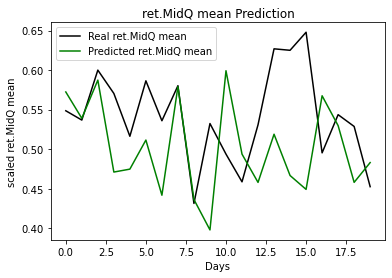

In [195]:
plt.plot(ym_test, color = 'black', label = 'Real ret.MidQ mean')
plt.plot(resmeanm, color = 'green', label = 'Predicted ret.MidQ mean')
plt.title('ret.MidQ mean Prediction')
plt.xlabel('Days')
plt.ylabel('scaled ret.MidQ mean')
plt.legend()
plt.show()

In [210]:
diff_res = np.subtract(ym_test, resmeanm)
sq_res = np.square(diff_res)
mse_res = sq_res.mean()

print(mse_res)

0.007507198360250868


In [203]:
output = pd.DataFrame({'predictionssc': resmeanm[:, 0]})
data_test = pd.DataFrame({'realsc': ym_test[:, 0]})

In [206]:
output['predictions'] = sc2.inverse_transform(output['predictionssc'].values.reshape(-1,1))
data_test['real'] = sc2.inverse_transform(data_test['realsc'].values.reshape(-1,1))

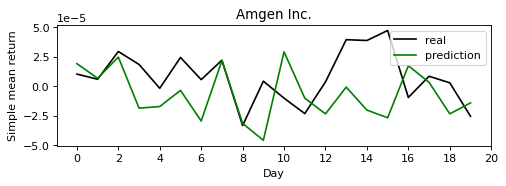

In [207]:
plt.figure(figsize=(7, 2), dpi=80)
plt.plot(data_test['real'], color='black', label='real')
plt.plot(output['predictions'], color='green', label='prediction')
plt.xticks(np.arange(0, 20+1, 2.0))
plt.title('Amgen Inc.')
plt.xlabel('Day')
plt.ylabel('Simple mean return')
plt.legend()
plt.show()

In [208]:
print(output)

    predictionssc   predictions
0        0.572289  1.904917e-05
1        0.538952  6.629989e-06
2        0.587268  2.462927e-05
3        0.471002 -1.868405e-05
4        0.474696 -1.730799e-05
5        0.511467 -3.609425e-06
6        0.441702 -2.959941e-05
7        0.579082  2.157968e-05
8        0.436291 -3.161550e-05
9        0.397836 -4.594145e-05
10       0.599135  2.905035e-05
11       0.493684 -1.023434e-05
12       0.457924 -2.355637e-05
13       0.518841 -8.622683e-07
14       0.466628 -2.031375e-05
15       0.449071 -2.685433e-05
16       0.567475  1.725573e-05
17       0.529714  3.188436e-06
18       0.457987 -2.353291e-05
19       0.482982 -1.422121e-05


In [209]:
print(data_test)

      realsc      real
0   0.548499  0.000010
1   0.536742  0.000006
2   0.599902  0.000029
3   0.570401  0.000018
4   0.516246 -0.000002
5   0.586375  0.000024
6   0.535891  0.000005
7   0.580186  0.000022
8   0.431340 -0.000033
9   0.532355  0.000004
10  0.493705 -0.000010
11  0.458640 -0.000023
12  0.530763  0.000004
13  0.626834  0.000039
14  0.624975  0.000039
15  0.647796  0.000047
16  0.495288 -0.000010
17  0.543566  0.000008
18  0.528663  0.000003
19  0.452511 -0.000026


Saving the results and the model

In [ ]:
output.to_csv(r'C:\Users\nmart\Documents\Office\ZU\S8\Bachelor-Thesis\Nils_Test_Daten\Nils_Test_Daten\Finales\CNN2_res_AMGN.csv', index = False)

In [ ]:
model.save('models/CNN2_AMGN')